# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 10000

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, '

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138821.00 170000.00 150000.00 0.00 109323.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9122.893943086003
H_agent r out =  109323.34764426686
**********
Q ADDED INTO POOL: 1258 to existing amount 21079.866747885037
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9122.893943086003 from reserve 89323.34764426688
**********
q_sold =  882
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137563.00 170000.00 150000.00 0.00 100200.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5338.555582080552
H_agent r out =  100

 q_sold =  1232
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134670.00 170000.00 150000.00 0.00 84413.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 
delta_Ri =  -7798.1874204398855
H_agent r out =  84413.0751975933
********** 8295.366920569924
H_agent r out =  131338.6884256603
**********
Q ADDED INTO POOL: 1066 to existing amount 21929.89690447219
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8295.366920569924 from reserve 91318.3115743397
**********
  -2650.7110077025245
H_agent r out =  162084.44688810268
**********
Q ADDED INTO POOL: -620 to existing amount 32457.031674061836
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount -2650.7110077025245 from reserve 63864.553111897316
**********
q_sold =  510
1232Q ADDED INTO POOL: 1817 to existing amount 29260.925048703266
**********
H_chosen_agent q_sold = q_sold =    m  r_i_out    r_i_in         h      

  Q ADDED INTO POOL: 1315 to existing amount 33461.3445613114q_sold = 705 990
H_chosen_agent q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4561.473584366932 from reserve 59718.879468468134
**********

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 135622.00 170000.00 150000.00 0.00 146747.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1059
H_chosen_agent
  H_chosen_agent q_sold =  1407
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 131405.00 170000.00 150000.00 0.00 75577.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2289.4709610541104
H_agent r out =  75577.10877079092
**********
Q ADDED INTO POOL: 705 to existing amount 34238.07245881977
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2289.4709610541104 from reserve 57809.108770790925
**********
   m  r_i_out   

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 129611.00 170000.00 150000.00 0.00 66734.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold = 
 1117
 q_sold =  H_chosen_agentdelta_Ri = 1123
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 129359.00 170000.00 150000.00 0.00 69385.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 129339.00 170000.00 150000.00 0.00 62569.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -891.564572045052
H_agent r out =  62569.63679571638
**********
Q ADDED INTO POOL: 276 to existing amount 34321.05547511794
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 891.564572045052 from reserve 56281.63679571639
**********
 894
H_chosen_agent H_chose

**********q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2210.404632646588 from reserve 49157.81625991899
**********

 q_sold =  581
H_chosen_agentq_sold =  -61
q_sold = 1437  q_sold = 
2095
H_chosen_agent 4901.669294152784   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 124062.00 170000.00 150000.00 0.00 52183.17 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -4332.408046018083
H_agent r out =  52183.16721817468
**********
Q ADDED INTO POOL: 2095 to existing amount 38026.066715395806
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4332.408046018083 from reserve 46125.16721817471
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123254.00 170000.00 150000.00 0.00 52444.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = H_agent r out = q_sold =  738
H_chosen_agent 

59610.51188596738q_sold =  1776

q_sold =  1639

H_chosen_agent H_chosen_agent**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 125532.00 170000.00 150000.00 0.00 180809.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1590
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 124325.00 170000.00 150000.00 0.00 53335.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1878

q_sold =  1590
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 125031.00 170000.00 150000.00 0.00 50941.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -2225.8937107768056
H_agent r out =  53335.135088968214
********** Q ADDED INTO POOL: 203 to existing amount 38502.30899296057

 
delta_Ri =  1148.4115626327205
H_agent r out =  180809.4008441844


delta_Ri =  -2080.561522834028
H_agent r out =  47260.87707709566
**********
Q ADDED INTO POOL: 984 to existing amount 38112.168317981224
**********
**********q_sold =  q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116797.00 170000.00 150000.00 0.00 42273.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 q_sold =  471
delta_Ri =  969POOL RESERVE ONE REMOVING ASSET j in amount 2080.561522834028 from reserve 45822.87707709566
1478
H_chosen_agent
-1287.2398772109798 

H_agent r out =  42273.53472832773
**********
Q ADDED INTO POOL: 956 to existing amount 41472.06764061325
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1287.2398772109798 from reserve 37177.53472832776
**********
**********q_sold =  H_chosen_agent735 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 123110.00 170000.00 150000.00 0.00 186293.22   

     r_j_in       q_j  


 q_sold = 
delta_Ri = 98 delta_Ri =  
-673.7451856498099
H_agent r out =  39981.394906535876
**********
Q ADDED INTO POOL: 547 to existing amount 44857.93621790735
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 673.7451856498099 from reserve 34667.39490653589
**********
q_sold = 619q_sold =   q_sold = q_sold =  967

q_sold =  395
5481337.3181971764768 q_sold =  967
H_chosen_agent  1320
170
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111345.00 170000.00 150000.00 0.00 35165.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -228.2190508142584
H_agent r out =  35165.13796215072
**********
Q ADDED INTO POOL: 170 to existing amount 41892.9444560994
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 228.2190508142584 from reserve 36593.13796215075
**********
q_sold =  1320
q_sold =  675
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_

0 180000.00 160000.00  q_sold =  1839-1087.060938293381
H_agent r out =  33336.47788048494
**********
Q ADDED INTO POOL: 795 to existing amount 41339.126803224295
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1087.060938293381 from reserve 37354.47788048497
**********
q_sold = q_sold =  -105

q_sold =  1164
H_chosen_agent q_sold =  891
q_sold =  1415
 825
H_chosen_agentdelta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 115847.00 170000.00 150000.00 0.00 31977.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  -105

 -524.405988356111
H_agent r out =  37388.846874554496
**********
Q ADDED INTO POOL: 496 to existing amount 47080.93621790735
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 524.405988356111 from reserve 32074.846874554514
**********
q_sold =  1386
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 11470

 q_sold =  1328
27475.306720325978q_sold = 614 438
111

q_sold = **********
Q ADDED INTO POOL: 1435 to existing amount 40776.548418944585
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2339.5205032971535 from reserve 40166.30672032597
**********
 
q_sold = 1328q_sold = H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 111786.00 170000.00 150000.00 0.00 32110.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00    
1055
111
H_chosen_agentdelta_Ri =  -898.7802290125277
 H_agent r out =  32110.484529794187
**********
Q ADDED INTO POOL: 614 to existing amount 42401.84462476233
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 898.7802290125277 from reserve 37664.484529794216
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 118203.00 170000.00 150000.00 0.00 45222.44 130000.00   

        q_j       s_j  
0 1800


q_sold = **********
Q ADDED INTO POOL: 445 to existing amount 45969.271656216064
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 499.6495419329557 from reserve 32775.97543181282
**********
**********q_sold =  1245
H_chosen_agent 
q_sold =  1357
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 108156.00 170000.00 150000.00 0.00 209944.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 116696.00 170000.00 150000.00 0.00 201593.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  389

H_chosen_agentdelta_Ri =  530.1887496321903
H_agent r out =  209944.50816609216
**********
Q ADDED INTO POOL: 436 to existing amount 45171.64762933433
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 530.1887496321903 from reserve 34610.491833907814
**********
q_sold = q_so

H_chosen_agent q_sold =  q_sold =  1154
q_sold =  1304
H_chosen_agent q_sold =  1154
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99697.00 170000.00 150000.00 0.00 20679.41 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 106415.00 170000.00 150000.00 0.00 25286.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1395.2081623047702
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 115566.00 170000.00 150000.00 0.00 38237.38 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3633.8605024412263
H_agent r out =  38237.37886103678
**********
Q ADDED INTO POOL: 1552 to existing amount 36911.143980889094
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3633.860502441


delta_Ri =  -350.5830808972755
H_agent r out =  18741.81925875382
**********
Q ADDED INTO POOL: 297 to existing amount 43630.800297499045
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 350.5830808972755 from reserve 34378.81925875386
**********
q_sold =  1247
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 110475.00 170000.00 150000.00 0.00 220347.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  695
H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 103053.00 170000.00 150000.00 0.00 215815.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = q_sold = delta_Ri =  626.8907486459174
H_agent r out =  215815.36785367853
**********
Q ADDED INTO POOL: 623 to existing amount 47877.155432904154
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 626.8907486459174 from reserve 31521.6

12151541
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95115.00 170000.00 150000.00 0.00 15156.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -2105.0543524415684
H_agent r out =  15156.602838083349
delta_Ri =  1753.499927112623
**********
Q ADDED INTO POOL: 1541 to existing amount 40990.17396670329
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2105.0543524415684 from reserve 37841.60283808338
**********

q_sold =  460
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 97601.00 170000.00 150000.00 0.00 19952.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1030.107512614098
H_agent r out =  19952.81929507597
**********
Q ADDED INTO POOL: 877 to existing amount 45166.73189890372
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1030.107512614098 from reserve 3

 q_sold =  860
q_sold =  328
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 95625.00 170000.00 150000.00 0.00 17528.66 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -391.12761842329866
H_agent r out =  17528.660488583148
**********
Q ADDED INTO POOL: 328 to existing amount 45106.34246304737
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 391.12761842329866 from reserve 33687.66048858316
**********
q_sold =  -766.6888024708638
H_agent r out =  7569.277960564071
**********
Q ADDED INTO POOL: 790 to existing amount 47870.33801964942
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 766.6888024708638 from reserve 30398.277960564054
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 106130.00 170000.00 150000.00 0.00 217188.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 

0 180000.00 160000.00  -357.6467613759474 q_sold =  1330
H_chosen_agent 
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 92800.00 170000.00 150000.00 0.00 14239.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -952.0925577771635
H_agent r out =  11366.060605915798
**********

 1168
H_chosen_agent Q ADDED INTO POOL: 584 to existing amount 30742.564532360262delta_Ri =  -1379.8088864029585
H_agent r out = delta_Ri =  -3046.220248279866
H_agent r out =  24941.185253981068
**********
Q ADDED INTO POOL: 1236 to existing amount 36513.58443561242
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3046.220248279866 from reserve 50706.18525398108
**********

1143q_sold = 
 311
2006 **********14239.065303360425
**********
Q ADDED INTO POOL: 1330 to existing amount 46781.860013131416
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1379.8088864029585 from reserve 31736.065303360432
*

0 180000.00 160000.00  delta_Ri = delta_Ri = 


delta_Ri =  -871.9473331478407
H_agent r out =  2251.0807776139986
********** q_sold = 154950.0 592

1511.3312783005201
H_agent r out =  223043.37864189476
**********
Q ADDED INTO POOL: 1534 to existing amount 47803.408070788595
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1511.3312783005201 from reserve 31530.621358105273
**********

 q_sold = H_chosen_agentPOOL REMOVE LIQUIDITY Timestep ===  90 delta W  9798.285930491576 delta S  4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.1992724196369461
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5739715476448349
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5739715476448349
 H_chosen_agentQ ADDED INTO POOL: 917 to existing amount 38226.27090983218    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 99767.00 170000.00 150000.00 0.00 17608.26 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1028.

q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 103921.00 170000.00 150000.00 0.00 13544.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = 
90
 
delta_Ri =  -1758.7504234431037
H_agent r out =  13544.4686000928
**********
Q ADDED INTO POOL: 968 to existing amount 31810.00986748642
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1758.7504234431037 from reserve 43237.46860009281
**********
 ********** **********-99
 
POOL RESERVE ONE REMOVING ASSET j in amount 2581.9751014499543 from reserve 40681.50449398669
**********

q_sold = q_sold = 1941  delta W 749

1221POOL RESERVE ONE REMOVING ASSET j in amount 737.7700440912756 from reserve 31771.194823825375q_sold = q_sold =  

H_chosen_agent 9977.826200429872 H_chosen_agent490  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00 

**********
POOL RESERVE ONE REMOVING ASSET j in amount 564.4291981882516 from reserve 24995.163273580973
**********
delta_Ri = **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 101079.00 170000.00 150000.00 0.00  8757.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00   -10479.176963531178
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1105 to existing amount 19694.626845557275
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 10479.176963531178 from reserve 102103.00000000001
**********

q_sold =  1321
delta_Ri =  -1454.6491308728785
H_agent r out =  8756.995284179664
**********
Q ADDED INTO POOL: 999 to existing amount 34513.470879337896
**********
**********

POOL RESERVE ONE REMOVING ASSET j in amount 1454.6491308728785 from reserve 38658.99528417968
**********
H_chosen_agentq_sold = Q ADDED INTO POOL: 660 to existing amount 40139.67977901121
**********
**********
POOL RESERVE ONE 

delta_Ri = q_sold =  1639.8785795146312
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 166 to existing amount 21000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1639.8785795146312 from reserve 100000.00000000001
**********

q_sold =  1787
H_chosen_agent  delta_Ri = 
q_sold =  3729.985257011053
H_agent r out =  155692.78606548515
**********
Q ADDED INTO POOL: 759 to existing amount 30978.562620914476
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3729.985257011053 from reserve 71098.2139345149
**********
 q_sold = 2681842H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9405.828422604902 from reserve 100000.00000000001
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132948.00 170000.00 150000.00 0.00 72534.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00

H_chosen_agent4636.2156562015625q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 131057.00 170000.00 150000.00 0.00 169569.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  q_sold = 
90676.06138526805
**********
Q ADDED INTO POOL: 819 to existing amount 27440.769326477483
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4840.967479963496 from reserve 78818.06138526807
**********
 
 1499
 222q_sold =  786

delta_Ri = 359 3639.7046426568777
H_agent r out =  169569.23760949937
**********
Q ADDED INTO POOL: 1039 to existing amount 33445.354992182576
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3639.7046426568777 from reserve 60111.76239050066
**********

H_chosen_agentH_chosen_agentPOOL ADD LIQUIDITY Timestep ===   10 delta W  4901.358318910783
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 89178.00 170

0 130000.00 180000.00 160000.00  delta_Ri =   474
3818.854730182371
 2045
H_chosen_agent6.96189412638468 
delta_Ri = q_sold = 
H_agent r out =  145455.53844765152
**********
Q ADDED INTO POOL: 1 to existing amount 26727.940965600705
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6.96189412638468 from reserve 83031.46155234848
**********
  -5110.931026198911
H_agent r out =  76447.60412194024
**********
Q ADDED INTO POOL: 1174 to existing amount 29408.071428272888
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5110.931026198911 from reserve 68071.60412194025
**********
q_sold = H_agent r out = H_chosen_agent689    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135798.00 170000.00 150000.00 0.00 89913.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 86739.00 170000.00 

  798.1786617009903
H_agent r out =  184389.56391438865
**********
Q ADDED INTO POOL: 387 to existing amount 38721.354992182576
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 798.1786617009903 from reserve 45291.436085611414
**********
q_sold =  1063

1688-4154.267195538246
delta_Ri =  770.3668447829164
H_agent r out =  237617.4317393283
**********
Q ADDED INTO POOL: 1227 to existing amount 45423.73630756388
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 770.3668447829164 from reserve 24973.568260671746
**********
q_sold = q_sold = H_chosen_agent
q_sold =    914
 H_chosen_agentH_agent r out =  67532.1930286571
**********
Q ADDED INTO POOL: 1211 to existing amount 31280.393796368688
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4154.267195538246 from reserve 60265.19302865713
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122109.00 170000.00 150000.00 0.00 43555.00   



 H_chosen_agent********** 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119989.00 170000.00 150000.00 0.00 40513.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -795.4817642509908
H_agent r out =  40513.61486723259
**********
Q ADDED INTO POOL: 624 to existing amount 41983.272803453765
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 795.4817642509908 from reserve 35178.61486723259
**********
q_sold = q_sold = Q ADDED INTO POOL: 1298 to existing amount 32741.593597812032q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 131502.00 170000.00 150000.00 0.00 169075.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1090
 ********** H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3752.927180215975 from reserve 55303.82422016204
**********

  delta_Ri =  3326.874637538424
H_a

H_chosen_agentQ ADDED INTO POOL: 204 to existing amount 34411.412975349645delta_Ri =   -4173.261095359968
H_agent r out =  101295.12356369953
**********
Q ADDED INTO POOL: 641 to existing amount 21988.171692502696
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4173.261095359968 from reserve 82516.12356369954
**********
q_sold = q_sold =  664
q_sold =  654
H_chosen_agent q_sold =  1140
H_chosen_agent 299
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 657.468763202217 from reserve 56404.47859082764
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126882.00 170000.00 150000.00 0.00 53386.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -983.3132794565814
H_agent r out =  53386.97096731287
**********
Q ADDED INTO POOL: 379 to existing amount 34174.484937899295
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 983.3132794565814 from reserve 5

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 126672.00 170000.00 150000.00 0.00 185248.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2155.7539418203664
H_agent r out =  185248.1021005999
**********
Q ADDED INTO POOL: 842 to existing amount 36265.45754687731
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2155.7539418203664 from reserve 50815.897899400145
**********
q_sold =  924
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135293.00 170000.00 150000.00 0.00 86696.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 116335.00 170000.00 150000.00 0.00 200905.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1479
    m  r_i_out    r_i_in         h       q_i     

 delta_Ri =   q_sold = -2536.5979705617674 468
202525.29013962083-1292.9293317351285
**********
Q ADDED INTO POOL: 666 to existing amount 40803.17731134666
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1126.285381108 from reserve 41038.70986037922
**********
H_chosen_agent

H_agent r out =  35722.042064126304
**********
Q ADDED INTO POOL: 988 to existing amount 41826.21561782026
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1292.9293317351285 from reserve 36640.04206412633
**********
q_sold =  1265
q_sold =  907
H_agent r out = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107751.00 170000.00 150000.00 0.00 27364.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =  1029
q_sold =  44313.03740053808
**********
Q ADDED INTO POOL: 1238 to existing amount 38316.90282329076
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2536.5979

q_sold = q_sold = 
 
 delta_Ri =  578.198843511548
H_agent r out = delta_Ri = q_sold =  727
  q_sold =  1196
H_chosen_agent1271194706.48435034475
**********
Q ADDED INTO POOL: 258 to existing amount 37807.48203693154
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 578.198843511548 from reserve 46936.51564965532
**********
q_sold =  1092
712-505.577890913304


q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130005.00 170000.00 150000.00 0.00 63802.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1092
H_chosen_agent H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 111823.00 170000.00 150000.00 0.00 207821.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1708.608964956575
H_agent r out =  207821.2153835031
**********
Q ADDED INTO POOL: 1196 to existing amount 42680.75965657145
**********

0 130000.00 180000.00 160000.00  delta_Ri =  q_sold = H_chosen_agent 1372
-955.2514474806293 

H_agent r out =  25163.84503341808
**********
Q ADDED INTO POOL: 896 to existing amount 44253.958815548416
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 955.2514474806293 from reserve 32037.84503341808
**********
 **********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114753.00 170000.00 150000.00 0.00 38575.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1651
538.6992124226623q_sold =  1781

delta_Ri = 
q_sold =  2681.589271256224
H_agent r out =  199483.62298768837
**********
Q ADDED INTO POOL: 1339 to existing amount 38578.62262641222
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2681.589271256224 from reserve 45185.37701231168
**********
 1230
H_agent r out = q_sold = delta_Ri =  624
 199469.229137229
**********
Q ADDED INTO POOL: 194 to existing amount 33435.77

H_chosen_agent 1155H_chosen_agentq_sold =    219040.717047280921121
 1283
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111978.00 170000.00 150000.00 0.00 35212.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
120
delta_Ri =  -831.136345853849
H_agent r out =  35212.25943956509
**********
Q ADDED INTO POOL: 736 to existing amount 44045.893857612486
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 831.136345853849 from reserve 33854.259439565096
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 114054.00 170000.00 150000.00 0.00 210923.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 352 to existing amount 45311.24986478496
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 422.59925424656365 from reserve 34256.28295271916
**********


H_chosen_agentH_chosen_agentdelt

0 180000.00 160000.00  H_chosen_agentdelta_Ri =    1632-3671.5304174113658
H_agent r out = 

q_sold =  725
delta_Ri =  -3082.668576801273
H_agent r out =  25639.657899028916
**********
Q ADDED INTO POOL: 1864 to existing amount 40414.90757385179
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3082.668576801273 from reserve 40607.65789902894
**********
delta_Ri = q_sold =  2280
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120145.00 170000.00 150000.00 0.00 212473.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 108910.00 170000.00 150000.00 0.00 217634.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1212.3034030435147
H_agent r out =  217634.5517079046
**********
Q ADDED INTO POOL: 1113 to existing amount 46376.33702192299
***

0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115169.00 170000.00 150000.00 0.00 220877.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  668.5165950249435
H_agent r out =  220877.01833541237
**********
Q ADDED INTO POOL: 488 to existing amount 41158.60986416861
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 668.5165950249435 from reserve 36654.98166458762
**********
delta_Ri =  -1234.0905263867978
H_agent r out =  17972.96903296629
**********
Q ADDED INTO POOL: 1316 to existing amount 46640.3318349295
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1234.0905263867978 from reserve 31107.96903296632
**********
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95581.00 170000.00 150000.00 0.00 15250.26 130000.00   

        q_j       s_j  
0 180000.00 160000.00     

0 180000.00 160000.00  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121426.00 170000.00 150000.00 0.00 37637.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = delta_Ri =  1151
950

delta_Ri =  -4271.629486953931
H_agent r out =  
 q_sold = H_chosen_agentq_sold = delta_Ri =  -1342.240531786765
H_agent r out =  13358.381669829727
**********
Q ADDED INTO POOL: 1384 to existing amount 45371.130525865476
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1342.240531786765 from reserve 30547.38166982973
**********
q_sold = 587
H_chosen_agent    950
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 106137.00 170000.00 150000.00 0.00 220760.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104725

493q_sold = q_sold =  
15751215
q_sold = 
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93922.00 170000.00 150000.00 0.00 12586.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold =  
1089
  1215
q_sold = H_chosen_agentdelta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 105177.00 170000.00 150000.00 0.00 221973.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  493
817
155024.0
 Q ADDED INTO POOL: 1234 to existing amount 50644.711312935855q_sold = delta_Ri =  1524.0709878255643
H_agent r out =  221973.33782255877
**********
Q ADDED INTO POOL: 1215 to existing amount 44278.62425511372
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1524.0709878255643 from reserve 35371.662177441256
**********
q_sold = 
H_chosen_agent q_sold =   817
1089
1031

H_chosen_agent    m   r_i_out    r_i_in     

H_chosen_agent   **********
 
2597962   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 102064.00 170000.00 150000.00 0.00 10096.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 102156.00 170000.00 150000.00 0.00 225531.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri = 713.0599634983021

delta_Ri =  -820.611077553445
H_agent r out =  10096.954639083717

 240.12150432608593
**********q_sold = 
Q ADDED INTO POOL: 855 to existing amount 48043.88409182854
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 820.611077553445 from reserve 30270.95463908373
**********
q_sold =  1057
 q_sold = H_agent r out =  225531.56698512897
**********
Q ADDED INTO POOL: 219 to existing amount 46592.07743808642
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 240.12

H_chosen_agent q_sold =  1290q_sold =  1163
H_chosen_agent 
907   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 89783.00 170000.00 150000.00 0.00 235082.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  2050.0012981940204
H_agent r out =  235082.93840779777
**********
Q ADDED INTO POOL: 2295 to existing amount 40116.27726231716
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2050.0012981940204 from reserve 30249.061592202313
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 87113.00 170000.00 150000.00 0.00  7856.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1098

H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114067.00 170000.00 150000.00 0.00 22940.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 


0 180000.00 160000.00  q_sold =  -1110.8411580830639
H_agent r out =  19280.568415387315
**********
Q ADDED INTO POOL: 1609 to existing amount 51854.30738647632
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1110.8411580830639 from reserve 26733.568415387323
**********
q_sold =  
 
q_sold =  1101
delta_Ri =  -1393.2340583240875
H_agent r out =  5455.752443148437
**********
Q ADDED INTO POOL: 1500 to existing amount 48279.536831472986
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1393.2340583240875 from reserve 29912.752443148453
**********
768 1163  
POOL RESERVE ONE REMOVING ASSET j in amount 2069.1495897654722 from reserve 38305.7383729001H_chosen_agent

**********
q_sold = q_sold =  1142
q_sold =  768
H_chosen_agent 411  1761H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 85829.00 170000.00 150000.00 0.00 238548.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.0

q_sold = q_sold =   delta_Ri =  -1016.8036790164277955

H_agent r out =  16575.547214938037
**********
Q ADDED INTO POOL: 1554 to existing amount 52916.73117757597
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1016.8036790164277 from reserve 25998.547214938044
**********
14247331166**********
q_sold = 

 783

q_sold = 
Q ADDED INTO POOL: 934 to existing amount 38584.96669983769
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1571.3540006232179 from reserve 41527.472287959536
**********
q_sold = q_sold =  733
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 95363.00 170000.00 150000.00 0.00 232118.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =  1096q_sold =  955

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106770.00 170000.00 150000.00 0.00 231639.27   

     r_j_in       q_j

q_sold =  1095
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108112.00 170000.00 150000.00 0.00 12943.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  1488
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137547.00 170000.00 150000.00 0.00 140293.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  10681.664590190285
H_agent r out =  140293.6037362918
**********
Q ADDED INTO POOL: 1856 to existing amount 22323.802654047122
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 10681.664590190285 from reserve 79898.39626370821
**********
q_sold =  
 delta_Ri =  -659.4234986832537
H_agent r out = q_sold =  1501
q_sold =  1251
 12943.660338650683
**********
Q ADDED INTO POOL: 467 to existing amount 41018.35426673549
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 659.4234986832537 fro

 q_sold = 99-5443.854498215167q_sold = q_sold =  602
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 100214.00 170000.00 150000.00 0.00 240309.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1040.1593301871828
H_agent r out =  240309.50561576124
**********
Q ADDED INTO POOL: 1011 to existing amount 36622.907228749566
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1040.1593301871828 from reserve 31906.494384238733
********** 646
H_chosen_agent
q_sold =  970
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 87024.00 170000.00 150000.00 0.00 -2685.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00   99
H_chosen_agent 
delta_Ri =  -489.8448066746795
H_agent r out =  -2685.2088144838044
**********
Q ADDED INTO POOL: 602 to existing amount 40195.61361412355
**********
208
q_sold =  1134

q_sold =  1134
H_

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137093.00 170000.00 150000.00 0.00 95806.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5802.443922342409
H_agent r out =  95806.52902186559
**********
Q ADDED INTO POOL: 984 to existing amount 22454.191643509374
**********
**********
 -1549.5619699374204
H_agent r out =  63947.64294396346
**********
1047   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130865.00 170000.00 150000.00 0.00 170792.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3333.2277744034272
H_agent r out =  170792.975193136
**********
Q ADDED INTO POOL: 1080 to existing amount 32215.889834381775
**********
**********
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 3333.2277744034272 from reserve 56324.02480686404   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out  

q_sold =  596

 
 1213
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 137898.00 170000.00 150000.00 0.00 130119.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9504.960006329202
H_agent r out =  130119.15696179062
**********
Q ADDED INTO POOL: 1213 to existing amount 21835.62370525543
**********
**********
H_agent r out =  179388.98978327573
**********
Q ADDED INTO POOL: 1656 to existing amount 34718.214222896706
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3832.5008858238766 from reserve 49125.01021672431
**********
1141
q_sold = H_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 9504.960006329202 from reserve 92082.8430382094 764
H_chosen_agent  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135234.00 170000.00 150000.00 0.00 85317.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1

857**********H_chosen_agentq_sold =  1551
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 121380.00 170000.00 150000.00 0.00 49212.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
**********
 
delta_Ri =  -2344.424767973038
H_agent r out =  49212.6025339904
**********
Q ADDED INTO POOL: 1551 to existing amount 41870.16119364842
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2344.424767973038 from reserve 39013.6025339904
**********

Q ADDED INTO POOL: 916 to existing amount 31792.78477950543
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3005.129653584387 from reserve 58458.302622984935
**********
addliq - Sq delta Sq q_sold = H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96565.00 170000.00 150000.00 0.00 -1315.33 130000.00   

        q_j       s_j  
0 180000.00 160000.00   3690.925768814

0 130000.00 180000.00 160000.00  q_sold =  
delta_Ri =  -3705.6719475369778
H_agent r out =  1045     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121534.00 170000.00 150000.00 0.00 192006.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118760.00 170000.00 150000.00 0.00 44049.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  2059.7727064167925
H_agent r out =  192006.67801438345
**********
Q ADDED INTO POOL: 1143 to existing amount 37598.94380850794
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2059.7727064167925 from reserve 42741.32198561662
**********

1278q_sold =  
H_chosen_agent 70570.41810734499 q_sold =  1567
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 136284.00 170000.00 150

H_agent r out = H_chosen_agentH_chosen_agent q_sold = q_sold =  delta_Ri =    162118.89392602144663
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135947.00 170000.00 150000.00 0.00 89271.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4911.633744459444
H_agent r out =  89271.10064579001
**********
Q ADDED INTO POOL: 987 to existing amount 23672.46559014863
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4911.633744459444 from reserve 71725.10064579002
**********
q_sold = 
  q_sold =  54
H_chosen_agent  847
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 130762.00 170000.00 150000.00 0.00 69663.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1204.2169463741866q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129874.00 170000.00 150000.00 0.00 68112.67  

q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128279.00 170000.00 150000.00 0.00 63886.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4190.468854534677
H_agent r out =  63886.7533166096
**********
Q ADDED INTO POOL: 1620 to existing amount 33661.25072005061
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4190.468854534677 from reserve 52660.753316609604
**********
 q_sold = 1239
  q_sold = 1105
H_chosen_agent   H_chosen_agent1253q_sold =  746 988116



H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119025.00 170000.00 150000.00 0.00 196560.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1531   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111402.00 170000.00 150000.00 0.00 34382.05   

     r_j_in      

H_chosen_agent 
 
delta_Ri =  -672.7848405867318
H_agent r out =  176083.36875914352
**********
Q ADDED INTO POOL: -219 to existing amount 35041.8494082238
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount -672.7848405867318 from reserve 54721.63124085644
**********
1196   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115720.00 170000.00 150000.00 0.00 201556.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = H_chosen_agentdelta_Ri =  q_sold =  -2109.8228338066388
H_agent r out =  57459.12244100972
**********
Q ADDED INTO POOL: 949 to existing amount 35489.05726458926
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2109.8228338066388 from reserve 47974.12244100973
**********
  
 1045
H_chosen_agentdelta_Ri = 933 1848.16288076963
H_agent r out =  201556.11106302173
**********
Q ADDED INTO POOL: 1464 to existing amount 41958.95044501848
**********
**********
POOL RESERVE ON


delta_Ri = q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 2653.0044531817243 from reserve 46024.685492018354  836
 1320
H_chosen_agent  H_chosen_agent
728
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123997.00 170000.00 150000.00 0.00 53788.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 124046.00 170000.00 150000.00 0.00 53122.72 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1412.5952560575877
H_agent r out =  53122.718651697825
**********
Q ADDED INTO POOL: 728 to existing amount 39198.229757963905
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1412.5952560575877 from reserve 43843.71865169784
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 10

delta_Ri = q_sold = H_chosen_agent  1083
 q_sold = q_sold =  1122
-3181.9648467376574 q_sold = delta_Ri = q_sold = q_sold = 381 1122

 1026

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117543.00 170000.00 150000.00 0.00 37309.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -405.33066565820906
H_agent r out =  37309.059221830605
**********
Q ADDED INTO POOL: 267 to existing amount 40207.89632645278
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 405.33066565820906 from reserve 38963.05922183062
**********
 1087
H_agent r out = H_chosen_agentH_chosen_agentH_chosen_agentq_sold =      q_sold = 889
-1540.411636494682
H_agent r out =  46261.78592583846
**********
Q ADDED INTO POOL: 1051 to existing amount 40306.738196427046
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1540.411636494682 from reserve 38885.78592583847
**********
   m  r_i_out    r_i_in         h   

 delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET j in amount 1909.3623760695384 from reserve 33484.60644404395
**********
q_sold = q_sold = q_sold = q_sold =  197 
q_sold =  1093
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106998.00 170000.00 150000.00 0.00 211813.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8221004
  
2012
q_sold =  197
 1181.7605365871918905q_sold = 
q_sold =  2012
H_chosen_agent 
 q_sold = H_agent r out =  211813.20160303757
**********
Q ADDED INTO POOL: 1093 to existing amount 44289.03408566221
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1181.7605365871918 from reserve 32867.79839696256
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116636.00 170000.00 150000.00 0.00 42019.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1221.9539532586466 
H_

0 180000.00 160000.00  q_sold =  774
q_sold = H_chosen_agent
      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112554.00 170000.00 150000.00 0.00 30343.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  375   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123564.00 170000.00 150000.00 0.00 50335.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  765

q_sold = 1000delta_Ri = 
delta_Ri =  -1019.0074228166634
H_agent r out =  50335.90229103474
**********
Q ADDED INTO POOL: 522 to existing amount 36932.85867121409 782

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1019.0074228166634 from reserve 43865.90229103474
**********
H_chosen_agent q_sold = 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99982.00 170000.00 150000.00 0.00 21709.40 130000.00   

        q_j       s_

q_sold =  
**********
335delta_Ri = 
 q_sold =  335
 462.60859419534546
H_agent r out =  217327.0401618352
**********
Q ADDED INTO POOL: 524 to existing amount 47685.52711576107
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 462.60859419534546 from reserve 29421.959838164945
**********
q_sold = q_sold = H_chosen_agentq_sold =  1444
  1461   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 105881.00 170000.00 150000.00 0.00 26622.03 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 906 1182

delta_Ri =  -433.2594026941292
H_agent r out =  26622.03099913226
**********
Q ADDED INTO POOL: 335 to existing amount 44099.082905493575
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 433.2594026941292 from reserve 35239.03099913226 q_sold = 

374H_chosen_agent 
-302
H_chosen_agentq_sold =  H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000

0 130000.00 180000.00 160000.00  H_chosen_agent426 
 delta_Ri =  -190.6270337377475
H_agent r out =  510   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 115382.00 170000.00 150000.00 0.00 206615.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
41425.847254669614

**********
Q ADDED INTO POOL: 138 to existing amount 41205.65205944686
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 190.6270337377475 from reserve 36598.847254669614
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107818.00 170000.00 150000.00 0.00 33037.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1598

q_sold =  702
delta_Ri = q_sold = q_sold =  1392
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 104327.00 170000.00 150000.00 0.00 24682.27 130000.00   

  

q_sold = 1420q_sold =  
692 H_chosen_agent 721

q_sold =   751.8856579490172
H_agent r out =  q_sold = 1390219851.9788672916H_chosen_agent  q_sold =  1838

q_sold = q_sold =  1335
q_sold =  721
 998
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116867.00 170000.00 150000.00 0.00 38947.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2006.406206632641
H_agent r out =  38947.47468627834
**********
Q ADDED INTO POOL: 1420 to existing amount 40459.18708708978
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2006.406206632641 from reserve 37580.47468627834
**********
H_chosen_agent 
**********
Q ADDED INTO POOL: 840 to existing amount 47311.145124711074
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 751.8856579490172 from reserve 29734.02113270852
**********
q_sold =  455
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \


q_sold = 154950.0 318
 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101455.00 170000.00 150000.00 0.00 13892.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  486q_sold = 
 1205
H_chosen_agent q_sold = 1131

 1121072q_sold = 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103363.00 170000.00 150000.00 0.00 29018.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 
H_chosen_agentq_sold = 486
 -480.94120807737585
H_agent r out = H_chosen_agent  239
 q_sold =  q_sold =  816
H_chosen_agent13892.589021603255   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 100191.00 170000.00 150000.00 0.00 19842.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -755.4776105171354
H_agent r out =  19842.434197814582
**********
Q ADDED INTO PO


delta_Ri = q_sold = q_sold =  536
q_sold =  1446
q_sold =  1446
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 105027.00 170000.00 150000.00 0.00 29501.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00   H_chosen_agent 
delta_Ri = -1008.0644143226924q_sold = q_sold = 538 
H_agent r out =  27763.372019540093
**********
Q ADDED INTO POOL: 1172 to existing amount 48170.491720712285 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1008.0644143226924 from reserve 29730.3720195401
**********
155024.0
POOL REMOVE LIQUIDITY Timestep ===  90 536
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99886.00 170000.00 150000.00 0.00 11561.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -780.3989482717947
H_agent r out =  11561.098601122427
-364.40307932683095
H_agent r out =  29501.242028750006
**********
Q ADDED

13132.13106784173 q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 102316.00 170000.00 150000.00 0.00 26498.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

**********
Q ADDED INTO POOL: 1287 to existing amount 35087.249141631
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1639.2265737528287 from reserve 35218.131067841736
**********
delta_Ri =  -1011.7143550243334
H_agent r out =  26498.4955639892
**********
Q ADDED INTO POOL: 816 to existing amount 44492.95532876882
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1011.7143550243334 from reserve 34662.49556398921
**********
  q_sold =  1345
q_sold = delta_Ri = 197
 1691
H_chosen_agentq_sold = 1113
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 88119.00 170000.00 150000.00 0.00 228783.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_a

q_sold = q_sold =  2182
 608
H_chosen_agent 1537
H_chosen_agent H_chosen_agent  H_chosen_agent q_sold =  q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 105626.00 170000.00 150000.00 0.00 221980.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1016.4086767234666
H_agent r out =  221980.32755928257
**********
Q ADDED INTO POOL: 896 to existing amount 45904.58126396436
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1016.4086767234666 from reserve 33545.67244071737
**********
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 99266.00 170000.00 150000.00 0.00 22994.30 130000.00   

        q_j       s_j  

q_sold =  694q_sold =  458
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136848.00 170000.00 150000.00 0.00 94731.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 134302.00 170000.00 150000.00 0.00 87434.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agentH_chosen_agent
delta_Ri =  -2611.9725279657127
H_agent r out =  94731.25825811159
**********
Q ADDED INTO POOL: 458 to existing amount 22928.58911488789
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2611.9725279657127 from reserve 75981.2582581116
**********

**********q_sold = 
**********  2475
H_chosen_agent q_sold = 
delta_Ri =  339
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

 

**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 131579.00 170000.00 150000.00 0.00 75466.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  -3647.796475696158
H_agent r out =  90304.44293582755
**********
892
Q ADDED INTO POOL: 646 to existing amount 27835.271703930397
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3647.796475696158 from reserve 75859.44293582757
**********

q_sold =  1511

delta_Ri =  POOL RESERVE ONE REMOVING ASSET j in amount 560.5755461722708 from reserve 25938.44928395924-3589.571019458254
H_chosen_agent 
H_agent r out =  75466.58416193977
**********
Q ADDED INTO POOL: 1028 to existing amount 33450.81822836341
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3589.571019458254 from reserve 60374.58416193977
**********
q_sold = q_sold =  61
 q_sold =  718
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \

-3780.9595110526507
H_agent r out =  64671.77367976927
**********
Q ADDED INTO POOL: 1449 to existing amount 35874.32414131355
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3780.9595110526507 from reserve 52498.77367976926
**********
q_sold =  1706
delta_Ri =  1660.4682992019737
H_agent r out =  230296.88129868
**********
Q ADDED INTO POOL: 1300 to existing amount 34692.86296486479
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1660.4682992019737 from reserve 35842.11870131996
**********
 q_sold = 5675.043313561886
H_agent r out =  155813.15110294407
**********
Q ADDED INTO POOL: 1326 to existing amount 31797.723717477158
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5675.043313561886 from reserve 67243.84889705594
**********
q_sold = q_sold =  1042
17699.873737786962delta_Ri =  -4257.268359000688
H_agent r out =  94039.87116322966
**********
Q ADDED INTO POOL: 633 to existing amount 26747.718980685375
**********
**********
POO

  q_sold = q_sold = q_sold =  672
H_chosen_agent -5015.681357510962   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129575.00 170000.00 150000.00 0.00 61755.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   553

1760
delta_Ri =  -2308.411923427564
H_agent r out =  61755.980805828585
**********

q_sold = H_agent r out = q_sold = Q ADDED INTO POOL: 672 to existing amount 31429.59409796528 q_sold =  1232
526
q_sold = **********   1232
H_chosen_agent 553

73193.23736351858H_chosen_agentH_chosen_agent 
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 123094.00 170000.00 150000.00 0.00 53541.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold =  1425
413
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97335.00 170000.00 150000.00 0.00 11616.35 130000.00   

        q_j       s_

q_sold =  q_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 92379.00 170000.00 150000.00 0.00  6194.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 1843 1282
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136826.00 170000.00 150000.00 0.00 94775.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   629
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125079.00 170000.00 150000.00 0.00 47319.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri = delta_Ri =  -10226.016623564392
H_agent r out =  94775.81889361537
**********
Q ADDED INTO POOL: 1978 to existing amount 23074.62045282343
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 10226.016623564392 from reserve 74775.81889361539
**********
1671
q_sold =  561

 1228


Q ADDED INTO POOL: 775 to existing amount 27637.62045282343
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2334.2699393223675 from reserve 54970.658296714326
**********
q_sold = **********
10552.606801288612 q_sold = q_sold = 984
q_sold =  1411
 685
H_chosen_agentH_chosen_agentq_sold =    1127
H_chosen_agent H_chosen_agentq_sold = 
 902
H_agent r out =  141159.70590356988
**********
Q ADDED INTO POOL: 1787 to existing amount 22190.50469727095
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 10552.606801288612 from reserve 80857.29409643012
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 121520.00 170000.00 150000.00 0.00 190951.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   742
 
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132053.00 170000.00 150000.00 0.00 73661.10   

     r_j_in       q_j 

4029.1723154398096576Q ADDED INTO POOL: 757 to existing amount 38845.22576026284
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1514.2587996321736 from reserve 44755.04629458725
**********

**********
q_sold =  108
 q_sold = 
1287H_chosen_agent  q_sold = q_sold =  1175
 821

2347
q_sold =  1175
H_chosen_agentaddliq - Sq delta S 4029.172315439809
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.358318910783

 q_sold =  q_sold = q_sold =  498
953 1287
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120401.00 170000.00 150000.00 0.00 37171.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130746.00 170000.00 150000.00 0.00 70581.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_

  149 1476-1956.9027133741897q_sold = 
 1624
q_sold = 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120256.00 170000.00 150000.00 0.00 36906.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116400.00 170000.00 150000.00 0.00 33027.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

538

q_sold = H_agent r out = H_chosen_agentH_chosen_agentdelta_Ri =  -282.39518444013896
H_agent r out =  36906.90464658921
**********
Q ADDED INTO POOL: 149 to existing amount 37298.458594409414
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 282.39518444013896 from reserve 42820.904646589224
**********
 q_sold =   delta_Ri =  879
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 111832.00 170000.00 1

 q_sold =  449q_sold = 1242
-884.8188147765012delta_Ri = POOL RESERVE ONE REMOVING ASSET j in amount 4475.517285607347 from reserve 53990.545984340904q_sold = 
 
q_sold =  -2264.9068155456084
H_agent r out =  58636.04898681848
**********
Q ADDED INTO POOL: 1341 to existing amount 38318.290738267715
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2264.9068155456084 from reserve 41206.04898681852
**********
q_sold =  

 847
H_agent r out =  30934.55005576546
**********
Q ADDED INTO POOL: 726 to existing amount 42603.55101132376
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 884.8188147765012 from reserve 34471.550055765474
**********
H_chosen_agent**********
q_sold = 735q_sold = 1098 847
q_sold = H_chosen_agentH_chosen_agent
 
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122553.00 170000.00 150000.00 0.00 50922.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_agent r out =  55073.373938601595
**********
Q ADDED INTO POOL: 751 to existing amount 39884.002370851114
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1132.4581531612876 from reserve 38568.373938601624
**********
q_sold =  1108
 H_chosen_agentq_sold = 2964q_sold =  1144

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120123.00 170000.00 150000.00 0.00 47041.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =   1385
q_sold = H_chosen_agentq_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 114928.00 170000.00 150000.00 0.00 203584.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1956.708384485259
H_agent r out =  203584.46481937534
**********
Q ADDED INTO POOL: 1108 to existing amount 40090.063944195404
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1956.708384485259 from re

773  H_agent r out = 
5561435H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119354.00 170000.00 150000.00 0.00 49667.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


 
delta_Ri = H_chosen_agent delta_Ri =   -1992.6376599517664
H_agent r out =  26496.564644811337
**********
H_chosen_agent q_sold = 206891.32020542247q_sold = Q ADDED INTO POOL: 1790 to existing amount 43514.145873376845  1439
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124556.00 170000.00 150000.00 0.00 187792.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2620.789791780981
H_agent r out =  187792.2431575896
**********
Q ADDED INTO POOL: 1435 to existing amount 37347.07501494725
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2620.789791780981 from reserve 43284.75684241039
**********
-958.898965058962   m   r_i_out    

 1136q_sold = 
H_chosen_agent 316
  q_sold = q_sold = -1597.1201508120032715
  H_chosen_agent
316    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115992.00 170000.00 150000.00 0.00 41019.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1015.1631761559433
H_agent r out =  41019.44640238144
**********
Q ADDED INTO POOL: 715 to existing amount 40874.55106618685
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1015.1631761559433 from reserve 38012.44640238144
**********
H_agent r out = 
1994 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120305.00 170000.00 150000.00 0.00 194646.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2036.4683760327644H_chosen_agent 23726.536671809845
H_agent r out =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 98

Q ADDED INTO POOL: 1279 to existing amount 42955.07967474389   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116175.00 170000.00 150000.00 0.00 45067.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  1601
 q_sold = q_sold =  1096
**********H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 96554.00 170000.00 150000.00 0.00 21241.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 806-494.4950775219912q_sold =  1096
  


H_agent r out =  36939.63189542357
**********
Q ADDED INTO POOL: 357 to existing amount 41374.91335213458
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 494.4950775219912 from reserve 37292.63189542357
**********
delta_Ri = 66
H_chosen_agent q_sold =  1225
 -2124.660444440586
H_agent r out =  45067.44645685631
**********
Q ADDED INTO POOL: 1520 to existing amount 40519.22327589968
*

H_chosen_agent Q ADDED INTO POOL: 509 to existing amount 41609.81467227242572q_sold =   178052.2921013827
**********
Q ADDED INTO POOL: 1599 to existing amount 35534.21589026899
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4321.239188901917 from reserve 53221.70789861735
**********
q_sold =  399
 -303.6534195560229    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99379.00 170000.00 150000.00 0.00 15582.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
803

q_sold = H_agent r out = **********

 
 q_sold = delta_Ri = 20082.743163883366
**********
Q ADDED INTO POOL: 315 to existing amount 48858.64394219604
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 303.6534195560229 from reserve 30956.743163883362
**********
  q_sold =  572
399q_sold =  736
-1563.3628669312268
H_agent r out =  15582.750587301296
**********
Q ADDED INTO POOL: 1868 to existing amount 47822.45971210124
********

10721610
q_sold =  972

 1155
H_chosen_agentq_sold = q_sold =  1072
q_sold =  1610
H_chosen_agent   q_sold = 569q_sold =  1292
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111445.00 170000.00 150000.00 0.00 38495.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1975.6708940128024
H_agent r out =  38495.98983262306
**********
Q ADDED INTO POOL: 1610 to existing amount 42193.5281336663
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1975.6708940128024 from reserve 34927.98983262309
**********
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 91199.00 170000.00 150000.00 0.00 16504.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  936
H_chosen_agent q_sold =  1521

1640   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109475.00 170000.00 150000.00 0.00 32041

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94886.00 170000.00 150000.00 0.00 11283.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 104909.00 170000.00 150000.00 0.00 211995.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentq_sold = 
delta_Ri =  -747.6735084947668
H_agent r out =  11283.505830233256
**********
delta_Ri =  838.1461866346049
H_agent r out =  -453
 
Q ADDED INTO POOL: 644 to existing amount 34310.70112322747
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 747.6735084947668 from reserve 33340.50583023326
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107449.00 170000.00 150000.00 0.00 33848.63   

     r_j_in       q_j       s_j  
0 130000.00 

H_chosen_agent 1447402   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106081.00 170000.00 150000.00 0.00 32413.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
q_sold =  q_sold = 
delta_Ri =  -567.741021108229
H_agent r out =  11845.673089394957
**********
Q ADDED INTO POOL: 267 to existing amount 27958.844235653025
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 567.741021108229 from reserve 45081.67308939496
**********
q_sold =  402
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 102368.00 170000.00 150000.00 0.00 214328.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1447
610q_sold = 
q_sold = q_sold =   delta_Ri = 


 1915
H_chosen_agent 1666
  796H_chosen_agent-1578.022663247548
H_agent r out =  32413.548263491877
**********
Q ADDED INTO POOL: 1490 to existing amount 44309.16584595841
*****

POOL RESERVE ONE REMOVING ASSET j in amount 745.2869581893555 from reserve 33964.25864328991 H_chosen_agentq_sold = 1320 1150

**********
H_chosen_agentq_sold =  H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101783.00 170000.00 150000.00 0.00 28202.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1403.1823702031113
644
H_agent r out =  28202.417625255584
**********
Q ADDED INTO POOL: 1184 to existing amount 42704.79059079735
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1403.1823702031113 from reserve 34002.417625255606
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 81160.00 170000.00 150000.00 0.00  8910.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1001.8642015495609
H_agent r out =  8910.153208978203
**********
Q ADDED INTO POOL: 1302 to existing amount 40899.5

208639.96674151762
1129

delta_Ri =  -2086.4918036228514
H_agent r out =  77002.255335419
**********
Q ADDED INTO POOL: 493 to existing amount 32143.605915464814
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2086.4918036228514 from reserve 65083.25533541901
**********

 delta_Ri = H_chosen_agent999
**********
Q ADDED INTO POOL: 1561 to existing amount 45509.596132483224
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1794.8236403882063 from reserve 34170.03325848238
**********
q_sold =   H_chosen_agent 1238
-298.4961880817178H_chosen_agentq_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 134780.00 170000.00 150000.00 0.00 155354.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_agent r out =  19579.60207171287
**********
Q ADDED INTO POOL: 226 to existing amount 41417.451312237965
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 298.

0 130000.00 180000.00 160000.00  
delta_Ri = delta_Ri = q_sold =  424
H_chosen_agent  950.4670155376317
H_agent r out =  225694.5454800203
**********
Q ADDED INTO POOL: 1215 to existing amount 49374.312159229004
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 950.4670155376317 from reserve 27854.45451997971
**********
q_sold =  -1245.0995387992662
H_agent r out =  17492.12202083861
**********
Q ADDED INTO POOL: 918 to existing amount 40809.58780237554
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1245.0995387992662 from reserve 36098.12202083864
**********
H_chosen_agent**********
delta_Ri =  -4104.8749200533
H_agent r out =  73715.70799780883
**********
Q ADDED INTO POOL: 1040 to existing amount 30189.43734501868
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4104.8749200533 from reserve 64372.70799780883
**********
q_sold = q_sold =  323
  
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 1

delta_Ri = 
**********
Q ADDED INTO POOL: 599 to existing amount 31879.817401660483
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1970.5061533848716 from reserve 57960.64905546576
**********
q_sold =  1745
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 105483.00 170000.00 150000.00 0.00 214502.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  308

q_sold =  308
 H_chosen_agent1221.014928896052
H_agent r out =  226762.60093351998
**********
Q ADDED INTO POOL: 1514 to existing amount 48708.10517626988
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1221.014928896052 from reserve 28382.399066480015
**********
q_sold = delta_Ri =  1246
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 133035.00 170000.00 150000.00 0.00 162352.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 123956.00 170000.00 150000.00 0.00 50112.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00   362
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 86603.00 170000.00 150000.00 0.00  9063.31 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1170.1430431765527
H_agent r out =  9063.307664034068
**********
Q ADDED INTO POOL: 1674 to existing amount 41497.27631025129
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1170.1430431765527 from reserve 27026.307664034066
**********
q_sold = 
 q_sold =  945
delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130718.00 170000.00 150000.00 0.00 170778.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =    m   r_i_out 

-2830.5811227304653q_sold = 
q_sold = H_agent r out = q_sold = 
 495
 delta_Ri =  968
q_sold = 9244.47138173974
**********H_chosen_agent 743
H_chosen_agent  
820
-2416.813868344357H_chosen_agentq_sold =  1766
q_sold = Q ADDED INTO POOL: 1848 to existing amount 29977.478446538724  1333

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128478.00 170000.00 150000.00 0.00 177597.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    

**********q_sold =  1766
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 122017.00 170000.00 150000.00 0.00 45682.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_agent r out = delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 99754.00 170000.00 150000.00 0.00 219647.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sol

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 125574.00 170000.00 150000.00 0.00 184409.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   518

delta_Ri =  708.7363953921711
H_agent r out =  231094.8715419967
**********
Q ADDED INTO POOL: 734 to existing amount 35341.478896110864
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 708.7363953921711 from reserve 30794.1284580033
**********

delta_Ri =  q_sold = q_sold = q_sold =  710
q_sold = q_sold =  475
 q_sold = 2514.0954002045246
H_agent r out =  184409.78837051717
**********
Q ADDED INTO POOL: 1238 to existing amount 36303.26697220467
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2514.0954002045246 from reserve 45673.21162948294
**********
414 H_chosen_agentq_sold = 
 1749
   2034
1929q_sold =  1749
H_chosen_agent 
518   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 11

**********
H_chosen_agentq_sold =  1117
 q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122407.00 170000.00 150000.00 0.00 190350.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127953.00 170000.00 150000.00 0.00 58748.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 117950.00 170000.00 150000.00 0.00 37131.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  1896.259309984856
H_agent r out =  190350.49464977812
**********
Q ADDED INTO POOL: 1062 to existing amount 37801.10431073334
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1896.259309984856 from reserve 42595.50535022198
**********
delta_Ri =  -6018.

  13031169q_sold = delta_Ri = 
  q_sold = q_sold =  514
-2383.9447025579807H_chosen_agent 887

H_chosen_agent 1574
H_chosen_agentH_chosen_agent q_sold = H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125754.00 170000.00 150000.00 0.00 50205.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118808.00 170000.00 150000.00 0.00 33331.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 113540.00 170000.00 150000.00 0.00 30348.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00  


 
delta_Ri = delta_Ri =   q_sold =  1574
H_chosen_agent  -2307.3443826051443
H_agent r out =  33331.16916799454
**********
Q ADDED INTO POOL: 1303 to existing amount 37788.6986904043
**********

0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri = q_sold = q_sold = H_chosen_agent  583
 2699.126775719194
H_agent r out =  199855.4266766765
  1024
**********
Q ADDED INTO POOL: 1949 to existing amount 40562.508315094536
**********

delta_Ri =  618.7184115115186
H_agent r out =  226960.60711599534
**********
Q ADDED INTO POOL: 508 to existing amount 44981.535390121455
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 618.7184115115186 from reserve 34504.39288400477
**********
 **********q_sold =  1383
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123724.00 170000.00 150000.00 0.00 44090.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 109632.00 170000.00 150000.00 0.00 25412.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -11.855175779456127
H

q_sold = q_sold =  588
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113057.00 170000.00 150000.00 0.00 204898.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  712.2367413790149
H_agent r out =  204898.4959867793
**********
Q ADDED INTO POOL: 588 to existing amount 42923.736905105
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 712.2367413790149 from reserve 34653.50401322078
**********
 1183
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 132799.00 170000.00 150000.00 0.00 164547.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent  2107
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111611.00 170000.00 150000.00 0.00 23089.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16

q_sold =   925
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 118448.00 170000.00 150000.00 0.00 46652.83 130000.00   

        q_j       s_j  
0 180000.00 160000.00   -6113.587225932847q_sold = 18819.151683343032
**********
Q ADDED INTO POOL: 1133 to existing amount 47758.44017819567
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 994.0641035825397 from reserve 29928.151683343025
**********

delta_Ri = 
 H_agent r out =  93044.867175334
**********
Q ADDED INTO POOL: 1090 to existing amount 29946.07280754488
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6113.587225932847 from reserve 77360.86717533402
**********
1529
H_chosen_agent q_sold = H_chosen_agent q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 90254.00 170000.00 150000.00 0.00 230035.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    

2545.3235926487255 1498
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105120.00 170000.00 150000.00 0.00 16900.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1141.4543448164866
H_agent r out =  16900.378087930614
**********
Q ADDED INTO POOL: 1498 to existing amount 50017.44017819567
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1141.4543448164866 from reserve 28009.378087930607
**********
**********
Q ADDED INTO POOL: 1507 to existing amount 31943.824630460484
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6225.572106198293 from reserve 66831.86783133479
**********

q_sold = H_chosen_agent 107
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114906.00 170000.00 150000.00 0.00 26310.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  212117.

  120000.0995
1139H_chosen_agent

 
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 99856.00 170000.00 150000.00 0.00 16573.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 131008.00 170000.00 150000.00 0.00 72003.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
**********q_sold = 
delta_Ri =  -3443.6923739419767
H_agent r out =  72003.63942714717
**********
Q ADDED INTO POOL: 995 to existing amount 33567.32246598075
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3443.6923739419767 from reserve 60149.63942714717
**********

 delta_Ri = H_chosen_agent513
 -1894.5423862720713
H_agent r out =  16573.56882981791
**********
Q ADDED INTO POOL: 2022 to existing amount 48153.90279348197
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1894.5423862720713 f

Q ADDED INTO POOL: 1294 to existing amount 33270.584507968751129q_sold = q_sold =  200
H_chosen_agent H_chosen_agent
q_sold =  493
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109584.00 170000.00 150000.00 0.00 19703.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4567.737526903862 from reserve 61211.94705320519
**********
q_sold =  1257

delta_Ri =  -513.4425400595484
H_agent r out =  19703.138542379584
**********
Q ADDED INTO POOL: 493 to existing amount 45352.08955599633
**********
**********
q_sold =  1018
q_sold =  1080
 392
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100139.00 170000.00 150000.00 0.00 12928.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -207.8378563755191
H_agent r out =  12928.62366768993
**********
Q ADDED INTO P

 H_chosen_agent q_sold = q_sold =  845
 646-1761.402933430502**********q_sold = 1190
POOL RESERVE ONE REMOVING ASSET j in amount 313.5406194294107 from reserve 32893.76524502582
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136979.00 170000.00 150000.00 0.00 94692.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_agent r out =  32665.04092288641
**********
Q ADDED INTO POOL: 1586 to existing amount 45796.58968744212
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1761.402933430502 from reserve 33065.04092288642
**********
H_chosen_agent q_sold = 
 516   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 123833.00 170000.00 150000.00 0.00 193332.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 315

delta_Ri =  -8773.265156879528
H_agent r out =  94692.6277056068
**********
Q ADDED INTO POOL: 1519 

q_sold = 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96432.00 170000.00 150000.00 0.00 224041.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  84.12203156100213
H_agent r out =  224041.47346272497
**********
Q ADDED INTO POOL: 79 to existing amount 44912.14870147546
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 84.12203156100213 from reserve 32132.526537275106
**********
Q ADDED INTO POOL: 1596 to existing amount 36178.467867451924H_agent r out =  29975.061669354203
**********
Q ADDED INTO POOL: 452 to existing amount 46516.56189130918
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 489.02801670804934 from reserve 32180.061669354218
**********
1088 q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 91343.00 170000.00 150000.00 0.00  8356.18 130000.00   

        q_j       s_j  
0 180000.00 160000

H_agent r out = q_sold =   29590.137364528
**********
Q ADDED INTO POOL: 1663 to existing amount 44721.96603700601
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1980.364948878355 from reserve 34231.13736452801
**********
q_sold =  1275
 1579.4444006204303
H_agent r out =  226647.54386422932
**********
Q ADDED INTO POOL: 1835 to existing amount 47552.14870147546
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1579.4444006204303 from reserve 29526.45613577076
**********
 H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 89979.00 170000.00 150000.00 0.00  6557.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 789.3902039077124 from reserve 28994.580057255884
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103891.00 170000.00 150000.00 0.00 13839.48   

   

q_sold =  2093
  H_chosen_agentq_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   361
delta_Ri =  -11659.400863614068
H_agent r out = q_sold = 1286
 120000.0
**********
Q ADDED INTO POOL: 1258 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 11659.400863614068 from reserve 100000.00000000001
**********
 q_sold = 
q_sold = 2093
11573.835241422457H_chosen_agent 
954
  **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128560.00 170000.00 150000.00 0.00 60166.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j

H_chosen_agentH_chosen_agent********** q_sold =  613
 
q_sold =  156
1122   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126952.00 170000.00 150000.00 0.00 56404.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  13
q_sold =  1962
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 113311.00 170000.00 150000.00 0.00 210998.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1625.1778482050672
H_agent r out =  210998.24589734137
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 116636.00 170000.00 150000.00 0.00 36995

q_sold =  289
q_sold =  289
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 6538.01215944195 from reserve 84782.4522025335
**********
addliq - Sq delta Sq q_sold =  75
q_sold =  75
H_chosen_agent q_sold =  508
H_chosen_agent q_sold =  661
q_sold =  661
H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 83828.00 170000.00 150000.00 0.00 233949.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  53.30341746290777
H_agent r out =  233949.79175695856
**********
Q ADDED INTO POOL: 75 to existing amount 41060.21889924114
**********   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 98328.00 170000.00 150000.00 0.00 22015.66 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  841
H_chosen_agent  q_sold =  1100
H_chosen_agent 
5119.310306266464   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_i

  888
-3 q_sold =  1840
q_sold = 
3744.841097251984H_chosen_agentq_sold =   H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 108100.00 170000.00 150000.00 0.00 218397.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =   
157979.00023909766
**********
Q ADDED INTO POOL: 806 to existing amount 31358.91445148341
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3744.841097251984 from reserve 69157.99976090234
**********
1656delta_Ri = 1430 H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 94524.00 170000.00 150000.00 0.00 17948.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -747.8488019350225
H_agent r out =  17948.44994672464
**********
Q ADDED INTO POOL: 651 to existing amount 45435.99354536185
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 747.848801935

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136773.00 170000.00 150000.00 0.00 94789.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =   1264
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 127947.00 170000.00 150000.00 0.00 58583.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -5066.066275077455
H_agent r out =  94789.35268922686
**********
Q ADDED INTO POOL: 892 to existing amount 22827.08110736056
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5066.066275077455 from reserve 76687.35268922687
**********1616.0918601035896
H_agent r out =  225036.3695055113H_chosen_agent -1017.8214698577624
**********
Q ADDED INTO POOL: 1564 to existing amount 46963.88338018411
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1616.0918601035896 from reserve 32222.630494488683
**********


delta_Ri

q_sold = delta_Ri =  H_chosen_agentq_sold = q_sold =  1286
 H_chosen_agent  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 125693.00 170000.00 150000.00 0.00 186189.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    1056-257.14060817824475
delta_Ri =  -576.9358931880654
H_agent r out =  186189.2454777716
**********
Q ADDED INTO POOL: -193 to existing amount 35230.713339279
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount -576.9358931880654 from reserve 53869.754522228424
**********
1122
q_sold =  1248
H_chosen_agent 
H_agent r out =  14547.809324138314
**********
Q ADDED INTO POOL: 218 to existing amount 45864.32872735754
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 257.14060817824475 from reserve 34229.80932413832
**********
 516

q_sold =  687
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110

delta_Ri = delta_Ri =  -772.4159968910652
H_agent r out =  65511.38756428874
**********
Q ADDED INTO POOL: 219 to existing amount 33721.74141664596
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 772.4159968910652 from reserve 59451.38756428877
**********

  q_sold =  229
q_sold =  1013
H_agent r out = -2616.3736347502595-2255.673254487087q_sold = 
H_agent r out =  34883.1565943642
**********
Q ADDED INTO POOL: 1253 to existing amount 37494.46529864309
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2255.673254487087 from reserve 42328.15659436423
**********

 12306.836133730758
**********
Q ADDED INTO POOL: 411 to existing amount 46947.713710432654
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 447.5455930654764 from reserve 32986.83613373076
**********
H_agent r out =  77963.52918355822
**********
Q ADDED INTO POOL: 695 to existing amount 30761.906658145876
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2616.37

********************H_chosen_agent 



 H_agent r out = q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 85893.00 170000.00 150000.00 0.00  9299.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00    POOL RESERVE ONE REMOVING ASSET j in amount 586.1548783373888 from reserve 28260.53629533001q_sold = 232525.22697221037
**********
Q ADDED INTO POOL: 1713 to existing amount 48739.26720934995
**********

**********
517
**********Q ADDED INTO POOL: 1247 to existing amount 31908.95282181632H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 127471.00 170000.00 150000.00 0.00 60840.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 118506.00 170000.00 150000.00 0.00 37006.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

768q_sold = q_sold =   796
q_sold =  1248
q_sold =  128
H_chosen_agent 
1023
 1352
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 115157.00 170000.00 150000.00 0.00 32023.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  12447.807177870789
H_agent r out =  120000.0
**********
q_sold =  1503
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 91529.00 170000.00 150000.00 0.00 235486.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  268.3860224994959
H_agent r out =  235486.04327272973
**********
Q ADDED INTO POOL: 347 to existing amount 52142.26720934995
**********
**********
POOL RESERVE

**********
POOL RESERVE ONE REMOVING ASSET j in amount 691.2135977216192 from reserve 28384.570704770784
**********

delta_Ri =  -80.35043518516922
H_agent r out =  204582.9072700338
**********
Q ADDED INTO POOL: -31 to existing amount 36441.6827413374
**********
H_chosen_agent876**********
POOL RESERVE ONE REMOVING ASSET j in amount -80.35043518516922 from reserve 50165.0927299662
**********

q_sold =  1358
 q_sold = addliq - Sq delta Sq 4267.130885227009
addliq - Sq delta S 4267.130885227008
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.358318910783
q_sold =  1341
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 90006.00 170000.00 150000.00 0.00  4106.85 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1296
q_sold = q_sold = q_sold = 
   1114
H_chosen_agentdelta_Ri = 1358 
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 90340.00 170000.00 150000.00 

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 108953.00 170000.00 150000.00 0.00 24826.53 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104951.00 170000.00 150000.00 0.00 18688.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    q_sold = q_sold = 6607.10810988805951293


H_agent r out =  148254.41578947863
**********
Q ADDED INTO POOL: 1089 to existing amount 27194.61492310634
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6607.1081098880595 from reserve 80033.58421052141
**********
 
delta_Ri =  1163
527.97817940993271410
 -606.9952118036845
H_agent r out =  24826.528121816802
**********
Q ADDED INTO POOL: 667 to existing amount 49220.46464854117
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 606.9952118036845 from reserve 29660.528121816817
**********
H_

**********
-2201.3354978223742
delta_Ri =  -9189.903189179362
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9189.903189179362 from reserve 100000.00000000001
**********
q_sold = 
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 134535.00 170000.00 150000.00 0.00 158704.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  

434delta_Ri =  41428.08159818433
 
-496.4348612325462 
**********
Q ADDED INTO POOL: 970 to existing amount 37477.76517695924
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2201.3354978223742 from reserve 48351.08159818436
**********

delta_Ri =  5487.897772990459
H_agent r out =  158704.0369969774
**********
Q ADDED INTO POOL: 1132 to existing amount 28669.1015544802
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5487.89777

 11987061441

1429

 
POOL RESERVE ONE REMOVING ASSET j in amount 368.01816294238677 from reserve 34069.9801846223
**********
H_chosen_agentq_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 110428.00 170000.00 150000.00 0.00 220400.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sq 5182.488513372847
addliq - Sq delta S 5182.488513372847
POOL ADD LIQUIDITY Timestep ===  10 delta W  6056.595239027029
q_sold = 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 103243.00 170000.00 150000.00 0.00 19590.55 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1517.0363105806198
H_agent r out =  19590.547477747816
  15391839
**********delta_Ri =  1980.6932853702292
H_agent r out =  220400.89219858113
**********
Q ADDED INTO POOL: 1198 to existing amount 40779.70288019421
**********
**********
POOL RESER

H_agent r out = H_agent r out = q_sold =  223001.2298576831
**********
Q ADDED INTO POOL: 725 to existing amount 40421.0762385856
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1253.1879630896212 from reserve 41364.77014231687
**********

POOL RESERVE ONE REMOVING ASSET j in amount 3286.8936273745053 from reserve 78297.92191731874
**********

q_sold =  849
 16617.710255014495
**********
Q ADDED INTO POOL: 682 to existing amount 49128.72304160459
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 619.4853245404151 from reserve 29530.71025501451
**********
  96832.17588512012q_sold =  1973
1473**********q_sold = 

 849
POOL RESERVE ONE REMOVING ASSET j in amount 2804.198143735248 from reserve 43242.28562592472
**********
 H_chosen_agentq_sold = 
**********
Q ADDED INTO POOL: 1085 to existing amount 29108.328233650238
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6926.700498407256 from reserve 82597.17588512013
**********
 q_sold =  11

delta_Ri = 1416 delta_Ri =  5325.807321213417
H_agent r out =  186651.39818554177
**********
Q ADDED INTO POOL: 1911 to existing amount 32815.165398669255
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5325.807321213417 from reserve 54357.601814458314
**********

q_sold = q_sold =  q_sold =  224254.4178207727q_sold =  717
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 133067.00 170000.00 150000.00 0.00 79162.72 130000.00   

        q_j       s_j  
0 180000.00 160000.00  3031.772620230945
H_agent r out =  132791.82671223217
**********
Q ADDED INTO POOL: 386 to existing amount 21023.905449466947
**********
**********
 
delta_Ri =  -3056.7208699850858
H_agent r out =  79162.71560389882
**********
Q ADDED INTO POOL: 717 to existing amount 32008.110583618458
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3056.7208699850858 from reserve 66350.71560389883
**********
 1393
q_sold =  

**********q_sold =  -2744.0411594838106 

H_agent r out =  28145.706256453537
**********
Q ADDED INTO POOL: 1419 to existing amount 36622.38754149228
**********
**********
661
q_sold = 
q_sold = ********** H_chosen_agent1695
H_chosen_agentq_sold =  1809
 POOL RESERVE ONE REMOVING ASSET j in amount 2744.0411594838106 from reserve 43987.706256453544 q_sold = 
**********
 888 
q_sold = 1407
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 105186.00 170000.00 150000.00 0.00 229504.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET j in amount 1869.1989196755694 from reserve 44922.94788870728 
H_chosen_agent983

H_chosen_agent
delta_Ri =  2786.0727931121146
H_agent r out =  229504.75037763926
**********
Q ADDED INTO POOL: 1695 to existing amount 32446.771797825768
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2786.0727931121146 from reserve 41028.2496223607
**********


0 130000.00 180000.00 160000.00  q_sold =  1704

delta_Ri = 

q_sold =  -1065.6930980270686
H_agent r out =  50989.81813034592
**********
Q ADDED INTO POOL: 504 to existing amount 38425.48999277216
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1065.6930980270686 from reserve 46162.818130345935
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2791.893583080284 from reserve 45659.844974395186
**********  delta_Ri = 758 901
q_sold =  696
q_sold =  1297
489.09686980901887
q_sold = 
q_sold =  982
q_sold = 
H_chosen_agent 1179
q_sold =   H_agent r out =  201635.21229054546
**********
Q ADDED INTO POOL: 279 to existing amount 38264.258616647065
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 489.09686980901887 from reserve 41524.787709454606
**********
2195 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 131935.00 170000.00 150000.00 0.00 170765.80   

     r_j_in       q_j       s_j  
0 130

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1260
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108605.00 170000.00 150000.00 0.00 18216.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -3829.506326482178
H_agent r out =  52633.650263696836
**********
Q ADDED INTO POOL: 1146 to existing amount 33700.23593791744
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3829.506326482178 from reserve 57973.65026369686
**********
q_sold =  858


delta_Ri =  1628.787330711285
1001
q_sold = delta_Ri = 
delta_Ri =   delta_Ri =  H_agent r out = q_sold = q_sold =  1208
H_chosen_agent   1001-2420.5976101170877
H_agent r out =  18216.698643550546
**********
Q ADDED INTO POOL: 1260 to existing amount 36675.74381801959
****

 1140delta_Ri = delta_Ri = 
H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2082.8489129337277 from reserve 45071.101033433464
**********
  -2049.1115235490906
H_agent r out =  45305.41357424316
**********
Q ADDED INTO POOL: 1010 to existing amount 38638.29559600742
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2049.1115235490906 from reserve 45674.413574243175
**********
1551.2316570201701
H_agent r out =  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sq 3929.184154650496
addliq - Sq delta S 3929.1841546504966
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.419182121304
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 137752.00 170000.00 150000.00 0.00 132242.65   

     r_j_in       q_j       s_j  
0 

H_chosen_agent-4488.317218021353q_sold = H_chosen_agent
H_agent r out =  104449.84334222799
**********
Q ADDED INTO POOL: 647 to existing amount 21660.62045282343
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4488.317218021353 from reserve 84449.843342228
**********
 q_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128219.00 170000.00 150000.00 0.00 184577.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2121.156954665124
q_sold = 59943H_agent r out = q_sold =  563
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113541.00 170000.00 150000.00 0.00 213391.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  929.4376227010226
H_agent r out =  213391.4448138282

H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104

 **********
1240H_agent r out =  38371.0870149482
**********
Q ADDED INTO POOL: 674 to existing amount 41144.35145246751
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1114.9090420435537 from reserve 40894.087014948214
**********

1399.3472362430762q_sold = 
q_sold = 
H_agent r out =  194360.25941035614
q_sold =  1075
POOL RESERVE ONE REMOVING ASSET j in amount 1896.9250554380371 from reserve 37276.32350371848********** 1266
H_chosen_agent 
**********
 -312**********q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 112978.00 170000.00 150000.00 0.00 214320.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   2172




q_sold = Q ADDED INTO POOL: 597 to existing amount 35003.33625880364delta_Ri =  2172
 2663.056153480228
H_agent r out = POOL RESERVE ONE REMOVING ASSET j in amount 7585.529766838675 from reserve 78830.76826350846
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amoun

H_chosen_agent q_sold =  H_agent r out = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128656.00 170000.00 150000.00 0.00 62915.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 487 to existing amount 36658.64640151566
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 979.1729254006366 from reserve 44727.900100728664
**********
 delta_Ri = 1532  
221573.77325112585
**********
Q ADDED INTO POOL: 1414 to existing amount 36094.69926555076
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2860.723437030698 from reserve 45362.226748874265
**********
 27894.7733627415551676

-1413.8770845995837
H_agent r out =  34204.70944979636
**********
Q ADDED INTO POOL: 805 to existing amount 40359.50327310718
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1413.8770845995837 from reserve 42250.70944979638
**********
1663

H_chosen_agent q_sold =    m   r_i_out

0 130000.00 180000.00 160000.00  1058    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 133066.00 170000.00 150000.00 0.00 160464.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6119.9807548293165
H_agent r out =  160464.8473379454
**********
Q ADDED INTO POOL: 1444 to existing amount 31820.623223965737
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6119.9807548293165 from reserve 67060.15266205458
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 111635.00 170000.00 150000.00 0.00 20171.04 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1380.660813818635
H_agent r out =  20171.036361751747
**********
Q ADDED INTO POOL: 960 to existing amount 42392.02120934265
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1380.660813818635 from reserve 37316.036361751765
*

Q ADDED INTO POOL: 2022 to existing amount 37265.10353956043
H_chosen_agentq_sold = q_sold = q_sold = **********  201
 633


H_chosen_agent 2139
H_chosen_agent**********  
POOL RESERVE ONE REMOVING ASSET j in amount 4474.780869127292 from reserve 48182.47976406543
**********delta_Ri =  827.7311802659551
H_agent r out =  
234833.99147469254
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 127392.00 170000.00 150000.00 0.00 179893.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  15942.605954895645q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121414.00 170000.00 150000.00 0.00 46828.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  



delta_Ri =  -2446.5286654016877
H_agent r out = **********
Q ADDED INTO POOL: -52 to existing amount 44094.076016096675
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount -67.1

H_chosen_agent 648
********** 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 97509.00 170000.00 150000.00 0.00 239470.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agent delta_Ri =  1404.513360501915
H_agent r out =  239470.8173679957
**********
Q ADDED INTO POOL: 1101 to existing amount 32707.219849178007
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1404.513360501915 from reserve 35652.18263200441
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 109368.00 170000.00 150000.00 0.00 219939.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  943
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118177.00 170000.00 150000.00 0.00 42586.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  828
q_sold = Q ADDED INTO POOL: 106

**********
Q ADDED INTO POOL: 1075 to existing amount 43536.64538765349
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1222.6864333571957 from reserve 33699.13316021573
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 137974.00 170000.00 150000.00 0.00 110575.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********

q_sold =  209
q_sold =  654
q_sold =  895
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 113134.00 170000.00 150000.00 0.00 212835.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1990.3684505559675
H_agent r out =  212835.2095092597
**********
Q ADDED INTO POOL: 1269 to existing amount 41377.65277588856
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1990.3684505559675 from reserve 39720.79049074029
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_o

q_sold =  1110
H_chosen_agent 
 delta_Ri =  -3022.0415108297675
H_agent r out =  12370.665792690983
**********
Q ADDED INTO POOL: 1901 to existing amount 32753.216097860062
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3022.0415108297675 from reserve 41134.665792691
**********
938H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 108359.00 170000.00 150000.00 0.00 220015.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1389.6513260229801
H_agent r out =  220015.72353718404
**********
Q ADDED INTO POOL: 1110 to existing amount 44357.4512852777
**********
q_sold =  900
q_sold =  74   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 119544.00 170000.00 150000.00 0.00 196378.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET j in amount 1389.6513260229801 from r

q_sold = H_chosen_agent     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 97979.00 170000.00 150000.00 0.00  5816.72 130000.00   

        q_j       s_j  
0 180000.00 160000.00  74790  delta W  8560.592124808774 delta S  4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.1969051558350055
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5014689656424599
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5014689656424599

q_sold =  1200
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 134044.00 170000.00 150000.00 0.00 86110.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -5356.105186980689
H_agent r out =  86110.86569652236
**********
Q ADDED INTO POOL: 1200 to existing amount 31496.818753416723
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5356.105186980689 from reserve 69002.86569652236
**********
q_sold =  

q_sold =  1208
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104853.00 170000.00 150000.00 0.00 25500.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1462.02653315886**********
q_sold =  392

1300H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 101031.00 170000.00 150000.00 0.00 228347.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
POOL RESERVE ONE REMOVING ASSET j in amount 1992.6010433342135 from reserve 44536.58501861981
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137842.00 170000.00 150000.00 0.00 101564.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  24549.33187613567
 
H_chosen_agent**********
delta_Ri =  393.90917774079844
delta_Ri = 
q_sold = delta_Ri =  Q ADDED 

0 130000.00 180000.00 160000.00  q_sold =   1058

1084

q_sold =  1031
q_sold = delta_Ri = ********** 
 863
H_chosen_agent-2154.309731899086
 Q ADDED INTO POOL: 1838 to existing amount 32278.974076713203
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2362.741092221391 from reserve 36317.131768225765
**********
H_agent r out = H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 137612.00 170000.00 150000.00 0.00 132505.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7766.538849527967   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 112279.00 170000.00 150000.00 0.00 211190.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1672.6376997353057
H_agent r out =  211190.48116664324
**********
Q ADDED INTO POOL: 863 to existing amount 39104.75309223521
**********
**********
POOL RESERVE ONE R

H_chosen_agentH_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 96607.00 170000.00 150000.00 0.00 233396.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  264.87940338379667
H_agent r out =  233396.80963946838
**********
Q ADDED INTO POOL: 244 to existing amount 37559.58148930932
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 264.87940338379667 from reserve 32389.190360531593
**********
 q_sold =    54
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1075 407
q_sold =  407
H_chosen_agent q_sold =  q_sold = q_sold =  1367
 1156
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132292.00 170000.00 150000.00 0.00 74481.72   

     r_j_in       

q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 833.060475219683 from reserve 34943.49443561709
**********
q_sold = q_sold = 
delta_Ri =  1052.9963461626412
H_agent r out =  221766.50865060117
**********
Q ADDED INTO POOL: 615 to existing amount 40582.97174268711
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1052.9963461626412 from reserve 41102.49134939876
**********
  q_sold =  1344
 q_sold =  970
 15924664.8360312942q_sold =  1344

addliq - Sq delta S 4664.8360312942
POOL ADD LIQUIDITY Timestep ===  10 delta W  6063.749999999999
q_sold =  972
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agentq_sold = 
1171
-9081.860998651962 575
q_sold =  1171
H_chosen_agent 694    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 

0 130000.00 180000.00 160000.00   
delta_Ri =  -6943.749299219478
H_agent r out =  103411.55448850387
**********
Q ADDED INTO POOL: 991 to existing amount 22568.086331639464
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6943.749299219478 from reserve 85456.55448850388
**********
q_sold = 85724.30395960416 
**********
Q ADDED INTO POOL: 814 to existing amount 31549.26481074077
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3684.58710057857 from reserve 68727.30395960418
**********
  q_sold = 909q_sold =  916

1226 q_sold = 
110918.13900134804 1980
1019759
 H_chosen_agentH_chosen_agentq_sold = 
 
 -192   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 104034.00 170000.00 150000.00 0.00 225996.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  3254.5241505488675
H_agent r out = **********q_sold = 
1226
 Q ADDED INTO POOL: 1125 to existing amount 21401.06993963475
****

 POOL RESERVE ONE REMOVING ASSET j in amount 5514.627938067493 from reserve 63266.690199377736
q_sold =  1320
H_chosen_agent 
q_sold =  1038
H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 5164.792550447595 from reserve 52793.204152618986q_sold =  514
H_chosen_agent 
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  12228.619286870698
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1320 to existing amount 20909.211986736413
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 12228.619286870698 from reserve 100914.00000000001
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 127963.00 170000.00 150000.00 0.00 174223.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3057.31208

q_sold =  1563**********q_sold =  
 1192
  129
q_sold = q_sold =  1205

 862
q_sold =  1192
H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 106082.00 170000.00 150000.00 0.00 32929.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1563
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 125662.00 170000.00 150000.00 0.00 180019.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1484.5394766034406
H_agent r out =  32929.642540617555
**********
Q ADDED INTO POOL: 1192 to existing amount 44681.25387308675
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1484.5394766034406 from reserve 35838.642540617555
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 135479.00 170000.00 150000.00 0.00 147078.26   

     r_j_in       q_j  

 H_chosen_agentH_chosen_agent   q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 132897.00 170000.00 150000.00 0.00 159859.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1150
 630
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 123120.00 170000.00 150000.00 0.00 54284.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  5694.04903170672
H_agent r out =  159859.50570999988
**********
Q ADDED INTO POOL: 1477 to existing amount 32529.727320246297
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5694.04903170672 from reserve 63858.49429000018
**********

1433   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 128160.00 170000.00 150000.00 0.00 60468.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =

q_sold =  1667
delta_Ri =  -4113.752712858133
H_agent r out =  58868.59416438574
**********
Q ADDED INTO POOL: 1347 to existing amount 34456.846997420704
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4113.752712858133 from reserve 55693.594164385766
**********

135H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 126204.00 170000.00 150000.00 0.00 55111.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00   

delta_Ri =  -1324.2474390159691
H_agent r out =  55111.30192338518
**********q_sold =  2413
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 128809.00 170000.00 150000.00 0.00 173907.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  6278.503609748587
H_agent r out =  173907.9596941668
**********
Q ADDED INTO POOL: 2413 to existing amount 35599.18144212334
**********
**********
POOL R

q_sold = H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 95141.00 170000.00 150000.00 0.00 20667.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 118024.00 170000.00 150000.00 0.00 42706.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2244.185169679609
H_agent r out =  42706.1449580938
**********
Q ADDED INTO POOL: 992 to existing amount 37515.24747183078
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2244.185169679609 from reserve 48330.14495809381
**********
 q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 132477.00 170000.00 150000.00 0.00 78509.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00   978
H_chosen_agent 512
H_chosen_agent    m   r_i_out    r_i_in         h 

q_sold = H_chosen_agent 188
delta_Ri = 
127q_sold =  -253
delta_Ri =  
q_sold =  947
H_chosen_agent   655.8751856695801
H_agent r out =  190619.2438045455
**********
Q ADDED INTO POOL: 384 to existing amount 40833.15542658032
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 655.8751856695801 from reserve 41117.75619545462
**********
H_chosen_agentq_sold =  1296
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117875.00 170000.00 150000.00 0.00 38570.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 93177.00 170000.00 150000.00 0.00 18766.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00       m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 115056.00 170000.00 150000.00 0.00 36171.88 130000.00   

    

q_sold =  delta_Ri = -818.3128813539877q_sold = q_sold =  -1523.229585323186
H_agent r out =  30918.910009213498
**********
Q ADDED INTO POOL: 1343 to existing amount 45868.6643253503
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1523.229585323186 from reserve 34161.9100092135
**********
  q_sold =  946
163
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 111495.00 170000.00 150000.00 0.00 30006.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -245.0719195597495
1081
H_chosen_agent H_agent r out = q_sold = 
q_sold =  1682
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 111333.00 170000.00 150000.00 0.00 29395.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1130.2810914147337
H_agent r out =  29395.680423890313
**********
Q ADDED INTO POOL: 1081 to existing amount 47211

q_sold = 155024.0q_sold = H_chosen_agent
delta_Ri = q_sold = 
q_sold =  741
H_chosen_agent      -133.8842348271002
H_agent r out =  33788.39352603367
**********
Q ADDED INTO POOL: 101 to existing amount 41730.99714405931
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 133.8842348271002 from reserve 35785.3935260337
**********
717
H_chosen_agent q_sold =  652
672104   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 108544.00 170000.00 150000.00 0.00 208403.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -144.78322003327943
H_agent r out =  208403.425450411
**********
Q ADDED INTO POOL: -111 to existing amount 44434.0386400692
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount -144.78322003327943 from reserve 35583.57454958902
**********


   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 109803.00 170000.00 150000.0

965309.76573159776166delta_Ri = q_sold = 
H_agent r out =  
 209124.72488418646
**********
Q ADDED INTO POOL: 250 to existing amount 44997.0386400692
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 309.76573159776166 from reserve 34862.27511581357
**********
 -3088.3233411222045
H_agent r out =  53603.33370781974
**********
Q ADDED INTO POOL: 1019 to existing amount 34688.31201921385
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3088.3233411222045 from reserve 56170.333707819744
**********
q_sold = delta_Ri = 
q_sold = q_sold =  1531
H_chosen_agent 925  
912
 554q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 105719.00 170000.00 150000.00 0.00 24022.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  -2681.2533420448785

H_agent r out =  28037.056080781087
**********
Q ADDED INTO POOL: 1541 to existing amount 40163.45673599851
**********
**********
POOL RESERVE ONE REMOVI

-157   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 86250.00 170000.00 150000.00 0.00 12699.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  Q ADDED INTO POOL: 1323 to existing amount 51595.40408456957 q_sold =  

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1051.052536074181 from reserve 28494.629539024892
**********


delta_Ri =  1221q_sold =  -508.6778235269694
H_agent r out =  12699.47795356423
**********
Q ADDED INTO POOL: 570 to existing amount 39662.90575357189
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 508.6778235269694 from reserve 30012.477953564223
**********
q_sold =   2116

1052
1614H_chosen_agentq_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 106724.00 170000.00 150000.00 0.00 210698.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent1837 
    m   r_i_out    r_i_

114272.0160624519q_sold = 
**********
Q ADDED INTO POOL: 1120 to existing amount 21517.813715408425
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9476.05228603507 from reserve 94953.01606245193
**********
q_sold =  685
 H_chosen_agentq_sold =  443q_sold = 
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 104925.00 170000.00 150000.00 0.00 213532.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 102741.00 170000.00 150000.00 0.00 216038.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 103652.00 170000.00 150000.00 0.00 16966.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -832.9675497352589
H_agent r 

q_sold = H_agent r out = POOL RESERVE ONE REMOVING ASSET j in amount 579.2743362576844 from reserve 32049.557595952916
**********
 q_sold = 13341.06296404417
**********
Q ADDED INTO POOL: 18 to existing amount 40724.044403783584
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 31.62201404792232 from reserve 41608.062964044184
**********q_sold =  delta_Ri =  822

 2102q_sold =  1055
1478

 q_sold =  792
-286.38490956014186
H_agent r out = H_chosen_agentH_chosen_agentq_sold = q_sold =   1055
H_chosen_agent10730.278455005995 q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 101709.00 170000.00 150000.00 0.00 13309.44 130000.00   

        q_j       s_j  
0 180000.00 160000.00   addliq - Sq delta Sq 5168.549666222753
addliq - Sq delta S    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 91744.00 170000.00 150000.00 0.00 12981.67 130000.00   

        q_j   

q_sold = H_agent r out =  752
delta_Ri = H_chosen_agent H_chosen_agent  q_sold =  1854
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 97857.00 170000.00 150000.00 0.00 221591.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent -1643.8686395491475
H_agent r out =  29355.419665504385
**********
Q ADDED INTO POOL: 1091 to existing amount 42149.754208657156
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1643.8686395491475 from reserve 39369.419665504385
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106758.00 170000.00 150000.00 0.00 17437.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  8979.997355866193
**********
Q ADDED INTO POOL: 583 to existing amount 42296.86220140711
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 881.4557190683347 from reserve 38997.99735586622
**********


0 180000.00 160000.00  q_sold = 
570 2169
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 95122.00 170000.00 150000.00 0.00 224208.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent delta_Ri = **********
H_chosen_agent 1532
Q ADDED INTO POOL: 980 to existing amount 47548.60285800107
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 993.4978324815195 from reserve 31721.511090076252
**********
 
Q ADDED INTO POOL: 553 to existing amount 44377.51759974693
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 717.7756880998329 from reserve 36152.82061384768
**********
 q_sold =  1241
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r

  delta_Ri = delta_Ri = 565 q_sold =  1363
-2231.122421588356
H_agent r out =  21561.9226520036
**********
Q ADDED INTO POOL: 1947 to existing amount 45480.612526790166
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2231.122421588356 from reserve 34741.922652003595
**********
6063.749999999999  
-4342.310000961225

q_sold = 226273.18807030102q_sold = 
**********
Q ADDED INTO POOL: 1342 to existing amount 50776.58949592717
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1106.0548148999267 from reserve 28707.81192969898
**********
H_agent r out =   74256.89257272932
**********
Q ADDED INTO POOL: 890 to existing amount 30982.644902157983
**********
**********
q_sold = 541POOL RESERVE ONE REMOVING ASSET j in amount 4342.310000961225 from reserve 70552.89257272935 q_sold =  1436
1047

H_chosen_agent
 q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 136319.00 170000.00 150000.00 0.00 

H_chosen_agentq_sold =  664
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 94269.00 170000.00 150000.00 0.00  1444.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  851
  q_sold =   
delta_Ri =  -961.8681946211478
H_agent r out =  1444.8581330114118
**********
Q ADDED INTO POOL: 664 to existing amount 34389.07823194846
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 961.8681946211478 from reserve 38269.85813301143
**********
762H_chosen_agent285
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 89648.00 170000.00 150000.00 0.00 228751.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  699.3149764879786
H_agent r out =  228751.85153392892
**********
Q ADDED INTO POOL: 989 to existing amount 53633.54064721763
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 699.3149764879786 f

1355.4650921409373
q_sold = H_chosen_agent 1146
addliq - Sq delta Sq
delta_Ri =  H_agent r out = q_sold =  226886.3540759235
**********
Q ADDED INTO POOL: 1007 to existing amount 34470.74602094337
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1355.4650921409373 from reserve 36624.64592407661
**********
 q_sold = 3793.1674722743664  -1260.2882707413617q_sold = 
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 105165.00 170000.00 150000.00 0.00 18053.17 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
1197
delta_Ri =  -2428.5733981453996
H_agent r out =  18053.172115697354
**********
Q ADDED INTO POOL: 1686 to existing amount 42443.31092433674
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2428.5733981453996 from reserve 38881.17211569735
**********
q_sold =  1261
908
 H_chosen_agent
addliq - Sq delta S q_sold = -640.94080596378 q_sold =   H_chosen_agent3793.167472


**********q_sold = H_chosen_agent**********q_sold = 
q_sold =   480
 
**********703   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  1460
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136807.00 170000.00 150000.00 0.00 94306.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  692

POOL RESERVE ONE REMOVING ASSET i in amount 9405.828422604902 from reserve 100000.00000000001
delta_Ri = 
**********
  delta_Ri = 1350
q_sold =  1734
 q_sold = -9189.903189179362 
843-8293.669065578062
H_chosen_agent 

H_chosen_agent155024.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 131591.00 170000.00 150000.00 0.00 167676.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 

q_sold =  416
H_chosen_agent 784   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 123029.00 170000.00 150000.00 0.00 186561.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1334.9524297112316
H_agent r out =  186561.1858603819
**********
Q ADDED INTO POOL: 778 to existing amount 40624.76597783889
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1334.9524297112316 from reserve 41484.81413961808
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 133679.00 170000.00 150000.00 0.00 81850.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = q_sold =  q_sold = 
delta_Ri =  -1797.1619779472871
H_agent r out =  81850.12349030806
**********
Q ADDED INTO POOL: 416 to existing amount 32020.058290609326
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 96306.

 delta_Ri =  -3271.0780918430737
H_agent r out =  54700.240106651036
**********
Q ADDED INTO POOL: 1179 to existing amount 33148.18588909136
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3271.0780918430737 from reserve 53906.24010665102
**********
743
q_sold = 
H_chosen_agent 
delta_Ri =  -3544.481426713332
H_agent r out =  33866.05449242014
**********
Q ADDED INTO POOL: 1454 to existing amount 36458.73180651779
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3544.481426713332 from reserve 49523.05449242017
**********
 q_sold =  937
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 132808.00 170000.00 150000.00 0.00 78804.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
delta_Ri =  -3826.8048297718337
H_agent r out = 2029
q_sold =  1634
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 125869.00 170000.00 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 119811.00 170000.00 150000.00 0.00 191705.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
q_sold =  358
q_sold =  1738
q_sold =  358
H_chosen_agent q_sold =  99
H_chosen_agent 
q_sold =  1738
H_chosen_agent  1183
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138941.00 170000.00 150000.00 0.00 129842.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  841.6399788780652
H_agent r out =  129842.3761668073
**********
Q ADDED INTO POOL: 99 to existing amount 20694.694778025285
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 841.6399788780652 from reserve 92404.62383319272
**********
 69031.25595105843
**********
Q ADDED INTO POOL: 1261 to existing amount 34863.006702068036
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 11000

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 127671.00 170000.00 150000.00 0.00 62074.81 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  302.3667814261173
H_agent r out =  62074.81330136403
**********
Q ADDED INTO POOL: -126 to existing amount 37248.58970045962
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount -302.3667814261173 from reserve 48228.81330136406
**********
q_sold = 864q_sold = 

**********
POOL RESERVE ONE REMOVING ASSET j in amount 3905.8219293601182 from reserve 52220.014227436615
**********
   1486
691
delta_Ri = 
q_sold = 4901.358318910783q_sold =  247

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 130292.00 170000.00 150000.00 0.00 69477.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  691
H_chosen_agent H_chosen_agent 946.3988242700852
H_agent r out =  190923.179013297

H_chosen_agent H_agent r out = **********
Q ADDED INTO POOL: 547 to existing amount 40348.19643421646
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 807.0398323945075 from reserve 38350.384112691594 33064.70169835742
**********
Q ADDED INTO POOL: 967 to existing amount 39959.18344672368
**********
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 127315.00 170000.00 150000.00 0.00 61120.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold =  1220
H_chosen_agent q_sold =  315q_sold =  1533

delta_Ri =  -3675.6791169995786
H_agent r out =  61120.91512719906
********************
POOL RESERVE ONE REMOVING ASSET j in amount 1453.909391881112 from reserve 39240.70169835741
**********
q_sold =  871
H_chosen_agent 
q_sold =  315

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117048.00 170000.00 150000.00 0.00 31610.79   

     r_j_in       q

   181761.25140470965
**********
Q ADDED INTO POOL: 934 to existing amount 34882.58521261354
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2185.2899173460555 from reserve 48709.748595290366
**********
q_sold = 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111749.00 170000.00 150000.00 0.00 24581.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2352.0241006406404
H_agent r out =  24581.325165306935
**********
Q ADDED INTO POOL: 1645 to existing amount 40282.008635147235
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2352.0241006406404 from reserve 38731.32516530692
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4051.7698126631276 from reserve 49701.07313335438
**********
q_sold =  1579
H_agent r out =      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 106058.00 170000.00 15

**********
POOL RESERVE ONE REMOVING ASSET j in amount 282.80720644223624 from reserve 42568.82661273267
**********

 q_sold = q_sold = -2329.3834788099794 1102
**********
 q_sold = 2099
H_agent r out = 
POOL RESERVE ONE REMOVING ASSET j in amount 1608.5635817312686 from reserve 33820.32971337329
 5114.102078628892q_sold =  q_sold =   2099
q_sold = 
H_chosen_agent 1000
1102**********
Q ADDED INTO POOL: 1665 to existing amount 42500.61823530576
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2329.3834788099794 from reserve 37099.10207862894
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111817.00 170000.00 150000.00 0.00 203982.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
q_sold = 1384 
1545q_sold = 
H_chosen_agent 888
q_sold =  281
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 116566.00 170000

H_chosen_agentq_sold = q_sold =    q_sold = 975
 q_sold = 653
H_chosen_agent 1072  q_sold =  1009
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122050.00 170000.00 150000.00 0.00 193781.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1755.8937318305045
743
H_chosen_agent 123
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 109269.00 170000.00 150000.00 0.00 211483.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2260.1941159392936   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118108.00 170000.00 150000.00 0.00 37457.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1920.1873485851931
H_agent r out =  37457.6690765936
**********
Q ADDED INTO POOL: 975 to existing amount 36486.95347591783
********


delta_Ri =  -3840.2973972765485
H_agent r out =  42867.850795023354
**********
Q ADDED INTO POOL: 1732 to existing amount 37384.87612452034
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3840.2973972765485 from reserve 48579.85079502338
**********
 1231
19delta_Ri =  2229.7697838471527
H_agent r out =  211350.38092507608
**********
Q ADDED INTO POOL: 1715 to existing amount 41460.42458486069
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2229.7697838471527 from reserve 36498.61907492393
**********
delta_Ri = q_sold =  q_sold =  
H_chosen_agent-10637.203092826467 q_sold =  q_sold = 1430q_sold =  -246
H_chosen_agent
q_sold =  -246
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118396.00 170000.00 150000.00 0.00 199604.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1285
q_sold =  1285
H_chosen_agent    m   r_i_out    r_i_in         h       q_i   

0 180000.00 160000.00  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115634.00 170000.00 150000.00 0.00 204477.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1406.1527489446598
H_agent r out =  204477.88985927153
**********
Q ADDED INTO POOL: 868 to existing amount 38939.665529401995
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134983.00 170000.00 150000.00 0.00 83928.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  434 1495.3049857237586
H_agent r out =  217572.61437807055
**********
Q ADDED INTO POOL: 1343 to existing amount 43776.85999192396
**********
**********

delta_Ri =  -4830.974719489538
H_agent r out =  83928.35223850855
**********
Q ADDED INTO POOL: 1029 to existing amount 28900.347081419222
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4830.974719489538 from reserve 70

 q_sold = delta_Ri =   501.26095725046537 1279260
H_chosen_agent-28.1924785126582253


q_sold =  q_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 102144.00 170000.00 150000.00 0.00 224242.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  28857.096642434855
**********
Q ADDED INTO POOL: 18 to existing amount 42136.52746311972
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 28.1924785126582 from reserve 39308.09664243489
**********
H_agent r out =  994q_sold = 
1917 delta_Ri = 
 H_chosen_agent
253
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93083.00 170000.00 150000.00 0.00  6002.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1431.1308275715594
H_agent r out =  H_chosen_agent206758.8408902046
**********
Q ADDED INTO POOL: 289 to existing amount 38340.94141298747
**

647
q_sold =  H_chosen_agent120000.0
**********
Q ADDED INTO POOL: 684 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6560.116967888386 from reserve 100000.00000000001
**********
  
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 99783.00 170000.00 150000.00 0.00 22197.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri = 640
 1707.7111438603406
H_agent r out =  216339.5311418133
**********
Q ADDED INTO POOL: 1506 to existing amount 43389.0871568497
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1707.7111438603406 from reserve 33836.46885818671
**********

H_chosen_agentq_sold =  817
q_sold =  q_sold =  q_sold =  q_sold = 1474
 1212
delta_Ri =  817   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 94972.00 170000.00 150000.00 0.00 224229.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1

0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri = **********

**********
POOL RESERVE ONE REMOVING ASSET j in amount 627.6083303038774 from reserve 29639.348906530886
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 136030.00 170000.00 150000.00 0.00 96277.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00    q_sold = 996
delta_Ri = 430.20650903482981124q_sold =  1138.8882461481885
H_agent r out =  218468.3895260241
**********
Q ADDED INTO POOL: 1011 to existing amount 43676.44959127289
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1138.8882461481885 from reserve 33474.610473975874
**********

delta_Ri =  q_sold =  q_sold =  350
q_sold = 
 -5458.793454637739
H_agent r out =  96277.63547249943
**********
Q ADDED INTO POOL: 967 to existing amount 23939.980982135272
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5458.793454637739 from reserve 76540.63547249945
**

**********H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 93511.00 170000.00 150000.00 0.00 16014.27 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1019.8514222062876
H_agent r out =  16014.269599701182
**********
Q ADDED INTO POOL: 1200 to existing amount 50002.114656143414
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1019.8514222062876 from reserve 28667.269599701212
**********
POOL RESERVE ONE REMOVING ASSET j in amount 13834.162862736615 from reserve 101045.53467628101
**********
q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 132827.00 170000.00 150000.00 0.00 80709.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3621.162408317471
q_sold =  112
q_sold = 

H_chosen_agent 884
q_sold =  1389
H_chosen_agent H_agent r out =  80709.34257566191
**********
Q ADDED INTO POOL: 

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 136092.00 170000.00 150000.00 0.00 96377.35 130000.00   

        q_j       s_j  
0 180000.00 160000.00   422
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103394.00 170000.00 150000.00 0.00  9005.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -721.1755897195079
H_agent r out =  9005.689598052759
**********
Q ADDED INTO POOL: 422 to existing amount 30600.030769622266
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 721.1755897195079 from reserve 40260.68959805278
**********



H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 130838.00 170000.00 150000.00 0.00 73725.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3653.5668400596796
q_sold =  
q_sold 

H_chosen_agent q_sold =  1977
q_sold =  1977
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116954.00 170000.00 150000.00 0.00 31256.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3568.632027943045
H_agent r out =  31256.73422731352
**********


Q ADDED INTO POOL: 1977 to existing amount 37246.98799370954
Q ADDED INTO POOL: 794 to existing amount 24227.629576304364
**********q_sold =  987
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 129007.00 170000.00 150000.00 0.00 68565.72 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
Q ADDED INTO POOL: 1384 to existing amount 46174.0968679847delta_Ri =  -341.82370634364014
H_agent r out =  68565.71655483561
**********
Q ADDED INTO POOL: 137 to existing amount 36843.989497696566
**********
q_sold =  
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r

q_sold =  297
H_chosen_agentq_sold =  890
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112619.00 170000.00 150000.00 0.00 23326.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1697.5241381902179
H_agent r out =  23326.383411364997
**********
Q ADDED INTO POOL: 890 to existing amount 37109.52544442297
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1697.5241381902179 from reserve 44165.383411364994
**********
q_sold = addliq - Sq delta Sq 4481.849803281872
addliq - Sq delta S 4481.849803281872
POOL ADD LIQUIDITY Timestep ===  10 delta W  6071.030734357252

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 127182.00 170000.00 150000.00 0.00 59660.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  H_agent r out =  12509.182959572341
  937
-910.0691600240983**********
H_agent r out =  59

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 134734.00 170000.00 150000.00 0.00 150841.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1097 to existing amount 36317.66031066162
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2790.2089942048074 from reserve 50728.795306891625
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 619.4731871216737 from reserve 30023.45590815929   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 123391.00 170000.00 150000.00 0.00 48041.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2078.4365170678784
H_agent r out =  48041.823645891396
**********
Q ADDED INTO POOL: 737 to existing amount 35428.71946484401
**********
q_sold =  -325
q_sold =  -325
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 905

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 133751.00 170000.00 150000.00 0.00 155626.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********


 **********
delta_Ri =  744.3567623781383
H_agent r out =  233809.51386883872
**********
Q ADDED INTO POOL: 877 to existing amount 38125.75144057217
**********

POOL RESERVE ONE REMOVING ASSET j in amount 1947.5088205227019 from reserve 40709.21536212208
**********
q_sold =  793
q_sold =  1594
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 84139.00 170000.00 150000.00 0.00  8473.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET j in amount 744.3567623781383 from reserve 28921.48613116126
**********
delta_Ri =  -2397.64221974218031949

H_agent r out =  16290.305185563337
**********
Q ADDED INTO POOL: 1275 to existing amount 37086.147242

delta_Ri =  189.92646693673285
H_agent r out =  55067.21823454542
**********
Q ADDED INTO POOL: -137 to existing amount 43562.66031066162
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount -189.92646693673285 from reserve 36602.218234545435
q_sold =  2559
q_sold =  2559
H_chosen_agent  delta_Ri =  -1155.2661078813574
H_agent r out =  8934.372900592361
**********Q ADDED INTO POOL: 2184 to existing amount 42403.71109710934443
**********
q_sold =  994
q_sold =  440
H_chosen_agent 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 117917.00 170000.00 150000.00 0.00 33009.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1031.304626465661
H_agent r out =  33009.665231922605
**********
Q ADDED INTO POOL: 443 to existing amount 37406.57534004698
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1031.304626465661 from reserve 48312.66523192262
**********
   m  r_i_ou

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 115158.00 170000.00 150000.00 0.00 27027.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold =   1625
q_sold =  472
q_sold =  1538
q_sold =  1538
H_agent r out =  2544.9068243560264
**********
Q ADDED INTO POOL: 1719 to existing amount 37134.92256825023
**********613
H_chosen_agent 
delta_Ri =  -1903.5870917242253
H_agent r out =  27027.188938106287
**********
Q ADDED INTO POOL: 1040 to existing amount 39745.97356884997
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 126714.00 170000.00 150000.00 0.00 180118.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sold =  1625
H_chosen_agent 
**********delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136407.00 170000.00 150000.00 0.00 92178.88   

     r_j_in  

H_chosen_agent 775
q_sold =  775 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 123848.00 170000.00 150000.00 0.00 186268.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  954.7644260942442
H_agent r out =  186268.704205568
**********
Q ADDED INTO POOL: 514 to existing amount 39790.87168958324
q_sold =  1719
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 132616.00 170000.00 150000.00 0.00 162113.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5035.356753649132
H_agent r out =  162113.70281273476
**********
Q ADDED INTO POOL: 1229 to existing amount 32119.520357767047
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5035.356753649132 from reserve 65409.29718726524
**********
q_sold =  536
H_chosen_agent**********
   m  r_i_out    r_i_in         h       q_i       s_i

delta_Ri = H_chosen_agent  q_sold =  -1761.3633747946524   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131526.00 170000.00 150000.00 0.00 65680.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1426
H_agent r out =  46023.34090983448
**********
Q ADDED INTO POOL: 1151 to existing amount 41785.43407897263

delta_Ri =  -4871.963043655741
H_agent r out =  65680.87995741711
**********
Q ADDED INTO POOL: 1206 to existing amount 29940.058174344373
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4871.963043655741 from reserve 65461.879957417106
**********
 q_sold =  492

q_sold = **********546
q_sold = 
  1426
H_chosen_agent H_chosen_agent q_sold =  357
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 122096.00 170000.00 150000.00 0.00 189370.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in 

1199q_sold =  1466
q_sold = q_sold =  844
delta_Ri = q_sold =  876
 -1332.8186827903346
H_agent r out =  42214.378930760555
**********
Q ADDED INTO POOL: 1030 to existing amount 43990.70422842363
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1332.8186827903346 from reserve 35707.37893076057
**********
  
1287
q_sold = 1305q_sold = 
H_chosen_agent  1158
1466 
H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 104992.00 170000.00 150000.00 0.00 34278.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1143.5078936347015
H_agent r out =  34278.41621831572
**********
Q ADDED INTO POOL: 1466 to existing amount 51665.791745311326
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1143.5078936347015 from reserve 27750.41621831571
**********
 q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.

0 130000.00 180000.00 160000.00   q_sold = q_sold =  1201
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 111294.00 170000.00 150000.00 0.00 37982.91 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -5695.610595468165
H_agent r out =  54154.43985341052
**********
Q ADDED INTO POOL: 1590 to existing amount 30723.3833207194
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5695.610595468165 from reserve 62129.43985341051
**********
 
2145   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 101493.00 170000.00 150000.00 0.00 31654.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1392
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 138397.00 170000.00 150000.00 0.00 114061.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000

q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 122063.00 170000.00 150000.00 0.00 45707.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
q_sold =  2397
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124227.00 170000.00 150000.00 0.00 40168.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2445.225738711793
H_agent r out =  45707.109022880184
**********
Q ADDED INTO POOL: 1395 to existing amount 40095.47705834049
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2445.225738711793 from reserve 42669.10902288021
**********
q_sold =  1619
q_sold =  469
 1238
 **********
q_sold =  473
H_chosen_agent 873q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 114699.00 170000.00 150000.00 0.00 200878.14   

     r_j_in       q_j       

 -827.3013851244048   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121138.00 170000.00 150000.00 0.00 33414.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_agent r out =  36561.61720216492
**********
Q ADDED INTO POOL: 817 to existing amount 47573.51427336881
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 827.3013851244048 from reserve 31434.61720216493
**********

1148delta_Ri =  -1722.479343882167
H_agent r out =  33414.013770313286
**********
Q ADDED INTO POOL: 953 to existing amount 37710.39781601151
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1722.479343882167 from reserve 43055.01377031328
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 117101.00 170000.00 150000.00 0.00 38060.97 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2346.3818192591543
H_agent r


delta_Ri =  -1833.6561523573369
H_agent r out =  31399.935786792837
**********
Q ADDED INTO POOL: 1530 to existing amount 44947.15909831343
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1833.6561523573369 from reserve 35201.93578679287
**********
-1347.896341813642delta_Ri = delta_Ri = H_chosen_agentH_chosen_agent
 
q_sold = **********
 H_agent r out =  -6330.996332574186     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 105472.00 170000.00 150000.00 0.00 32227.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -888.234908891547
H_agent r out =  32227.780089972937
**********
Q ADDED INTO POOL: 981 to existing amount 49237.843439434764
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 888.234908891547 from reserve 29715.78008997295
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 110024.00 170000.00 150000.00 

q_sold =  1718
q_sold = delta_Ri =  795.4373305445126
H_agent r out =  211869.17832034235
**********
Q ADDED INTO POOL: 599 to existing amount 43823.44173874413
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 795.4373305445126 from reserve 36176.82167965753
**********
-1946.879730958481452q_sold = 
q_sold = q_sold =  86
 1353

 H_chosen_agentq_sold = H_agent r out =  q_sold =      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 122276.00 170000.00 150000.00 0.00 50410.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2508.3960638283797
H_agent r out =  50410.68010787493
**********
Q ADDED INTO POOL: 1353 to existing amount 39457.361720347486
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2508.3960638283797 from reserve 43122.68010787494
**********
 171822448.570625377128q_sold = 792
820q_sold =  H_chosen_agent 

q_sold =  
86**********
Q ADDED INTO POOL: 1423 to existi

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 102143.00 170000.00 150000.00 0.00 21066.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -879.8213045937175
H_agent r out =  21066.762548729854
**********
Q ADDED INTO POOL: 1072 to existing amount 51102.81883077634
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 879.8213045937175 from reserve 28823.762548729886
**********
q_sold =  -7
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 86811.00 170000.00 150000.00 0.00 18611.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -644.5045969175594
H_agent r out =  18611.06462599706
**********
Q ADDED INTO POOL: 486 to existing amount 34622.51579839059
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 644.5045969175594 from reserve 35582.06462599705
**********
980
q_sold = delta_Ri 

0 180000.00 160000.00  q_sold = 1167   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 109223.00 170000.00 150000.00 0.00 219767.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sold =  1167
1334
delta_Ri =  948.8481892894845
H_agent r out =  219767.1070074994
**********
Q ADDED INTO POOL: 562 to existing amount 40742.31160544925
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 948.8481892894845 from reserve 40728.89299250053
**********
q_sold =  1590
q_sold =  851

delta_Ri = H_chosen_agentq_sold =   q_sold = q_sold =  914
1650
  383
 1590   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 84873.00 170000.00 150000.00 0.00 16094.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1720
q_sold =  1720


-682.837512973151
H_agent r out =  22091.260389569317
**********
Q ADDED INTO POOL: 672 to existing amount 47356.40681621


 
delta_Ri = q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1263.895238070663 from reserve 35637.28953603104
**********
q_sold =  1658
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 91680.00 170000.00 150000.00 0.00 20524.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00    q_sold =  351
897.3073982923805
delta_Ri =  -1205.8659271357444
H_agent r out =  20524.99013919014
**********
Q ADDED INTO POOL: 1159 to existing amount 46820.838506178334
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1205.8659271357444 from reserve 31749.99013919015
**********

q_sold =  488
q_sold = q_sold =  1028q_sold = 1304
H_agent r out =   226805.76055872854
**********

Q ADDED INTO POOL: 638 to existing amount 42963.194069875215
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 897.3073982923805 from reserve 37146.239441271406
**********
q_sold =  2300
H_chosen_agent  q_sold =     m   r_i_out    r


delta_Ri =  -1679.8139132880406
H_agent r out =  18065.596705273274
**********
Q ADDED INTO POOL: 1597 to existing amount 36745.7077467546
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1679.8139132880406 from reserve 32077.596705273285
**********
q_sold =  1820

q_sold = delta_Ri =  1032.6090141131517
H_agent r out =  221180.46392553629
**********
Q ADDED INTO POOL: 920 to existing amount 45999.76469917681
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1032.6090141131517 from reserve 33320.536074463555
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111266.00 170000.00 150000.00 0.00 12880.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 113098.00 170000.00 150000.00 0.00 34645.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00 

q_sold = q_sold =  820
H_chosen_agent  -4224.946893107731
H_agent r out =   q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107872.00 170000.00 150000.00 0.00  5358.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1797777 q_sold =  1330
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 99310.00 170000.00 150000.00 0.00 235139.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1352
 
delta_Ri =  -1541.1436043548367
H_agent r out =  5357.9985533015
**********
Q ADDED INTO POOL: 820 to existing amount 29993.434414359144
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1541.1436043548367 from reserve 43847.998553301484
**********
q_sold = 
delta_Ri =  2170.6298801644816
H_agent r out =  235139.76677256922
**********
Q ADDED INTO POOL: 1330 to existing amount 32562.83583437312
**********
**********
POOL RESER

H_chosen_agent **********
Q ADDED INTO POOL: 1431 to existing amount 20903.629139908913
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 13375.243519778265 from reserve 100971.00000000001
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 95620.00 170000.00 150000.00 0.00 240626.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = q_sold =  1238
 
delta_Ri =  -3154.8062815049857
H_agent r out =  29674.36530295971
**********
Q ADDED INTO POOL: 2413 to existing amount 43290.50751052688
**********q_sold = 
 155024.01200
q_sold = 
********** 1238
972
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 137569.00 170000.00 150000.00 0.00 106624.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
550POOL RESERVE ONE REMOVING ASSET j in amount 3154.8062815049857 from reserve 36352.36530295972H_chos

addliq - Sq delta Sq1882.0720551264662delta_Ri =  761.922915390083
H_agent r out =  225238.73901503312
**********
Q ADDED INTO POOL: 656 to existing amount 36337.137938349966
**********
delta_Ri = H_chosen_agent1586 **********
POOL RESERVE ONE REMOVING ASSET j in amount 761.922915390083 from reserve 33778.260984966706
**********
q_sold =  1301

5385.237253744145 
addliq - Sq delta S 5385.237253744146
POOL ADD LIQUIDITY Timestep ===  10 delta W  6071.030734357252

q_sold =  q_sold =  1301
H_chosen_agent 5791.541712419549 
H_agent r out =  136820.04277404296
**********
Q ADDED INTO POOL: 861 to existing amount 21729.222640421955
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5791.541712419549 from reserve 84060.95722595704
**********
841
H_agent r out =  243818.78422025853
**********
Q ADDED INTO POOL: 1656 to existing amount 37194.55920457033H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 85903.00 

0 130000.00 180000.00 160000.00  q_sold = 1605   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 98518.00 170000.00 150000.00 0.00 17539.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = 
 

H_chosen_agent addliq - Sq delta Sq1455
q_sold =   2105
q_sold =  1164
H_chosen_agent 
 4752.74079627031
addliq - Sq delta S 4752.74079627031
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.419182121304
delta_Ri =  -493.410982424196
H_agent r out =  17539.15497889918
**********
Q ADDED INTO POOL: 580 to existing amount 50195.84436789126
**********
delta_Ri =  -2801.9030857250887
H_agent r out =  37760.957357014704
**********
Q ADDED INTO POOL: 1291 to existing amount 35442.159905068474
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2801.9030857250887 from reserve 46615.95735701472
**********
1455   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 17

H_agent r out = 
POOL RESERVE ONE REMOVING ASSET j in amount -1994.8584381441447 from reserve 101305.56767018876
**********
delta_Ri =  -5171.450068200284
H_agent r out =  86175.99820859524
**********
Q ADDED INTO POOL: 1030 to existing amount 28443.072430317246
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5171.450068200284 from reserve 72959.99820859527
**********
q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 95487.00 170000.00 150000.00 0.00 14987.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -328.3013473729513
H_agent r out =  14987.93019969447
**********
Q ADDED INTO POOL: 430 to existing amount 52069.96682611078
**********
**********q_sold =  1042
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136535.00 170000.00 150000.00 0.00 91733.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1600

H_chosen_agent  5391.559591088668
addliq - Sq delta S 5391.559591088667
POOL ADD LIQUIDITY Timestep ===  10 delta W  6071.030734357252
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131717.00 170000.00 150000.00 0.00 68226.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agentdelta_Ri =  -3789.724969629396
H_agent r out =  68226.9410717704
**********
Q ADDED INTO POOL: 1018 to existing amount 30672.602463335716
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3789.724969629396 from reserve 62461.94107177042
**********
q_sold =  

delta_Ri = delta_Ri =  -1084.4725304316855
H_agent r out =  13566.405460622344
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 127399.00 170000.00 150000.00 0.00 57569.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00   819
********** 
delta_Ri =  -2623.343747590788
H_agent r out =  57569.7

q_sold =  q_sold = q_sold =  q_sold = 527H_chosen_agent 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 124982.00 170000.00 150000.00 0.00 51744.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -8242.042192322786
H_agent r out =  82855.22227124318
**********
Q ADDED INTO POOL: 1571 to existing amount 27912.516402817142
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8242.042192322786 from reserve 75871.22227124321
**********
864
909

 834
delta_Ri =  q_sold =  939
-3173.66722094192851293q_sold = 
H_agent r out =  51744.092366831064
**********
Q ADDED INTO POOL: 1443 to existing amount 37535.81241139275
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3173.6672209419285 from reserve 47043.09236683108
**********
q_sold = H_chosen_agent 1141
H_chosen_agent
 q_sold =  q_sold =  q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 10000

q_sold =  483
H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5853.86490363997 from reserve 64012.1047963589
**********
q_sold =  1396
 H_chosen_agent-735.6461186886398   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111598.00 170000.00 150000.00 0.00 20165.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 125326.00 170000.00 150000.00 0.00 188897.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  930
q_sold =  1439
 
delta_Ri =  1385.4815614907259
H_agent r out =  188897.43743746026
**********
Q ADDED INTO POOL: 620 to existing amount 35483.570238730725
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1385.4815614907259 from reserve 47314.562562539744
**********
200210.02232203816
H_agent r out =  56859.082827250706
**********
Q ADDED 

H_chosen_agentq_sold = H_chosen_agent    q_sold = 1040 730

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124590.00 170000.00 150000.00 0.00 190531.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  
delta_Ri =  2334.976975895099
H_agent r out =  190531.95341931086
**********
Q ADDED INTO POOL: 1027 to existing amount 35139.72494693394
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2334.976975895099 from reserve 48089.04658068913
**********
 777
801
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124045.00 170000.00 150000.00 0.00 45058.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160

 q_sold = q_sold =  1458
1808
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 119446.00 170000.00 150000.00 0.00 40470.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  delta_Ri =  3745.3542983113125
 -160.80530758763848
H_agent r out =  40470.47374495228
**********
Q ADDED INTO POOL: 76 to existing amount 38302.00303610945
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 160.80530758763848 from reserve 45024.473744952295
**********
-22
H_agent r out = q_sold =  1808
H_chosen_agent  q_sold = q_sold =  507
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 128582.00 170000.00 150000.00 0.00 56506.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  195271.5599331918  1004
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122671.00 170000.00 15000

q_sold =  1529
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 118364.00 170000.00 150000.00 0.00 38270.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2796.4140484509403
H_agent r out =  38270.41929054378
**********
Q ADDED INTO POOL: 1529 to existing amount 39439.84320251317
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2796.4140484509403 from reserve 42717.419290543796
**********

q_sold = delta_Ri =  -1216.6190438331423
H_agent r out =  47129.06617438844
**********
Q ADDED INTO POOL: 439 to existing amount 33490.26759323814
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1216.6190438331423 from reserve 52910.06617438848
**********
q_sold = q_sold =  489
 q_sold =  1404
1076 q_sold =  47
1568
q_sold = 
q_sold =  2096
 H_chosen_agent q_sold =  2106
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 11

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 119863.00 170000.00 150000.00 0.00 32532.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1347.7090965489733
H_agent r out =  32532.48251612723
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119186.00 170000.00 150000.00 0.00 33346.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 704 to existing amount 39103.49839114946
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1347.7090965489733 from reserve 43044.482516127246
**********
q_sold =  339

q_sold =  783

**********
Q ADDED INTO POOL: 1215 to existing amount 44176.061282626375
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1520.69080574221 from reserve 34922.25186935494
**********
q_sold = delta_Ri =  -3909.64692436627
H_agent r out =  33346.206248

H_chosen_agent q_sold = 1117q_sold =  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138595.00 170000.00 150000.00 0.00 133226.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1313916

q_sold = 
q_sold =   1677

1448 H_chosen_agent
delta_Ri = 1085
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116364.00 170000.00 150000.00 0.00 26868.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  2897.2014260164397q_sold = 
 H_agent r out =  133226.04441606122
**********
Q ADDED INTO POOL: 374 to existing amount 21094.007457089476
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2897.2014260164397 from reserve 88931.95558393879
**********
148q_sold = 
 2027

q_sold =  delta_Ri =  -3022.2973044077944
H_agent r out =  26868.913308882853
**********
Q ADDED INTO POOL: 1448 to existing amount 35867.175289918785
***

delta_Ri = q_sold =  1957
 
 2108
q_sold = H_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 324.3331411535124 from reserve 30650.19872276899
**********
q_sold =  1379
H_chosen_agent q_sold = delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 114449.00 170000.00 150000.00 0.00 22867.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00    1209
-2566.7000695429547
H_agent r out =  19965.064859106074
**********
Q ADDED INTO POOL: 1077 to existing amount 34636.52113981785
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2566.7000695429547 from reserve 49663.06485910611
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124188.00 170000.00 150000.00 0.00 189281.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  840
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j

0 130000.00 180000.00 160000.00  537q_sold = 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108744.00 170000.00 150000.00 0.00 12740.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET j in amount 1028.5343331835534 from reserve 29728.859166310183
**********
q_sold =  128
q_sold =  128
H_chosen_agent H_chosen_agent

     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 110562.00 170000.00 150000.00 0.00 16307.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  473   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112170.00 170000.00 150000.00 0.00 12325.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1579.1775049171692
H_agent r out =  217180.2529096073
**********
Q ADDED INTO POOL: 1565 to existing amount 45147.98024483

 H_chosen_agent**********
Q ADDED INTO POOL: 1324 to existing amount 30205.95462320612
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2822.1657811142372 from reserve 46597.79639432553
**********
  1091delta_Ri = q_sold =  1264
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 135271.00 170000.00 150000.00 0.00 156282.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106522.00 170000.00 150000.00 0.00  8742.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  2075
H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 109750.00 170000.00 150000.00 0.00 15153.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -455.86264683180326
H_agent r out 

 -70
q_sold = H_chosen_agentH_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102455.00 170000.00 150000.00 0.00  2773.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1170.2760086464002
H_agent r out =  2773.695915451286
**********
Q ADDED INTO POOL: 896 to existing amount 41821.66415306742
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1170.2760086464002 from reserve 36444.6959154513
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118686.00 170000.00 150000.00 0.00 203482.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri = 1933q_sold =  1728
  3203.4278671594093
H_agent r out =  203482.3394481851
**********
Q ADDED INTO POOL: 1203 to existing amount 33435.65141119983
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3203.42786715940

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130541.00 170000.00 150000.00 0.00 180640.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1324H_chosen_agent  
delta_Ri =  delta_Ri = 
q_sold = 1481
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 92748.00 170000.00 150000.00 0.00  8424.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  5883.414422797059H_chosen_agent **********
H_agent r out =  180640.29481804825
**********
Q ADDED INTO POOL: 1596 to existing amount 30517.77224868414
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5883.414422797059 from reserve 62425.705181951795
**********

658
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116164.00 170000.00 150000.00 0.00 209889.45   

     r_j_in       q_j       s_j  
0 130

q_sold =  1597
7682.281092718566 
**********
Q ADDED INTO POOL: 1824 to existing amount 35287.37261690692
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2137.169900928978 from reserve 33789.28109271858
**********
q_sold =  1561
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 93661.00 170000.00 150000.00 0.00  -398.04 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1175.0853750430101
H_agent r out =  -398.0441420530901
**********
Q ADDED INTO POOL: 1785 to existing amount 43813.18804904963
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1175.0853750430101 from reserve 25174.955857946912
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100083.00 170000.00 150000.00 0.00  -398.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1989.4640813294945
H_agent r out = 

delta_Ri =  3821.850484842772
H_agent r out =  193286.37983501295
**********
Q ADDED INTO POOL: 1453 to existing amount 33516.970404690626
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3821.850484842772 from reserve 52220.62016498711
**********
-422.96082972217573

q_sold =  1332
q_sold = H_agent r out =  -3819.687279142587
**********
Q ADDED INTO POOL: 300 to existing amount 33121.352311203475
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 422.96082972217573 from reserve 37496.312720857466
**********
delta_Ri = q_sold = q_sold =  397.70328102072205
H_agent r out =  221086.0028234267
**********
Q ADDED INTO POOL: 279 to existing amount 40732.92412365861
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 397.70328102072205 from reserve 37288.997176573364
**********
 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 10990.798498622946 from reserve 101416.00000000001
**********
q_sold =  945
  q_sold = 1205 
H_chosen_agent  22824

 682q_sold =  2026
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 136800.00 170000.00 150000.00 0.00 138690.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  259
H_chosen_agent 

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137574.00 170000.00 150000.00 0.00 140856.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  951
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 87636.00 170000.00 150000.00 0.00 231838.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1374.304456504034
H_agent r out =  231838.43091918514
**********
Q ADDED INTO POOL: 1740 to existing amount 39035.99301860184
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1374.304456504034 from reserve 28242.56908081481
**********
delta_Ri = delta

      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136044.00 170000.00 150000.00 0.00 150316.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent-6613.592785576768
H_agent r out =  111207.2417518299
**********
Q ADDED INTO POOL: 752 to existing amount 20310.81746808156
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6613.592785576768 from reserve 95740.24175182992
**********
6411.045980286295
H_agent r out =  154709.33802467777
**********
Q ADDED INTO POOL: 1508 to existing amount 25679.973593176404
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6411.045980286295 from reserve 67483.66197532225
**********
q_sold =  1717
H_chosen_agent
2851.9271199032655q_sold = -13886.7650477398
H_agent r out =  112625.89364527902
**********
Q ADDED INTO POOL: 1785 to existing amount 21773.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 13886.7650477398 from res

H_chosen_agent q_sold =  986
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 131088.00 170000.00 150000.00 0.00 166423.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 84299.00 170000.00 150000.00 0.00 234398.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  910.4732422855816
H_agent r out =  234398.01887821688
**********
Q ADDED INTO POOL: 1249 to existing amount 40684.45964813274
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 910.4732422855816 from reserve 26933.981121783057
**********
q_sold =  1384
H_chosen_agent 
H_chosen_agentq_sold =  1594
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129258.00 170000.00 150000.00 0.00 57243.90   

     r_j_in       q_j       s_j  
0 130000.

delta_Ri =  1354
-1724.1581199981088
Q ADDED INTO POOL: 1134 to existing amount 30465.198986844847POOL RESERVE ONE REMOVING ASSET j in amount 1030.194176348768 from reserve 37446.98906538857
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 138324.00 170000.00 150000.00 0.00 113308.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 128221.00 170000.00 150000.00 0.00 175235.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4328.531094705888 from reserve 63082.61646745079
**********
H_chosen_agentq_sold =  326
delta_Ri = H_agent r out =  88895.48556523505
**********
Q ADDED INTO POOL: 1168 to existing amount 24905.369682199373
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5645.9321077205095 from res

 H_agent r out = 1068172  
46748.04664498265H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131952.00 170000.00 150000.00 0.00 70653.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1540.4993140809015
H_agent r out =  222149.6877237677
**********
Q ADDED INTO POOL: 1104 to existing amount 40688.107972151614
**********316.45254182126786

H_chosen_agent**********
POOL RESERVE ONE REMOVING ASSET j in amount 1540.4993140809015 from reserve 37384.31227623234
**********
q_sold = 
 317

H_agent r out =  170128.84683761836
**********
Q ADDED INTO POOL: 93 to existing amount 31792.72763946458
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 316.45254182126786 from reserve 58057.153162381626
q_sold = delta_Ri =  q_sold =  116
 1529
 -581.9560883562401   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103035.00 170000.00 150000.00 0

1571.9028983894475 delta_Ri = q_sold = 325  
H_agent r out =  228388.13350436106
**********
Q ADDED INTO POOL: 1089 to existing amount 40223.968383432024
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1571.9028983894475 from reserve 37980.86649563899
**********
q_sold = q_sold =   2137.648127304144
976H_chosen_agent

1012 q_sold = H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120028.00 170000.00 150000.00 0.00 35117.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  2121

q_sold =  q_sold =  924
q_sold =   1239
 2121
H_chosen_agent 235449.6457755011817
H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106409.00 170000.00 150000.00 0.00 229960.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2732.6040443765573
H_agent r out =  229960.0364027505
**********
Q ADDED INTO

1149

q_sold =  1747
H_chosen_agentH_chosen_agent**********   
805q_sold = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 133821.00 170000.00 150000.00 0.00 82901.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4856.4705683438715
H_agent r out =  82901.76739259517
**********
Q ADDED INTO POOL: 931 to existing amount 30479.64791162823
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4856.4705683438715 from reserve 74075.76739259518
**********
 q_sold =  671
 Q ADDED INTO POOL: 395 to existing amount 43207.2907175676
819
q_sold = q_sold =  ********** 
1740
**********
POOL RESERVE ONE REMOVING ASSET j in amount 466.3126855857287 from reserve 33920.159775615255
**********
H_chosen_agent
1154q_sold =   544
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 124629.00 170000.00 150000.00 0.00 56518.31 130000.00   

        q_j 

H_chosen_agent155024.0delta_Ri =  49330.49192494022
**********
Q ADDED INTO POOL: 633 to existing amount 34455.36869107714
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1555.3249257081725 from reserve 49292.49192494023
**********
q_sold = q_sold =    986

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 128683.00 170000.00 150000.00 0.00 61070.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00   411 
delta_Ri =  -3197.035846023645
H_agent r out =  61070.51423690542
**********
Q ADDED INTO POOL: 994 to existing amount 34167.3595170154
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3197.035846023645 from reserve 57845.51423690544
**********
q_sold = 
q_sold = q_sold = -3803.9196426136914 986
H_chosen_agent881  q_sold =  1017
H_chosen_agent
13881674H_chosen_agent  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 118351.00 170000.00 15

0 180000.00 160000.00  
delta_Ri = 
q_sold =  1767
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110593.00 170000.00 150000.00 0.00 21416.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2469.2753266606624
H_agent r out =  21416.202456769202
**********
Q ADDED INTO POOL: 1767 to existing amount 40509.875513022795
**********
 q_sold =  839
H_agent r out = **********-837.1520131952078q_sold =  
 1925
239592.61797172046
**********
Q ADDED INTO POOL: 1641 to existing amount 32386.904744737563
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2061.014189331517 from reserve 35718.38202827961
**********
q_sold =  1008
q_sold =  1532
H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET j in amount 2469.2753266606624 from reserve 38344.202456769206
**********
q_sold =  1367
q_sold = H_chosen_agent 1925
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_

POOL RESERVE ONE REMOVING ASSET j in amount 2259.0388008970517 from reserve 51421.13331594198q_sold =  1699H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 128892.00 170000.00 150000.00 0.00 62309.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3743.142234657433
H_agent r out =  62309.233500079434
**********
Q ADDED INTO POOL: 1287 to existing amount 34925.99100320093
**********
148
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 117099.00 170000.00 150000.00 0.00 206129.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2051.5084049633574 from reserve 42606.55652687458
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 118589.00 170000.00 150000.00 0.00 41684.99 130000.00   

   

********** 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1808.376127890882 from reserve 34215.77276168105
q_sold =  1430.1975255341522
H_agent r out =  210017.85065348324
**********
Q ADDED INTO POOL: 1135 to existing amount 44400.56851401488
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1430.1975255341522 from reserve 35605.14934651676H_agent r out =  23962.82790820886
**********
Q ADDED INTO POOL: 1602 to existing amount 37628.67806572568
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2802.5796082094366 from reserve 41771.82790820886
q_sold =  1470
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 123364.00 170000.00 150000.00 0.00 48665.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

**********
q_sold =  755

q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 4147.652618755734 from reserve 49142.730334048094
**********
q_sold =  1010
q_sold =  1010
H_chosen_age

H_chosen_agent q_sold =  
q_sold =  788
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105538.00 170000.00 150000.00 0.00 14765.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2258.220918991307
H_agent r out =  14765.078151177566
**********
Q ADDED INTO POOL: 1894 to existing amount 42392.87882113084
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2258.220918991307 from reserve 34402.07815117757
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101798.00 170000.00 150000.00 0.00 10141.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -865.1538914975293
H_agent r out =  10141.792704923282
**********
Q ADDED INTO POOL: 788 to existing amount 44369.852390783766
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 865.1538914975293 from reserve 33328.792

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102589.00 170000.00 150000.00 0.00 11379.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1111H_agent r out =  
22491.161513381812
**********
Q ADDED INTO POOL: 957 to existing amount 43008.31764091488
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1350.186456897728 from reserve 37903.16151338183
**********
q_sold =  278

delta_Ri =  -535.1688713543235
H_agent r out =  11379.006869142731
**********
Q ADDED INTO POOL: 502 to existing amount 44438.42366448783
**********

H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 109242.00 170000.00 150000.00 0.00 221537.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1947.4538656033571
H_agent r out =   **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \


q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130780.00 170000.00 150000.00 0.00 64325.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4498.058877922332
H_agent r out =  64325.91883777932
**********
Q ADDED INTO POOL: 1242 to existing amount 30841.429832149457**********
q_sold =  1039

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4498.058877922332 from reserve 60945.91883777936
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 116942.00 170000.00 150000.00 0.00 37646.35 130000.00   

        q_j       s_j  
0 180000.00 160000.00  Q ADDED INTO POOL: 1706 to existing amount 38278.5732715659
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2831.143015114998 from reserve 41253.912251076705
**********
q_sold =  1070
1374
q_sold = 154950.0delta_Ri =   1712
H_chosen_agentH_chosen_agent
    m

********** 985
H_chosen_agent q_sold =  1319
H_chosen_agent **********
Q ADDED INTO POOL: 1874 to existing amount 41964.24487189264
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2732.2066230161163 from reserve 38076.98834524034
**********

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1125.0052139047953 from reserve 32134.89000122547
**********
q_sold =  763
H_chosen_agent q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 105431.00 170000.00 150000.00 0.00 15357.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -989.0555025718049
H_agent r out =  15357.781722224217
734
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128085.00 170000.00 150000.00 0.00 55304.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 1000


q_sold =  1141
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 104668.00 170000.00 150000.00 0.00 14368.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -714.6772806681464
H_agent r out =  14368.726219652413
delta_Ri =  -1088.36209399331
H_agent r out =  51403.45604284958
**********
Q ADDED INTO POOL: 388 to existing amount 33291.63137383947
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1088.36209399331 from reserve 52561.456042849626
**********
q_sold =  1058
q_sold =  1147**********
Q ADDED INTO POOL: 1193 to existing amount 39530.16213789658
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1143.5591986743152 from reserve 30923.393823857306
**********

q_sold =  1435
H_chosen_agent q_sold =  1147
H_chosen_agent q_sold =  1868
H_chosen_agent 
delta_Ri =  -1579.2258256324671
H_agent r out =  33734.583572991
**********
Q ADDED INTO POOL: 1312 to existing amount 4503

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 100762.00 170000.00 150000.00 0.00  7011.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
delta_Ri =  -932.7182820833152
H_agent r out =  7011.8371030730095
**********
Q ADDED INTO POOL: 1058 to existing amount 49920.41929483343
POOL RESERVE ONE REMOVING ASSET j in amount 288.9860901778336 from reserve 30646.266165826764
**********
********************
**********
POOL RESERVE ONE REMOVING ASSET j in amount 932.7182820833152 from reserve 29900.837103073023
**********
q_sold =  131q_sold = 
q_sold =  600
q_sold =  600
**********
POOL RESERVE ONE REMOVING ASSET j in amount 941.9056473350856 from reserve 33021.09935048596
**********
q_sold =  810
H_chosen_agent H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 110475.00 170000.00 150000.00 0.00 29663.19 130000.00   

        q_j       s_j  


q_sold = delta W  9982.536543009393 delta S  4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.19592068275277463
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5852596255651568
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5852596255651568


**********
POOL RESERVE ONE REMOVING ASSET j in amount 663.4214487251842 from reserve 29584.88993793973
**********H_chosen_agent 
 1061
H_chosen_agent q_sold =  1292   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 108051.00 170000.00 150000.00 0.00 27179.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1883.976933567598
H_agent r out =  27179.316876613557
**********
Q ADDED INTO POOL: 1796 to existing amount 46825.04187799826
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 86943.00 170000.00 150000.00 0.00 -4571.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri 


delta_Ri =  -3328.4075674907713
H_agent r out =  35196.84885713654
**********
Q ADDED INTO POOL: 1924 to existing amount 37779.5198126089
********************
POOL RESERVE ONE REMOVING ASSET j in amount 9819.307979026276 from reserve 85516.12549300095
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1596
H_chosen_agent 
delta_Ri =  -1249.011101220982
H_agent r out =  22879.02897269527
**********
**********

POOL RESERVE ONE REMOVING ASSET j in amount 3328.4075674907713 from reserve 41936.84885713658
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136842.00 170000.00 150000.00 0.00 95696.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8246.241484511738
H_agent r out =  95696.81751397466
********


   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 133498.00 170000.00 150000.00 0.00 80171.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -6213.950616559917
H_agent r out =  80171.1787283081
**********
Q ADDED INTO POOL: 1203 to existing amount 30478.841988846165
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6213.950616559917 from reserve 73086.17872830812
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113259.00 170000.00 150000.00 0.00 24148.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -871.2175315716478
H_agent r out =  24148.483723641497 POOL RESERVE ONE REMOVING ASSET j in amount -1668.6584718507866 from reserve 66048.4898337101

**********
Q ADDED INTO POOL: 578 to existing amount 39798.91703736708
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 871

**********H_chosen_agent 154950.0

q_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 2708.6354484272033 from reserve 64549.14231773848
**********
q_sold =  150
 880
H_chosen_agent q_sold = **********   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 91506.00 170000.00 150000.00 0.00 11006.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -990.4492710860478
H_agent r out =  11006.994425908159
**********
Q ADDED INTO POOL: 880 to existing amount 37123.476620453584

**********
POOL RESERVE ONE REMOVING ASSET j in amount 5989.671201142217 from reserve 57246.134663327415
**********
q_sold =  1032
q_sold =  1032
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 128718.00 170000.00 150000.00 0.00 59865.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 126439.00 170000.00 150000.00 0.00 52500.81 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -3125.765998447123
H_agent r out =  52500.80940546181
**********
Q ADDED INTO POOL: 997 to existing amount 34330.353138140454
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3125.765998447123 from reserve 56078.809405461834
**********
q_sold = 
delta_Ri =  2111.6673624477676
H_agent r out =  181941.93230868835
**********
Q ADDED INTO POOL: 887 to existing amount 37023.36186024319
**********
**********delta_Ri =  -3659.0880322674084
H_agent r out =  37296.14729255875
**********
Q ADDED INTO POOL: 2266 to existing amount 38475.61006723066
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3659.0880322674084 from reserve 41765.14729255878
**********
   m   r_i_out    r_i_in         h       q_i       s_i 

H_chosen_agent**********
H_chosen_agent  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1524

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112845.00 170000.00 150000.00 0.00 28006.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  1524
H_chosen_agent 1387delta_Ri =  9297.05215419502
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********


**********
POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.00000000001
**********
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 120823.00 170000.00 150000.00 0.00 36836.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 


delta_Ri =  51.16045595825918
H_agent r out =  18282.20128388374
**********

Q ADDED INTO POOL: -36 to existing amount 41185.17940488886
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount -51.16045595825918 from reserve 37443.20128388375
**********
delta_Ri = Q ADDED INTO POOL: 1489 to existing amount 32073.117575790053
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6089.0253594676105 from reserve 65886.07348749993
**********
 473.4398984959798
H_agent r out = q_sold =  q_sold = 203511.36285924955
**********
Q ADDED INTO POOL: 345 to existing amount 43566.60495935818
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 473.4398984959798 from reserve 36750.63714075047
**********
 650
q_sold =  1561
 1193
q_sold =  1103
H_chosen_agent q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105399.00 170000.00 150000.00 0.00 18333.36   

     r_j_in       q_j       s_j  
0 130000.00 

q_sold =  586
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 128156.00 170000.00 150000.00 0.00 177138.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1814.7674281585091
H_agent r out =  177138.6716152083
**********
Q ADDED INTO POOL: 586 to existing amount 34665.54064888161
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1814.7674281585091 from reserve 55882.328384791734
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103058.00 170000.00 150000.00 0.00 14790.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = q_sold =  680
 -1199.0824017587413
H_agent r out =  14790.693234895538
**********
Q ADDED INTO POOL: 785 to existing amount 39851.629124548825
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1199.0824017587413 from reserve 39429.69323

q_sold = q_sold =  611
 q_sold = q_sold =   1458865
932
q_sold = 
 1468
H_chosen_agentq_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 109496.00 170000.00 150000.00 0.00 10639.28 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  1807
 -3064.567810209897
H_agent r out =  10639.282745015977
**********q_sold = H_chosen_agent
 q_sold = Q ADDED INTO POOL: 1458 to existing amount 29908.970858702585
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3064.567810209897 from reserve 45617.282745016004
**********
 980
442
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 106587.00 170000.00 150000.00 0.00 214635.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  687.7560713797061
H_agent r out =  214635.11900495048
**********
Q ADDED INTO POOL: 442 to existing amount 41849.386277520265
*********

0 130000.00 180000.00 160000.00   1032

delta_Ri =  1256.9445930478992
H_agent r out =  219878.03297901532
**********
Q ADDED INTO POOL: 757 to existing amount 40906.39160685201
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1256.9445930478992 from reserve 40585.967020984746
**********
q_sold =  q_sold = 636
q_sold =  636
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 109692.00 170000.00 150000.00 0.00 221134.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  996.2946182924093
H_agent r out =  221134.97757206322
**********
Q ADDED INTO POOL: 636 to existing amount 41663.39160685201
**********
**********544
POOL RESERVE ONE REMOVING ASSET j in amount 996.2946182924093 from reserve 39329.02242793685
**********

q_sold =  1351
q_sold =  1351
H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 109056.

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137125.00 170000.00 150000.00 0.00 96609.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8506.552004455767
H_agent r out =  96609.69314402223
**********
Q ADDED INTO POOL: 1501 to existing amount 22487.24238477208
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8506.552004455767 from reserve 79215.69314402224
**********
q_sold =  610
q_sold =  610
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135624.00 170000.00 150000.00 0.00 88103.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2941.66395617817
H_agent r out =  88103.14113956646
**********
Q ADDED INTO POOL: 610 to existing amount 23988.24238477208
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2941.66395617817 from reserve 70709.14113956648
**

q_sold =  871
q_sold =  871
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114451.00 170000.00 150000.00 0.00 37788.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1135.0819124337797
H_agent r out =  37788.36838527247
**********
Q ADDED INTO POOL: 871 to existing amount 41953.91134023613
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1135.0819124337797 from reserve 36504.36838527249
**********
q_sold =  1063
q_sold =  1063
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113580.00 170000.00 150000.00 0.00 36653.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1292.9877456880379
H_agent r out =  36653.28647283869
**********
Q ADDED INTO POOL: 1063 to existing amount 42824.91134023613
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1292.98774568803

q_sold =  1459
q_sold =  1459
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96754.00 170000.00 150000.00 0.00 19927.85 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1339.913237301366
H_agent r out =  19927.85169343218
**********
Q ADDED INTO POOL: 1459 to existing amount 46928.21467630984
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1339.913237301366 from reserve 30864.851693432192
**********
q_sold =  1180
q_sold =  1180
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95295.00 170000.00 150000.00 0.00 18587.94 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1137.802721358557
H_agent r out =  18587.938456130814
**********
Q ADDED INTO POOL: 1180 to existing amount 46279.27282050494
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1137.802721358557 

0 130000.00 180000.00 160000.00  
delta_Ri =  -1085.4986516949102
H_agent r out =  51123.962306480666
**********
Q ADDED INTO POOL: 474 to existing amount 35232.75431892169
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1085.4986516949102 from reserve 47489.962306480695
**********
q_sold =  763
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125747.00 170000.00 150000.00 0.00 50038.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1654.535086718173
H_agent r out =  50038.46365478575
**********
Q ADDED INTO POOL: 763 to existing amount 35706.75431892169
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1654.535086718173 from reserve 46404.46365478578
**********
q_sold =  84
q_sold =  84
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124984.00 170000.00 150000.00 0.00 48383.93   

     r_j

q_sold =  459
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96084.00 170000.00 150000.00 0.00 14296.91 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -453.20140149778695
H_agent r out =  14296.909213152872
**********
Q ADDED INTO POOL: 459 to existing amount 45618.62997259793
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 453.20140149778695 from reserve 30730.909213152903
**********
155024.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9374.150199328755 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.2034425426156575
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6333064664376475
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6333064664376477
155024.0
q_sold =  868
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95625.00 170000.00 150000.00 0.00 13843.71 130000.00   

 

delta_Ri =  -5107.549461990076
H_agent r out =  102022.31866197645
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137523.00 170000.00 150000.00 0.00 140759.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9665.765473287089
H_agent r out =  140759.11926446215
**********
Q ADDED INTO POOL: 1498 to existing amount 26676.74202811704
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9665.765473287089 from reserve 83683.88073553787
**********
616
addliq - Sq delta Sq
q_sold =  1025
  
H_chosen_agent**********4566.709599079958
addliq - Sq delta S 4566.709599079959
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.297253872985


H_chosen_agent  1265
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137574.00 170000.00 150000.00 0.00 141028.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 74

POOL RESERVE ONE REMOVING ASSET j in amount 3222.7134974641035 from reserve 76313.13725392551q_sold =  -177
delta_Ri = 
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 133772.00 170000.00 150000.00 0.00 162612.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2609.2984701123037
H_agent r out =  162612.92728271298
**********
Q ADDED INTO POOL: 625 to existing amount 29929.823052370695
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2609.2984701123037 from reserve 65127.072717287054
**********
q_sold =  -177
H_chosen_agent  q_sold = -5137.351546595828
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136586.00 170000.00 150000.00 0.00 90653.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1183.1481859339253
H_agent r out =  90653.77170034518
**********
Q ADDED

H_chosen_agent
  **********
q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133211.00 170000.00 150000.00 0.00 74920.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1812
q_sold =  
delta_Ri =  -7710.240367536184
H_agent r out =  74920.54069301553
**********
Q ADDED INTO POOL: 1948 to existing amount 29942.472636827737
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7710.240367536184 from reserve 64822.54069301554
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 133138.00 170000.00 150000.00 0.00 165551.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7813.142207824965
H_agent r out =  165551.3940537977
**********
Q ADDED INTO POOL: 1812 to existing amount 29244.695147842325
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7813.142207824965 from res

q_sold = delta_Ri =  1475
927 2735.2848735326425
H_agent r out =  181362.70335095556
**********
Q ADDED INTO POOL: 915 to existing amount 32544.863514661785
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2735.2848735326425 from reserve 55161.296649044445
**********
1288q_sold =  2175
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131886.00 170000.00 150000.00 0.00 71349.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

q_sold =  1475

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 132388.00 170000.00 150000.00 0.00 76279.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET j in amount 1503.4893674644863 from reserve 49252.63066127672
**********
q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133222.00 1700

q_sold =  1109
q_sold =  1529
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133282.00 170000.00 150000.00 0.00 70172.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1199
 1005
q_sold =  1005
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 129021.00 170000.00 150000.00 0.00 63633.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -8508.486664735981
H_agent r out =  70172.2723533803
**********
Q ADDED INTO POOL: 1529 to existing amount 27578.64778571415
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8508.486664735981 from reserve 76409.27235338031
**********
H_chosen_agent1637
q_sold =  625
q_sold = 
delta_Ri =  -3084.58783127927
H_agent r out =  63633.365084903984
**********
Q ADDED INTO POOL: 1005 to existing amount 34570.82472206181
**********
**********
POOL RESERVE O

0 130000.00 180000.00 160000.00  
delta_Ri =  1217.8285964346276
H_agent r out =  190320.1657134107
**********
Q ADDED INTO POOL: 475 to existing amount 34133.72672827312
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1217.8285964346276 from reserve 50518.83428658931
**********
888 q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 127947.00 170000.00 150000.00 0.00 176963.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   506

delta_Ri =  2142.747873364366
H_agent r out = 2317
  
786H_chosen_agent176963.13924438102
**********
Q ADDED INTO POOL: 735 to existing amount 35138.74762375441
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2142.747873364366 from reserve 54321.860755618996
**********
 -2821.295311697466q_sold = 
H_agent r out =  57003.56728181843
**********
Q ADDED INTO POOL: 1099 to existing amount 36190.97507014357
**********
**********
POOL RESERVE ONE REMOV

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 126634.00 170000.00 150000.00 0.00 180672.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  496q_sold =  648
q_sold = 
q_sold = 
H_chosen_agent  
**********
q_sold =  1624
q_sold = delta_Ri =  1965.0039763279008
H_agent r out =  180672.48591062677  1044

**********
Q ADDED INTO POOL: 614 to existing amount 34338.96511618861
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1965.0039763279008 from reserve 56767.514089373246
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120873.00 170000.00 150000.00 0.00 42965.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1148.4004603597043
H_agent r out =  42965.9512216736
**********
Q ADDED INTO POOL: 648 to existing amount 37881.91367572657
**********
**********
POOL RESERVE ONE REMOVING AS

q_sold =  q_sold =  783
1016
H_chosen_agentq_sold =  189
q_sold =  737
  H_chosen_agentq_sold = -815.6577476432647

H_agent r out =  35944.89925322423
**********q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118914.00 170000.00 150000.00 0.00 40880.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
  H_chosen_agent
Q ADDED INTO POOL: 527 to existing amount 39487.993183295857371408
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113130.00 170000.00 150000.00 0.00 207249.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 delta_Ri =  -1653.2787388641755
H_agent r out =  40880.26747670655
**********
q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 815.6577476432647 from reserve 38743.89925322424
**********
q_sold =  394

delta_Ri =  943.5206224894649
H_agent r out =  207249.0428304146
********

q_sold =  243
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 121280.00 170000.00 150000.00 0.00 43780.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  2150
 H_chosen_agentq_sold =  280
H_chosen_agent
 delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111168.00 170000.00 150000.00 0.00 209659.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1335.8373999180653
H_agent r out = 
781 43780.454061832315
**********
Q ADDED INTO POOL: 656 to existing amount 38770.522494610705
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1335.8373999180653 from reserve 45448.45406183234
**********
 H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123476.00 170000.00 150000.00 0.00 32266.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    

 
Q ADDED INTO POOL: 367 to existing amount 41555.85270079912
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 485.40583066784825 from reserve 35706.814005900276
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 889.5582207450126 from reserve 33316.23265030967
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122170.00 170000.00 150000.00 0.00 29421.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1443

delta_Ri = 1250q_sold = H_chosen_agent  -1656.3201091718045
H_agent r out =  29421.833831299336
**********
Q ADDED INTO POOL: 815 to existing amount 36209.73878679156
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1656.3201091718045 from reserve 44583.83383129936
**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118535.00 170000.00 150000.00 0.00 40431.80   

     r_j_in      

q_sold =   1053    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 102803.00 170000.00 150000.00 0.00 218493.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   405

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 117568.00 170000.00 150000.00 0.00 36505.66 130000.00   

        q_j       s_j  
0 180000.00 160000.00  443
H_chosen_agent
 q_sold = 
**********
Q ADDED INTO POOL: 56 to existing amount 39808.73878679156
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 85.08748348864043 from reserve 38051.765139794166
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116417.00 170000.00 150000.00 0.00 208229.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111218

 1552
q_sold = 19457.77157654957745H_chosen_agent
**********
Q ADDED INTO POOL: 1475 to existing amount 41649.11489674483
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1875.8714092965674 from reserve 35389.77157654959
**********
 
q_sold = 1403H_chosen_agent  q_sold = 1048
 q_sold =  564
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 113555.00 170000.00 150000.00 0.00 29396.46 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113567.00 170000.00 150000.00 0.00 212478.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  H_chosen_agent584    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115219.00 170000.00 150000.00 0.00 34908.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = q_sold = 

0 130000.00 180000.00 160000.00  delta_Ri =  -728.3863723780487
H_agent r out =  15122.25379333445
**********
Q ADDED INTO POOL: 721 to existing amount 45196.191545732596
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 728.3863723780487 from reserve 31193.253793334472
**********
q_sold = q_sold = 

delta_Ri =  601.8686229090254
H_agent r out =  217281.80543518
**********
Q ADDED INTO POOL: 554 to existing amount 44445.75955055188
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 601.8686229090254 from reserve 32707.19456481994
**********
  q_sold =  39
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104071.00 170000.00 150000.00 0.00 20638.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  285

delta_Ri =  -1753.556068310159
H_agent r out =  20638.4620189683
**********1588q_sold = 

Q ADDED INTO POOL: 1637 to existing amount 43994.69027467158
**********
**********
POOL RESERVE ONE 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102193.00 170000.00 150000.00 0.00 18646.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =   
delta_Ri =  -499.44213265844127
H_agent r out =  18646.240248685244
**********
Q ADDED INTO POOL: 508 to existing amount 45654.35447423255
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 499.44213265844127 from reserve 30667.24024868525
**********
 794703.9109664970337
q_sold =  1205
 q_sold = 
H_agent r out =  218651.4621495906
**********
Q ADDED INTO POOL: 530 to existing amount 41589.473860726794
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 703.9109664970337 from reserve 36156.53785040934
**********
q_sold =  928
43853 
H_chosen_agentq_sold = q_sold =   1468
999   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 112163.00 170000.00 150000.00 0.00 211567.32   

     r_j_in       q

1028   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 109043.00 170000.00 150000.00 0.00 215207.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = H_chosen_agent  752
H_chosen_agent q_sold = 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97886.00 170000.00 150000.00 0.00 13653.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -143.39515627148108
H_agent r out =  13653.95285786779
**********
Q ADDED INTO POOL: 129 to existing amount 43842.71829748007
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 143.39515627148108 from reserve 32376.9528578678
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 97132.00 170000.00 150000.00 0.00 224709.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2553.06012716

0 130000.00 180000.00 160000.00   1823
H_chosen_agent 
delta_Ri =  -1162.140546359465
H_agent r out =  24147.635383507764
**********
Q ADDED INTO POOL: 814 to existing amount 40742.45374642288
155024.0**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96306.00 170000.00 150000.00 0.00 11503.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -2353.641443930011
q_sold = H_agent r out =  11503.704453892791
**********
Q ADDED INTO POOL: 1823 to existing amount 41158.69678165708
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2353.641443930011 from reserve 35591.70445389281
**********
q_sold = 
 q_sold = **********223110.7101248048 703
  

1143
883H_chosen_agent
H_chosen_agent H_chosen_agentq_sold =  POOL RESERVE ONE REMOVING ASSET j in amount 1162.140546359465 from reserve 38172.635383507775**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  

H_chosen_agent q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 104882.00 170000.00 150000.00 0.00 220177.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93780.00 170000.00 150000.00 0.00  8334.41 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
1141
delta_Ri =  -1975.503065102667
H_agent r out =  8334.41193995977
**********
Q ADDED INTO POOL: 1736 to existing amount 33956.66539774452
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1975.503065102667 from reserve 33348.411939959784
**********

delta_Ri =  q_sold = 1558.4311943307077
q_sold =  1345H_agent r out = q_sold =  1305
q_sold = q_sold = q_sold =  220177.69089513557
**********
Q ADDED INTO POOL: 1498 to existing amount 46971.382715914
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1558.431194


delta_Ri = 797
H_chosen_agent**********delta_Ri =   154950.0    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 100211.00 170000.00 150000.00 0.00 225122.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  840.2787354625723
q_sold =  1344


H_agent r out =  225122.43009674244
**********
Q ADDED INTO POOL: 797 to existing amount 47021.63413615733
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 840.2787354625723 from reserve 32273.569903257496
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2862.087067469085 from reserve 47472.66629149984
**********
q_sold =  827
H_chosen_agent POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9157.134312909397 delta S  4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.20202644919488905
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6186374230327958
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6186374230327958
154950.0
1052

 -1819.6882

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 132390.00 170000.00 150000.00 0.00 78438.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  
POOL RESERVE ONE REMOVING ASSET j in amount 8984.908343322897 from reserve 100000.00000000001
**********
**********
4901.358318910783
q_sold = H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 98088.00 170000.00 150000.00 0.00 227714.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1676.6174378057037
H_agent r out =  227714.175107214
q_sold =  895 -4770.328749611569
addliq - Sq delta Sq**********
Q ADDED INTO POOL: 1217 to existing amount 34460.72028315091
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1676.6174378057037 from reserve 37209.82489278593
**********
q_sold = q_sold = H_agent r out = 233889.01028919147
 468

H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 133432.00 170000.00 150000.00 0.00 162973.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4317.387000345744
H_agent r out =  162973.87737083543
**********
Q ADDED INTO POOL: 1082 to existing amount 30122.422447149052
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4317.387000345744 from reserve 64406.1226291646
**********
 628
q_sold =  715
662
H_chosen_agent -1165.2938444171057
  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 135272.00 170000.00 150000.00 0.00 149552.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9385.15756743291
H_agent r out =  149552.7019051141
**********
Q ADDED INTO POOL: 1723 to existing amount 29936.911329321643
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9385.

H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137210.00 170000.00 150000.00 0.00 97772.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130252.00 170000.00 150000.00 0.00 174509.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  2598.0304143363355
H_agent r out =  
  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 133106.00 170000.00 150000.00 0.00 161071.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =   -6606.189926603347
H_agent r out =  97772.16017671229
**********
Q ADDED INTO POOL: 1119 to existing amount 22394.75521692147
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6606.189926603347 from reserve 79863.1601767123
********

**********
q_sold =  1582
q_sold =  1582
H_chosen_agent1158q_sold =  491
H_chosen_agentq_sold =  1450
H_chosen_agent  
4901.297253872985
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 123576.00 170000.00 150000.00 0.00 54236.26 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3449.110821527317
H_agent r out =  54236.25644547105
**********
Q ADDED INTO POOL: 1582 to existing amount 37571.29048058264
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3449.110821527317 from reserve 46907.25644547108
**********
delta_Ri =  -6224.616462714459
H_agent r out =  92727.77427429159
**********
Q ADDED INTO POOL: 1017 to existing amount 27131.67925142443
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6224.616462714459 from reserve 80731.77427429162
**********
q_sold =   1182
q_sold =  732
q_sold =  732
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_o

H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130363.00 170000.00 150000.00 0.00 67872.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  H_chosen_agentH_agent r out = 
delta_Ri =  74301.70126910319
q_sold =  q_sold = 1090
delta_Ri =  820

********** H_chosen_agent  -687
 -2766.558337294117 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 126005.00 170000.00 150000.00 0.00 185787.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 127736.00 170000.00 150000.00 0.00 64198.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_agent r out =  67872.9900889135
**********
Q ADDED INTO POOL: 944 to existing amount 32792.07842459488
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2766.558337

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 125191.00 170000.00 150000.00 0.00 59066.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1716.5282799907966
**********
Q ADDED INTO POOL: 1751 to existing amount 30268.698044635003
**********H_chosen_agent H_agent r out =  59066.417227347134

 809
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 122950.00 170000.00 150000.00 0.00 192588.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5438.905410209103
H_agent r out =  192588.23440135716
**********
Q ADDED INTO POOL: 2358 to existing amount 36718.4490816859
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128210.00 170000.00 150000.00 0.00 59423.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_i


2731.307848678582**********
 
Q ADDED INTO POOL: 115 to existing amount 35838.69104576344
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 250.73011863760897 from reserve 46027.918858084864
**********

delta_Ri = **********q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 902.6717010004252 from reserve 53353.03885551977
**********
1110q_sold = 
  
q_sold = 
-2307.9853283931916
H_agent r out =  51930.94514067006
**********
Q ADDED INTO POOL: 1368 to existing amount 40607.65823123145
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2307.9853283931916 from reserve 41205.94514067009
**********
 H_agent r out = 639
q_sold =   194726.73796115484
**********
Q ADDED INTO POOL: 1918 to existing amount 40236.28612838504
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2731.307848678582 from reserve 38458.26203884518
**********
1018504 

q_sold = -87
 504
q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q

**********
Q ADDED INTO POOL: 1254 to existing amount 42198.27426178544
**********

q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2073.122991311686 from reserve 37924.4829986345
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1862.0836080882436 from reserve 38525.721886962834
**********
H_agent r out =  201533.26647490764
**********
Q ADDED INTO POOL: 1115 to existing amount 44488.57860243562
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1197.6596788866252 from reserve 32887.7335250924
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124463.00 170000.00 150000.00 0.00 46194.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 1016

1258H_agent r out = 
q_sold = delta_Ri =  -3711.77345444064
H_agent r out =  46194.79567636429
**********
Q ADDED INTO POOL: 1551 to existing amount 34399.944427628805
**********
**********
POOL RESER

delta_Ri = q_sold = delta_Ri =  -1297.8993808421444
H_agent r out = q_sold = q_sold =   -868.3150245649833
H_agent r out =  39651.10265346675
**********
Q ADDED INTO POOL: 618 to existing amount 43295.730103579794
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 868.3150245649833 from reserve 37697.10265346675
**********
q_sold =  286
 12401488   
987
1029

40685.44833456487 39721.354340977196H_chosen_agent
**********
 **********
Q ADDED INTO POOL: 774 to existing amount 38502.13549612597
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119668.00 170000.00 150000.00 0.00 35997.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -2261.3722742996356
H_agent r out = 
POOL RESERVE ONE REMOVING ASSET j in amount 1297.8993808421444 from reserve 40593.448334564884
**********
q_sold =  920
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in

q_sold = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 103939.00 170000.00 150000.00 0.00 27545.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1564.033172305608
H_agent r out =  27545.290149714543
**********
Q ADDED INTO POOL: 1413 to existing amount 45839.41686138831
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1564.033172305608 from reserve 32875.29014971458
**********
   2221
1305   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 112098.00 170000.00 150000.00 0.00 34055.46 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1455.1678821275445
H_agent r out =  34055.45699663273
**********
Q ADDED INTO POOL: 1297 to existing amount 46119.78114048928
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1455.1678821275445 from reserve 34026.45699663273
**********
q_sold =  810
q_s

-701.8573165685542 delta_Ri = 
delta_Ri = 
q_sold = 760
H_agent r out = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113712.00 170000.00 150000.00 0.00 26647.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =   594
 35104.014651059035
**********
Q ADDED INTO POOL: 813 to existing amount 50164.502048831775
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 701.8573165685542 from reserve 29037.014651059064
**********
450-1188.5145582334708

H_chosen_agentdelta_Ri = 
q_sold =  1604
H_agent r out =  33522.535365063086
**********  -1476.0968415545942 
Q ADDED INTO POOL: 704 to existing amount 38702.31335122271
**********H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1188.5145582334708 from reserve 41495.53536506309
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 107272.00 170000.00 150000.00 0.

q_sold = q_sold = q_sold =   -454q_sold = 
  591
H_chosen_agent  H_chosen_agent -1845.749077597004    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 106493.00 170000.00 150000.00 0.00 33724.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00  543
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106253.00 170000.00 150000.00 0.00 218698.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  784.9748311818221
H_agent r out =  218698.96114418478
**********
Q ADDED INTO POOL: 543 to existing amount 40475.948518145844
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 784.9748311818221 from reserve 37757.03885581523
**********
q_sold =  1146
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 97037.00 170000.00 150000.00 0.00 21009.73 130000.00   

  

0 130000.00 180000.00 160000.00   1726
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107009.00 170000.00 150000.00 0.00 23976.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out = 


delta_Ri =  -1452.2889568382627
H_agent r out =  23976.64430099176
**********
Q ADDED INTO POOL: 1457 to existing amount 45233.739604060145
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1452.2889568382627 from reserve 31307.644300991786
**********
delta_Ri = delta_Ri =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 95211.00 170000.00 150000.00 0.00 19167.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00    q_sold = q_sold = 1836.3996555082774
H_agent r out =  226845.83447963718
**********1584.9334869504853 955
 1589


Q ADDED INTO POOL: 1094 to existing amount 40538.87136341117
**********
**********
POOL RESERVE ONE REMOVING ASSET

H_chosen_agent935
delta_Ri = q_sold =  -747.1121183715414
H_agent r out =  30366.502942174942
**********
Q ADDED INTO POOL: 705 to existing amount 46867.36795879539
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 747.1121183715414 from reserve 32069.50294217498
**********
  
delta_Ri =  -1026.3440943031248
H_agent r out =  21084.98244198627
**********
Q ADDED INTO POOL: 1165 to existing amount 47267.50201215372
**********
**********
H_chosen_agentq_sold = 1609
 H_chosen_agent   POOL RESERVE ONE REMOVING ASSET j in amount 1026.3440943031248 from reserve 29292.982441986296
**********
641   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 93006.00 170000.00 150000.00 0.00 16868.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  698
1231   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107916.00 170000.00 150000.00 0.00 20243.69   

     r_j_in       q



delta_Ri =  -997.7050563133072
H_agent r out =  15239.863266147768
**********
Q ADDED INTO POOL: 940 to existing amount 46441.44114260965
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 997.7050563133072 from reserve 31831.863266147804
**********
POOL RESERVE ONE REMOVING ASSET j in amount 998.8812289948944 from reserve 31119.66298628764 q_sold = H_chosen_agentq_sold =   817
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 96075.00 170000.00 150000.00 0.00 19314.90 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1016
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 90457.00 170000.00 150000.00 0.00 14242.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent q_sold =  1452
q_sold =  1452
H_chosen_agent 
626
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_i

1592994.1315544386364
H_agent r out =  231519.8105467599
**********
Q ADDED INTO POOL: 818 to existing amount 42644.32986904885
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 994.1315544386364 from reserve 34660.1894532401
**********

delta_Ri =  -448.8387097515028
H_agent r out =  15872.035578632234
**********
Q ADDED INTO POOL: 505 to existing amount 50159.00742784532
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 448.8387097515028 from reserve 29868.035578632236
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 94728.00 170000.00 150000.00 0.00 240725.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2452.914319912746
H_agent r out =  240725.86603757317
**********
Q ADDED INTO POOL: 1976 to existing amount 36196.73871607927
**********
**********448857
H_chosen_agent 600   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000




Q ADDED INTO POOL: 653 to existing amount 35800.76339725513q_sold =  485
Q ADDED INTO POOL: 1873 to existing amount 47894.545809876814   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 80682.00 170000.00 150000.00 0.00  5343.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -306.2250460899858
H_agent r out =  5343.36433107163
**********
Q ADDED INTO POOL: 350 to existing amount 39274.146428492306
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 306.2250460899858 from reserve 28599.36433107167
**********


 9654.619598221552 delta S  4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.20049600799901562
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5660343968373542
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5660343968373542
**********154950.0
**********
POOL RESERVE ONE REMOVING ASSET j in amount 684.8988714157231 from reserve 32127.26194022515
**********

q_sold = q_sold = 

H_chosen_agentH_agent r out = **********     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139328.00 170000.00 150000.00 0.00 113453.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8430.467425039442
H_agent r out =  113453.77604314795
delta_Ri =  -10160.361008126563
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1010 to existing amount 19556.416867882646
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 10160.361008126563 from reserve 103541.00000000001
**********
q_sold = 
**********Q ADDED INTO POOL: 1116 to existing amount 21124.650708789155    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137942.00 170000.00 150000.00 0.00 102210.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 20469.740882121157
q_sold =  1865
**********
**********
POOL RESERVE ONE REMO

 4006.478340315995
addliq - Sq delta S 4006.4783403159945
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.358318910783
addliq - Sq delta Sq **********
POOL RESERVE ONE REMOVING ASSET j in amount 1314.0217467515834 from reserve 31113.193162655163
**********
4522.885631199752
addliq - Sq delta S 4522.885631199752
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.297253872985
q_sold = q_sold =  513
q_sold = 4046.8656875310935
addliq - Sq delta S 4046.8656875310935
POOL ADD LIQUIDITY Timestep ===  10  1172
delta W  4901.297253872985
q_sold =  1036
 1010
q_sold =  946
q_sold =  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 87235.00 170000.00 150000.00 0.00  8400.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -566.4886454625366
H_agent r out =  8400.50213520896
**********
Q ADDED INTO POOL: 1010 to existing amount 44028.3956403601
**********
**********
POOL RESERVE ONE REMOVING ASSET j 

POOL RESERVE ONE REMOVING ASSET j in amount 7507.71868513934 from reserve 80738.01238115



q_sold = 
q_sold =  delta_Ri =  -4844.080822877993
H_agent r out =  77961.87876117452
**********
Q ADDED INTO POOL: 1227 to existing amount 32397.497409692085
**********
**********
904
 1205
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 5844.927702816103 from reserve 82949.53136843606H_chosen_agent  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 137426.00 170000.00 150000.00 0.00 134195.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6480.162366075107
H_agent r out =  134195.15412626448
**********
Q ADDED INTO POOL: 904 to existing amount 22453.18586102634
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6480.162366075107 from reserve 87023.84587373554
**********
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000

q_sold = q_sold =  343
q_sold =  343

 delta_Ri =  -2857.6564518281357
H_agent r out =  61555.80380150756
**********
Q ADDED INTO POOL: 1140 to existing amount 34153.3685886415
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2857.6564518281357 from reserve 50352.80380150757
**********q_sold =  933
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138577.00 170000.00 150000.00 0.00 106788.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = 656delta_Ri = 

1127H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 130145.00 170000.00 150000.00 0.00 69029.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1215.2160870219536

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       

Q ADDED INTO POOL: 1024 to existing amount 32419.12449518378q_sold =  2119
295q_sold = 

 **********518q_sold = 
q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3116.6243364034726 from reserve 55612.7585658721
**********
H_chosen_agentq_sold =  1102
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135313.00 170000.00 150000.00 0.00 83743.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  -2757.0249004608127
H_agent r out =  83743.27093603514
**********
Q ADDED INTO POOL: 518 to existing amount 28238.905580189148
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2757.0249004608127 from reserve 73885.27093603516
**********
q_sold = 295 -261
H_chosen_agentq_sold =  313
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 136163.00 170000.00 150000.00 0.00 142923.12   

     r_j_in       q_j       s_j  
0 130000.

H_agent r out =  60811.27785585179
**********
Q ADDED INTO POOL: 1475 to existing amount 30634.11379086601q_sold =  2225
H_chosen_agent 
q_sold = q_sold =  413
q_sold =  644
 413
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 131928.00 170000.00 150000.00 0.00 166221.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1932.6546378777484
H_agent r out =  166221.20269717314
**********
Q ADDED INTO POOL: 413 to existing amount 31456.519547256983
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1932.6546378777484 from reserve 68763.79730282693
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4451.977493439088 from reserve 75083.59849667735
**********
q_sold = q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131812.00 170000.00 150000.00 0.00 67777.29   

     r_j_in       q_j       s_j  
0 130000.00 

     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 128243.00 170000.00 150000.00 0.00 178385.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1157.555018139941
q_sold =  1331
H_chosen_agent1228
H_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125184.00 170000.00 150000.00 0.00 45182.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121582.00 170000.00 150000.00 0.00 44753.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2901.1434815121124
H_agent r out =  44753.966149150954
**********
Q ADDED INTO POOL: 1228 to existing amount 34616.14551729221
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2901.1434815121124 from reserve 48687.96614915097
*****

H_chosen_agent q_sold =  446
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 109531.00 170000.00 150000.00 0.00 32625.44 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1225.933155223592
H_agent r out =  32625.436487177874
**********
Q ADDED INTO POOL: 1038 to existing amount 45478.07084997841
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1225.933155223592 from reserve 34757.43648717789
q_sold =  545
H_chosen_agent q_sold =  824
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120634.00 170000.00 150000.00 0.00 35908.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  -1541.0515979845384
H_agent r out =  35908.120329921294
**********
Q ADDED INTO POOL: 979 to existing amount 39211.378706876065
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1541.0515979845384 

H_chosen_agent H_chosen_agent **********q_sold =  576
H_agent r out =  31277.395489993753
**********
Q ADDED INTO POOL: 1840 to existing amount 39178.97337991067
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2828.9700327742594 from reserve 39346.39548999376
**********
q_sold =  1741
q_sold =  1380
q_sold =  1380
delta_Ri =  -2079.0168732241054
H_agent r out =  40501.18776925442
**********
Q ADDED INTO POOL: 1152 to existing amount 37653.82657404946
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2079.0168732241054 from reserve 43232.18776925444
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115600.00 170000.00 150000.00 0.00 28448.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2037.2006009465395
H_agent r out =  28448.42545721949
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 124529

H_chosen_agent 2473
q_sold =  1227
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 103092.00 170000.00 150000.00 0.00 25172.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2122.7271397676723
H_agent r out =  25172.14364068984
**********
Q ADDED INTO POOL: 1461 to existing amount 42438.016175828976
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2122.7271397676723 from reserve 38898.14364068986
**********
q_sold =  867
q_sold =  1463

q_sold =  352
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 119460.00 170000.00 150000.00 0.00 202311.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********H_chosen_agent**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 119944.00 170000.00 150000.00 0.00 205498.86   

     r_j_in     

 828
q_sold =  1323
q_sold =  1323
H_chosen_agent q_sold =  1564
H_chosen_agent q_sold =  694
H_chosen_agent H_agent r out =  208013.07338857505
**********
Q ADDED INTO POOL: 348 to existing amount 42729.80681938749
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 112641.00 170000.00 150000.00 0.00 210016.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113875.00 170000.00 150000.00 0.00 33506.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2353.4655346279023
H_agent r out =  33506.36135621779
********************H_chosen_agent 
q_sold =  962
q_sold =  962
H_chosen_agent delta_Ri = 
POOL RESERVE ONE REMOVING ASSET j in amount 507.348808592034 from reserve 37824.92661142499
**********
q_sold =  1203
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out 

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 113311.00 170000.00 150000.00 0.00 212444.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1150.3772342172128
H_agent r out =  212444.95816926434
**********
Q ADDED INTO POOL: 809 to existing amount 42846.097576006614
**********
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 98428.00 170000.00 150000.00 0.00 18744.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -651.994700265372
H_agent r out =  18744.090831288206
**********
Q ADDED INTO POOL: 343 to existing amount 39678.829563699146
**********Q ADDED INTO POOL: -177 to existing amount 47145.20075569748
**********

q_sold =  1426
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET j in amount -165.1351846551554 from reserve 30035.87675902682
**********
q_sold =  POOL 

q_sold = 
**********
Q ADDED INTO POOL: 1087 to existing amount 30557.052999650845
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2241.892702233418 from reserve 46271.096131022845
**********

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108854.00 170000.00 150000.00 0.00 25117.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 113277.00 170000.00 150000.00 0.00 220026.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = 
delta_Ri =  1637.0899496224163
H_agent r out =  220026.24176022512
**********
Q ADDED INTO POOL: 962 to existing amount 40601.20700720481
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1637.0899496224163 from reserve 41351.75823977495
**********
8704.92918090999  delta_Ri =   q_sold =  1615
-936.6654103945533 9

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 105501.00 170000.00 150000.00 0.00 221936.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1470.455210565001H_chosen_agent
H_agent r out =  221936.19016841915
**********
Q ADDED INTO POOL: 1337 to existing amount 46159.321413077276
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1470.455210565001 from reserve 33201.80983158087    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102806.00 170000.00 150000.00 0.00 15941.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -152.3986310700225
H_agent r out =  15941.013539457006
**********
Q ADDED INTO POOL: 104 to existing amount 40238.94470188938
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 152.3986310700225 from reserve 37375.013539457024
**********
q_sold =  232
H_chosen_agent 

H_chosen_agent 1176q_sold = H_agent r out =  225595.91604636397
**********
Q ADDED INTO POOL: 933 to existing amount 49736.321413077276
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 824.0784344049188 from reserve 29542.08395363606
**********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 137571.00 170000.00 150000.00 0.00 106312.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6936.460137519233
H_agent r out =  106312.60238006317
**********
Q ADDED INTO POOL: 882 to existing amount 21979.342028042127
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6936.460137519233 from reserve 90718.60238006318
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101396.00 170000.00 150000.00 0.00 223167.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = q_sold =  1677

delta_Ri = 

   delta_Ri =  253q_sold = 842
231116.8146537147  1262

H_chosen_agent
**********
Q ADDED INTO POOL: 722 to existing amount 42332.72950575802
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1071.4727650304276 from reserve 38357.18534628539
1303 
-5662.8400888344895**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 97637.00 170000.00 150000.00 0.00 229983.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri = 
q_sold = H_chosen_agent
  q_sold =    H_agent r out = 282.2506396598880713031580
155024.0

H_chosen_agent
H_agent r out =  229983.49738811454
**********
Q ADDED INTO POOL: 253 to existing amount 46336.478872636304
**********
**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100087.00 170000.00 150000.00 0.00 13252.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDIT

1245q_sold = 
H_chosen_agent 1122
delta_Ri =  q_sold =   q_sold =  643
7440.6700583680395
H_agent r out =  132588.85694630392
**********
Q ADDED INTO POOL: 1038 to existing amount 21292.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7440.6700583680395 from reserve 87411.1430536961
**********
 1201

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 128308.00 170000.00 150000.00 0.00 59952.20 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3406.9286504594943
H_agent r out =  59952.20288472565
**********
Q ADDED INTO POOL: 1245 to existing amount 35526.10475166708
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3406.9286504594943 from reserve 52663.20288472565
**********
q_sold = q_sold = q_sold =  -167
1122q_sold =  1201
q_sold =  759
H_chosen_agent  
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 9

**********
POOL RESERVE ONE REMOVING ASSET j in amount 944.3306106106152 from reserve 67369.2795940637
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137593.00 170000.00 150000.00 0.00 97904.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent 
q_sold =  1065
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132459.00 170000.00 150000.00 0.00 167202.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -841.5893857338981 -1509.351601958927
H_agent r out =  97904.35095115348
**********
Q ADDED INTO POOL: 212 to existing amount 26541.1855936363
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1509.351601958927 from reserve 84833.3509511535
**********q_sold =  909
q_sold =  909   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 

H_chosen_agent1471   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138147.00 170000.00 150000.00 0.00 103907.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1597
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 135419.00 170000.00 150000.00 0.00 93290.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -7183.85608457499
H_agent r out =  93290.02237506787
**********
Q ADDED INTO POOL: 1408 to existing amount 24336.052230691865
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7183.85608457499 from reserve 74634.02237506789
**********
q_sold =  860

delta_Ri =  -858.0110314587074
H_agent r out =  103907.14888689654
**********
Q ADDED INTO POOL: 122 to existing amount 21753.62045282343
**********
**********

H_chosen_agent q_sold =  1597
H_chosen_agent    m  r_i_out    r_i_in         h       q_

  1362
4365.7505132957841351H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132651.00 170000.00 150000.00 0.00 69934.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129554.00 170000.00 150000.00 0.00 174547.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
addliq - Sq delta S 4365.750513295784
POOL ADD LIQUIDITY Timestep ===  10 
 2344.2879346602795delta_Ri =  -4243.221823013059
H_agent r out =  69934.04797994002
**********
Q ADDED INTO POOL: 1058 to existing amount 30059.55656126452
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4243.221823013059 from reserve 64947.04797994002
**********
delta_Ri = 
q_sold =  458
H_agent r out = q_sold =  -391
 188077.7182424216
**********
Q ADDED INTO POOL: 1008 to existing amount 34959.99254663

q_sold = **********
**********q_sold = 
  q_sold = 493 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134784.00 170000.00 150000.00 0.00 82568.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  579
1198q_sold = 

delta_Ri =  -4216.058798003398
H_agent r out =  82568.20909692427
**********
Q ADDED INTO POOL: 920 to existing amount 29143.304688432367

********************
POOL RESERVE ONE REMOVING ASSET j in amount 1106.1434372539952 from reserve 50599.177656504304
**********
H_chosen_agent  q_sold = q_sold =  1180
H_chosen_agent 701   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124121.00 170000.00 150000.00 0.00 186107.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = 
q_sold = q_sold = 
1141    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 114860.00 170000.00 1

H_chosen_agentq_sold = 
H_agent r out =  191711.63605880132
**********
Q ADDED INTO POOL: 1086 to existing amount 35517.61706420969
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2375.314498079338 from reserve 47196.36394119871
**********
  q_sold = 907
 q_sold = H_chosen_agent q_sold = 1498
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125518.00 170000.00 150000.00 0.00 48717.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132866.00 170000.00 150000.00 0.00 72439.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6846.856300772428
H_agent r out =  72439.5016992448
**********
Q ADDED INTO POOL: 1498 to existing amount 28978.784165032226
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6846.856300772428 from reserve 69107.501699

Q ADDED INTO POOL: 388 to existing amount 36530.48250801895
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 801.3699031347246 from reserve 45636.162774414785
**********
q_sold =  532

POOL RESERVE ONE REMOVING ASSET j in amount 2254.2246510144614 from reserve 40333.83154493627
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 119025.00 170000.00 150000.00 0.00 45451.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 

delta_Ri =  -2479.4876813234555
H_agent r out =  45451.48981317454
**********
Q ADDED INTO POOL: 1513 to existing amount 40931.2958260309
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2479.4876813234555 from reserve 41459.48981317457
**********
q_sold = 1514q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122654.00 170000.00 150000.00 0.00 42888.61   

     r_j_in       q_j       s_j  
0 1300

H_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116990.00 170000.00 150000.00 0.00 203951.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   728879
delta_Ri =  1752.2777140428584
H_agent r out =  203951.10665005352
**********
Q ADDED INTO POOL: 1228 to existing amount 40439.67868646179
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1752.2777140428584 from reserve 38018.893349946484
**********
q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123004.00 170000.00 150000.00 0.00 49668.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 107429.00 170000.00 150000.00 0.00 17962.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agentH_chosen_agent1619961 delta_Ri = q_sold =  


0 130000.00 180000.00 160000.00  q_sold = q_sold = 1531q_sold =  1084
 707
H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115221.00 170000.00 150000.00 0.00 206460.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = 

delta_Ri =  944.7880475452685
H_agent r out =  206460.17208324428
**********
Q ADDED INTO POOL: 707 to existing amount 41511.94861995272
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 944.7880475452685 from reserve 36470.827916755734
**********
q_sold = delta_Ri =  q_sold =  2035
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 105403.00 170000.00 150000.00 0.00 14933.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 911
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 114278.00 170000.00 150000.00 0.

H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119403.00 170000.00 150000.00 0.00 43993.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    q_sold = 726
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 112586.00 170000.00 150000.00 0.00 35439.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00   504


delta_Ri =  -1611.030717386573
H_agent r out =  35439.38528945057
**********
Q ADDED INTO POOL: 1266 to existing amount 44331.36236584625
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1611.030717386573 from reserve 36261.3852894506
**********
q_sold =  1034
POOL RESERVE ONE REMOVING ASSET j in amount 1241.4346887167487 from reserve 36019.63757193033H_chosen_agentH_chosen_agentH_chosen_agent 
 delta_Ri =  -2272.3776547484536
H_agent r out =  43993.12736611458
**********
Q ADDED INTO POOL: 1233 to existing am

H_agent r out = 1020154950.0H_chosen_agent
delta_Ri =  -752.2635976906889
H_agent r out =  31589.845165397022
**********
Q ADDED INTO POOL: 432 to existing amount 38137.13782110755
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 752.2635976906889 from reserve 41126.84516539704
**********
delta_Ri =  
  
-895.7327684772049
H_agent r out =  28757.47936559982
**********
Q ADDED INTO POOL: 775 to existing amount 43644.4604835345
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 110382.00 170000.00 150000.00 0.00 32528.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET j in amount 895.7327684772049 from reserve 34228.479365599815
**********
 POOL REMOVE LIQUIDITY Timestep === 214582.1809679795222414.67957880566 90 delta W  9353.97315805982 delta S  4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.19556578364335958
POOL REMOVE LIQUIDITY share fracti

928

 1545
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 98981.00 170000.00 150000.00 0.00 225001.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  928
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115736.00 170000.00 150000.00 0.00 27745.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 107848.00 170000.00 150000.00 0.00 28569.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1586.7646402973855
H_agent r out =  28569.855806798423
**********
Q ADDED INTO POOL: 1175 to existing amount 43550.48229322591
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1586.7646402973855 from reserve 37299.855806798456
**********

q_sold =  944
H_chosen_agent 
delta_Ri = 

 1255 
q_sold = 9001118 440

H_chosen_agent
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 95933.00 170000.00 150000.00 0.00 227609.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = q_sold =  706
 900
H_chosen_agent 
1123H_chosen_agent delta_Ri =  458.8446145506224
H_agent r out =  227609.67938170364
**********
Q ADDED INTO POOL: 516 to existing amount 47605.06015007177
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 458.8446145506224 from reserve 29557.320618296348
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106817.00 170000.00 150000.00 0.00 21387.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -909.2081389381514
H_agent r out =  21387.6362884858
**********
Q ADDED INTO POOL: 900 to existing amount 45612.05418982241
**********
**********
POOL RESERVE ONE REMOVING ASSET j i

 q_sold = 1015217183.0971385928
**********
Q ADDED INTO POOL: 2549 to existing amount 39133.91343577985
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3844.824621243533 from reserve 39838.90286140724
**********
 
q_sold = q_sold =  1020
q_sold =  248
 q_sold = 1066
340
q_sold = q_sold = q_sold =    H_chosen_agent722
1066
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135845.00 170000.00 150000.00 0.00 88730.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 q_sold = 2481071 q_sold = 

 1611
q_sold =  1015
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96922.00 170000.00 150000.00 0.00 223630.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1259H_chosen_agent 
delta_Ri =  -1681.054646075035
H_agent r out =  88730.82214037528
**********
Q ADDED INTO POOL: 340 to existing amount 23899.75274578064
**********

0 180000.00 160000.00  1039
delta_Ri =  -741.8971468649991
H_agent r out =  16887.14691605857
**********
Q ADDED INTO POOL: 1011 to existing amount 53242.221738230306
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 741.8971468649991 from reserve 27304.146916058602
**********
801523H_chosen_agent
  670
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101230.00 170000.00 150000.00 0.00 224429.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  



delta_Ri = q_sold =  q_sold = H_chosen_agentH_chosen_agent 1550.9990476134203
H_agent r out =  224429.01193655262
**********
Q ADDED INTO POOL: 1061 to existing amount 40074.03542774424
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1550.9990476134203 from reserve 38210.98806344738
**********
q_sold =  1274
 1459 670
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 94817.00 17

 628

 
delta_Ri =  658.3749544237368
H_agent r out =  227212.73463647335
**********
Q ADDED INTO POOL: 446 to existing amount 31715.703585222967
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 658.3749544237368 from reserve 38033.2653635267
**********
154950.0 Q ADDED INTO POOL: 182 to existing amount 34426.113814599375588
1324
 q_sold = POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9303.680317327635 delta S  4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.20548796354255275
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6285377738883298
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6285377738883298

   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97456.00 170000.00 150000.00 0.00 12533.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00  154950.0 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 84802.00 170000.00 150000.

0 180000.00 160000.00  
delta_Ri =  -505.4024891898639
H_agent r out = 155024.0  q_sold = 587
906

 q_sold =  922
13582.709825266702 q_sold =  888
-126q_sold = 
q_sold = q_sold =  q_sold = **********q_sold = 
  922
827
 1034

Q ADDED INTO POOL: 567 to existing amount 50069.65511217038
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 505.4024891898639 from reserve 29929.709825266735
**********
 H_chosen_agent888 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100470.00 170000.00 150000.00 0.00  6325.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 

delta_Ri =  -1074.2159157620433
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =   1109 1207
6325.775030206991
**********
Q ADDED INTO POOL:

1204q_sold = 

q_sold =  1468
q_sold =   H_chosen_agentq_sold =  1204
H_chosen_agent  1174
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95495.00 170000.00 150000.00 0.00  4379.41 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1722.9498778604739
H_agent r out =  4379.4057942731015
**********
Q ADDED INTO POOL: 1468 to existing amount 34528.343476603164
**********
q_sold =  1637
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1722.9498778604739 from reserve 35038.40579427315
**********
q_sold = q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96505.00 170000.00 150000.00 0.00  1536.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00    7841174
1032q_sold = 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123706.00 170000.00 150000.00 0.00 50200.54   

   

addliq - Sq delta Sq 4909.256144247938
Q ADDED INTO POOL: 1131 to existing amount 36831.14202811506addliq - Sq delta S 4909.256144247937
POOL ADD LIQUIDITY Timestep ===  10 delta W     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 89455.00 170000.00 150000.00 0.00 10771.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  6071.030734357252

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2171.2517817648472 from reserve 43707.940375117025
**********
q_sold = 
q_sold = 
 delta_Ri =  1503
delta_Ri =  -12400.798944253616
H_agent r out = H_chosen_agentq_sold =  248  q_sold =  120000.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130189.00 170000.0

 **********q_sold = 1313


q_sold = Q ADDED INTO POOL: 243 to existing amount 21619.06680005218delta_Ri =  638

 -9405.828422604902
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9405.828422604902 from reserve 100000.00000000001
**********
********** 814
H_chosen_agent
H_chosen_agent  q_sold = ********** 1389   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117289.00 170000.00 150000.00 0.00 38320.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  498
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124940.00 170000.00 150000.00 0.00 184597.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = q_sold =  -541

 
delta_Ri =  1449.5240125273308
H_agent r out = 558H_chosen_agent
 H_chosen_agent 184597.81110586552q_sold =  1556
 

q_sold =  1020
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 131802.00 170000.00 150000.00 0.00 169239.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  3922.544593601224 1617

 
540delta_Ri =  -819.9008750371671
H_agent r out =  32497.796928101183
**********
Q ADDED INTO POOL: 697 to existing amount 43084.967316430215
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 819.9008750371671 from reserve 33815.7969281012
**********

q_sold = 1084 1367
H_agent r out = 
q_sold =  169239.67288657674
**********
Q ADDED INTO POOL: 1020 to existing amount 30428.765217359138H_chosen_agentq_sold =  1157
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112123.00 170000.00 150000.00 0.00 31677.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  addliq - Sq delta Sq 5158.02148730546

H_chosen_agent 
1582delta_Ri =  -345.0327971510539
H_agent r out =  53005.86181263316
**********
Q ADDED INTO POOL: 108 to existing amount 34610.391291785076
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 345.0327971510539 from reserve 56383.861812633186
**********
q_sold = delta_Ri =  460.7860046128153H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 125041.00 170000.00 150000.00 0.00 48459.89 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3021.606989140595
H_agent r out =  48459.89156468834
**********
Q ADDED INTO POOL: 1168 to existing amount 35986.73226189104
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3021.606989140595 from reserve 50854.891564688354
**********
q_sold =  732
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121093.00 170000.00 150000.00 0.00 190906.72   

     r_j_i

 H_chosen_agent 1038 155113.77766469188
**********
Q ADDED INTO POOL: 1575 to existing amount 30788.8560520953
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7604.594021974055 from reserve 71823.22233530815
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 121853.00 170000.00 150000.00 0.00 40816.66 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 1780
 893

delta_Ri =  -2512.0575997756373
H_agent r out =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128999.00 170000.00 150000.00 0.00 60418.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 131534.00 170000.00 150000.00 0.00 74759.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00  40816.65561258402delta_Ri =  

****

0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122123.00 170000.00 150000.00 0.00 194801.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1189
q_sold =  1142
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116094.00 170000.00 150000.00 0.00 200136.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1189
H_chosen_agent q_sold =  975
q_sold = 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125046.00 170000.00 150000.00 0.00 51115.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1993.6779600841369
H_agent r out =  194801.05936729163
**********
Q ADDED INTO POOL: 1282 to existing amount 39369.06642555297
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \

0 130000.00 180000.00 160000.00   1943.7615320187904 108
1047 
q_sold =  1151
H_chosen_agent delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118828.00 170000.00 150000.00 0.00 199595.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 111985.00 170000.00 150000.00 0.00 26158.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00  539
H_chosen_agent -679.5633112299928
H_agent r out =  46369.88257210466
**********
Q ADDED INTO POOL: 429 to existing amount 39581.180308869094
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 679.5633112299928 from reserve 39910.88257210467
**********
q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100112.00 170000.00 150000.00 0.00 15212.02   

     r_j_in

delta_Ri =  delta_Ri = 1007.9313679866572 -3270.3252615097576
H_agent r out =  45690.31926087467
**********
Q ADDED INTO POOL: 1742 to existing amount 36936.41811477545
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3270.3252615097576 from reserve 44673.319260874676
**********
2221
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 109298.00 170000.00 150000.00 0.00 22849.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  539

delta_Ri =   q_sold = q_sold =  539
H_chosen_agent 983 599
-2396.111769960076766
H_agent r out =  203166.84775008584
**********
Q ADDED INTO POOL: 657 to existing amount 39716.16633322912
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1007.9313679866572 from reserve 39043.15224991415
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120246.00 170000.00 150000.00 0.00 42419.99   

q_sold = 1730q_sold = q_sold = 

 1337
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116527.00 170000.00 150000.00 0.00 36634.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1895.2392169401392
H_agent r out =  36634.930595691774
**********
Q ADDED INTO POOL: 1360 to existing amount 40774.86569646678
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1895.2392169401392 from reserve 38052.93059569178
**********
1334q_sold = q_sold =  879
  H_chosen_agent537
1065q_sold = H_chosen_agent
 
q_sold =  -156  H_chosen_agent1011
H_chosen_agent 
H_chosen_agentq_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 115883.00 170000.00 150000.00 0.00 38953.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00       m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.


H_agent r out =  215714.56341247936
**********
Q ADDED INTO POOL: 1162 to existing amount 37641.286392435104
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2069.6089038413793 from reserve 42346.43658752066
**********
q_sold = H_agent r out =  31817.441657935215
**********
Q ADDED INTO POOL: -49 to existing amount 44837.73512923457
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount -60.50295377638906 from reserve 34245.44165793519
**********
 q_sold = delta_Ri =  -3070.477182422504
H_agent r out =  17238.917752773024
**********
Q ADDED INTO POOL: 2075 to existing amount 41611.09669341464
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3070.477182422504 from reserve 38316.917752773035
**********
q_sold = q_sold = 801q_sold =   
 624q_sold = 
 q_sold =  608
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 121155.00 170000.00 150000.00 0.00 195888.99   

     r_j_in       q_

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 101323.00 170000.00 150000.00 0.00  5658.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1491.1130411057986
H_agent r out =  5658.474691153693
**********
Q ADDED INTO POOL: 1369 to existing amount 46460.04822091318
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1491.1130411057986 from reserve 33483.47469115372
**********
-1247.5352256733518


q_sold =  873
H_agent r out =  11718.482620612103
**********
Q ADDED INTO POOL: 1041 to existing amount 44691.320699271026
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1247.5352256733518 from reserve 33919.48262061212
**********
delta_Ri = **********q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4904.917869681081 from reserve 100000.00000000001
**********
H_agent r out = q_sold =   q_sold = q_sold =  1369
H_chosen_agent 11311272.1963354462678q_sold = 
    m

delta_Ri =  2072.3072249156426
H_agent r out =  205472.93747766368
**********
Q ADDED INTO POOL: 1096 to existing amount 39259.424818897845
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2072.3072249156426 from reserve 43595.06252233634
**********
2177.535073981462q_sold =     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 97322.00 170000.00 150000.00 0.00  8515.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  739
q_sold =  1960
895

 596delta_Ri = **********958

 

-1374.5477170884963
H_agent r out =  8515.124192220597
**********
Q ADDED INTO POOL: 1405 to existing amount 47536.320699271026
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1374.5477170884963 from reserve 30716.124192220617
**********
q_sold =  379
H_chosen_agentq_sold = H_chosen_agentQ ADDED INTO POOL: 415 to existing amount 39850.64551274939
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amoun

q_sold = 1423 809
 
707
q_sold =  707
q_sold =  1647
q_sold =  809
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 103898.00 170000.00 150000.00 0.00 23595.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent H_chosen_agent
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 95828.00 170000.00 150000.00 0.00   388.81 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108793.00 170000.00 150000.00 0.00 24284.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = 
delta_Ri =  -678.2802124150243
H_agent r out =  23595.565087284398
**********
Q ADDED INTO POOL: 707 to existing amount 48245.372828294145
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 678.2802124150243 from reserve 30357.5650

0 180000.00 160000.00  **********   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 94057.00 170000.00 150000.00 0.00  -969.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  945


q_sold = Q ADDED INTO POOL: 595 to existing amount 45808.6794350618
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 590.5548714702918 from reserve 31270.58388319765
**********
 542
q_sold =  1290
506delta_Ri = q_sold =  525
H_chosen_agent
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 89420.00 170000.00 150000.00 0.00  1961.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -366.36271773180806
H_agent r out =  1961.0547222047933
**********
Q ADDED INTO POOL: 542 to existing amount 54028.02571930326
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 366.36271773180806 from reserve 25227.05472220481
**********
q_sold =  

 q_sold = H_chosen_agent**********
q_sold =   q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 88188.00 170000.00 150000.00 0.00  1119.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00   790
 2139
632   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 97888.00 170000.00 150000.00 0.00 224444.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 


 1910
delta_Ri = q_sold =  2139
H_chosen_agent q_sold =  -530.1453112159745
H_agent r out =  1119.6726615630905
**********
Q ADDED INTO POOL: 801 to existing amount 43304.30512579088
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 530.1453112159745 from reserve 25026.67266156311
**********
delta_Ri =  q_sold =  1910
H_chosen_agent  1376.7126904943514
H_agent r out =  224444.61127706917
**********
Q ADDED INTO POOL: 1503 to existing amount 46697.06166068929
**********
*********

H_chosen_agentq_sold =  q_sold = -2215.3681007361206 
H_agent r out =  15541.774357944247
**********
Q ADDED INTO POOL: 1347 to existing amount 38654.26736993984
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2215.3681007361206 from reserve 41368.77435794425
**********
H_chosen_agent q_sold = 341 
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 85586.00 170000.00 150000.00 0.00  -587.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1282
 978
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 128334.00 170000.00 150000.00 0.00 180544.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  978
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 99163.00 170000.00 150000.00 0.00 19554.20 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = 

0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri = q_sold =   1608
 -8799.98520697349
H_agent r out =  104254.53963095546
**********
Q ADDED INTO POOL: 1220 to existing amount 21269.849142128878
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8799.98520697349 from reserve 87644.53963095546
**********
-13306.069942791424
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1372 to existing amount 19470.37165665755
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 13306.069942791424 from reserve 104489.00000000001
**********
q_sold = q_sold =  206
H_chosen_agent q_sold = q_sold =  
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 97129.00 170000.00 150000.00 0.00 17574.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent delta_Ri =  2924.261658079699
H_agent r out =  186270.88516565532
**********
Q ADDED INTO POOL: 1261 to existing amount 37112.22250195727
**********


q_sold =  H_chosen_agent-3119.616289037036
H_agent r out =  q_sold = q_sold = 1298   
927
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139242.00 170000.00 150000.00 0.00 127149.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  90308.25825245335 1855

delta_Ri =  9031.275098264727
H_agent r out =  127149.82294476432
**********
Q ADDED INTO POOL: 1083 to existing amount 20439.13234045172q_sold =  924

**********H_chosen_agent
 
**********155024.0
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 90707.00 170000.00 150000.00 0.00 231000.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1358
**********
Q ADDED INTO POOL: 585 to existing amount 28258.146396001863
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3119.616289037036 from reserve 73698.25825245335
**********
   m   r_i_out    r_i_in         h

q_sold =  q_sold =  delta S delta_Ri = 910
q_sold =    128
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 133963.00 170000.00 150000.00 0.00 159388.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -9189.903189179362 4950
909

delta_Ri =  519.7625731295133
H_agent r out =  159388.63960928703
**********
Q ADDED INTO POOL: 128 to existing amount 30361.4612336449
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 519.7625731295133 from reserve 63574.36039071294
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97780.00 170000.00 150000.00 0.00  6528.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1498
**********

POOL REMOVE LIQUIDITY share fraction of pool = 0.19675633087831373

q_sold = H_agent r out = q_sold =  1170
delta_Ri =  -2160.275354186824
H_agent r out =  q_sold =  1761
 
 POOL REMOVE LIQUIDI

0 130000.00 180000.00 160000.00  5053.969127618046q_sold =  833
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 118325.00 170000.00 150000.00 0.00 203201.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1007
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 99984.00 170000.00 150000.00 0.00 232128.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = 

delta_Ri = delta_Ri =  q_sold =  421
 -7073.122337083712
H_agent r out =  67211.93822962235
**********
Q ADDED INTO POOL: 2206 to existing amount 31408.014662876467
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7073.122337083712 from reserve 59642.93822962236
**********
q_sold = addliq - Sq delta S690 5053.9691276180465
POOL ADD LIQUIDITY Timestep ===  10 delta W  6056.595239027029
 H_chosen_agent
1005.4108216626179
H_agent r out =  

 1441
q_sold =  
 533q_sold = 
delta_Ri = H_chosen_agentq_sold =    659
H_chosen_agent3574.5891617433367 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 98252.00 170000.00 150000.00 0.00 234014.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  88 
H_agent r out =  180422.35597608727
**********
Q ADDED INTO POOL: 1247 to existing amount 32829.612950657174
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3574.5891617433367 from reserve 54459.6440239127

q_sold =  1279
H_chosen_agent 
1598
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3992.076632874955
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 393 to existing amount 20777.5918766201
**********
**********
POOL RESERVE ONE REMOVING ASS

0 130000.00 180000.00 160000.00   
 1427
H_chosen_agent 1832
q_sold =  1726
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126572.00 170000.00 150000.00 0.00 56574.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4520.446547946089
H_agent r out =  56574.4866862033
**********
Q ADDED INTO POOL: 1832 to existing amount 34133.8315945465
q_sold =  866
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 136881.00 170000.00 150000.00 0.00 139185.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6164.877783274406

delta_Ri =  662.6366670190679
H_agent r out =  235141.9257973595
**********
Q ADDED INTO POOL: 710 to existing amount 39552.09519929599
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122656.00 170000.00 150000

q_sold = q_sold = q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1896.5871698661513 from reserve 40854.144579376094 870
  H_chosen_agent
 **********
1631.4335113865654   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135658.00 170000.00 150000.00 0.00 83306.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1069
H_chosen_agent 
 549
H_agent r out =  235804.56246437857
**********
Q ADDED INTO POOL: 1570 to existing amount 37494.130328994805
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1631.4335113865654 from reserve 32281.437535621495
**********
q_sold =  787
delta_Ri = 1486

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118741.00 170000.00 150000.00 0.00 38671.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3321.0373989983054
H_agent r out =  83306.34113588394
**********
Q ADDED INTO POOL: 578 to existi

1083Q ADDED INTO POOL: 1122 to existing amount 40894.739966378365 q_sold = 
954

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 133502.00 170000.00 150000.00 0.00 159199.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2556.2009874021214
H_agent r out =  159199.51869719624
**********
Q ADDED INTO POOL: 564 to existing amount 31617.95488309155
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2556.2009874021214 from reserve 67836.48130280378
**********
q_sold = q_sold =  1236
 **********916
q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1560.3938970841493 from reserve 37818.12473420332
**********
q_sold =  1224
q_sold = H_chosen_agent H_chosen_agent  1494q_sold =  -98
q_sold =  680
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       

0 130000.00 180000.00 160000.00   
delta_Ri =  -779.4485747852616
H_agent r out =  43447.471279540565
**********
q_sold = q_sold = q_sold =  945
 25
Q ADDED INTO POOL: 411 to existing amount 37306.02896391945
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 779.4485747852616 from reserve 43186.47127954055
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 106484.00 170000.00 150000.00 0.00 221499.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  863.0901581338524
H_agent r out =  221499.7871519261
**********
Q ADDED INTO POOL: 648 to existing amount 43734.3918191486
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 863.0901581338524 from reserve 36219.2128480739
**********
q_sold = q_sold =  addliq - Sq delta Sq  q_sold = 12284718.435941196783
addliq - Sq delta S 4718.435941196783
POOL ADD LIQUIDITY Timestep ===  10 delta W  6056.595239027029

1764 25
q_sold =

0 130000.00 180000.00 160000.00  
delta_Ri =  1073.435459269013
H_agent r out =  227982.16401163323
**********
Q ADDED INTO POOL: 1009 to existing amount 46751.37863651787
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1073.435459269013 from reserve 32462.83598836677
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114672.00 170000.00 150000.00 0.00 33206.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1672
q_sold = H_chosen_agent  1450
 
885**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119213.00 170000.00 150000.00 0.00 41495.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentq_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 128551.00 170000.00 150000.00 0.00 177431.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1

q_sold =  1661
H_chosen_agent**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117825.00 170000.00 150000.00 0.00 39078.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
-231.03126396364536
delta_Ri =  -2730.6842384772717
H_agent r out =  39078.94923232011
**********
Q ADDED INTO POOL: 1661 to existing amount 38559.02720418591
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2730.6842384772717 from reserve 40853.9492323201
**********
Q ADDED INTO POOL: 523 to existing amount 38624.039201415835q_sold =  877

H_agent r out =  29154.436087082642
**********
Q ADDED INTO POOL: 159 to existing amount 40780.099508236446
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 986.06778774306 from reserve 35975.890207370394
1747
**********

**********q_sold = q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 231.03126396364536 from reserve 37972.43608708265**********
**********
q_so

 q_sold =  
delta_Ri =  -1937.181396104926
H_agent r out =  35165.57066491363
**********
Q ADDED INTO POOL: 1166 to existing amount 38557.89591674653
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1937.181396104926 from reserve 40740.57066491361
**********
1254   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 96136.00 170000.00 150000.00 0.00 233735.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1536.3850793090496
H_agent r out =  28858.534422193996
**********
Q ADDED INTO POOL: 1082 to existing amount 40635.00419681191
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1536.3850793090496 from reserve 38185.534422194
**********


delta_Ri =  1459.328378746824
H_agent r out =  233735.060506799
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111571.00 170000.00 150000.00 0.00 207348.71   

   

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1622.7302960017025 from reserve 35914.48942385528
**********
q_sold = 
 1151.8782210260035   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119955.00 170000.00 150000.00 0.00 37745.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sold =  delta_Ri = 540
delta_Ri =  -2158.594268261555
H_agent r out =  37745.27919812372
**********
Q ADDED INTO POOL: 1049 to existing amount 36071.72934308422
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2158.594268261555 from reserve 45172.27919812375
**********
 q_sold =  2210H_agent r out =   1624
1515

17.57964329682968q_sold = H_chosen_agent985     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118906.00 170000.00 150000.00 0.00 35586.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = 

delta_Ri =  -2987.5153586463944
H_agent

**********POOL RESERVE ONE REMOVING ASSET j in amount 345.0132825894846 from reserve 37058.222244903087191795
**********

q_sold = q_sold =  691
 358
H_chosen_agent
H_chosen_agent  -409

 q_sold = H_chosen_agentq_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 125282.00 170000.00 150000.00 0.00 50604.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1893.0260298702192
H_agent r out =  50604.4945704733
**********
Q ADDED INTO POOL: 719 to existing amount 36107.83791232688
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1893.0260298702192 from reserve 51859.49457047332
**********
q_sold =  1265
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 89258.00 170000.00 150000.00 0.00 239336.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   876
q_sold =  876
H_chosen_agent    m   r_i_out    r_i_in         h       q_

delta_Ri = q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 122019.00 170000.00 150000.00 0.00 42958.17 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 1220POOL REMOVE LIQUIDITY share fraction of pool = 0.204109624846867622203.2463832787034

delta_Ri =  -2701.9604556312843
H_agent r out =  42958.168724944335
**********
Q ADDED INTO POOL: 1430 to existing amount 39260.246513151746
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2701.9604556312843 from reserve 44461.16872494435
**********
H_chosen_agent
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5658236168679087
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5658236168679087
 
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101604.00 170000.00 150000.00 0.00 15297.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = q_sold = 
 1529del

H_chosen_agentq_sold = q_sold =  633
 q_sold = H_chosen_agent H_chosen_agent618q_sold = 
     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 99407.00 170000.00 150000.00 0.00 18598.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1580
q_sold =  1580
H_chosen_agent q_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 97783.00 170000.00 150000.00 0.00 225585.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  653.51762990731
1162    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 119335.00 170000.00 150000.00 0.00 38145.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00   618


delta_Ri =  -1753.5697076763322
H_agent r out =  38145.60592573695
**********
Q ADDED INTO POOL: 1021 to existing amount 40551.28306636947
**********
**********
POOL RESERVE ONE REMOVI

 -1628.8744910055893
H_agent r out =  34192.51708028842
**********
Q ADDED INTO POOL: 1101 to existing amount 42359.314079608135
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1628.8744910055893 from reserve 38982.51708028843
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 95909.00 170000.00 150000.00 0.00 227448.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  1024
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1219
delta_Ri = 
 q_sold =  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 112819.00 170000.00 150000.00 0.00 211492.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = 150
 1219
H_chos

1636 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 114864.00 170000.00 150000.00 0.00 31170.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 133628.00 170000.00 150000.00 0.00 80388.04 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = 
POOL REMOVE LIQUIDITY Timestep ===  90  delta_Ri =  -2149.049379201834
H_agent r out =  31170.163899969095
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 136812.00 170000.00 150000.00 0.00 138516.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
q_sold =  1636
-6434.382358542152
H_agent r out =  80388.0408830105
**********
Q ADDED INTO POOL: 1177 to existing amount 30052.30840228906
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6434.38235

 
 970delta_Ri =  -592.0101653297883
H_agent r out =  10690.378811983835
**********
Q ADDED INTO POOL: 495 to existing amount 45517.05807451241
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 592.0101653297883 from reserve 34612.37881198384
**********
29021.11452076726   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 131796.00 170000.00 150000.00 0.00 70695.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  2331.232180308564

-113
H_agent r out = 
q_sold = ********** 
q_sold = delta_Ri =  983
 q_sold =  1411
H_chosen_agentq_sold =  -4497.054447773292
H_agent r out = 230531.85109808584 H_chosen_agent q_sold =  1264

-113
**********
Q ADDED INTO POOL: 2571 to existing amount 36443.39949934367
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96373.00 170000.00 150000.00 0.00  5695.12 130000.00   

        q_j       s_j  
0 180000.00 160

POOL REMOVE LIQUIDITY Timestep === 
q_sold = H_chosen_agentH_chosen_agent  q_sold =   1315   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 132810.00 170000.00 150000.00 0.00 159953.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
q_sold =  1138
H_chosen_agent 90 750
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 110533.00 170000.00 150000.00 0.00 25383.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00   delta W  9100.765251190134 delta S  4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.1975734852544145
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5335628314827312
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5335628314827312
154950.0H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 88511.00 170000.00 150000.00 0.00   -63.91 130000.00   

        


delta_Ri =  -948.160932942044
H_agent r out =  4855.8108536669415
**********
Q ADDED INTO POOL: 849 to existing amount 37194.36085787201
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 948.160932942044 from reserve 33687.810853666946
**********
1121 558
q_sold = 
delta_Ri = 6842.775510217854
H_agent r out =  163165.01867979774
 **********
Q ADDED INTO POOL: 1519 to existing amount 31335.966715980787
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6842.775510217854 from reserve 69319.98132020226
**********
q_sold = delta_Ri = -9405.828422604902 q_sold =  H_chosen_agent 
 1474929 
-3647.897232072747H_agent r out = 
H_chosen_agent 984   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 87350.00 170000.00 150000.00 0.00  3907.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

 100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REM

H_chosen_agentH_chosen_agent 1276   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 118882.00 170000.00 150000.00 0.00 34639.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 134262.00 170000.00 150000.00 0.00 86956.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -5883.007461443519
H_agent r out =  86956.42135404918
**********
Q ADDED INTO POOL: 1371 to existing amount 25600.260718167752
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5883.007461443519 from reserve 68141.42135404918
**********

delta_Ri = q_sold =  502
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 103333.00 170000.00 150000.00 0.00 224755.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  521
q_sold =  1022
q_sold = 


POOL RESERVE ONE REMOVING ASSET j in amount 1818.007630668772 from reserve 54483.94719778309q_sold =  q_sold = 1173q_sold =  1378


    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 101976.00 170000.00 150000.00 0.00 226616.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********q_sold = 715
delta_Ri =  954.174074719785
H_agent r out =  226616.85175318053
**********
Q ADDED INTO POOL: 723 to existing amount 35212.10629648539
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 954.174074719785 from reserve 36112.14824681951
**********
q_sold = 
 H_chosen_agent952  
 1342
q_sold = H_chosen_agent
 1591   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139004.00 170000.00 150000.00 0.00 120008.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agentH_chosen_agentdelta_Ri =      m   r_i_out    r_i_in         h       q_i    

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 130660.00 170000.00 150000.00 0.00 69809.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri = q_sold = q_sold =  220   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 97269.00 170000.00 150000.00 0.00 12796.33 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  

  delta_Ri = q_sold = 1296.7702081316095
H_agent r out =  231318.04022486325
**********
Q ADDED INTO POOL: 1316 to existing amount 39187.10629648539
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1296.7702081316095 from reserve 31410.959775136784
**********
  q_sold = -2379.9894865341544q_sold = 
H_agent r out =  69809.79884099984
**********
Q ADDED INTO POOL: 671 to existing amount 33473.28172913256 1017

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2379.9894865341544 from reserve 59665.

0 180000.00 160000.00   
delta_Ri =  -4769.489264837671
H_agent r out =  97612.21179392714
**********
Q ADDED INTO POOL: 745 to existing amount 29283.501798568184
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4769.489264837671 from reserve 81087.21179392716
**********

1312.0311380846629   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 124170.00 170000.00 150000.00 0.00 190900.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  63395.70954755344
**********
Q ADDED INTO POOL: 1754 to existing amount 36753.466742676035
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4146.639081426917 from reserve 50328.70954755344
**********
581q_sold =  471

H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130517.00 170000.00 150000.00 0.00 171268.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.

delta_Ri =  Q ADDED INTO POOL: 963 to existing amount 36122.435502590735
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2498.243644389166 from reserve 51010.538615849335
**********
delta_Ri = q_sold = -5187.604516412684q_sold =  2745.553021767265
H_agent r out =  204147.60294540226
**********
Q ADDED INTO POOL: 1155 to existing amount 36865.96893544269
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2745.553021767265 from reserve 49191.397054597735
**********
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138123.00 170000.00 150000.00 0.00 103086.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
2120.4128583585784   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 118624.00 170000.00 150000.00 0.00 47529.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00    H_agent r out = 1098
delta_Ri =  -1142.89533

q_sold =  1018
 H_chosen_agent q_sold =  -93
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1933.7029678315373 from reserve 41094.3557726152
**********
q_sold =  q_sold =  1142
q_sold =  521
1459q_sold =  1088
1208q_sold =  521
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 102915.00 170000.00 150000.00 0.00 13167.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1632.489583956392
H_agent r out =  13167.784525526851
**********
Q ADDED INTO POOL: 1608 to existing amount 47414.03074438311
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1632.489583956392 from reserve 32424.784525526884
q_sold = 
**********
q_sold =  1338

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5195.

q_sold = q_sold = 1020 addliq - Sq delta Sq768 5321.6924792499085

q_sold =  

addliq - Sq delta S 1758 5321.692479249908
POOL ADD LIQUIDITY Timestep ===  10 delta W  6071.030734357252
-33
**********

q_sold =  H_chosen_agentq_sold =   820230
q_sold =  1194

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132990.00 170000.00 150000.00 0.00 75773.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154950.0
POOL REMOVE LIQUIDITY Timestep === q_sold =  90 delta W  7861.447562541295 delta S  4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.19617615054336382
POOL REMOVE LIQUIDITY share fraction of reserve = 0.4609036828495287H_chosen_agent
 
q_sold =  1388
POOL REMOVE LIQUIDITY weight fraction of pool = 0.4609036828495287
154950.0
H_chosen_agent  1577q_sold =  891
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 112502.00 170000.00 150000.00 0.00 217977

H_chosen_agent q_sold =  729
q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 136658.00 170000.00 150000.00 0.00 99889.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -9682.643794291238
H_agent r out =  99889.64357684333
**********H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 96679.00 170000.00 150000.00 0.00  2704.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
  220972.579122511   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118442.00 170000.00 150000.00 0.00 199233.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
delta_Ri =  -3077.794311064187
H_agent r out =  2704.06090131762 1129.6623837546308
H_agent r out =  199233.86401068405
**********
Q ADDED INTO POOL: 729 to existing amount 39616.70733218569
**********
****

848.6443029443467q_sold =  926 

H_agent r out =  225007.40406185132
**********
Q ADDED INTO POOL: 643 to existing amount 43881.72231958965
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 848.6443029443467 from reserve 36079.59593814862
**********
q_sold =  1509
q_sold =   q_sold =  1098
784952q_sold = q_sold = q_sold =  1384
H_chosen_agent 

 1465.8600838975024   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 107312.00 170000.00 150000.00 0.00 225856.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  997


delta_Ri = H_chosen_agentH_agent r out =   1705.8775918522626
H_agent r out =  225856.04836479566
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 122488.00 170000.00 150000.00 0.00 44338.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00    q_sold = 200846.5704616763
delta_Ri =  -3072.8818817423985
Q ADDED INTO POOL:

H_chosen_agentdelta_Ri =  -273.25433858284777
H_agent r out =  26773.10804948432
**********
Q ADDED INTO POOL: 158 to existing amount 40541.864546475714
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 273.25433858284777 from reserve 40768.10804948432
**********

 delta_Ri =  -3116.5701260137007
H_agent r out =  60185.643293326895
**********
Q ADDED INTO POOL: 1293 to existing amount 36739.591296686725
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3116.5701260137007 from reserve 49396.643293326924
867
q_sold =  841**********  q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 102313.00 170000.00 150000.00 0.00 29822.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 133619.00 170000.00 150000.00 0.00 83376.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00  


delta_Ri = 1502 
delta_Ri = **********
delta_Ri =   -868.9150484738908
H_agent r out =  26702.561945264886
**********
Q ADDED INTO POOL: 1194 to existing amount 53317.57724925837
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 868.9150484738908 from reserve 27267.5619452649
**********
q_sold =  1843
-2031.495970832738
H_agent r out =  37066.094998223154
**********
Q ADDED INTO POOL: 1139 to existing amount 39925.249332496445
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2031.495970832738 from reserve 42075.09499822317
**********
-2379.702392727503q_sold =  1843
q_sold =  318
H_chosen_agent H_chosen_agent 
Q ADDED INTO POOL: 1651 to existing amount 44388.14353511062
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1755.3483827843313 from reserve 32923.0964690283
**********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 131482.00 170000.00 150000.00 0.00 74988.16 1300

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123691.00 170000.00 150000.00 0.00 49241.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  559
q_sold =  823
H_chosen_agent q_sold =  890
q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 94844.00 170000.00 150000.00 0.00 24184.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -7672.880150662377
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 823 to existing amount 19900.866747885037
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7672.880150662377 from reserve 100000.00000000001
**********
q_sold =  1460
q_sold =  -

H_chosen_agent  
2264q_sold = q_sold = **********

 1214

H_chosen_agent     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 87709.00 170000.00 150000.00 0.00 20150.38 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -1017.3622631534774
H_agent r out =  14709.208969554946
**********
Q ADDED INTO POOL: 614 to existing amount 40800.87449444353
**********
delta_Ri =  961.1676394186023
H_agent r out =  218603.2300142068
**********
Q ADDED INTO POOL: 998 to existing amount 46140.08512655081
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 961.1676394186023 from reserve 30989.769985793133
**********

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1017.3622631534774 from reserve 39977.20896955495
**********
q_sold = 
q_sold =  1015
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 122666.00 170000.00 150000.00 0.00 52816.74

H_chosen_agent H_chosen_agentq_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 110447.00 170000.00 150000.00 0.00 24059.31 130000.00   

        q_j       s_j  
0 180000.00 160000.00    POOL REMOVE LIQUIDITY Timestep === q_sold = 1026
H_chosen_agent q_sold =  1431
q_sold =  1431
 709
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 99001.00 170000.00 150000.00 0.00 221428.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -331.78506366655614
H_agent r out =  24059.313649114396
**********
Q ADDED INTO POOL: 298 to existing amount 46253.43349356578
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 331.78506366655614 from reserve 32709.313649114403
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 85512.00 170000.00 150000.00 0.00 18870.70 130000.00   

        q_

526120774230.71952678656
**********
Q ADDED INTO POOL: 897 to existing amount 30775.979101357352
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3328.39367440315 from reserve 62243.71952678657
**********




H_agent r out = H_agent r out =  41404.16986309692
**********
Q ADDED INTO POOL: 1278 to existing amount 38307.737731258625 q_sold =  546
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 108716.00 170000.00 150000.00 0.00 21864.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00   17264.896451319077
**********
Q ADDED INTO POOL: 1164 to existing amount 59604.818528576754
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 618.6688132191961 from reserve 23255.89645131909
**********

 **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2618.0934745627114 from reserve 45187.16986309695
**********
q_sold =  q_sold = 
-1421.5273113928426 388
674H_chosen_agentdelta_

q_sold = q_sold = q_sold = 1686746 q_sold =  1313
H_chosen_agent 
1217
q_sold =  1217
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 118352.00 170000.00 150000.00 0.00 38786.08 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2583.590195793486
H_agent r out =  38786.07638853421
**********
Q ADDED INTO POOL: 1217 to existing amount 37926.03733293924
**********
********** -421
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112365.00 170000.00 150000.00 0.00 20458.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1773
 
delta_Ri =  -2071.341061080596
H_agent r out =  20458.7573877268
**********
Q ADDED INTO POOL: 1313 to existing amount 39202.41512424754
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2071.341061080596 from reserve 40501.75738772682
**********

q_sold =  746
H_chosen_

 **********q_sold = 
899  599
q_sold =  599
H_chosen_agent 557
q_sold = Q ADDED INTO POOL: 780 to existing amount 37603.34590357006
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 684.8917849546617 from reserve 29491.730769673522
**********

H_chosen_agent q_sold =  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128384.00 170000.00 150000.00 0.00 60310.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1638.2107735899306
H_agent r out =  60310.867133537424
**********q_sold =  892
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 112132.00 170000.00 150000.00 0.00 34087.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00   993
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 115666.00 170000.00 150000.00 0.00 33231.07 130000.


q_sold =  1510
q_sold =  1785
 q_sold =  1431
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108784.00 170000.00 150000.00 0.00 14445.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent  -2365.613922099162
addliq - Sq delta Sqq_sold =  1941

delta_Ri =  -2947.1468061380483
H_agent r out =  14445.61442603099
**********
Q ADDED INTO POOL: 1686 to existing amount 37777.65995200627
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2947.1468061380483 from reserve 42991.61442603102
**********
q_sold = 155024.0q_sold =  1941
H_chosen_agent H_agent r out =  27913.519038402803
**********
Q ADDED INTO POOL: 1875 to existing amount 43860.81260799219
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 110874.00 170000.00 150000.00 0.00 24933.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in 

H_chosen_agent H_chosen_agent 646
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134919.00 170000.00 150000.00 0.00 82875.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentq_sold = 
   delta_Ri =  -3325.4142630519581547q_sold = q_sold = 
H_agent r out =  82875.68100412167
**********
Q ADDED INTO POOL: 743 to existing amount 24427.02274442719
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3325.414263051958 from reserve 67182.6810041217
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137538.00 170000.00 150000.00 0.00 98628.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  -9047.353973327996
H_agent r out =  98628.95118160575
**********
Q ADDED INTO POOL: 1479 to existing amount 22003.04942442133
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9047.353973327996 from r

0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 109201.00 170000.00 150000.00 0.00 22440.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1865.3616540821417
H_agent r out = q_sold = q_sold =  1067
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117526.00 170000.00 150000.00 0.00 36840.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1595



 **********delta_Ri = 22440.49598792749
q_sold =  -962.3833240479908
H_agent r out =  9272.518055886338
**********
Q ADDED INTO POOL: 849 to existing amount 37496.46624226349
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 962.3833240479908 from reserve 33033.51805588633
**********

q_sold = delta_Ri =   -1212.3857817838564
H_agent r out =  36840.494283661574
**********
Q ADDED INTO POOL: 707 to existing amount 38487.18115489436
**********
**********


q_sold =  1418
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 106442.00 170000.00 150000.00 0.00 17628.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  666
q_sold =  1291
q_sold =  1291
H_chosen_agent 
q_sold = 
 1259
1590H_agent r out =  34106.42988094701
**********
Q ADDED INTO POOL: 1783 to existing amount 39810.960194983716
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2637.6588241121744 from reserve 39568.42988094702
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129975.00 170000.00 150000.00 0.00 63515.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1315
delta_Ri =  -2087.9109817887083
H_agent r out =  17628.318576539095
**********
Q ADDED INTO POOL: 1418 to existing amount 41974.30661133155
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2087.9109817887083 f

q_sold = q_sold =  379
821
H_chosen_agent     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 98846.00 170000.00 150000.00 0.00 16306.35 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********H_chosen_agentq_sold = 
delta_Ri =  -1086.8664299643835
H_agent r out =  16306.350876772727
**********
Q ADDED INTO POOL: 821 to existing amount 43416.51064241115
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1086.8664299643835 from reserve 35587.35087677272
**********
 1233q_sold = 
 
q_sold = Q ADDED INTO POOL: 1021 to existing amount 42403.30276800269
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1463.9061765093186 from reserve 37275.50079664791
**********
1328q_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138561.00 170000.00 150000.00 0.00 132836.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta

q_sold =  1168
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 122425.00 170000.00 150000.00 0.00 193749.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136055.00 170000.00 150000.00 0.00 149265.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   411
q_sold = 
 delta_Ri =  2166.2202631586365
H_agent r out =  193749.7213165903
**********
Q ADDED INTO POOL: 1168 to existing amount 39539.92386646676
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2166.2202631586365 from reserve 43390.278683409764
**********
q_sold =  1734
H_chosen_agent  H_chosen_agent
q_sold = 664
 1317411delta_Ri =  q_sold = 
 2621.459777233731
H_agent r out =  149265.89698411743
q_sold = **********
H_chosen_agent
Q ADDED INTO POOL: 513 to existing amount 23642.893963511837
**********
*********

**********q_sold =  

q_sold = q_sold =  725
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 134515.00 170000.00 150000.00 0.00 87242.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  116
 -9
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122332.00 170000.00 150000.00 0.00 45437.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -232.2873504498727
H_agent r out =  45437.17645282007
**********
Q ADDED INTO POOL: 116 to existing amount 36992.52886046964
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 232.2873504498727 from reserve 44656.17645282009
**********
1293
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 100019.00 170000.00 150000.00 0.00  9093.02 130000.00   

        q_j       s_j  
0 1

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 119613.00 170000.00 150000.00 0.00 199264.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   912
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 98468.00 170000.00 150000.00 0.00  7491.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
Q ADDED INTO POOL: 1016 to existing amount 31944.744062167574
q_sold =  1393


-1185.4232802876775
H_agent r out =  17516.19356052025
q_sold =  1034
**********H_chosen_agentdelta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 133693.00 170000.00 150000.00 0.00 83140.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1603
delta_Ri =  **********q_sold = 

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  

865 H_chosen_agent 1716

 H_chosen_agentq_sold =  1886
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 115735.00 170000.00 150000.00 0.00 206716.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 131650.00 170000.00 150000.00 0.00 73716.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  848   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115491.00 170000.00 150000.00 0.00 33540.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  -2575.984392613696
H_agent r out =  33540.11415964062
**********
Q ADDED INTO POOL: 1886 to existing amount 40817.2061019767
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2575.984392613696 from reserve 38062.11415964064
**********
    m  r_i_

1253H_chosen_agent
 **********q_sold = 
 q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 6809.650863580105 from reserve 100630.00000000001   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 112793.00 170000.00 150000.00 0.00 211813.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2931.7492267295947
H_agent r out =  211813.24843055324
**********
Q ADDED INTO POOL: 1863 to existing amount 41129.13770439353
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2931.7492267295947 from reserve 40206.751569446846
**********
q_sold = 1184

**********
q_sold =  997
q_sold = H_chosen_agentQ ADDED INTO POOL: 452 to existing amount 39435.74406216758    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 128418.00 170000.00 150000.00 0.00 62402.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3556.1285090227166
H_agent r

0 130000.00 180000.00 160000.00  q_sold =  H_chosen_agent120000.0 
delta_Ri =  -1689.4477308170915
H_agent r out =  11998.246221835803
**********
Q ADDED INTO POOL: 1951 to existing amount 47635.961121920125
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1689.4477308170915 from reserve 30155.246221835805
**********

q_sold = 
q_sold =  1074
delta_Ri =  2357.7786638130497
H_agent r out =  189514.0312303348
**********
Q ADDED INTO POOL: 1716 to existing amount 40845.74406216758
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2357.7786638130497 from reserve 37721.96876966521
**********
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109556.00 170000.00 150000.00 0.00 24916.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  917
q_sold =  1017
H_chosen_agent **********    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116330.00

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 121435.00 170000.00 150000.00 0.00 45812.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -1502.0472426480032
H_agent r out =  8641.183238261972
**********
Q ADDED INTO POOL: 1782 to existing amount 37979.902130715636
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1502.0472426480032 from reserve 29790.183238261972
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107918.00 170000.00 150000.00 0.00 22837.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1006 -141

addliq - Sq delta S 4429.956157466262
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.419182121304

H_chosen_agent delta_Ri = **********delta_Ri = 
q_sold =  1381
H_chosen_agent  -1886.8317796591928
H_agent r out =  22837.603312966072
**********
Q ADDED INTO POOL: 1571 to existing amoun

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 105582.00 170000.00 150000.00 0.00 221314.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET j in amount 960.0747403796132 from reserve 35577.0966805506251426
POOL RESERVE ONE REMOVING ASSET j in amount 1610.7410638626743 from reserve 31799.405835876114

**********

**********
delta_Ri = q_sold = q_sold = 
delta_Ri =   657
q_sold =  946
 -3630.116231828469
H_agent r out =  80499.54540746607
**********
Q ADDED INTO POOL: 742 to existing amount 28737.18940244115
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3630.116231828469 from reserve 71322.54540746608
**********
738.5691486240679H_chosen_agent
H_agent r out =  221314.81988052954
**********
Q ADDED INTO POOL: 659 to existing amount 46138.544669286704
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 738.5691486240679 from reserve 33188.18011947055
*

H_chosen_agent**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113312.00 170000.00 150000.00 0.00 200107.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  1465
H_chosen_agent 
q_sold = delta_Ri =  815.3564139240195
H_agent r out =  200107.0131312997
**********
Q ADDED INTO POOL: 926 to existing amount 47765.756870110745
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 815.3564139240195 from reserve 29714.986868700315
**********
 377
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 128494.00 170000.00 150000.00 0.00 173632.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  990.6956911245204
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108966.00 170000.00 150000.00 0.00 27337.83   

     r_j_in       q_j       s_j  
0 130000.00 

q_sold = q_sold = 
 635
 -210
 392.77025019347764
H_agent r out =  15470.44307091479
**********
Q ADDED INTO POOL: -283 to existing amount 41642.81744382649
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount -392.77025019347764 from reserve 36865.44307091481
**********
H_chosen_agent q_sold = q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130151.00 170000.00 150000.00 0.00 62107.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  565

delta_Ri =  -2058.526859237774
H_agent r out =  62107.02525619114
**********
Q ADDED INTO POOL: 635 to existing amount 31999.397516356203
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2058.526859237774 from reserve 57613.02525619114
**********
 q_sold = addliq - Sq delta Sqq_sold =  5640.338503364544
addliq - Sq delta S 5640.338503364544
POOL ADD LIQUIDITY Timestep ===  10 delta W  6071.030734357252
q_sold =  655
H_ch

H_chosen_agentH_chosen_agentdelta_Ri =    q_sold =  q_sold = 202257.89527467967   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 128117.00 170000.00 150000.00 0.00 174623.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -8899.561444796891
H_agent r out =  98502.3687068668
**********
Q ADDED INTO POOL: 1213 to existing amount 28336.176939076802
**********

delta_Ri =  3845.7191314389997
H_agent r out =  174623.40157913035
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8899.561444796891 from reserve 88054.36870686681
**********
q_sold =  1495
Q ADDED INTO POOL: 1259 to existing amount 34544.64603417152 q_sold = q_sold =  1356
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3845.7191314389997 from reserve 56309.598420869646

1811
**********
Q ADDED INTO POOL: 367 to existing amount 46740.27168860765
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 348.766346828850

q_sold =  1668
q_sold = delta_Ri = q_sold = q_sold =     q_sold = q_sold = q_sold =  1668
 1359
 718
1177
-1788.5770766236562
H_agent r out =  20218.775596446176
********** 1358239H_chosen_agent
Q ADDED INTO POOL: 1315 to existing amount 40701.34668278159
**********
H_chosen_agent899

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1788.5770766236562 from reserve 36410.77559644622
**********
q_sold =  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 101122.00 170000.00 150000.00 0.00 228088.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  959
q_sold = H_chosen_agent 
 delta_Ri =  2737.4642540249297
H_agent r out =  228088.21802897504
**********
Q ADDED INTO POOL: 1668 to existing amount 40607.964591379176
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2737.4642540249297 from reserve 40812.78197102504
**********
 1268
q_sold = H_chosen_agent794
  1017
   m   r_i_out    r_i_in 

q_sold = H_agent r out = q_sold =   379
1608
q_sold = 653q_sold = 
H_chosen_agent 1011
q_sold =   1245
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95418.00 170000.00 150000.00 0.00 11728.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agentq_sold = q_sold =  
delta_Ri =  -618.5795731562007
H_agent r out =  11728.819082302927
**********
Q ADDED INTO POOL: 653 to existing amount 46061.5258113319
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 618.5795731562007 from reserve 30026.819082302973
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 94551.00 170000.00 150000.00 0.00 238054.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1528.5929538599512438 1608
H_chosen_agent H_chosen_agent206165.82745438552 

**********
Q ADDED INTO POOL: 1513 to existing amount 47775.58990258402
**********
**

0 130000.00 180000.00 160000.00  28033.106326063302
delta_Ri = 
delta_Ri = q_sold =  13068.218802473857
H_agent r out =  131726.82059162427
**********
Q ADDED INTO POOL: 1776 to existing amount 21987.815383370216
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 13068.218802473857 from reserve 90777.17940837576
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94260.00 170000.00 150000.00 0.00 10587.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  529

delta_Ri =  -916.9791944293202
H_agent r out =  10587.591047145646
**********
Q ADDED INTO POOL: 925 to existing amount 35795.99463836615
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 916.9791944293202 from reserve 30819.591047145692
**********
1837
q_sold =  1638
 q_sold =  1638
H_chosen_agent **********q_sold = 1952.0624157754232
H_agent r out =  240598.1430851798
**********
Q ADDED INTO POOL: 1469 to existin

1276
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137251.00 170000.00 150000.00 0.00 97008.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1066.8741923976686
H_agent r out =  195378.6546610873
**********
Q ADDED INTO POOL: 763 to existing amount 43207.9895058541
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1066.8741923976686 from reserve 37414.34533891269
**********
q_sold =   771
q_sold = delta_Ri =  1032 q_sold =  1442

8630.554162321107
delta_Ri =  -9905.864800100302
H_agent r out =  97008.79326752874
**********
Q ADDED INTO POOL: 1728 to existing amount 22309.737318401596
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9905.864800100302 from reserve 80302.79326752876
**********

q_sold = q_sold =  273
q_sold =  q_sold = 1276H_agent r out = 
H_chosen_agent 771 q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 1

0 130000.00 180000.00 160000.00  **********H_chosen_agentq_sold = 

     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108865.00 170000.00 150000.00 0.00 18615.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 
delta_Ri =  -1442.2659840811118
H_agent r out = 1209
103307.68803160942 18615.16803818351
**********
Q ADDED INTO POOL: 1114 to existing amount 41864.31118774692
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1442.2659840811118 from reserve 36460.16803818351
**********
q_sold = q_sold = q_sold = 
q_sold = q_sold = H_chosen_agent  242
 1581
      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 128833.00 170000.00 150000.00 0.00 174282.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3162.083552475091
H_agent r out =  174282.01747695863
**********
Q ADDED INTO POOL: 1209 to existing amount 35989.

q_sold = ********** 
q_sold = 558q_sold = 1301Q ADDED INTO POOL: 1528 to existing amount 39890.23656411318q_sold = q_sold = 

 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2260.6825774404656 from reserve 39322.23511660247
**********
q_sold =  1222
1126q_sold =  1436
H_chosen_agent  q_sold = 
  465
 1526q_sold = 586

1453 1436
H_chosen_agent 
H_chosen_agent addliq - Sq delta Sq   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 94896.00 170000.00 150000.00 0.00 218187.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1490.5176848151816
H_agent r out =  218187.97355056857
**********
Q ADDED INTO POOL: 1453 to existing amount 44983.30422149438
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1490.5176848151816 from reserve 32209.026449431447
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104524.00 170000.00 15

0 180000.00 160000.00   q_sold = delta_Ri = 
delta_Ri =  -873.1940442858801
H_agent r out = 
 718  58073.958269258364 8573.162176426187
**********
Q ADDED INTO POOL: 686 to existing amount 35392.896382973304
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 873.1940442858801 from reserve 34875.16217642619
**********
-983.1425043977155
H_agent r out = 14233911.252875596411
H_agent r out =  7116.466248191115
**********
Q ADDED INTO POOL: 795 to existing amount 42651.45291323112
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 983.1425043977155 from reserve 35414.466248191115
**********

558
H_chosen_agent 
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 109297.00 170000.00 150000.00 0.00 209026.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 872 to existing amount 34505.84267520318
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 214

26929.54156902584 154950.0q_sold = q_sold = 2071delta_Ri = 
 
 ********** 
1008-998.9039832985712q_sold = 
 1249

q_sold = H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 120427.00 170000.00 150000.00 0.00 194473.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2403.428710443772
H_agent r out =  194473.92699139647
**********
Q ADDED INTO POOL: 1249 to existing amount 39101.804436193466
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2403.428710443772 from reserve 44294.07300860356
**********
667
 421
q_sold =  q_sold =  1659
q_sold = q_sold = Q ADDED INTO POOL: 952 to existing amount 43701.41448191966   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REM

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1976.6700158460546 from reserve 39642.0340214004
**********
q_sold =  1500
q_sold =  1500

q_sold =  H_chosen_agent249    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96737.00 170000.00 150000.00 0.00  1869.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00  25667.732322595264q_sold = 
**********
Q ADDED INTO POOL: 1756 to existing amount 41706.17301211498
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2655.5637557409 from reserve 38986.73232259527
**********
q_sold = 
  658
H_chosen_agent q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122014.00 170000.00 150000.00 0.00 46583.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1167
1054q_sold = 
q_sold =  859
q_sold =  1136
H_chosen_agent 
delta_Ri =  -1411.917556194142
H_agent r out =  46583.01740477476
********

884H_chosen_agent Q ADDED INTO POOL: 1816 to existing amount 40890.37107788249q_sold =  731
 749

q_sold =   1558
H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 114369.00 170000.00 150000.00 0.00 204996.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1072q_sold = 
 **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1339
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137792.00 170000.00 150000.00 0.00 101101.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6876.656052846942
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 731 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount

 826q_sold = 

 **********
**********q_sold = 1273
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 99153.00 170000.00 150000.00 0.00 226286.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  1945.3686247828764
H_agent r out = POOL RESERVE ONE REMOVING ASSET j in amount 11.287551814092396 from reserve 39573.782878596976 226286.96780569613
**********
Q ADDED INTO POOL: 1417 to existing amount 43018.67161318511
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1945.3686247828764 from reserve 37198.032194303785
**********

H_chosen_agent518 q_sold =  1162
q_sold =  345
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112841.00 170000.00 150000.00 0.00 30554.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1138.0792654216332
H_agent r out =  30554.393676742828
**********
Q ADDED INTO POOL: 826 to existin

delta_Ri = delta_Ri =  -1442.6185079506731
H_agent r out =  28413.561107678226
**********
Q ADDED INTO POOL: 1167 to existing amount 42522.875263692535
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1442.6185079506731 from reserve 35697.56110767824
**********
q_sold =  1118
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 133812.00 170000.00 150000.00 0.00 163938.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1415.2088152528806q_sold =   
H_agent r out =   10849.977632082408
**********
Q ADDED INTO POOL: 1092 to existing amount 35412.7461442444
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1415.2088152528806 from reserve 35610.97763208241
**********

-3968.46689753524q_sold =  1245
1514429

delta_Ri =  5064.101488177008
H_agent r out =  163938.1724900668
**********
Q ADDED INTO POOL: 1118 to existing amount 29168.742561921517
**********
**********
POOL RES

0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104792.00 170000.00 150000.00 0.00 20753.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = 
delta_Ri =  -1651.5209697416747
H_agent r out =  22152.153853160675
**********
Q ADDED INTO POOL: 1357 to existing amount 44473.73690381358
**********
********** 80

delta_Ri =  2174.483259802733
H_agent r out =  188277.09604738245
**********
Q ADDED INTO POOL: 948 to existing amount 35106.45404888212
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2174.483259802733 from reserve 48294.90395261756
**********

61289.44326892549H_chosen_agent

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  -378

delta_Ri =  -806.7947715928034
H_agent r out =  120000.0
*****

H_agent r out =  226244.32880196022
**********
Q ADDED INTO POOL: 933 to existing amount 39229.99719107402
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1771.0071036298177 from reserve 43465.67119803975
**********
POOL RESERVE ONE REMOVING ASSET j in amount 587.1213067684645 from reserve 31287.556250697533
**********
**********
Q ADDED INTO POOL: 1330 to existing amount 44820.93093313037
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1576.6529909274154 from reserve 33933.04384771535

**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 123876.00 170000.00 150000.00 0.00 196110.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -2824.784393853052
H_agent r out =  51402.841903682456
**********
Q ADDED INTO POOL: 1177 to existing amount 34557.1158302174
**********
**********q_sold =   728
q_sold =  485

q_sold = 
q_sold = 578 485
q_sold =  POOL RESERVE ONE REMOVING ASSET 

q_sold =  
delta_Ri = q_sold =  1581
H_chosen_agent  q_sold = q_sold =  1805
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122002.00 170000.00 150000.00 0.00 42233.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3223.8436386913722
H_agent r out =  42233.644138245356
**********
Q ADDED INTO POOL: 1805 to existing amount 37489.57836030738
**********-6028.6011457353425
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 101808.00 170000.00 150000.00 0.00 229047.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  1015
1398

delta_Ri =  2955.348818687812
H_agent r out =  229047.04575701564
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 135375.00 170000.00 150000.00 0.00 155009.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.0

  POOL RESERVE ONE REMOVING ASSET j in amount 3175.8068512810046 from reserve 59234.80516864657delta_Ri = 11865.049631774777
**********
  
 -4472.389214175602
H_agent r out =  54053.41108144445
**********
Q ADDED INTO POOL: 1306 to existing amount 33471.47627170245
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4472.389214175602 from reserve 60117.411081444465
**********
q_sold = 3026.018354704506210622.200989975412q_sold = 
H_agent r out =  216405.08111708378
**********
Q ADDED INTO POOL: 1372 to existing amount 35232.14456535251
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3026.0183547045062 from reserve 47460.91888291625
**********
  1559**********
Q ADDED INTO POOL: 1326 to existing amount 45863.20764244282
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1454.1977245509865 from reserve 32535.049631774793
**********
1561q_sold = 


q_sold = **********
Q ADDED INTO POOL: 96 to existing amount 52003.85510638795
**********
*****




delta_Ri =  -5965.283834704433
H_agent r out =  104741.47376896051
**********
Q ADDED INTO POOL: 885 to existing amount 21665.866747885037
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5965.283834704433 from reserve 84741.47376896052
**********
q_sold =  107
delta_Ri = **********
Q ADDED INTO POOL: 351 to existing amount 41008.41954085681
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 483.96425406602214 from reserve 36453.60789178962
**********
delta_Ri = q_sold =  496
q_sold = q_sold =  1879
H_agent r out =  q_sold =  q_sold =  9706.796663330659
**********
Q ADDED INTO POOL: 1123 to existing amount 51679.42579466748
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 792.4419925127697 from reserve 26843.796663330657
**********
 107
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137350.00 170000.00 150000.00 0.00 98776.19   

     r_j_in       q_j       s_j  
0 13000

q_sold =   q_sold = H_agent r out =  21861.342306475188
**********
Q ADDED INTO POOL: 856 to existing amount 43216.41954085681
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 991.9305980717663 from reserve 33587.3423064752
**********
q_sold =  1708
H_chosen_agent 1938   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 120413.00 170000.00 150000.00 0.00 47380.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold =  696


1063delta_Ri = H_chosen_agentq_sold =  1122
2333  -2526.2525787846807
H_agent r out =  47380.20669839524
**********
Q ADDED INTO POOL: 1708 to existing amount 42066.66247642385
**********
q_sold = q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 125854.00 170000.00 150000.00 0.00 186630.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  2333
H_chosen_agent 
q_sold =  1041

delta_Ri =  1501.02

0 180000.00 160000.00   1315  1240

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121289.00 170000.00 150000.00 0.00 195748.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2581.9126669175757
H_agent r out =  195748.793834829
**********
Q ADDED INTO POOL: 1566 to existing amount 38535.226822023345
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2581.9126669175757 from reserve 41224.20616517104
**********

delta_Ri =  -889.7962612992487
H_agent r out =  39557.426309222654
**********
Q ADDED INTO POOL: 646 to existing amount 43254.21402902883
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 889.7962612992487 from reserve 36645.426309222654
**********
q_sold =  870
H_chosen_agent  q_sold =  907
H_chosen_agent q_sold =  849
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 1100

H_chosen_agent -683.1997480285155 
H_agent r out =  -154.38060035376907
**********
Q ADDED INTO POOL: 836 to existing amount 40954.423795895724
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 683.1997480285155 from reserve 27782.619399646246
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106168.00 170000.00 150000.00 0.00 235491.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  36583.029625819574
**********
Q ADDED INTO POOL: 1709 to existing amount 44470.1893783938
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2095.8672035714417 from reserve 34980.029625819574
**********
 q_sold =  1269
19383.21970223942   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 81197.00 170000.00 150000.00 0.00  3003.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1095.8442845554257
H_agent r out =  3003

H_chosen_agent639 
q_sold =  1347
620
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 83542.00 170000.00 150000.00 0.00 -1564.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -525.5118238894391
H_agent r out =  -1564.294727623758
**********
Q ADDED INTO POOL: 711 to existing amount 42726.423795895724
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 525.5118238894391 from reserve 26372.705272376257
**********
q_sold =  1249
H_chosen_agent H_agent r out =  13002.460594018887
**********
Q ADDED INTO POOL: 593 to existing amount 42658.483644964974
154950.0
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114919.00 170000.00 150000.00 0.00 205048.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********q_sold = POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8198.113775167243 delta S  567H_chosen_agent    m   r_i_ou

0 180000.00 160000.00  
delta_Ri = 
1647
delta_Ri =  -1212.681943822432
H_agent r out =  9745.160614076205
**********
Q ADDED INTO POOL: 1247 to existing amount 45545.483644964974
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1212.681943822432 from reserve 30711.16061407623
**********q_sold =  803

 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 112466.00 170000.00 150000.00 0.00 207957.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 136299.00 170000.00 150000.00 0.00 97156.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -7392.968246026901
H_agent r out =  97156.36809892411
**********
Q ADDED INTO POOL: 1218 to existing amount 23376.914718756318
**********
**********-714.7670880481423q_sold =  1770
H_chosen_agent    m   r_i_out    r_i_in     

H_chosen_agentq_sold =  1498
H_chosen_agent delta_Ri =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 99552.00 170000.00 150000.00 0.00  8441.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -562.9190490567671
H_agent r out =  8441.430168178156
**********
Q ADDED INTO POOL: 666 to existing amount 50815.559567581746
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 562.9190490567671 from reserve 29096.430168178184
**********
  964.3456021778193
H_agent r out =  211302.80620484968
**********
Q ADDED INTO POOL: 998 to existing amount 46133.85612613892
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 964.3456021778193 from reserve 31086.193795150382
**********
q_sold =  q_sold = q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96515.00 170000.00 150000.00 0.00 248266.24   

     r_j_in       q_j       s_j  
0

1150
 1716
H_chosen_agent 
212267.1518070275
**********
Q ADDED INTO POOL: 1024 to existing amount 44374.694048723795
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1107.475700729483 from reserve 32907.84819297257
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 131531.00 170000.00 150000.00 0.00 167023.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  468
 **********
delta_Ri =  5875.654872265269
H_agent r out =  167023.34368849255
**********
Q ADDED INTO POOL: 1716 to existing amount 33389.25748953082
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5875.654872265269 from reserve 60311.65631150745
**********


q_sold = delta_Ri =  -940.5429259926675
H_agent r out =  6896.141784124295
**********
Q ADDED INTO POOL: 736 to existing amount 32236.240726505297
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 940.5429259926675 from 

0 180000.00 160000.00  q_sold = q_sold =  1113
 
q_sold =  1470
q_sold =  1470
 
q_sold =  1311
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -896.7003915172133
H_agent r out =  7200.100628974799
**********
Q ADDED INTO POOL: 978 to existing amount 39773.955350947
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 568.4732759907092 from reserve 34172.0323538164
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 135221.00 170000.00 150000.00 0.00 91518.63 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -7597.7008918306965
H_agent r out =  91518.63308921526
**********
Q ADDED INTO POOL: 1470 to existing amount 24228.500787000525
**********
**********
POOL RESERVE ONE REMOVING A

q_sold =  1524
H_chosen_agent  q_sold = 5412.254123659478   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114507.00 170000.00 150000.00 0.00 40729.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 131305.00 170000.00 150000.00 0.00 73742.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -1662.2305561530331
H_agent r out =  40729.3561600412
**********
Q ADDED INTO POOL: 1032 to existing amount 39105.17134393947
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1662.2305561530331 from reserve 40754.356160041214
**********
 
 
1156

q_sold =  1616
delta_Ri =  -4198.42198097078
H_agent r out =  73742.92221251733
**********
H_chosen_agentaddliq - Sq delta S 5412.254123659478
POOL ADD LIQUIDITY Timestep ===  10 delta W  6063.749999999999
q_sold = Q ADDED INTO POOL: 1234 to ex


delta_Ri =  -682.1153935117328
H_chosen_agentq_sold =  41
H_chosen_agent 5445.514700407768H_agent r out =  32273.618939136664
**********
Q ADDED INTO POOL: 438 to existing amount 39802.292113896794
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 682.1153935117328 from reserve 39596.61893913668
H_agent r out =  167694.9538675791
**********delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
**********
 -999.7228547971039 
q_sold =  1804
H_chosen_agent Q ADDED INTO POOL: 1215 to existing amount 31439.013606243196
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 125254.00 170000.00 150000.00 0.00 56598.38 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_agent r out =  49558.23285241175
**********
Q ADDED INTO POOL: 485 to existing 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 136108.00 170000.00 150000.00 0.00 95682.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 92478.00 170000.00 150000.00 0.00 15350.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 116214.00 170000.00 150000.00 0.00 203051.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  49187.764760097474
**********
Q ADDED INTO POOL: 1363 to existing amount 41452.6244677191
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2150.699873650496 from reserve 40526.7647600975
q_sold = 

delta_Ri =  1619.115426882315
H_agent r out =  178128.29482649494
**********
Q ADDED INTO POOL: 482 to existing amount 33966.0136062432



**********
Q ADDED INTO POOL: 1263 to existing amount 35903.0136062432
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3311.728999990755 from reserve 51936.59859930152
**********
q_sold = H_chosen_agentq_sold = q_sold =  q_sold =  823
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 91843.00 170000.00 150000.00 0.00 14656.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -867.8351811204062
H_agent r out =  14656.390537096313
**********
Q ADDED INTO POOL: 823 to existing amount 37391.44173031167
**********q_sold =  671
H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 867.8351811204062 from reserve 31818.390537096315
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 116715.00 170000.00 150000.00 0.00 42813.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -720.

 q_sold =  1345
H_chosen_agentq_sold = delta_Ri =  -2913.160958670743
H_agent r out =  72000.17760497704
**********
Q ADDED INTO POOL: 867 to existing amount 33821.00519360118
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2913.160958670743 from reserve 58108.17760497705
**********
 -276
q_sold =  1365
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 118093.00 170000.00 150000.00 0.00 39170.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2287.563691600397
H_agent r out =  39170.753828346955
**********
Q ADDED INTO POOL: 1365 to existing amount 40588.58216526648
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2287.563691600397 from reserve 40895.75382834698
**********
H_chosen_agent  q_sold = q_sold = q_sold =   1444
308
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 124067.00 170000.00 150000.00 0.00

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101346.00 170000.00 150000.00 0.00 20029.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1440

 556


Q ADDED INTO POOL: 1333 to existing amount 41327.83843463994
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2113.1073067229513 from reserve 40147.19126848627
**********
delta_Ri =  -1838.5780279422793
H_agent r out =  20029.870470925416
**********
Q ADDED INTO POOL: 1397 to existing amount 41539.55463799961
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1838.5780279422793 from reserve 37000.87047092542
**********q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 105531.00 170000.00 150000.00 0.00 215843.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   485

q_sold =  665
q_sold =  1457
q_sold = 
delta_Ri =  545.87

  delta_Ri =  -787.2847611191149
H_agent r out =  17073.6656369864
**********
Q ADDED INTO POOL: 564 to existing amount 41147.39888166284
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 787.2847611191149 from reserve 37547.66563698641
**********
785q_sold = 
-2692.389764055775 
delta_Ri =  1125H_agent r out = q_sold = -4286.844980790123
H_agent r out = q_sold =  
   785
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 117259.00 170000.00 150000.00 0.00 204309.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sq26135.53832601914
delta_Ri =  1061.4207936227701
H_agent r out =  204309.0852279628
**********
Q ADDED INTO POOL: 785 to existing amount 43570.6283989646
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1061.4207936227701 from reserve 36695.91477203725
**********
H_chosen_agentq_sold =  841
  63587.0086598094641571   m   r_i_out    r_i_in   

q_sold =  
 1646q_sold =  q_sold = q_sold =  1096
q_sold =  1096
q_sold =  1023
POOL RESERVE ONE REMOVING ASSET j in amount 624.1295462978591 from reserve 51338.16367901936
********** H_chosen_agent642

1141

1567 q_sold =  709
H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 115956.00 170000.00 150000.00 0.00 206201.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1678.1950154829365
H_agent r out =  206201.93366652998
**********
Q ADDED INTO POOL: 1023 to existing amount 40997.35480610177
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1678.1950154829365 from reserve 40595.06633347004
**********
q_sold =  1513
q_sold =  1567
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93019.00 170000.00 150000.00 0.00  9759.62 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delt

q_sold = delta_Ri = q_sold = 906delta_Ri =   
726.5447079397314
H_agent r out =  210130.31532839168
**********
Q ADDED INTO POOL: 509 to existing amount 42935.164802131505
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 726.5447079397314 from reserve 37511.68467160832
**********
1827********** 
q_sold = q_sold = 
Q ADDED INTO POOL: 1375 to existing amount 37253.01839855679
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1239.715086721212 from reserve 30586.816714901976
**********
 993

665 H_chosen_agent
 80
 q_sold = q_sold = 2196.803084858799q_sold =  358
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 105299.00 170000.00 150000.00 0.00 26758.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_agent r out =  171255.07349974013
**********
Q ADDED INTO POOL: 733 to existing amount 32623.663252245653
**********
 
    m   r_i_out    r_i_in        h       q_i       s_i

q_sold = **********q_sold =  1007
Q ADDED INTO POOL: 814 to existing amount 41750.73701066168
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1257.181257839246 from reserve 38933.45956441971
**********
q_sold =  1126
H_chosen_agent  q_sold =  1215
946
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128574.00 170000.00 150000.00 0.00 60106.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri =  

q_sold =  delta_Ri = q_sold = 946
H_chosen_agentq_sold =  898
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -821.4525843243749q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128661.00 170000.00 150000.00 0.00 179021.35   

     r_j_in       q_j  

0 130000.00 180000.00 160000.00   -8093.42574616582
delta_Ri =  -1168.173040754867
H_agent r out =  51894.195522027425
**********
Q ADDED INTO POOL: 500 to existing amount 35178.917352815886
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1168.173040754867 from reserve 48700.19552202744
**********

**********1639H_agent r out =  78914.71229383285
**********
Q ADDED INTO POOL: 2295 to existing amount 30756.629746105813
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8093.42574616582 from reserve 61437.712293832854
**********

q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1537.2169879054422 from reserve 37537.231749857965
**********
 1700
**********q_sold =  q_sold =  H_chosen_agentH_chosen_agent1077592q_sold = q_sold =  446


POOL RESERVE ONE REMOVING ASSET j in amount 866.623740229526 from reserve 33665.95707748804
**********
     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 92354.00

 H_chosen_agentdelta_Ri =  -2949.841165796085
H_agent r out =  64204.835936232696
**********
Q ADDED INTO POOL: 1270 to existing amount 34830.767503009076
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2949.841165796085 from reserve 48431.83593623271
**********
750H_chosen_agentq_sold =  1678
 H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 93020.00 170000.00 150000.00 0.00 12173.33 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 89423.00 170000.00 150000.00 0.00 233566.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123348.00 170000.00 150000.00 0.00 47542.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1149.47712176759
H_agen

delta_Ri =   -2996.856819301534
H_agent r out =  57380.62829492095
**********
Q ADDED INTO POOL: 1561 to existing amount 36738.17452703479
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2996.856819301534 from reserve 44072.62829492096
**********
227582.82949134818q_sold = q_sold = 
  1320

487
q_sold =  1408
q_sold =  1127
q_sold =  1208
H_chosen_agentdelta_Ri = H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent********** -2420.682372707656
H_agent r out =  44956.97471175195
**********
Q ADDED INTO POOL: 1204 to existing amount 36450.45051317022
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2420.682372707656 from reserve 45820.974711751966
**********
q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90

0 180000.00 160000.00  **********


delta_Ri = **********
q_sold =   H_agent r out =  635
q_sold =  1097
-1160.2864138539235-552.7236614299396q_sold = 

  100000.0H_chosen_agent
749

H_agent r out = **********H_chosen_agent**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.00000000001
**********
H_agent r out =  q_sold =  2115
H_chosen_agent 
6113.959774836681  
**********
Q ADDED INTO POOL: 578 to existing amount 38881.711797994
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 552.7236614299396 from reserve 31024.95977483671
**********
 q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 565.9596281285314 from reserve 42552.313958666564
**********
 1168
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122197.00 170000.00 150000.00 0.00 50713.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116087.00 170000.00 150000.00 0.00 209036.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2789.4069393943582
H_agent r out =  209036.18787284175
**********
Q ADDED INTO POOL: 1527 to existing amount 37241.66109290538
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2789.4069393943582 from reserve 43235.812127158235
**********

q_sold =  1009
**********q_sold = q_sold =  1690

q_sold =  649
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115091.00 170000.00 150000.00 0.00 41651.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   POOL RESERVE ONE REMOVING ASSET j in amount 8963.32865582224 from reserve 89504.06963941344-655.2472355021112
q_sold = q_sold = H_agent r out = 1075 1297
 1147
 41651.249102881244
**********
Q ADDED INTO POOL: 64

 1093.0486116137108755
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135561.00 170000.00 150000.00 0.00 88115.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3498.052172879826
H_agent r out =  88115.65108220815
**********
Q ADDED INTO POOL: 755 to existing amount 24267.348458186134
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3498.052172879826 from reserve 68841.65108220818
**********

H_agent r out =  235405.5654721936
**********
Q ADDED INTO POOL: 987 to existing amount 37629.79564317476
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1093.0486116137108 from reserve 33096.434527806414
**********
q_sold = q_sold =   q_sold =  1121239
q_sold = q_sold = 1046 1554
H_chosen_agent  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 132483.00 170000.00 150000.00 0.00 160879.28   

     r_j_in       q_

q_sold = 135H_chosen_agent  q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 101336.00 170000.00 150000.00 0.00 23345.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 1663

delta_Ri =  -1001.2732097430385
H_agent r out =  23345.152311973055
**********
Q ADDED INTO POOL: 1144 to existing amount 49592.8748207115
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1001.2732097430385 from reserve 29131.152311973074
**********
q_sold =  1663
 
 1452H_chosen_agentq_sold = 1029
q_sold =  
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111435.00 170000.00 150000.00 0.00 26942.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  877 H_chosen_agent  1290

delta_Ri =  -172.30213817167277
H_agent r out =  26942.22723390261
**********
Q ADDED INTO POOL: 135 to existing amount 42598.54779662132
*********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1859
q_sold =  1859
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131939.00 170000.00 150000.00 0.00 72582.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6470.664524519201
H_agent r out =  72582.2445296251
**********

317
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110230.00 170000.00 150000.00 0.00 25460.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   317
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107310.00 170000.00 150000.00 0.00 34348.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =

H_chosen_agentH_chosen_agent  1285-805.0460764546106q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 137934.00 170000.00 150000.00 0.00 110239.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  628
 q_sold =  1377
delta_Ri =  -729.6516697422508
H_agent r out =  17160.531914921557
**********
Q ADDED INTO POOL: 1246 to existing amount 56808.21273132527
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 729.6516697422508 from reserve 23763.531914921576
**********

1397q_sold =  628
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 127572.00 170000.00 150000.00 0.00 61178.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1838.8018161507812
H_agent r out =  61178.38993458032
**********
Q ADDED INTO POOL: 628 to existing amount 35177.79175216974
**********
**********H_agent r out =  23214.52

 q_sold = 
 H_chosen_agent1903
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 123458.00 170000.00 150000.00 0.00 185384.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97662.00 170000.00 150000.00 0.00 25673.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00    
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105411.00 170000.00 150000.00 0.00 20449.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = delta_Ri = addliq - Sq delta Sq 
delta_Ri = 951
H_chosen_agent H_chosen_agent     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 91036.00 170000.00 150000.00 0.00 16087.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 2416.5126030131773
H_agent r ou

q_sold =    47269.881928404204q_sold = q_sold =  1928304

796
950H_chosen_agentq_sold =  **********
Q ADDED INTO POOL: 1566 to existing amount 37398.317044140626
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2828.7725796950494 from reserve 42670.881928404204
**********


1202
  H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 122948.00 170000.00 150000.00 0.00 50016.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1410 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 134632.00 170000.00 150000.00 0.00 87008.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1469

delta_Ri =  -4135.49203853884
H_agent r out =  87008.10412366428
**********
Q ADDED INTO POOL: 796 to existing amount 30556.394406833897
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4135.49203853

-2147.8844913739294H_chosen_agent 

H_agent r out =  42667.21341666669
**********
Q ADDED INTO POOL: 1306 to existing amount 38555.277905293406
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2147.8844913739294 from reserve 40477.21341666669
**********
q_sold =  1785
H_chosen_agentq_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 132604.00 170000.00 150000.00 0.00 77294.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4627.994396567385
H_agent r out =  77294.56008100382
**********
Q ADDED INTO POOL: 1200 to existing amount 32584.394406833897
**********
**********
 POOL RESERVE ONE REMOVING ASSET j in amount 4627.994396567385 from reserve 63877.56008100384
**********
q_sold = q_sold =  624
H_chosen_agent q_sold =  1108
  705
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101853.00 170000.00 150000.00 0.00 236972.

q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5399.090632190379 from reserve 56272.987119586905
**********
H_agent r out =  196832.28085520334
**********
Q ADDED INTO POOL: 916 to existing amount 42931.60550711711
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1300.0561507713958 from reserve 37757.719144796676
**********
delta_Ri = 
 POOL REMOVE LIQUIDITY Timestep === q_sold = 1067H_agent r out =   -1065.469012181902
H_agent r out =  14169.199673867648
**********
Q ADDED INTO POOL: 902 to existing amount 43324.70466184021
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1065.469012181902 from reserve 34752.19967386765
**********
90q_sold =    930
 42541.4862248928
**********
Q ADDED INTO POOL: 686 to existing amount 39988.814343770704
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1254.9601235443743 from reserve 43121.48622489278
**********
q_sold = 
q_sold = delta W  1239
q_sold = q_sold = 45q_sold = 

 843
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 98780.00 170000.00 150000.00 0.00 241360.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  126
q_sold =  126
H_chosen_agent
delta_Ri =  1309.5381845406123
H_agent r out =  241360.27666245218
**********
Q ADDED INTO POOL: 843 to existing amount 30738.4955681969
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1309.5381845406123 from reserve 39185.7233375478
**********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 115334.00 170000.00 150000.00 0.00 36043.46 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -1109.6906555635549  
q_sold =  1348
H_chosen_agent q_sold =  1642
q_sold =  1642
q_sold =  647
H_chosen_agent 
H_agent r out =  36043.458380203156
**********
Q ADDED INTO POOL: 663 to existing amount 41046.15051364963
**

841609q_sold =   
1415
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 110203.00 170000.00 150000.00 0.00 204635.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

q_sold = 559
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 81411.00 170000.00 150000.00 0.00  8702.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00   203
 
delta_Ri =  -444.41917823936626
H_agent r out =  8702.322190514207
**********
Q ADDED INTO POOL: 559 to existing amount 40664.42582055551
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 444.41917823936626 from reserve 27422.322190514224
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136124.00 170000.00 150000.00 0.00 91785.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentq_sold =   

H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 107520.00 170000.00 150000.00 0.00 24796.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1616.9429156293318
H_agent r out =  24796.754921710282
**********
Q ADDED INTO POOL: 1125 to existing amount 42733.80026368524
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1616.9429156293318 from reserve 38446.75492171028
**********
  q_sold =  449
q_sold = 1402
 q_sold =  H_chosen_agent12679.694183915266-214
**********
Q ADDED INTO POOL: 874 to existing amount 41344.95054582025
**********q_sold = 
 1822
q_sold =   449
**********
POOL RESERVE ONE REMOVING ASSET j in amount 573.7599668520518 from reserve 24972.694183915268
**********
 1177
H_chosen_agent1022
q_sold = 
 354
 H_chosen_agentH_chosen_agentq_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135515.00 170000.00 15000


addliq - Sq delta Sq 4395.640981052406
addliq - Sq delta S 4395.640981052406
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.358318910783
q_sold =  461
q_sold = q_sold =  666H_agent r out =  **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 101804.00 170000.00 150000.00 0.00 17722.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1535.892844275934
207549.98657469905
**********
Q ADDED INTO POOL: 1022 to existing amount 44311.81707202313
**********H_agent r out =  17722.524211230717
**********
Q ADDED INTO POOL: 1471 to existing amount 47086.517756350215
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1535.892844275934 from reserve 32861.5242112307

q_sold =  888
H_chosen_agent  **********
q_sold =  471
q_sold =  471
H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1299.3393632380175 from reserve 35694.01342530092
********************
POOL RESERVE ONE R

H_chosen_agent H_chosen_agentq_sold =  q_sold =  959
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8951.216904293115
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127543.00 170000.00 150000.00 0.00 61787.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2423.7079836020334q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 107129.00 170000.00 150000.00 0.00 31497.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00   2033.2721216678872596 
q_sold =  509
63H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 959 to existing amount 21000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8951.216904293115 from reserve 1

1412   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132059.00 170000.00 150000.00 0.00 72325.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  734
delta_Ri =  
 
delta_Ri =  -1824.71512894643
H_agent r out =  72325.30056344395
**********
Q ADDED INTO POOL: 462 to existing amount 30355.541054273515
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1824.71512894643 from reserve 62580.30056344397
**********
q_sold =  734
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 103979.00 170000.00 150000.00 0.00 28778.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_agent r out =  149745.31906579525
**********
Q ADDED INTO POOL: 1548 to existing amount 24227.993421384337
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8022.517469711646 from reserve 74808.68093420479
**********
q_sold =  434

9731

H_chosen_agent H_chosen_agent 792

q_sold =  1296
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 90786.00 170000.00 150000.00 0.00  7871.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1042.7810869642626
H_agent r out =  7871.727877626897
**********
Q ADDED INTO POOL: 1296 to existing amount 41344.99679724736
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1042.7810869642626 from reserve 28773.727877626883
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 100309.00 170000.00 150000.00 0.00 25740.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  -3601.652724393225delta_Ri =  3477.775516544294
H_agent r out =  169594.88543817247
**********
Q ADDED INTO POOL: 1072 to existing amount 34055.064097882445
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3477.775516

 1252
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130571.00 170000.00 150000.00 0.00 66259.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5002.00941807716
H_agent r out =  66259.70435893924
**********
Q ADDED INTO POOL: 1252 to existing amount 30002.510018466473
**********
q_sold =  1131
H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5002.00941807716 from reserve 63891.70435893925
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 92776.00 170000.00 150000.00 0.00  8788.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1347.9969076713442
H_agent r out =  8788.640026719046
**********
Q ADDED INTO POOL: 1349 to existing amount 35870.05181344883
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1347.9969076713442 from reserve 31097.640026719062
*****

q_sold =  1659   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 95079.00 170000.00 150000.00 0.00 21600.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
Q ADDED INTO POOL: 981 to existing amount 33523.74493588382
H_chosen_agent
q_sold =  1659
H_chosen_agent q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117292.00 170000.00 150000.00 0.00 44890.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  delta_Ri =  -237.05535083804315
H_agent r out =  21600.561149275218
**********
Q ADDED INTO POOL: 289 to existing amount 51602.80511856669
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 237.05535083804315 from reserve 28574.561149275254
**********

delta_Ri =  -1901.6823473928644
H_agent r out =  44890.67872806708
**********
Q ADDED INTO POOL: 1659 to existing amount 43410.34615984567
**********
**********
POOL 

H_chosen_agentq_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115633.00 170000.00 150000.00 0.00 42989.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00        m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 126285.00 170000.00 150000.00 0.00 185931.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********delta_Ri = 
delta_Ri =  3595.928995357934
H_agent r out =  185931.10921520993
**********
Q ADDED INTO POOL: 1581 to existing amount 34931.43954090051
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3595.928995357934 from reserve 48632.89078479012
**********
q_sold = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127071.00 170000.00 150000.00 0.00 53495.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    906

   m   r_i_out    r_i

0 130000.00 180000.00 160000.00   delta_Ri = 1073 

 528
q_sold =  H_chosen_agent-351.3808302834884q_sold = H_chosen_agent  
q_sold = 610
H_agent r out =  41731.411353416435
**********
Q ADDED INTO POOL: 307 to existing amount 44095.08029077528
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 351.3808302834884 from reserve 33878.41135341645
**********
delta_Ri = 11439.828431815336
H_agent r out =  130320.53283451754
**********
Q ADDED INTO POOL: 1499 to existing amount 21876.83223383166
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 11439.828431815336 from reserve 91667.46716548248
**********
      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 90546.00 170000.00 150000.00 0.00 226984.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1074

delta_Ri =  816.528104388783
H_agent r out =  -2798.3556328043655
H_agent r out =  41967.992156818094
**********
Q ADDED INTO POOL: 1

1289POOL REMOVE LIQUIDITY Timestep === q_sold =  1681
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120294.00 170000.00 150000.00 0.00 36153.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 766 to existing amount 46265.08029077528
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 749.4750865356473 from reserve 31542.027214563073
**********


H_chosen_agent 90delta_Ri =  -288.4563529772183
H_agent r out =  36153.53886981793
**********
Q ADDED INTO POOL: 138 to existing amount 36160.27892334693
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 288.4563529772183 from reserve 44831.53886981794
**********
addliq - Sq delta Sq  delta W q_sold =  1043
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120156.00 170000.00 150000.00 0.00 35865.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160

q_sold =  1070
H_chosen_agent  688
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 128286.00 170000.00 150000.00 0.00 63169.55 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1165.5046437500355 from reserve 35897.130879972385
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108845.00 170000.00 150000.00 0.00 36009.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  -621.7369417794077
H_agent r out =  36009.48700217896
**********
Q ADDED INTO POOL: 688 to existing amount 47594.21053330083
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 621.7369417794077 from reserve 30266.487002178976
**********
 delta_Ri =  -711.5528981348151
H_agent r out =  33770.03628516269
**********
Q ADDED INTO POOL: 382 to existing amoun

q_sold = q_sold =  1380q_sold = 502
q_sold =  1602

 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116660.00 170000.00 150000.00 0.00 204533.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2093.572511448419
H_agent r out =  204533.76015785724
**********
Q ADDED INTO POOL: 1380 to existing amount 39552.64889200616
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2093.572511448419 from reserve 39256.23984214287
**********
 1325
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 123987.00 170000.00 150000.00 0.00 52819.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3362.500245473851
H_agent r out =  52819.73984058806
**********1793q_sold =  230
q_sold =  230
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 1



 558q_sold = 389

delta_Ri = q_sold =  861
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132155.00 170000.00 150000.00 0.00 74427.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  -2802.39114493815
H_agent r out =  74427.84362316414
**********
Q ADDED INTO POOL: 871 to existing amount 31998.888286943802
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2802.39114493815 from reserve 57868.84362316415
**********
q_sold = 2278.4836394604267H_chosen_agent744
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  2207

delta_Ri =  5924.23095978075
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 558 to existing amount 19398.60429406534
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 

q_sold =  
 delta_Ri = q_sold = 15782031q_sold =  513
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109525.00 170000.00 150000.00 0.00 15506.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 1775.732377823214
delta_Ri =  -876.9747269731192
H_agent r out =  15506.008056246048
**********
Q ADDED INTO POOL: 513 to existing amount 38163.19597961903
**********
**********
H_agent r out =  197251.9581301203
**********
Q ADDED INTO POOL: 610 to existing amount 35097.983552918835
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1775.732377823214 from reserve 53846.04186987966
**********798.8769925084589q_sold =  1564
H_chosen_agent 1999

q_sold =  1259
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 112853.00 170000.00 150000.00 0.00 33388.91 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
POOL RESERVE ONE REMOVING A

H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106613.00 170000.00 150000.00 0.00 10948.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1673.6431703453666
H_agent r out =  10948.313502285346
**********
Q ADDED INTO POOL: 1198 to existing amount 32088.765922584236
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1673.6431703453666 from reserve 36914.313502285346
**********
q_sold =  400
  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 119150.00 170000.00 150000.00 0.00 209432.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1626.3761923577986
H_agent r out =  209432.76563113404
**********
Q ADDED INTO POOL: 935 to existing amount 40277.983552918835
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1626.3761923577986 from reserve 41665.234368865946
******

1025
**********delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121348.00 170000.00 150000.00 0.00 47152.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   -776.8176880981155
H_agent r out =  47152.10716486037
**********
Q ADDED INTO POOL: 457 to existing amount 38740.59919364686
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 776.8176880981155 from reserve 41440.1071648604
**********
q_sold = 1417.0923126323742
H_agent r out =   212853.08828039031322
q_sold =  1025
**********
Q ADDED INTO POOL: 965 to existing amount 42334.983552918835
**********

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1417.0923126323742 from reserve 38244.91171960969
**********
q_sold = H_chosen_agent  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 131674.00 170000.00 150000.00 0.00 174417.63   

     r_j_in       q_j       s_j  

POOL RESERVE ONE REMOVING ASSET j in amount 1437.1008159452213 from reserve 39875.95217079977796

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 114362.00 170000.00 150000.00 0.00 217017.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold = **********
H_chosen_agent 1140
H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101994.00 170000.00 150000.00 0.00 224392.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    q_sold = 
 
delta_Ri =  1267.2035041939287
H_agent r out =  224392.37368782054
**********
Q ADDED INTO POOL: 1140 to existing amount 43791.672068880485
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1267.2035041939287 from reserve 33279.626312179535
**********
567634H_agent r out =  178063.0973225723
**********
Q ADDED INTO POOL: 926 to existing amount 32678.826652995696
*****

delta_Ri = 
**********
 
1273.2180538817763delta_Ri = Q ADDED INTO POOL: 774 to existing amount 48831.32328983299
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 718.6109083147259 from reserve 30088.107121927565
**********

H_chosen_agent q_sold = -851.3598758707594 
H_agent r out =  23616.555109356104
**********
Q ADDED INTO POOL: 1127 to existing amount 52153.70373308866
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 851.3598758707594 from reserve 27072.555109356126
**********
 H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117882.00 170000.00 150000.00 0.00 41739.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =  1206

delta_Ri =  -1005.9710161045177
H_agent r out =  41739.94432397601
**********
Q ADDED INTO POOL: 733 to existing amount 41327.40286265646
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1005.9710161045177 fr

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96909.00 170000.00 150000.00 0.00 230127.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1817.5046414177002
H_agent r out =  230127.5788341418
**********q_sold =  -242
q_sold =  -242
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 123188.00 170000.00 150000.00 0.00 195086.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -461.69860421795926
H_agent r out =  195086.1204802895
**********
Q ADDED INTO POOL: -242 to existing amount 37550.44300241784
**********
**********

Q ADDED INTO POOL: 1603 to existing amount 34097.76292567895
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1817.5046414177002 from reserve 33889.421165858264
**********
q_sold = delta_Ri =  -687.7927379851018
POOL RESERVE ONE REMOVING ASSET j in amount -

delta_Ri = delta_Ri =  158.09549946301104
H_agent r out =  226529.37539500944
**********
Q ADDED INTO POOL: 160 to existing amount 48203.886980910764
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 158.09549946301104 from reserve 30899.624604990553
**********
q_sold =  1429.258445541231
H_agent r out =  240677.29971451123
**********
Q ADDED INTO POOL: 1515 to existing amount 38216.31030265546
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1429.258445541231 from reserve 30667.7002854889
**********

 683
q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 99276.00 170000.00 150000.00 0.00 20161.17 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1946.2009824601835
H_agent r out =  20161.17307980627
**********
Q ADDED INTO POOL: 1480 to existing amount 43348.24128244245
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1946.2009824601835 from reserve 

**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116227.00 170000.00 150000.00 0.00 205560.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  2182.047664859469
H_agent r out =  205560.92911312368
**********
Q ADDED INTO POOL: 1830 to existing amount 42658.996436925845
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2182.047664859469 from reserve 35026.0708868764
**********
q_sold =  q_sold = 
Q ADDED INTO POOL: 654 to existing amount 47894.823447970724
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 580.6687698332738 from reserve 29973.809024638907
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 77646.00 170000.00 150000.00 0.00 12779.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -778.5312792474191
H_agent r out =  12779.748785786971
*********

  H_chosen_agentq_sold = 1214 
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 73717.00 170000.00 150000.00 0.00 10737.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -500.22308711245273
H_agent r out =  10737.14211095955
**********
Q ADDED INTO POOL: 1019 to existing amount 47835.4977872681
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 500.22308711245273 from reserve 22408.142110959572
**********
 1596
q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106293.00 170000.00 150000.00 0.00 29519.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   618
1467 

delta_Ri =  -1124.7036851126695
H_chosen_agent 1214H_agent r out = 
q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00 

H_chosen_agentq_sold =  580 
q_sold =  815
q_sold =  921
H_chosen_agent q_sold =  1009
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108500.00 170000.00 150000.00 0.00 213719.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 97892.00 170000.00 150000.00 0.00 234075.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103126.00 170000.00 150000.00 0.00 26654.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -782.343663218446
H_agent r out =  26654.944485152508
**********
Q ADDED INTO POOL: 921 to existing amount 48509.89994106221
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 782.343663218446 from reserve 29432

0 180000.00 160000.00  
227 
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 93459.00 170000.00 150000.00 0.00 237138.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  15.763156935602527
H_agent r out =  237138.25444778724
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130897.00 170000.00 150000.00 0.00 63810.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 20 to existing amount 51903.94503448993
**********delta_Ri = 

**********
POOL RESERVE ONE REMOVING ASSET j in amount 15.763156935602527 from reserve 27472.745552212757
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100297.00 170000.00 150000.00 0.00 24377.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -963.812557995749
H_agent r

0 180000.00 160000.00   1295
q_sold = q_sold = delta_Ri =  -624.7787285571276
H_agent r out =  
 1499
H_chosen_agentq_sold =  1016
2059
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127067.00 170000.00 150000.00 0.00 52437.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    649

delta_Ri =  -3546.89735970281
H_agent r out = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 102596.00 170000.00 150000.00 0.00 218220.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     
delta_Ri =  1065.6689910381335
H_agent r out = 2059
52437.9922159144620823.61859023996q_sold = H_chosen_agentq_sold = 
 1016
**********
Q ADDED INTO POOL: 1499 to existing amount 34564.24507783746
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3546.89735970281 from reserve 50070.99221591449
**********
 q_sold = 
 H_chosen_agent  1752
  

q_sold =  294
q_sold =  1439

 H_agent r out =  38457.945578223495
**********
Q ADDED INTO POOL: 935 to existing amount 37847.24701498295
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1674.5221433071633 from reserve 42877.94557822352
**********1595
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 88472.00 170000.00 150000.00 0.00 240854.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agent
q_sold =  delta_Ri = q_sold =   1439  112
695.0316186202696   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96986.00 170000.00 150000.00 0.00 222801.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 92436.00 170000.00 150000.00 0.00 17218.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_

0 180000.00 160000.00  
q_sold =  delta_Ri =  -1590.84797263701
H_agent r out =  15021.384152341785
**********
Q ADDED INTO POOL: 1583 to existing amount 35768.31015861582
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1590.84797263701 from reserve 32507.384152341816
**********
q_sold = 
delta_Ri =  -2725.756698915859
H_agent r out =  33778.80036447765
**********
Q ADDED INTO POOL: 1647 to existing amount 38450.66945556468
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2725.756698915859 from reserve 41768.800364477676
**********
  q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 94136.00 170000.00 150000.00 0.00 225303.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1093.9001341391536
H_agent r out = 1777978
 
225303.66401476393H_chosen_agent 
1573********** q_sold = 
 1350

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \

**********q_sold =  1379
H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1060.8186285419322 from reserve 34293.59723572591
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 92443.00 170000.00 150000.00 0.00 226605.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1586.188624946604
H_agent r out =  226605.75961952744
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 118196.00 170000.00 150000.00 0.00 38560.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
 735
H_chosen_agent Q ADDED INTO POOL: 1379 to existing amount 33079.82822068238
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1586.188624946604 from reserve 34123.24038047269
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111025.00 170000.00 150000.00 

q_sold = q_sold = q_sold =  877
H_chosen_agent  1748
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104571.00 170000.00 150000.00 0.00 16946.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  955

addliq - Sq delta Sqdelta_Ri =  3986.7011782168843
addliq - Sq delta S 3986.7011782168843
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.419182121304
 -1123.8946081455852
H_agent r out =  16946.55302087274
**********
Q ADDED INTO POOL: 877 to existing amount 42131.36713182239
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1123.8946081455852 from reserve 36133.55302087277
**********
q_sold =  -176
q_sold = q_sold =  1457
 -176
H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103694.00 170000.00 150000.00 0.00 15822.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  219.81283844073172
H_agent r

 q_sold =  1770
704
q_sold = q_sold =   1770
H_chosen_agent1174 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129745.00 170000.00 150000.00 0.00 65409.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98771.00 170000.00 150000.00 0.00 10136.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -1961.5523552856775
H_agent r out =  10136.47550626545
**********
Q ADDED INTO POOL: 1770 to existing amount 43780.660217118355
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1961.5523552856775 from reserve 34075.47550626548
**********
q_sold = 704

delta_Ri =  -3258.423899682737
H_agent r out =  65409.10471207949
**********
Q ADDED INTO POOL: 1174 to existing amount 33194.317799053795
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3

q_sold =  384
delta_Ri =  -1730.5052697504118
H_agent r out = q_sold =  384
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122441.00 170000.00 150000.00 0.00 48621.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  16791.17300219373
delta_Ri =  -731.5631965374237
H_agent r out =  48621.039348747676
**********
Q ADDED INTO POOL: 384 to existing amount 37442.81161808649
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 731.5631965374237 from reserve 43831.039348747676
**********
q_sold =  1127

**********q_sold = 
Q ADDED INTO POOL: 1124 to existing amount 41470.61220760304
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1730.5052697504118 from reserve 38690.173002193726
**********
 1127
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122057.00 170000.00 150000.00 0.00 47889.48   

     r_j_in       q_j 

0 130000.00 180000.00 160000.00  
delta_Ri =  -1834.8190876524598
H_agent r out =  26377.955361361575
**********
Q ADDED INTO POOL: 1322 to existing amount 40883.50729606999
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1834.8190876524598 from reserve 37998.955361361564
**********
q_sold =  1652
q_sold =  1652
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107774.00 170000.00 150000.00 0.00 24543.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2057.329978296844
H_agent r out =  24543.136273709115
**********
Q ADDED INTO POOL: 1652 to existing amount 42205.50729606999
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2057.329978296844 from reserve 36164.136273709104
**********
q_sold =  836
q_sold =  1543
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106122.00 170000.00 150000.00 0.0

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9405.828422604902
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9405.828422604902 from reserve 100000.00000000001
**********
q_sold =  1175
q_sold =  1175
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -10943.646653747543
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1175 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 10943.646653747543 from reserve 100000.00000000001
**********
q_sold =  532
H_ch

q_sold =  345
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 124472.00 170000.00 150000.00 0.00 49899.35 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -790.3512957902453
H_agent r out =  49899.35285165459
**********
Q ADDED INTO POOL: 345 to existing amount 37495.418160371686
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 790.3512957902453 from reserve 47293.352851654585
**********
q_sold =  1234
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 124127.00 170000.00 150000.00 0.00 49109.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2661.576944968074
H_agent r out =  49109.00155586435
**********
Q ADDED INTO POOL: 1234 to existing amount 37840.418160371686
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2661.576944968074 from reserve 46503.00155586434


q_sold =  1341
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 110990.00 170000.00 150000.00 0.00 23457.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2256.241865010226
H_agent r out =  23457.129546224107
**********
Q ADDED INTO POOL: 1341 to existing amount 40401.23122876311
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2256.241865010226 from reserve 40715.129546224096
**********
q_sold =  1043
q_sold =  412
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 109649.00 170000.00 150000.00 0.00 21200.89 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -670.2878129765082
H_agent r out =  21200.88768121388
**********
Q ADDED INTO POOL: 412 to existing amount 41084.67360590322
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 670.2878129765082 from reserve 3950

0 130000.00 180000.00 160000.00  
delta_Ri =  1102.5072171186698
H_agent r out =  149408.4372006857
**********
Q ADDED INTO POOL: 195 to existing amount 27970.348679818857
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1102.5072171186698 from reserve 75263.56279931431
**********
q_sold =  1079
q_sold =  1079
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136080.00 170000.00 150000.00 0.00 150510.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5649.424221661725
H_agent r out =  150510.94441780436
**********
Q ADDED INTO POOL: 1079 to existing amount 28165.348679818857
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5649.424221661725 from reserve 74161.05558219564
**********
q_sold =  772
q_sold =  772
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 135001.00 170000.00 150000.00 0.00 

q_sold =  -37
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119481.00 170000.00 150000.00 0.00 202253.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -86.13038056324827
H_agent r out =  202253.3146731077
**********
Q ADDED INTO POOL: -37 to existing amount 35268.52872552723
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount -86.13038056324827 from reserve 47574.68532689231
**********
q_sold =  778
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119518.00 170000.00 150000.00 0.00 202167.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1761.8927547432897
H_agent r out =  202167.18429254447
**********
Q ADDED INTO POOL: 778 to existing amount 35231.52872552723
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1761.8927547432897 from reserve 47660.815707

155024.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8831.600472100214 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.20739551216950278
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5966450169473841
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5966450169473841
155024.0
q_sold =  452
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 100719.00 170000.00 150000.00 0.00 235947.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  555.7339853565325
H_agent r out =  235947.10601089065
**********
Q ADDED INTO POOL: 452 to existing amount 33751.772618838295
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 555.7339853565325 from reserve 34663.89398910935
**********
q_sold =  992
q_sold =  880
q_sold =  880
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 100267.00 170000.00 150000.00 0.00 2

 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 137818.00 170000.00 150000.00 0.00 131748.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = 1584
q_sold =   q_sold =  747
H_chosen_agent 363
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136976.00 170000.00 150000.00 0.00 95569.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   577
1003addliq - Sq delta Sq 4221.88389377919
addliq - Sq delta S 4221.88389377919
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.358318910783
998
delta_Ri =  1545.405789678738
H_agent r out =  131748.71175572422
**********
Q ADDED INTO POOL: 179 to existing amount 21675.257933485118
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1545.405789678738 from reserve 93320.28824427578
**********

H_chosen_agent 
q_sold = q_sold =  1271
H_chosen_agent    m   r_i_out    r_i_in         h

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 131275.00 170000.00 150000.00 0.00 76120.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  523
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135153.00 170000.00 150000.00 0.00 85691.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2534.5417190381613
H_agent r out = 
delta_Ri =  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136589.00 170000.00 150000.00 0.00 91041.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3339.1478933928865
H_agent r out =  91041.70398660091
**********
Q ADDED INTO POOL: 523 to existing amount 27047.495984719553
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3339.1478933928865 from reserve 80240.70

delta_Ri =    372409
997 

155528.70763453224q_sold =  551
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 130203.00 170000.00 150000.00 0.00 71979.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1699.6892329567902
H_agent r out =  71979.98701893068
**********
Q ADDED INTO POOL: 551 to existing amount 34763.56894888908
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1699.6892329567902 from reserve 56123.98701893071
**********
q_sold =  1425
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134023.00 170000.00 150000.00 0.00 80712.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6063.029467450458
H_agent r out =  80712.65328067976
**********
Q ADDED INTO POOL: 1425 to existing amount 29569.123929119243
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 60

H_chosen_agent q_sold = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 126877.00 170000.00 150000.00 0.00 63859.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1048
q_sold =  
 1274
q_sold =  691
 958
H_chosen_agent H_chosen_agentdelta_Ri = -33742   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 127184.00 170000.00 150000.00 0.00 63192.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

  q_sold =  1048
-3060.4237919857815q_sold = 

H_chosen_agent q_sold =  214
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 130170.00 170000.00 150000.00 0.00 172529.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  3862.0554860371626
H_agent r out =  172529.01392050987
**********
Q ADDED INTO POOL: 1274 to existing amount 34601.33947452887
*******

q_sold = 
Q ADDED INTO POOL: 1326 to existing amount 36231.82170508219
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2698.124474632233 from reserve 46160.376384742056
**********
**********q_sold = q_sold = 0
 q_sold =  1076

H_chosen_agent313**********
  363
 
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 123383.00 170000.00 150000.00 0.00 56681.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  H_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 1604.5533755630076 from reserve 42196.281091063641161q_sold = 
delta_Ri =  0
H_chosen_agent   
1132
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123287.00 170000.00 150000.00 0.00 46121.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 12

 q_sold = -9 **********    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121818.00 170000.00 150000.00 0.00 48690.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -747.6219144365987
H_agent r out =  48690.97115084549
**********
Q ADDED INTO POOL: 490 to existing amount 39817.58386351104
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 747.6219144365987 from reserve 38659.971150845464
**********
1600

q_sold =  854
1500delta_Ri =  -2339.5839146198887
H_agent r out =  45361.88960797846
**********
Q ADDED INTO POOL: 1015 to existing amount 34924.507443786635
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2339.5839146198887 from reserve 47896.88960797848
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2037.2769981089402 from reserve 41032.79231360561


H_chosen_agentq_sold = 
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \


H_chosen_agent  926
H_chosen_agent-786.397579496335   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120901.00 170000.00 150000.00 0.00 39047.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
H_agent r out =  52737.51531549666
**********
Q ADDED INTO POOL: 451 to existing amount 40701.33996552218
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 786.397579496335 from reserve 41965.515315496676
**********

delta_Ri = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 117702.00 170000.00 150000.00 0.00 200210.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1301.7713409361443
H_agent r out =  200210.82328518864
**********
Q ADDED INTO POOL: 926 to existing amount 40792.50077340543
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1301.7713409361443 from reserve 37605.176714811336
**********


**********
Q ADDED INTO POOL: 733 to existing amount 42022.88976045184
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1122.4399097043613 from reserve 39116.14326979864
**********
 H_agent r out =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117190.00 170000.00 150000.00 0.00 36002.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  45585.126109581586 1202**********

q_sold = 
204809.93805439715 

delta_Ri = **********
Q ADDED INTO POOL: 589 to existing amount 40420.98589375462
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1044.6064681434793 from reserve 42414.126109581615
**********
 -1678.4848201964248
H_agent r out =  36002.48434991184
**********
Q ADDED INTO POOL: 1113 to existing amount 39867.070600841136
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1678.4848201964248 from reserve 39434.484349911865
**********
884q_sold =  972
**********
Q ADDED IN

0 130000.00 180000.00 160000.00   47345.21239166765  
199553.44538484066
delta_Ri =  578.5773466379903
H_agent r out =  207910.4336789648
**********
Q ADDED INTO POOL: 537 to existing amount 44665.31859960526
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 578.5773466379903 from reserve 32658.566321035192
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116527.00 170000.00 150000.00 0.00 32673.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1624
**********
Q ADDED INTO POOL: -45 to existing amount 42148.20165688131
**********42774.22084938919q_sold = 

**********
Q ADDED INTO POOL: 720 to existing amount 41093.36893199815
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1200.8535815538617 from reserve 41219.22084938922
**********
q_sold =  443
 **********
Q ADDED INTO POOL: 1769 to existing amount 43719.69135850017
delta_Ri = 
q_sold =  1686
**********
POOL RESERVE O

H_agent r out =  45026.930729131505
**********
q_sold = H_chosen_agent
Q ADDED INTO POOL: 1065 to existing amount 41820.234740220854
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1654.9044427722515 from reserve 40046.93072913152
**********
   H_chosen_agent20.15898332710735    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 109402.00 170000.00 150000.00 0.00 210456.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110347.00 170000.00 150000.00 0.00 24504.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1207q_sold =  586
H_chosen_agent 

delta_Ri =  -728.150869778778
H_agent r out =  24504.68587099979
**********
Q ADDED INTO POOL: 567 to existing amount 41829.37852098169
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 728.150869778778 from reserve 35191.685870

q_sold =  312
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 950.0791972221865 from reserve 33028.56207554364
**********
626   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107126.00 170000.00 150000.00 0.00 20544.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1800

delta_Ri =  -1346.7062460425586
H_agent r out =  20544.36272639023
**********
Q ADDED INTO POOL: 1201 to existing amount 43492.87011795472
**********  1587
H_chosen_agentq_sold =  312
H_chosen_agent H_chosen_agent  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1346.7062460425586 from reserve 33070.36272639023
**********
1531
q_sold =  401
q_sold =  1951
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 113113.00 170000.00 150000.00 0.00 40253.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
   m   r_i_out    r_i_in         h    

16331634
H_chosen_agent  1249

delta_Ri =  -1376.7970793276604
H_agent r out =  30559.777059457734
**********
Q ADDED INTO POOL: 1462 to existing amount 48764.93766872223
q_sold = q_sold = ********** 1182
 1249
 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1376.7970793276604 from reserve 31223.77705945776
q_sold =  1147
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 109163.00 170000.00 150000.00 0.00 209185.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 373
q_sold =  1193
H_chosen_agent **********H_chosen_agent 1543.8192290009486
H_agent r out =  209185.32240708347
**********
Q ADDED INTO POOL: 1634 to existing amount 48482.476144888904
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1543.8192290009486 from reserve 30960.67759291657
**********
H_chosen_agentq_sold = 
 q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.1


q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99601.00 170000.00 150000.00 0.00 13409.38 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  156
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 106933.00 170000.00 150000.00 0.00 211297.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  152.13505781761128
H_agent r out =  211297.6049646468
**********
Q ADDED INTO POOL: 156 to existing amount 48565.156455862154
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 152.13505781761128 from reserve 30846.395035353256
**********
q_sold =  1229
H_agent r out = 
 q_sold = 35671.43745737376 q_sold =  367
q_sold = 384
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107006.00 170000.00 150000.00 0.00 18361.45   

     r_j_in       q_j  

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 106876.00 170000.00 150000.00 0.00 31447.20 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 99491.00 170000.00 150000.00 0.00 222995.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2521.9880480214215
H_agent r out =  222995.2364284508
**********
Q ADDED INTO POOL: 2004 to existing amount 41738.67649330724
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2521.9880480214215 from reserve 35982.76357154921
**********
q_sold = 
delta_Ri =  -1750.6301483345583
H_agent r out =  31447.19731355816
**********
Q ADDED INTO POOL: 1530 to existing amount 45744.813521556665
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1750.6301483345583 from reserve 34529.19731355817
**********
q_sold =   1068624q_sold = 
q_sold 

1332
 H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 98182.00 170000.00 150000.00 0.00 20773.20 130000.00   

        q_j       s_j  
0 180000.00 160000.00  -300H_chosen_agent  963
H_chosen_agent
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 104062.00 170000.00 150000.00 0.00 28391.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99533.00 170000.00 150000.00 0.00 18094.81 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  delta_Ri =  -1012.7054241381821q_sold =  1696390.06567685354565
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 104304.00 170000.00 150000.00 0.00 214310.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

del

q_sold =  q_sold =  1803
H_agent r out = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 100153.00 170000.00 150000.00 0.00 218792.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    18859.661665183416
**********
Q ADDED INTO POOL: 486 to existing amount 51233.966487175916
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 406.01051670680596 from reserve 28958.661665183437
**********
1264.4857081937982
H_agent r out = H_chosen_agent  229722.72737068817
**********
Q ADDED INTO POOL: 1136 to existing amount 34695.89677789311505 822.5604156691617
H_agent r out =  218792.30456651645
**********
Q ADDED INTO POOL: 903 to existing amount 49301.93252228759
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 822.5604156691617 from reserve 30047.695433483594
**********
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.0

 850H_chosen_agent**********    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97445.00 170000.00 150000.00 0.00  9608.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent q_sold =  805
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 96212.00 170000.00 150000.00 0.00 222405.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 92236.00 170000.00 150000.00 0.00  7677.31 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET j in amount 7075.687546208958 from reserve 84014.3832200254
**********
q_sold =  1739

8528.150777260178H_chosen_agentq_sold =  527
delta_Ri =   
delta_Ri =  -1099.4320769361727
H_agent r out =  7677.308606878756
**********
Q ADDED INTO POOL: 1255 to existing amou

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135793.00 170000.00 150000.00 0.00 89371.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6978.795167226866
H_agent r out =  89371.21497399939
**********
Q ADDED INTO POOL: 1320 to existing amount 27977.361348824565
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6978.795167226866 from reserve 75657.21497399942
**********
q_sold = q_sold =  -482
q_sold = q_sold =    636
 1664
1384454H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97205.00 170000.00 150000.00 0.00  4476.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -685.7355372412666
H_agent r out =  4476.322483637539
**********
Q ADDED INTO POOL: 539 to existing amount 33833.45305070468
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 685.73553724126

1581 2256
H_chosen_agentq_sold =  q_sold = 
q_sold = q_sold =    2256
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131043.00 170000.00 150000.00 0.00 68902.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3940.840692482858
H_agent r out =  68902.3081112947
**********
Q ADDED INTO POOL: 1282 to existing amount 32202.71301034535
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3940.840692482858 from reserve 57074.308111294726
**********
 H_chosen_agent 624
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138006.00 170000.00 150000.00 0.00 137794.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  991q_sold =  1581
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13000

q_sold = 636 1686
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130910.00 170000.00 150000.00 0.00 171356.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3632.193879636972
H_agent r out =  171356.60277844794
**********
Q ADDED INTO POOL: 1343 to existing amount 33345.94419950605
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3632.193879636972 from reserve 52993.39722155209
**********
 801

 H_chosen_agentq_sold =  510
 q_sold =  1791
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 138574.00 170000.00 150000.00 0.00 124180.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138457.00 170000.00 150000.00 0.00 105423.33   

     r_j_in       q_j       s_j  
0 130000.00 1

q_sold =  1261
  H_chosen_agent786Q ADDED INTO POOL: 1297 to existing amount 24813.579561398317 1091

**********
q_sold = H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125296.00 170000.00 150000.00 0.00 54377.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1061
q_sold =  1061
q_sold =  420
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1538
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137864.00 170000.00 150000.00 0.00 101460.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 133491.00 170000.

addliq - Sq delta Sqaddliq - Sq delta S 3983.364809201758
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.297253872985
 q_sold =  1767
q_sold =  1670
4331.917895436736q_sold = q_sold = q_sold =  1357

 addliq - Sq delta S  17674331.917895436737
POOL ADD LIQUIDITY Timestep ===  10 delta W  6063.749999999999
402
q_sold = H_chosen_agent
q_sold =  897
q_sold = q_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121782.00 170000.00 150000.00 0.00 189283.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sq 5645.452696808737
addliq - Sq delta S 5645.452696808737
POOL ADD LIQUIDITY Timestep ===  10 delta W  6071.030734357252
H_chosen_agent q_sold =  684
738
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 131839.00 170000.00 150000.00 0.00 162966.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 

delta_Ri =  1377.184758236415
H_agent r out =  195123.3231873124
**********
Q ADDED INTO POOL: 1446 to existing amount 46201.714861973596
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1377.184758236415 from reserve 31064.676812687634
**********
q_sold =  1094
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 126564.00 170000.00 150000.00 0.00 53433.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3060.1439168433953
H_agent r out =  53433.01745026537
**********
Q ADDED INTO POOL: 1094 to existing amount 35296.97744545299
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3060.1439168433953 from reserve 52919.01745026537
**********
q_sold =  512
q_sold =  1457

POOL RESERVE ONE REMOVING ASSET j in amount 1982.7239217603217 from reserve 54708.92176005647
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000

H_chosen_agentdelta_Ri = 
H_chosen_agent 2470.654988137874
H_agent r out =  180482.49420248123
**********
Q ADDED INTO POOL: 1152 to existing amount 37990.98480257407
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2470.654988137874 from reserve 46805.50579751875
**********
q_sold =  220
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129990.00 170000.00 150000.00 0.00 64401.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1009
q_sold =  1009
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 133042.00 170000.00 150000.00 0.00 74935.04 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1391.2212489164433
H_agent r out =  74935.04315664158
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113081.00 170000.00 150000.00 0.00 198546.64   


**********
 q_sold =  869
2708.7649084005493H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121334.00 170000.00 150000.00 0.00 199663.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127797.00 170000.00 150000.00 0.00 58305.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -609.1647185418263
H_agent r out =  47221.3698945029
**********
Q ADDED INTO POOL: 241 to existing amount 34462.67951290044
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 609.1647185418263 from reserve 50260.3698945029
**********


delta_Ri =  1339.2425454586155
H_agent r out =  199663.153312005
**********
Q ADDED INTO POOL: 869 to existing amount 39591.436677951664
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1339.2425454586155 from reserve 39294.846687994985
*********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 119829.00 170000.00 150000.00 0.00 190766.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1077.980884700398
H_agent r out =  190766.64584182695
**********
Q ADDED INTO POOL: 647 to existing amount 41013.398914897385
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1077.980884700398 from reserve 40758.354158173024
**********
q_sold = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 130699.00 170000.00 150000.00 0.00 64925.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00   531
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 119182.00 170000.00 150000.00 0.00 191844.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_

0 130000.00 180000.00 160000.00  
delta_Ri = **********
 -2304.172835968223
H_agent r out = q_sold =  1406
 51272.251466024194
**********
Q ADDED INTO POOL: 1030 to existing amount 37522.29134848868
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2304.172835968223 from reserve 47224.251466024194
**********

q_sold =  1049
delta_Ri =  -1229.3188696904056
q_sold = q_sold =  865
H_agent r out =  27648.782080712597
**********
Q ADDED INTO POOL: 902 to existing amount 41318.95250273905
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1229.3188696904056 from reserve 37347.78208071262
**********
  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122173.00 170000.00 150000.00 0.00 40862.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1627 
delta_Ri =  -1772.8097570027119
H_agent r out = q_sold = 865

 1049H_chosen_agent 
1169
    m  r_i_out    r_i_in         h       q_

 q_sold =  1074
 H_agent r out =  207250.58260282385
**********
Q ADDED INTO POOL: 491 to existing amount 41519.63727498075
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 657.3366739568959 from reserve 36309.41739717623
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 122800.00 170000.00 150000.00 0.00 44214.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
 delta_Ri =  -1659.1214011308502
H_agent r out =  27356.313186730895
**********1499H_chosen_agent 
Q ADDED INTO POOL: 1075 to existing amount 41538.90821855659
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1659.1214011308502 from reserve 38841.3131867309
**********
q_sold =  1094


-2658.3231052130577    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108366.00 170000.00 150000.00 0.00 25200.68   

     r_j_in       q_j       s_j  
0 130000.00 1

**********q_sold =   **********q_sold = 944

1892q_sold = Q ADDED INTO POOL: 1216 to existing amount 40462.81105104844
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2067.419895334732 from reserve 41109.44094235098
**********
  H_chosen_agent687 233


H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114583.00 170000.00 150000.00 0.00 208844.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1944

delta_Ri = 
 352.5887260335706
H_agent r out =  208844.54937026065
**********
Q ADDED INTO POOL: 233 to existing amount 40033.044343600006
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 352.5887260335706 from reserve 38468.45062973933
934q_sold = **********

 687
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 110461.00 170000.00 150000.00 0.00 203584.19   

     r_j_in       q_j       s_j  
0 130000.0

0 180000.00 160000.00   20404.528669130872 
988
delta_Ri =  897.1883125906386
H_agent r out =  205493.39349021553
**********
Q ADDED INTO POOL: 659 to existing amount 43501.376484150474
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 897.1883125906386 from reserve 36715.606509784426
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114234.00 170000.00 150000.00 0.00 26167.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -727.5334852656614
H_agent r out =  26167.578132980307
**********
Q ADDED INTO POOL: 517 to existing amount 41025.745329218924
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 727.5334852656614 from reserve 37615.57813298031
**********



Q ADDED INTO POOL: 247 to existing amount 40624.91198233945
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 363.312020308705 from reserve 38337.528669130894
**********
q_sold = q

H_chosen_agent********** 1107 -1333.1606000904378
 155024.0H_agent r out =  34502.60779434729
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 107425.00 170000.00 150000.00 0.00 207821.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1865.7787628434228
H_agent r out =  207821.3663024755
**********
Q ADDED INTO POOL: 1481 to existing amount 44220.732397613894
**********

**********
Q ADDED INTO POOL: 1090 to existing amount 44701.94165972091
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1333.1606000904378 from reserve 34670.60779434729
**********


 -1612.1350694549328
H_agent r out =  12738.237497154554
**********
Q ADDED INTO POOL: 1678 to existing amount 47829.3100144248
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1612.1350694549328 from reserve 30621.237497154565
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1623.6513045102636 from reserve 35454.6

-703.2749871521698 1114

q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 100012.00 170000.00 150000.00 0.00  9322.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agentq_sold = 
H_agent r out =  delta_Ri =  -1353.0093486586948
H_agent r out =  167
1169 
 20571.87433027933   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 97689.00 170000.00 150000.00 0.00 218104.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1512
 
9322.23302726788
**********
Q ADDED INTO POOL: 1389 to existing amount 47654.60939859761
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1353.0093486586948 from reserve 30688.23302726789
**********
q_sold = H_chosen_agent
 1512
**********q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108305.00 170000.00 150000.00 

delta_Ri =   -1054.6504814238554q_sold = q_sold =  882
H_chosen_agent-385.2455346254026
H_agent r out =  25935.616820308907
**********
Q ADDED INTO POOL: 390 to existing amount 47974.44730089497
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 385.2455346254026 from reserve 30781.616820308907
**********
q_sold =  1078
 q_sold = q_sold = H_chosen_agent q_sold =  1493
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 94097.00 170000.00 150000.00 0.00 222240.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  5691078
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 108002.00 170000.00 150000.00 0.00 25550.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  

H_agent r out =  6320.787480278884
**********
Q ADDED INTO POOL: 1075 to existing amount 47610.33870130301
**********
**********
POOL RESERVE ONE REMOVING A

0 130000.00 180000.00 160000.00   
delta_Ri =  1622.9391235485673
H_agent r out =  222593.87987989726
**********
Q ADDED INTO POOL: 1270 to existing amount 41775.97651999941
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1622.9391235485673 from reserve 35809.120120102685
**********

466q_sold =  861

1541delta_Ri =  -3030.7286527226934
H_agent r out =  94401.55764024309
**********
Q ADDED INTO POOL: 505 to existing amount 22581.41442386461


H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101787.00 170000.00 150000.00 0.00 24759.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = **********q_sold = 
delta_Ri =  -913.3739768721708
H_agent r out =  24759.548074823713
**********
Q ADDED INTO POOL: 861 to existing amount 44408.14903306194
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 913.3739768721708 from reserve 32017.548074823735
**********

q_sold =  -

q_sold = H_agent r out = delta_Ri = delta_Ri = q_sold =  247
 1660   1012375
H_chosen_agent226472.58774903178105.87139794164787884.1274239748112


**********
Q ADDED INTO POOL: 610 to existing amount 45027.97651999941
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 633.7012942946731 from reserve 31930.41225096817
**********

q_sold = 
 H_chosen_agent H_agent r out = H_agent r out = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136255.00 170000.00 150000.00 0.00 91370.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1078  
230453.16620387562219667.5226350139 
delta_Ri =  -1540.9159085585557
H_agent r out =  91370.82898752039
**********
Q ADDED INTO POOL: 247 to existing amount 27316.373064041753
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1540.9159085585557 from reserve 79020.82898752042
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_o

H_chosen_agentH_agent r out =  1391
  17695.15929880368
**********
Q ADDED INTO POOL: 1378 to existing amount 47492.66319968529
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1365.4785395924764 from reserve 31050.15929880368
**********
3132.6680326438027 1260
 q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 95502.00 170000.00 150000.00 0.00 231987.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  137800.54145244166
**********
Q ADDED INTO POOL: 451 to existing amount 22792.959384617072
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3132.6680326438027 from reserve 84298.45854755834
**********

delta_Ri = q_sold =  507
 1516.0572283157198
H_agent r out =  231987.87849621748
**********q_sold =  845
 1398
H_chosen_agent155024.0q_sold =  1260
H_chosen_agent 

    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 

H_chosen_agent 1094   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126737.00 170000.00 150000.00 0.00 49786.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1294
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138712.00 170000.00 150000.00 0.00 108100.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  -9420.765371000369
H_agent r out =  108100.00605845006
**********
Q ADDED INTO POOL: 1294 to existing amount 21039.545502002497
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9420.765371000369 from reserve 89613.00605845008
**********

delta_Ri = q_sold =  788
H_agent r out =  q_sold = H_chosen_agent q_sold =  630  13354.663939944192
**********
Q ADDED INTO POOL: 608 to existing amount 44317.88074600975
**********
 q_sold = -2377.7234736036307
H_agent r out =  49786.48552032981
********

 H_chosen_agent155024.0
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123997.00 170000.00 150000.00 0.00 43639.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2093.306019871641
H_agent r out =  43639.58439610795
**********
Q ADDED INTO POOL: 1119 to existing amount 37180.0496992026
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2093.306019871641 from reserve 43230.58439610798
**********156391534.48789654857
**********
Q ADDED INTO POOL: 1074 to existing amount 23452.94082591142
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5423.203989394893 from reserve 73519.48789654858
**********

q_sold = q_sold = -4600.77115379591 1649
 1044
q_sold = 

H_agent r out =  102902.45719647981
**********
Q ADDED INTO POOL: 637 to existing amount 22478.385229865387
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4600.77115379591 from reserve 86982.45719647982

q_sold =  1081

 990
q_sold = H_chosen_agentq_sold =  873
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132820.00 170000.00 150000.00 0.00 74866.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3049.4973005812276
H_agent r out =  74866.7509951559
**********
Q ADDED INTO POOL: 873 to existing amount 31257.68090180696
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3049.4973005812276 from reserve 59418.75099515591
**********
q_sold =  q_sold =  545
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135137.00 170000.00 150000.00 0.00 86111.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4781.669096876806
H_agent r out =  86111.28390715367
**********
Q ADDED INTO POOL: 990 to existing amount 28738.335950631685
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4781.669

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114708.00 170000.00 150000.00 0.00 29507.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2107.5159605534304
H_agent r out =  29507.923637869153
**********
Q ADDED INTO POOL: 1418 to existing amount 39732.66915480128
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2107.5159605534304 from reserve 38444.92363786918
**********

H_agent r out =  193043.1767840549
**********
Q ADDED INTO POOL: 476 to existing amount 38766.232116031075
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 968.2846156154451 from reserve 44903.82321594512
**********
Q ADDED INTO POOL: 1000 to existing amount 30653.330299554502
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5061.326252307276 from reserve 73057.71913334187
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2159.5702981268614 from reserve 55897.02016900929   m 

0 130000.00 180000.00 160000.00  1035q_sold = 

delta_Ri =  1569.9843339840793
H_agent r out =  196878.83062584331
**********
Q ADDED INTO POOL: 912 to existing amount 40490.56264724646
**********
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133601.00 170000.00 150000.00 0.00 76125.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4789.433509811738
POOL RESERVE ONE REMOVING ASSET j in amount 1569.9843339840793 from reserve 41571.16937415671delta_Ri =  -2644.9858538319386
H_agent r out =  66402.43226315922
**********
Q ADDED INTO POOL: 708 to existing amount 33038.05626843724
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2644.9858538319386 from reserve 61994.43226315924
**********
q_sold =  596
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 134904.00 170000.00 150000.00 0.00 155827.23   

     r_j_in       q_j      

H_chosen_agentq_sold = 5099.79285402779651820.358518417626 1750
delta_Ri =  H_chosen_agent
**********
Q ADDED INTO POOL: 754 to existing amount 40313.100382386736
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1099.8125813469305 from reserve 37937.358518417626943

**********
 
q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124055.00 170000.00 150000.00 0.00 50899.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_agent r out =   2514.0916575839096   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 135500.00 170000.00 150000.00 0.00 147422.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  670

H_agent r out =  201735.2292172205
**********
Q ADDED INTO POOL: 1738 to existing amount 42298.863827132576
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2514.0916575839096 from reserve 38519.

H_chosen_agent  879q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 131571.00 170000.00 150000.00 0.00 166920.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2989.8766398539037
H_agent r out =  166920.18971714837
**********
Q ADDED INTO POOL: 853 to existing amount 33460.73329083377
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2989.8766398539037 from reserve 59710.81028285165
**********
q_sold =  848
q_sold =  937
 1323
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121431.00 170000.00 150000.00 0.00 49390.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2127.1287766978085
H_agent r out =  49390.22535139152
**********
Q ADDED INTO POOL: 1323 to existing amount 38880.94135085647
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2127.1287766978085 from r

0 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120130.00 170000.00 150000.00 0.00 44171.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2311.177909345432
H_agent r out =  44171.94831522726
**********
Q ADDED INTO POOL: 1609 to existing amount 40290.597160782745
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2311.177909345432 from reserve 38871.94831522727
**********
 q_sold =  1346
 -4160.957224526288
H_agent r out =  53227.77971672049
**********
Q ADDED INTO POOL: 1785 to existing amount 34597.98202551187
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4160.957224526288 from reserve 50033.779716720535
**********
q_sold = 
q_sold =  1000
delta_Ri = 534 -2447.4702771997945
H_agent r out =  46693.65681459743
**********
Q ADDED INTO POOL: 923 to existing amount 35942.84097228512
**********
**********
POOL RESERVE ONE REMOVING ASSE

 q_sold = 
1174588H_chosen_agent q_sold = 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 123046.00 170000.00 150000.00 0.00 43296.26 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122727.00 170000.00 150000.00 0.00 46304.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3580.2881674896585
H_agent r out =  46304.521862815105
**********
q_sold =  1578
  1112
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104265.00 170000.00 150000.00 0.00 14580.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1899.1608337325986
H_agent r out =  14580.901288622379
**********
Q ADDED INTO POOL: 1112 to existing amount 30128.64507380947

delta_Ri =  -1447.7592619968307
H_agent r out = 

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101762.00 170000.00 150000.00 0.00 10482.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
-1557.0134769119875
H_agent r out =  10482.067078892262
**********
Q ADDED INTO POOL: 999 to existing amount 31249.004598595347
**********
**********q_sold = 1709
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119064.00 170000.00 150000.00 0.00 38852.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   517
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 104157.00 170000.00 150000.00 0.00 218015.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1038.6062997094707

 delta_Ri =  -1347.3501874263243
H_agent r out =  34739.22345577556
**********
Q ADDED INTO POOL: 1159 to existing am

 257

H_agent r out =  38156.785095603205
**********
Q ADDED INTO POOL: 721 to existing amount 36566.58967799756
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1808.0776645124417 from reserve 50557.78509560322
**********
q_sold =  1007
724.4271477217407 199
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116814.00 170000.00 150000.00 0.00 34808.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1760.600891630559
H_agent r out =  34808.02521433891
**********
Q ADDED INTO POOL: 1007 to existing amount 38102.824160077944
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1760.600891630559 from reserve 42430.02521433895
**********

H_agent r out =  221225.83332957228
**********
Q ADDED INTO POOL: 893 to existing amount 51189.287030663785
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 724.4271477217407 from reserve 28288.166670427705
****

 q_sold =    926q_sold =  1097
-1082.75298122214215600.536179009027H_chosen_agent77


 H_agent r out =  141572.10858006548
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 124412.00 170000.00 150000.00 0.00 190981.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 897 to existing amount 22184.610553612478
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5600.536179009027 from reserve 81069.89141993452
**********
H_agent r out =  31746.658477803547
**********
Q ADDED INTO POOL: 651 to existing amount 38868.78270446636
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1082.7529812221421 from reserve 41073.65847780359
**********
q_sold =  887

H_chosen_agent q_sold =  513
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 119667.00 170000.00 150000.00 0.00 35327.55 130000.00   

        q_j       s_j  


q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 119678.00 170000.00 150000.00 0.00 201390.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 117040.00 170000.00 150000.00 0.00 28894.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111399.00 170000.00 150000.00 0.00 26182.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =  1836
 1238

delta_Ri =  -787.8920945072408
H_agent r out =  26182.35749728645
**********
Q ADDED INTO POOL: 592 to existing amount 41762.98032111584
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 787.8920945072408 from reserve 36658.3574972865
**********
  q_sold = 

q_sold = 286 1238
H_chosen_agentq_sold = delta_Ri

0 130000.00 180000.00 160000.00  -1086.5000917824627

**********
q_sold =  705
H_agent r out = 
delta_Ri = 
H_agent r out =  24238.77004866233
 21217.854042048904
**********
Q ADDED INTO POOL: 1162 to existing amount 40832.52482747809
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1935.0529822959552 from reserve 41411.8540420489
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124117.00 170000.00 150000.00 0.00 184593.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********q_sold = q_sold =  834
 
 3294.294627152006q_sold = 

delta_Ri = 1344
 135.02545419550057
H_agent r out =  184593.8282901932
**********
Q ADDED INTO POOL: 82 to existing amount 39187.72040676263
**********H_agent r out =   204597.8658539428
**********
Q ADDED INTO POOL: 1943 to existing amount 37990.70303013161
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3294.294627152006 from reserve 41982

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108047.00 170000.00 150000.00 0.00 22056.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  940

q_sold = H_chosen_agent delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 110513.00 170000.00 150000.00 0.00 16717.27 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2570.9266975426654
H_agent r out =  16717.268446676946
**********
Q ADDED INTO POOL: 1883 to existing amount 43019.60506637326
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2570.9266975426654 from reserve 37908.268446676935
**********
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98103.00 170000.00 150000.00 0.00 25326.90 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -799.9049590802391
 

227995.43310987545H_agent r out =  23313.995524764414
**********
Q ADDED INTO POOL: 245 to existing amount 49774.6461755611
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 189.36441627083286 from reserve 27158.995524764414
**********
 
**********
Q ADDED INTO POOL: 766 to existing amount 32936.981677481715
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1193.3206715964398 from reserve 39222.566890124515
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 16629.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  2104q_sold = 
q_sold = -847.3868949598299q_sold = 
 674
delta_Ri =  2918.6438836220686
H_agent r out =  187137.33597228685
**********
Q ADDED INTO POOL: 1717 to existing amount 38135.61757122252
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2918.6438836220686 from reserve 42026.66402771318
**********


delta_Ri =


delta_Ri =  12.71255317377979
H_agent r out =  12994.477850510288
**********
Q ADDED INTO POOL: -11 to existing amount 44047.37943036419
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount -12.71255317377979 from reserve 33785.47785051033
**********
Q ADDED INTO POOL: 601 to existing amount 44433.977245500144q_sold =  928
H_chosen_agent 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 664.4176457061441 from reserve 33423.69227976669
**********
q_sold =  1539
POOL REMOVE LIQUIDITY Timestep === q_sold =  1319
q_sold =  1319
 q_sold =  308
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94463.00 170000.00 150000.00 0.00 22372.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 1

 1006.5405470903327
154950.0

H_chosen_agent H_agent r out =  194737.39984931354
**********
Q ADDED INTO POOL: 852 to existing amount 43235.61757122252
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1006.5405470903327 from reserve 34426.600150686514
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 107618.00 170000.00 150000.00 0.00 219266.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1250

   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 92751.00 170000.00 150000.00 0.00 20784.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1513
154950.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9447.182964451875 delta S  4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.20103172195989782
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6382245964659479
POOL REMOVE LIQUIDITY weight fraction of

H_chosen_agentq_sold = 

delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93769.00 170000.00 150000.00 0.00  5414.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00    -9405.828422604902
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********

20
H_chosen_agent
POOL RESERVE ONE REMOVING ASSET j in amount 1700.3513451061892 from reserve 48347.61555487842    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 86481.00 170000.00 150000.00 0.00 14990.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113750.00 170000.00 150000.00 0.00 199295.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 9405.828422604902 from reserve 100000.000

H_chosen_agentq_sold = H_chosen_agentq_sold =    467
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 104129.00 170000.00 150000.00 0.00 227306.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  650.8554793931123
H_agent r out =  227306.6947656274
**********
Q ADDED INTO POOL: 381 to existing amount 40589.53553415237   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 650.8554793931123 from reserve 40703.30523437257
**********
q_sold = -9860.968267709348155024.0q_sold =   692
 
1034
467
H_agent r out = 1278

H_chosen_agent  q_sold = q_sold = H_chosen_agent H_chosen_agent 120000.0POOL REMOVE LIQUIDITY Timestep ===    m   r_i_out    r_i_in         h       q_i 


delta_Ri = q_sold =  366

delta_Ri = delta_Ri =  -2685.0786952081016
H_agent r out =  73343.44799584783
**********
Q ADDED INTO POOL: 865 to existing amount 32313.56355410511
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2685.0786952081016 from reserve 56073.447995847855
**********
 906
q_sold =   H_chosen_agent H_chosen_agent2471.892862558453711.2217146725873
H_agent r out =  230853.27720901323
**********
Q ADDED INTO POOL: 681 to existing amount 35279.29361858749
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 711.2217146725873 from reserve 32087.72279098684
**********

H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106309.00 170000.00 150000.00 0.00 208691.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 231839.32688389753
**********
Q ADDED INTO POOL: 1701 to existing amount 33812.43350602757
**********
**********
POOL RESERVE ONE REMOVING ASSET j in

q_sold = q_sold =  913
q_sold =  66682.8208216781
**********
Q ADDED INTO POOL: 457 to existing amount 31385.93491044783
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1597.0848097714359 from reserve 58968.82082167812
**********
H_agent r out =   q_sold = 913
 40024.71130033409
**********
Q ADDED INTO POOL: 808 to existing amount 38514.74752414511
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1379.7931060099027 from reserve 41822.7113003341
**********
H_chosen_agent q_sold =  627
955q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 129529.00 170000.00 150000.00 0.00 67244.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00    1496

q_sold =  802
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 137677.00 170000.00 150000.00 0.00 107476.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delt

88213.35370987607
********************q_sold = q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 12904.768941605453 from reserve 96199.15343698686
**********

3560.8224902463858  Q ADDED INTO POOL: 1256 to existing amount 29999.31702827899
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6885.7821152983215 from reserve 76673.35370987607
**********
729

q_sold =  1369
1977q_sold = 
H_chosen_agentq_sold =   871q_sold =   q_sold =  1977
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 125915.00 170000.00 150000.00 0.00 57683.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
2064q_sold = H_agent r out = 
delta_Ri =  -2906.9941337136447
H_agent r out =      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111099.00 170000.00 150000.00 0.00 32347.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  729
H_chosen

H_chosen_agentdelta W 
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105717.00 170000.00 150000.00 0.00 24841.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1108
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119415.00 170000.00 150000.00 0.00 40306.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 127751.00 170000.00 150000.00 0.00 184408.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
delta_Ri =  1944.0466644617802
H_agent r out =  184408.2370405417
**********
Q ADDED INTO POOL: 774 to existing amount 34269.586063013354
**********
**********

8618.956279363972delta_Ri =  70838.61069882126q_sold =  1368
 -1220.48765729793
H_agent r out =  24841.27075395611
**********
Q ADDED INTO POOL

 q_sold =  q_sold =  1219
 q_sold =  568
H_chosen_agent 1189555
q_sold =  757
q_sold =  757
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 117385.00 170000.00 150000.00 0.00 43486.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -680.96677690544
1470q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 130760.00 170000.00 150000.00 0.00 66901.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_agent r out =  43486.6763131172
q_sold =  1219
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128741.00 170000.00 150000.00 0.00 55782.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 **********
delta_Ri =  -3351.4751093998552
H_agent r out =  55782.44258104326
**********
Q ADDED INTO POOL: 1219 to existing amount 33224.0649

 1053

-491.82386513771536
H_agent r out =  18893.84314516463
**********
Q ADDED INTO POOL: 386 to existing amount 42499.19069829333
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 491.82386513771536 from reserve 35776.84314516465
**********
  H_agent r out = q_sold = delta_Ri = 90.220224303513355685.005856323871 q_sold =   

 63162.98335798493447q_sold = 
**********
Q ADDED INTO POOL: 803 to existing amount 30916.470969913054
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3933.2905635602497 from reserve 71193.98335798492
**********
1053 H_agent r out = q_sold = 
-2094.1190267310753 520
 

827120000.0
**********
Q ADDED INTO POOL: 577 to existing amount 19760.045090938103
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5685.005856323871 from reserve 101422.00000000001
**********
q_sold = q_sold = H_agent r out = H_agent r out =  1192
 2022

H_chosen_agentq_sold =   H_chosen_agent42150.15540102624
**********
Q ADDED INTO POOL: -73 t

**********q_sold = q_sold = 
q_sold =  658
   q_sold =  116
 -532.2952447437655-2778.2897313092903625
H_agent r out =  41635.99392828859
**********
Q ADDED INTO POOL: 439 to existing amount 45147.81637028413
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 532.2952447437655 from reserve 34392.99392828862
**********

q_sold = q_sold =  9491819
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 115400.00 170000.00 150000.00 0.00 41103.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold =  1124
q_sold = 981
-3458.4541939880796
 1124

H_agent r out =  29728.01590474313
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97105.00 170000.00 150000.00 0.00 13921.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1083.7334707521288
H_agent r out =  13921.947457125058
**********
Q ADDED INTO POOL

q_sold = q_sold =  1420q_sold =  
 884762
q_sold = q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119898.00 170000.00 150000.00 0.00 201041.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124289.00 170000.00 150000.00 0.00 45029.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1169
H_chosen_agent 

  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 125502.00 170000.00 150000.00 0.00 44119.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1776544delta_Ri = 
H_chosen_agent 1280.342552119791
H_agent r out = 


  201041.07787395272
**********
Q ADDED INTO POOL: 684 to existing amount 37369.72706161291
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1280.342552119791 from re

q_sold = H_chosen_agent  
 delta_Ri =  -2381.0474242759738
H_agent r out =  38523.53837701583
**********
Q ADDED INTO POOL: 1128 to existing amount 35914.36675229604
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2381.0474242759738 from reserve 46812.538377015844
**********
378
********** -629.9486243096522
q_sold =  3781542
-1807.7130061488483
q_sold = 
Q ADDED INTO POOL: 1518 to existing amount 48184.14576619656 1317


**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1460.6441937760155 from reserve 30907.718611514927
**********
H_chosen_agent q_sold = H_agent r out =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129097.00 170000.00 150000.00 0.00 176912.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 121182.00 170000.00 150000.00 0.00 32133.23 130000.00   

        

4473.120008095211q_sold =  612
H_chosen_agentH_chosen_agent   
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 105145.00 170000.00 150000.00 0.00 30638.44 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = **********
q_sold =  1195
-5719.220063115667 1498
H_chosen_agent H_chosen_agent Q ADDED INTO POOL: 866 to existing amount 37391.629903931746
H_agent r out =  36142.490952739856
**********
Q ADDED INTO POOL: 2500 to existing amount 34447.62315077647
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5719.220063115667 from reserve 50291.49095273987
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124673.00 170000.00 150000.00 0.00 186170.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102906.00 170000.00 150000.00 0

H_agent r out =  30288.49210028574
**********
Q ADDED INTO POOL: 1911 to existing amount 51651.80144038075
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1477.8538388714187 from reserve 27733.49210028577
**********

 q_sold =  559

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 110172.00 170000.00 150000.00 0.00 24821.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  61.01856513313626
H_agent r out =  24821.088213942563
**********
q_sold =  1928
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114750.00 170000.00 150000.00 0.00 210921.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  559
q_sold = q_sold =  1820
q_sold =  460
q_sold =  639
H_chosen_agent q_sold = Q ADDED INTO POOL: -29 to existing amount 38289.26685010048delta_Ri = H_chosen_agent 
    m  r_i_out    r_i_in         h       

 q_sold = delta_Ri = q_sold =  936
addliq - Sq delta Sq 4890.992664019658
addliq - Sq delta S 4890.992664019658
POOL ADD LIQUIDITY Timestep ===  10 delta W  6056.595239027029
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 100676.00 170000.00 150000.00 0.00 27364.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -244.49025093937973
H_agent r out =  27364.543140231755
**********
Q ADDED INTO POOL: 360 to existing amount 54498.08624523404
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 244.49025093937973 from reserve 25582.543140231784
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122589.00 170000.00 150000.00 0.00 189679.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  951.9009170625238
H_agent r out =  189679.67240361302
**********
Q ADDED INTO POOL: 524 to existing amount 37812.946648

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 105127.00 170000.00 150000.00 0.00 14662.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -564.4294262148943
H_agent r out =  14662.211010227375
**********
Q ADDED INTO POOL: 335 to existing amount 40584.348891525064
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 564.4294262148943 from reserve 39981.21101022738
**********
q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 97322.00 170000.00 150000.00 0.00 25096.08 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -522.2588459627915
H_agent r out =  25096.080982954867
**********
Q ADDED INTO POOL: 860 to existing amount 56458.71331912102
**********q_sold = 
q_sold =  **********
POOL RESERVE ONE REMOVING ASSET j in amount 522.2588459627915 from reserve 24272.080982954896
***

-1354.0712069994886Q ADDED INTO POOL: 1212 to existing amount 56075.073227165914
**********q_sold =  1784
H_chosen_agent  
**********

H_agent r out =  9872.848705741206
**********
Q ADDED INTO POOL: 1052 to existing amount 43723.348891525064
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1354.0712069994886 from reserve 35191.848705741206
**********
1887POOL RESERVE ONE REMOVING ASSET j in amount 743.6672082170513 from reserve 24434.7413370415
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116162.00 170000.00 150000.00 0.00 200725.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********

delta_Ri =  2472.572283834144
H_agent r out =  200724.9988916775
**********
Q ADDED INTO POOL: 1784 to existing amount 40613.394440892866
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2472.572283834144 from reserve 37804.00110832248
**********
H_chosen_agent    m  r_i_out    r_i_in    

q_sold = delta_Ri =  -6361.963404185792
H_agent r out =  77654.27411545764
**********
Q ADDED INTO POOL: 1755 to existing amount 32897.036775992565
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6361.963404185792 from reserve 61364.27411545763q_sold =  1165
 1070

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 127087.00 170000.00 150000.00 0.00 60396.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
H_chosen_agent  1908
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108334.00 170000.00 150000.00 0.00 11293.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2169.9632639610254
H_agent r out =  60396.79636723583
**********
Q ADDED INTO POOL: 732 to existing amount 34999.88513320808
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2169.9632639610254 from reserve 55116.796367

q_sold =  1276
H_chosen_agent q_sold =  1500
q_sold =  2046
H_chosen_agent  9796.239519671351
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1034 to existing amount 20896.496085853945
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9796.239519671351 from reserve 101043.00000000001
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 107692.00 170000.00 150000.00 0.00 228237.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2344.8866870908964
H_agent r out =  228237.53710249066
**********
Q ADDED INTO POOL: 960 to existing amount 26982.760456242784
**********
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 128882.00 170000.00 150000.00 0.00 65782.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 1679
H_chosen_agentq_sold =  1500
H_chosen_agentq_sold =  424
  POOL RESERVE ONE REM

1011POOL ADD LIQUIDITY Timestep ===   10 delta W  6063.749999999999
 q_sold =  466
H_chosen_agent -9189.903189179362q_sold =  931
H_chosen_agent-1022.9024744216207   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 127606.00 170000.00 150000.00 0.00 62129.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -2917.3191105428555
H_agent r out = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100256.00 170000.00 150000.00 0.00 -3354.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
H_agent r out =  17764.46654175631
**********
Q ADDED INTO POOL: 1231 to existing amount 40313.3455213633
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1022.9024744216207 from reserve 28393.466541756337
**********

**********
POOL RESE

delta_Ri =  -4424.625702767253
H_agent r out =  102163.67294660634
**********
Q ADDED INTO POOL: 687 to existing amount 23141.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4424.625702767253 from reserve 82163.67294660634
**********
q_sold =  915
q_sold = q_sold = q_sold =   1258
q_sold =  1189
q_sold =  501
H_chosen_agent q_sold = 771   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 123547.00 170000.00 150000.00 0.00 52637.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1013.3516527232526
H_agent r out =  52637.91654276656
**********
Q ADDED INTO POOL: 501 to existing amount 38666.99576621058
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1013.3516527232526 from reserve 44330.91654276655
**********
 
q_sold =  127
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 12

H_chosen_agent addliq - Sq delta Sqq_sold =  
delta_Ri =  -3598.626488640719
H_agent r out =  94404.08195577077
**********
Q ADDED INTO POOL: 639 to existing amount 24018.669652782468
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3598.626488640719 from reserve 76590.08195577077
**********
q_sold =  1197
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 118101.00 170000.00 150000.00 0.00 38195.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2914.233934842012
H_agent r out =  38195.4688219707
**********
Q ADDED INTO POOL: 1197 to existing amount 36641.51997681997
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2914.233934842012 from reserve 50318.46882197073
**********
q_sold =  358
q_sold =   952
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136031.00 170000.00 150000.00 0.00 90469.50   

     r_j_in 

3510.663599540701
H_agent r out = H_chosen_agentq_sold =  633

 q_sold =  1129
182210.10220657522
**********
Q ADDED INTO POOL: 1263 to existing amount 35336.13072244309
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3510.663599540701 from reserve 53467.8977934248
**********
q_sold =  
delta_Ri =  -278.07452887174884
H_agent r out =  -6118.976453776564
**********
Q ADDED INTO POOL: 335 to existing amount 40782.106576651335
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 278.07452887174884 from reserve 28689.02354622343
**********
 H_chosen_agentH_chosen_agentq_sold = 1275
  q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131037.00 170000.00 150000.00 0.00 71191.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1632
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 115326.00 170000.

H_chosen_agentdelta_Ri = 880q_sold =  q_sold = 
  q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 134170.00 170000.00 150000.00 0.00 161533.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5702.52011616621
H_agent r out =  161533.85013040414
**********
Q ADDED INTO POOL: 1445 to existing amount 30042.09233666709
**********
**********
H_chosen_agent-3526.586097116298
H_agent r out =  79504.86745170438
**********
Q ADDED INTO POOL: 915 to existing amount 32736.875256059964
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3526.586097116298 from reserve 63478.867451704384
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5702.52011616621 from reserve 64473.14986959591182q_sold =  872 620

 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 122668.00 170000.00 150000.00 0.00 191307.55   

     r_j_in       q_j 

0 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 100933.00 170000.00 150000.00 0.00 219080.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = q_sold =  639


delta_Ri =  -1601.374352667589
H_agent r out =  23775.496482483548
**********
Q ADDED INTO POOL: 911 to existing amount 40292.385397410624
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1601.374352667589 from reserve 42341.49648248357
**********

delta_Ri =  -4014.480021769227
H_agent r out =  66273.02244295843
**********
Q ADDED INTO POOL: 1539 to existing amount 35888.46880437545
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4014.480021769227 from reserve 52731.02244295843
**********
  1060.7199048446978
H_agent r out =  219080.32188859634
**********
Q ADDED INTO POOL: 777 to existing amount 41132.06451386266
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amo

q_sold = delta_Ri =  H_chosen_agentH_agent r out = q_sold =  621q_sold = 
  1530
 204926.5490961827
**********
Q ADDED INTO POOL: 840 to existing amount 38605.97695240266
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 127061.00 170000.00 150000.00 0.00 184586.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   779
H_chosen_agent H_chosen_agent-1597.5580327359926
H_agent r out =  77232.30906116928
**********
Q ADDED INTO POOL: 429 to existing amount 30962.281927335236
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1597.5580327359926 from reserve 61605.309061169304
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 112535.00 170000.00 150000.00 0.00 32886.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -714.3706924685646
H_agent r out =  32886.34082349808
**********
Q ADDED INTO POOL: 412 to existing amo

q_sold =  H_chosen_agent1256    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131631.00 170000.00 150000.00 0.00 72460.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   968   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118603.00 170000.00 150000.00 0.00 44219.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sold = H_chosen_agentq_sold =  1263
 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 90644.00 170000.00 150000.00 0.00 229985.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  835.5745515080874
H_agent r out =  229985.3668384178
**********
Q ADDED INTO POOL: 968 to existing amount 38019.58389581095
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 835.5745515080874 from reserve 29289.633161582122
**********

 delta_Ri = H_chosen_age

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117455.00 170000.00 150000.00 0.00 42282.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1012

delta_Ri =  -53.87119484996832
H_agent r out =  42282.20883306517
**********
Q ADDED INTO POOL: 30 to existing amount 37971.10008103441
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 53.87119484996832 from reserve 41640.20883306521
**********

q_sold = 
delta_Ri =  561
 1086.5184864660225
H_agent r out =  193651.44432851055
**********
Q ADDED INTO POOL: 717 to existing amount 39849.01633847699
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1086.5184864660225 from reserve 38841.5556714895
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 111590.00 170000.00 150000.00 0.00 213582.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  11

H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128074.00 170000.00 150000.00 0.00 61768.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2781.902786979209
H_agent r out =  61768.096830782866
**********217841.09193177798q_sold =  976
 
q_sold = q_sold =  1504
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 112743.00 170000.00 150000.00 0.00 39141.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  2007
H_chosen_agent  976
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 136692.00 170000.00 150000.00 0.00 100949.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -11837.57413746358

-881.1334411605649
H_agent r out =  41189.75799367352
**********
Q ADDED INTO POOL: 503 to existing amount 38101.58

q_sold = 
delta_Ri =  400.13210278008535
H_agent r out = 174
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 100982.00 170000.00 150000.00 0.00  6941.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1918.8023557506401
H_agent r out =  6941.7443432387645
**********
Q ADDED INTO POOL: 1426 to existing amount 34578.56337436764
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1918.8023557506401 from reserve 37400.744343238795
**********
-2788.9525181048825  q_sold = 
H_agent r out =  delta_Ri =  814
Q ADDED INTO POOL: 773 to existing amount 35324.246170146405219626.501155208 78783.50637247539
**********
Q ADDED INTO POOL: 804 to existing amount 27552.583347301217
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2788.9525181048825 from reserve 60077.5063724754
**********
1610 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 1

 649q_sold =  1323
H_chosen_agent
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 104625.00 170000.00 150000.00 0.00 222607.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1412.9645798594238
H_agent r out =  222607.2000067406
**********
Q ADDED INTO POOL: 1286 to existing amount 46169.08416603161
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1412.9645798594238 from reserve 33133.79999325945
**********
 H_chosen_agent 880
H_chosen_agent q_sold =  q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111792.00 170000.00 150000.00 0.00 208174.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1118.1845221677538
H_agent r out =  208174.51976846936
**********
Q ADDED INTO POOL: 880 to existing amount 42033.09819616572
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 111

q_sold = q_sold =  1104
H_agent r out =  q_sold =  660
 q_sold = 1339q_sold =  660

 q_sold = 1104
H_chosen_agent q_sold =  532
 1314
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 92402.00 170000.00 150000.00 0.00  8170.97 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1314
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 100678.00 170000.00 150000.00 0.00 226587.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1667

q_sold = 32146.655625558076
**********
Q ADDED INTO POOL: 1270 to existing amount 43451.92430139978
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1724.7906704802365 from reserve 37500.65562555807
**********
q_sold = 
 delta_Ri =  -650.366499096607
H_agent r out =  8170.969813534606
**********
Q ADDED INTO POOL: 660 to existing amount 37907.6324869228
**********

**********
Q ADDED INTO POOL: 1253 to existing amount 37036.95612429161
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2945.5114548245665 from reserve 49645.40661828613
**********
47485.77505012686H_chosen_agent-770.7700980504463  1019

  **********
Q ADDED INTO POOL: 1460 to existing amount 36907.96328566329
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2790.285130135022 from reserve 44906.7750501269

q_sold = 970
 1145
**********H_chosen_agentq_sold = 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103035.00 170000.00 150000.00 0.00 21000.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -845.0627244874
H_agent r out =  21000.59341189049
**********
Q ADDED INTO POOL: 541 to existing amount 39291.25615791377
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 845.0627244874 from reserve 38808.593411890535
**********
 H_agent r out =  7119

0 180000.00 160000.00  q_sold = 
delta_Ri =  -3465.9759346765345
H_agent r out =  81240.22183403799
**********
Q ADDED INTO POOL: 703 to existing amount 30963.20936930438
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3465.9759346765345 from reserve 70626.22183403799
**********
H_chosen_agentq_sold = q_sold =   1285
 -2713.921663759338
H_agent r out =  43310.52949418612
**********
Q ADDED INTO POOL: 1559 to existing amount 40187.17649035056
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2713.921663759338 from reserve 42805.529494186136
**********
875  1422
q_sold = H_chosen_agent  120
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 101385.00 170000.00 150000.00 0.00 24318.22 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 

delta_Ri =  -2009.9918329218303
H_agent r out =  24318.22098815096
**********
Q ADDED INTO POOL: 1422 to existing amount 42840.44902508

1608H_chosen_agentq_sold = POOL REMOVE LIQUIDITY Timestep ===  H_chosen_agent 
q_sold =   497
124090    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 135995.00 170000.00 150000.00 0.00 144734.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri = delta W  11815.492921956706 delta S  4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.20017437876087954
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6924323740066929
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6924323740066929
q_sold =  900
154950.0
 6358.722408382382
H_agent r out =  144734.7575098451
**********
Q ADDED INTO POOL: 939 to existing amount 28847.108012275898
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6358.722408382382 from reserve 84307.24249015491
**********
q_sold =  1317
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 135056.00 170000.00 1500

q_sold = q_sold =  1188
 338
delta_Ri =  -1180.4746617578032
H_agent r out =  12416.976975469886
**********
Q ADDED INTO POOL: 884 to existing amount 32531.113753971033
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1180.4746617578032 from reserve 35946.97697546993
**********
 -974.197504508421
H_agent r out =  16793.08223062736
**********
Q ADDED INTO POOL: 610 to existing amount 41645.20406698532
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 974.197504508421 from reserve 40189.08223062736
**********
q_sold = delta_Ri =  487
 q_sold =  594
q_sold = q_sold = q_sold =  869
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 95826.00 170000.00 150000.00 0.00 224461.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  594
H_chosen_agent   H_chosen_agentq_sold =  121
582    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 128617.00 170000.00 150000.00 0.00 179081.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  651
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 86632.00 170000.00 150000.00 0.00 236211.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = **********
delta_Ri =  365.79604707228117
H_agent r out =  236211.34383931346
**********
Q ADDED INTO POOL: 651 to existing amount 46302.79009030253
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 365.79604707228117 from reserve 23413.656160686598
**********
q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1221.4486464276324 from reserve 35099.90438005836
**********
154950.0
 1074q_sold = 
 POOL REMOVE LIQUIDITY Timestep ===   90 delta W  7700.648310433812 delta S  4950
POOL REMOVE LIQUIDITY sh

q_sold = q_sold = q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 134856.00 170000.00 150000.00 0.00 89492.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -5957.834174061172
H_agent r out =  89492.55529384698
**********
Q ADDED INTO POOL: 1260 to existing amount 24930.351896221906
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5957.834174061172 from reserve 71377.55529384699
**********
 q_sold = q_sold = q_sold = 904 1791
 829
341
 H_chosen_agent 587

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 124581.00 170000.00 150000.00 0.00 47451.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4941.546309881237
H_agent r out =  47451.400292941405
**********
Q ADDED INTO POOL: 1791 to existing amount 35216.75272368801
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4941.5463098

H_chosen_agent delta_Ri =   
1216H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 780 to existing amount 19853.161711138233
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7503.665776977259 from reserve 100476.00000000001
**********

-3422.7903334187936q_sold = H_chosen_agentq_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 104972.00 170000.00 150000.00 0.00 25782.04 130000.00   

        q_j       s_j  
0 180000.00 160000.00    1769
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -11245.695661160897
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1216 to existing amount 20886.90601398591
**********
**********
512
q_sold = 
H_agent r out =  74104.99800936351
**********
Q ADDED INTO POOL: 1146 to existing amount 3478

q_sold = delta_Ri =  9703.774924919924
 **********5551.041919421064 q_sold = delta_Ri = 

q_sold = addliq - Sq delta S 5551.041919421064
POOL ADD LIQUIDITY Timestep ===  10 delta W  6056.595239027029
   POOL RESERVE ONE REMOVING ASSET j in amount 4345.26415190182 from reserve 53556.278266134121340
1184

H_agent r out =  143139.0600584045
**********
Q ADDED INTO POOL: 1563 to existing amount 26901.278751343463
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9703.774924919924 from reserve 82231.93994159554
**********
q_sold = ********** -2127.217558294307q_sold = 
q_sold = 
 1340
1026 q_sold = H_chosen_agent1213
 572
540

 H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138671.00 170000.00 150000.00 0.00 107336.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 11000


q_sold =  102
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 121773.00 170000.00 150000.00 0.00 197567.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  27351.398988979032
**********
Q ADDED INTO POOL: 505 to existing amount 44445.83613791147
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 635.8865856022132 from reserve 34886.39898897903
**********
 -248q_sold = q_sold =  1274
1255

 H_chosen_agent
910********** q_sold = 

Q ADDED INTO POOL: 1036 to existing amount 36929.93077282881
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2482.3494178969454 from reserve 49869.61209850995
**********
154950.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 135601.00 170000.00 150000.00 0.00 152842.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1255


delta_Ri =  -1641.768457666605
H_agent r out =  152

H_chosen_agentq_sold = delta_Ri =  -838.1587344311429
H_agent r out =  16908.997327009864
**********
Q ADDED INTO POOL: 910 to existing amount 49367.60870376224
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 838.1587344311429 from reserve 30591.99732700988
**********
q_sold = H_chosen_agent 909H_chosen_agent  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133840.00 170000.00 150000.00 0.00 76336.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132852.00 170000.00 150000.00 0.00 167854.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1710

H_chosen_agent  848

   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96390.00 170000.00 150000.00 0.00 11609.67 130000.00   

        q_j       s_j  
0 180000.00 160000.

 
delta_Ri =  -860.5122432928865
H_agent r out =  13916.253680334761
**********
Q ADDED INTO POOL: 1084 to existing amount 51802.87593282167
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 860.5122432928865 from reserve 28447.25368033478
**********
q_sold = 1533 
236
q_sold =  1143
H_chosen_agent q_sold =  416
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 129038.00 170000.00 150000.00 0.00 63578.94 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent q_sold = 
delta_Ri =  -4986.836472420011
H_agent r out =  63578.937739065266
**********
Q ADDED INTO POOL: 1666 to existing amount 34519.47231569908
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4986.836472420011 from reserve 56687.93773906526
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128323.00 170000.00 150000.00 0.00 183732.50   

     r_j

q_sold =   
  -7635.22751873244
H_agent r out =  110118.07376636798
**********
Q ADDED INTO POOL: 955 to existing amount 21865.505496568185
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7635.22751873244 from reserve 91681.07376636799
**********
delta_Ri = 650 -940.7199978002101
H_agent r out =  19533.205168809676
**********
Q ADDED INTO POOL: 692 to existing amount 43267.42739855518
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 940.7199978002101 from reserve 36226.20516880967
**********
q_sold =  1097
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 117456.00 170000.00 150000.00 0.00 46263.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1084
 
q_sold = delta_Ri = 1553
q_sold = 
 1458
  717
q_sold =  975
H_chosen_agentq_sold = -1781.3533663850903    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 126511.00 170000.00 15000

q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128884.00 170000.00 150000.00 0.00 57364.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  -4377.763542833034
H_agent r out =  57364.12852924738
**********
Q ADDED INTO POOL: 1506 to existing amount 32615.766647377666
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 110540.00 170000.00 150000.00 0.00 222663.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -3722.982267280321
H_agent r out =  53448.02321302644
**********
Q ADDED INTO POOL: 1362 to existing amount 35466.32404502942
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3722.982267280321 from reserve 53651.02321302643
**********

**********
POOL RESERVE ONE REMOVING ASSET j in amount 4377.763542833034 from reserve 54593.128529247384
**********delta_Ri =  3179.

0 180000.00 160000.00  1159 delta_Ri = delta_Ri =  -3920.8451314203194
H_agent r out =  48170.414111261845
**********
Q ADDED INTO POOL: 1707 to existing amount 37024.20307222013
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3920.8451314203194 from reserve 49431.41411126183
**********
q_sold =  1215


 1282 delta_Ri =  -982.3112236919412
H_agent r out =  9655.389145219617
**********
Q ADDED INTO POOL: 1208 to existing amount 41004.80232546635
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 982.3112236919412 from reserve 28915.389145219637
**********
H_chosen_agent
q_sold = q_sold =  1159
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 108386.00 170000.00 150000.00 0.00 226158.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1359.3533093286442
H_agent r out =  226158.87469477928
**********
Q ADDED INTO POOL: 861 to existing amount 41437.88373752712
**********
**

0 130000.00 180000.00 160000.00  
delta_Ri =  824.6354924970434
H_agent r out =  204215.23416251436
**********
Q ADDED INTO POOL: 587 to existing amount 40906.617209104115
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 824.6354924970434 from reserve 37348.76583748568
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 121672.00 170000.00 150000.00 0.00 44249.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  484
H_chosen_agent 
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 86402.00 170000.00 150000.00 0.00  8125.17 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  q_sold = 
 -4398.90785249153
H_agent r out =  44249.568979841526
**********
delta_Ri =  -833.0980867212152
H_agent r out =  8125.168599696148
**********
Q ADDED INTO POOL: 944 to existing amount 39764.982562042496
**********
**********
POOL R

**********

 H_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 3617.7546608943344 from reserve 53239.66699765016 1213**********155024.0
**********


 H_chosen_agent
12471609   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 117076.00 170000.00 150000.00 0.00 34390.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep === 
**********
delta_Ri =  -1342.8289802134518
H_agent r out =  34390.68265203297
**********
Q ADDED INTO POOL: 805 to existing amount 40979.81349770509
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1342.8289802134518 from reserve 41168.682652032956
**********
 q_sold = H_chosen_agent
 90 delta W  8592.253488158885 delta S 
 POOL RESERVE ONE REMOVING ASSET j in amount 1726.3035259295984 from reserve 44092.937631254645
**********
  q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115663

0 180000.00 160000.00   
delta_Ri =  -1892.8585642067044
H_agent r out =  7175.310570643469
**********
Q ADDED INTO POOL: 1122 to existing amount 31677.86283118068
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1892.8585642067044 from reserve 40435.310570643465
**********
q_sold = H_chosen_agent526   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113612.00 170000.00 150000.00 0.00 210054.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 135756.00 170000.00 150000.00 0.00 94108.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =   
delta_Ri =  -3824.9852911030985
H_agent r out =  94108.7848785592
**********
Q ADDED INTO POOL: 690 to existing amount 24121.441120833762
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3824.9852911030985 from reserve 75183.

0 180000.00 160000.00  q_sold = q_sold = q_sold =  994
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 111742.00 170000.00 150000.00 0.00 26608.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 1017
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 125498.00 170000.00 150000.00 0.00 57022.41 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2037.278980465037
H_agent r out =  57022.406417019505
**********
Q ADDED INTO POOL: 1017 to existing amount 38791.282368967724
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2037.278980465037 from reserve 44820.406417019534
**********
delta_Ri =  -2251.201722155004

delta_Ri = q_sold =  599
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111239.00 170000.00 150000.00 0.00 212681.48   

     r_j_in     

q_sold = q_sold =   1654
q_sold = 1476H_chosen_agent 892
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108167.00 170000.00 150000.00 0.00 215629.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 105335.00 170000.00 150000.00 0.00 26261.53 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 109824.00 170000.00 150000.00 0.00 23870.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -361.062603707572
H_agent r out =  26261.52913357228
**********
Q ADDED INTO POOL: 193 to existing amount 39937.11530984333
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 361.062603707572 from reserve 43140.52913357231
**********

 q_sold =  996
q_sold =    m  r_



 delta_Ri =  -5.924121748639947
H_agent r out =  92725.25229053748
**********
 q_sold = 1027Q ADDED INTO POOL: 1 to existing amount 27772.346045975013q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5.924121748639947 from reserve 76841.2522905375
**********
q_sold =  1663
 1823
1777q_sold = 1658

     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112482.00 170000.00 150000.00 0.00 26962.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1479
H_chosen_agentdelta_Ri = 906 

H_chosen_agentH_chosen_agent   q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 103409.00 170000.00 150000.00 0.00 22901.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00  -1549.5953671666632
H_agent r out =  26962.464424616162
**********
Q ADDED INTO POOL: 1466 to existing amount 44395.58795213148
**********
**********
POOL RESERVE ONE REMOV

q_sold = q_sold =  1846
 1631

q_sold = 
H_chosen_agent H_agent r out =  57316.229555706734
**********
Q ADDED INTO POOL: 973 to existing amount 38268.726583903735
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2038.5947225228367 from reserve 45720.22955570675
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 106413.00 170000.00 150000.00 0.00 19163.81 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold =  1631
q_sold =  989
q_sold =  721
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 115884.00 170000.00 150000.00 0.00 41551.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -809.6734002331918
H_agent r out =  41551.70226845603
**********
Q ADDED INTO POOL: 721 to existing amount 46175.658968352065
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 809.6734002331918

**********q_sold = H_chosen_agent q_sold = q_sold =   1313
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 112844.00 170000.00 150000.00 0.00 38079.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -910.5380095319024
H_agent r out =  38079.38849719215
**********
Q ADDED INTO POOL: 889 to existing amount 47470.352493559876
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 910.5380095319024 from reserve 31738.388497192187
**********
 
q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108284.00 170000.00 150000.00 0.00 22740.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1077871127
H_chosen_agent 
delta_Ri =  -1351.195542800113
H_agent r out =  22740.142722619927
**********
Q ADDED INTO POOL: 1313 to existing amount 44803.258116582096
**********
**********
POOL RESERVE ONE REMOVING ASSET j in 

delta_Ri =  1217
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 95016.00 170000.00 150000.00 0.00 10435.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1676.50550352144
H_agent r out =  223147.57915831497
**********
Q ADDED INTO POOL: 1882 to existing amount 46996.02387637985
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1676.50550352144 from reserve 30095.420841685147
**********
 
delta_Ri =  -1061.8056808728095
H_agent r out =  13611.407217768394
**********
Q ADDED INTO POOL: 862 to existing amount 44898.73725223462
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1061.8056808728095 from reserve 35322.40721776839
**********
410q_sold = 1693

q_sold =  410
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 125057.00 170000.00 150000.00 0.00 187684.54   

     r_j_in       q_j       s_j  
0 130000.00 18000

delta_Ri = 1588
9147.373642933704q_sold = 
  -679.5865656531234
H_agent r out =  34775.2601876387
**********
Q ADDED INTO POOL: 823 to existing amount 50956.352493559876
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 679.5865656531234 from reserve 28434.260187638738
**********
879  228148.37961865906
606**********
Q ADDED INTO POOL: 1856 to existing amount 50731.94556020406
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1331.6178918790658 from reserve 26918.620381341087
**********
delta S 
H_chosen_agent 
 q_sold = q_sold =  1264
5024q_sold = q_sold = 
POOL REMOVE LIQUIDITY share fraction of pool = 0.20595871671138694
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5362954044898531
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5362954044898531
  q_sold =  1264155024.0q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128446.00 170000.00 150000.00 0.00 60792.79   

     r_j_in       q_j 

q_sold = q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 113220.00 170000.00 150000.00 0.00 37685.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1244
 
delta_Ri =  -2967.0184020362885
H_agent r out =  37685.70499416564
**********
Q ADDED INTO POOL: 1918 to existing amount 41313.533499787474
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2967.0184020362885 from reserve 39434.70499416565
**********
385q_sold = 
 1159q_sold = q_sold =  
  1152
q_sold = H_chosen_agent 722 
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 89568.00 170000.00 150000.00 0.00  3830.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 89773.00 170000.00 150000.00 0.00 230685.41   

     r_j_in       q_j       s_j  
0 130000.00

H_chosen_agentH_agent r out = H_agent r out =  30167.58764484344
**********
Q ADDED INTO POOL: 1809 to existing amount 49738.205688612485
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1569.073093641221 from reserve 29381.58764484348
**********
 155024.0q_sold = q_sold =  1038
q_sold =  725
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 118543.00 170000.00 150000.00 0.00 199571.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  
838   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 88598.00 170000.00 150000.00 0.00 231597.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =  2256.5781009108896
H_agent r out =  199571.20517808458
**********
Q ADDED INTO POOL: 1408 to existing amount 41145.25950530341
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2256.5781009108896 from reserve 403

H_chosen_agent 
q_sold =  735

H_chosen_agentdelta_Ri =  -973.5058410650965
H_agent r out = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 115507.00 170000.00 150000.00 0.00 204340.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1476
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 106103.00 170000.00 150000.00 0.00 27933.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00   8440.140009189134
**********
Q ADDED INTO POOL: 960 to existing amount 35585.68581524521
**********q_sold =  1159

delta_Ri =  2167.7598986868643
 
H_agent r out =  204340.4360420572
**********
Q ADDED INTO POOL: 1520 to existing amount 42557.84693525609q_sold =  735
delta_Ri =  -1848.015545880549
H_agent r out =  27933.569855661393
**********
Q ADDED INTO POOL: 1476 to existing amount 44115.89116851074
**********
**********
POOL RESERVE ONE REMOVIN

H_chosen_agent q_sold =  q_sold =  1386
 q_sold = 705
H_chosen_agent q_sold = -9405.828422604902   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 137227.00 170000.00 150000.00 0.00 103454.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5347.001952528432
H_agent r out =  103454.8463378655
**********
Q ADDED INTO POOL: 705 to existing amount 22225.501865427075
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5347.001952528432 from reserve 88509.84633786551
**********
q_sold =  921

  delta_Ri = H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 111410.00 170000.00 150000.00 0.00 209663.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 1386602
  q_sold =  1032
-1465.0314654347994q_sold = q_sold = 
 
 100000.0H_agent r out =  26287.943437278223
**********
Q ADDED INTO POOL: 1563 to existing 

0 180000.00 160000.00  -5122.618556327127
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 137403.00 170000.00 150000.00 0.00 105506.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
  100905.38533737324
**********
Q ADDED INTO POOL: 703 to existing amount 26214.898502439715
delta_Ri =  297.3239479564417
q_sold = -1975.479921637824
**********
**********POOL RESERVE ONE REMOVING ASSET j in amount 6199.367698766687 from reserve 69292.95052692753H_agent r out =  1149

POOL RESERVE ONE REMOVING ASSET j in amount 5122.618556327127 from reserve 87417.38533737327
**********

delta_Ri =  -2229.9456422163053
H_agent r out =  18946.83780888811
**********
Q ADDED INTO POOL: 1727 to existing amount 43513.64610173289
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2229.9456422163053 from reserve 35605.83780888813
**********

q_sold =  2031
 delta_Ri = H_chosen_agent214729.2831375936H_agent r ou

H_chosen_agentdelta_Ri =  -1751.0858451452823
H_agent r out =  11850.235834837637
**********
Q ADDED INTO POOL: 1211 to existing amount 42100.54794424841
**********

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1751.0858451452823 from reserve 37333.23583483765
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108411.00 170000.00 150000.00 0.00 22146.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = q_sold =  499
  63344.49859285053
**********
Q ADDED INTO POOL: 495 to existing amount 35147.88315223299
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1450.7004296777388 from reserve 53892.49859285054
**********
 371
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 106902.00 170000.00 150000.00 0.00 216349.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =  1421
H_chos

**********1245
q_sold =  q_sold =  959
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1727.0725862301863 from reserve 49255.51315915534H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102040.00 170000.00 150000.00 0.00 15453.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 H_chosen_agentq_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 87403.00 170000.00 150000.00 0.00 15626.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
q_sold =  66


478 715
delta_Ri =  -708.4472441837521
H_agent r out =  15453.664221255029
**********
Q ADDED INTO POOL: 753 to existing amount 46863.28540688804
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 708.4472441837521 from reserve 30882.664221255047
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 1100

q_sold = q_sold =  1000
53015.48717277969q_sold =  H_chosen_agent 279734

q_sold =  784
q_sold = H_chosen_agent  q_sold = 
1316918    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124149.00 170000.00 150000.00 0.00 49064.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -557.9335221636387
H_agent r out =  49064.332938001775
**********
Q ADDED INTO POOL: 279 to existing amount 36922.54488044323
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 557.9335221636387 from reserve 44765.33293800179
**********
q_sold =  432

 **********    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 85400.00 170000.00 150000.00 0.00 14004.89 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
-267
delta_Ri =  -855.972121363007
H_agent r out = 
 14004.887560813782
**********
Q ADDED INTO POOL: 1000 to existing amount 40150.29133309159
**********
*

q_sold =  H_agent r out = 47227.543673590604
**********
Q ADDED INTO POOL: 879 to existing amount 42192.632226127172049    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 123563.00 170000.00 150000.00 0.00 189507.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  3936.235670555271
H_agent r out =  189507.0189529778
**********
Q ADDED INTO POOL: 1744 to existing amount 37220.64314449577
**********q_sold =  1343
q_sold =  
q_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 3936.235670555271 from reserve 48547.98104702221
**********
 H_chosen_agent 516 1246


120000.0q_sold =  1268

********************
q_sold =  1129
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********q_sold = 

POOL RESERVE ONE REMOVING ASSET j in amount 131

0 130000.00 180000.00 160000.00  H_chosen_agent

638H_chosen_agent-1285.15615892016    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 118186.00 170000.00 150000.00 0.00 199973.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent q_sold =  q_sold = 
delta_Ri =  2443.4400690391603
H_agent r out =  199973.54320368572
**********
Q ADDED INTO POOL: 1464 to existing amount 40658.79555846653
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2443.4400690391603 from reserve 41319.4567963143
**********

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 136151.00 170000.00 150000.00 0.00 146046.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 131475.00 170000.00 150000.00 0.00 75781.77 130000.00   

        q_j       s_j 

q_sold = ********** 914q_sold =  1683
 
delta_Ri =  -2886.128094805963
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130910.00 170000.00 150000.00 0.00 171331.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1335 to existing amount 42820.78464113257
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1871.0055993158255 from reserve 37310.981625165165
**********
q_sold = 623
614 delta_Ri =  2300.5889429914473
H_agent r out =  171331.27285441218
**********
Q ADDED INTO POOL: 851 to existing amount 33528.942493957766
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2300.5889429914473 from reserve 52424.72714558782
**********

H_agent r out =  33811.02488193257
**********
Q ADDED INTO POOL: 1467 to existing amount 38689.45009753623
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2886.128094805963 from reserve 44390.024881932586
***

Q ADDED INTO POOL: 530 to existing amount 38911.927955255471988.2272401277546**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 134435.00 170000.00 150000.00 0.00 87073.55 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_agent r out =  182392.45190046733
**********

delta_Ri =  -5363.084013433933
H_agent r out =  87073.5546120355
**********
Q ADDED INTO POOL: 950 to existing amount 30011.032071889837
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5363.084013433933 from reserve 76338.55461203553
**********
q_sold =  668
q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 112407.00 170000.00 150000.00 0.00 25271.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
Q ADDED INTO POOL: 930 to existing amount 35827.287574636706
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1988.2272401277546 from rese

H_chosen_agent q_sold =  1122   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122536.00 170000.00 150000.00 0.00 189370.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 123911.00 170000.00 150000.00 0.00 55071.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 107023.00 170000.00 150000.00 0.00 17220.85 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1347.106746491756
H_agent r out =  17220.851256248458
**********
Q ADDED INTO POOL: 1122 to existing amount 44819.44187631229
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1347.106746491756 from reserve 34200.85125624847
**********
2341.2838394839487 72812

q_sold = 1235    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 128973.00 170000.00 150000.00 0.00 63853.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1232.4130644690836
H_agent r out =  63853.242205266215
**********
Q ADDED INTO POOL: 390 to existing amount 34550.05974471808
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1232.4130644690836 from reserve 56008.242205266244
**********
193611.47341290268q_sold =  696
q_sold =  521

q_sold = 
 H_chosen_agent **********    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 121168.00 170000.00 150000.00 0.00 48713.89 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 1659
 572
delta_Ri =  -1179.1246826981678
H_agent r out =  48713.89303915116
**********
Q ADDED INTO POOL: 521 to existing amount 37734.36531286269
**********
**********
POOL RESERVE ONE REMOVING ASSET j i

q_sold =  1142
q_sold = q_sold =       m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 101766.00 170000.00 150000.00 0.00 23950.03 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1432

**********
POOL RESERVE ONE REMOVING ASSET j in amount 2323.180762867502 from reserve 37945.240670200765
**********

delta_Ri =  2160.817619173421
H_agent r out =  217935.42004783705
**********
Q ADDED INTO POOL: 1211 to existing amount 39873.93258557051
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2160.817619173421 from reserve 42405.57995216294
**********
q_sold =  1136
H_chosen_agent q_sold = delta_Ri = q_sold =  1231
H_chosen_agent  1252
911    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 117257.00 170000.00 150000.00 0.00 197518.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
   m  r_i_out    r_i_in         h       q_i      

q_sold = q_sold = q_sold =  384
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104522.00 170000.00 150000.00 0.00 16019.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  536
q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 98536.00 170000.00 150000.00 0.00  7270.81 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  894
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 125826.00 170000.00 150000.00 0.00 54520.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1900.4123369910171
H_agent r out =  7270.8095841756885
**********
Q ADDED INTO POOL: 1853 to existing amount 46779.90095474891
**********
**********
 
delta_Ri =  -2659.6749441151987
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 1000

H_chosen_agent**********q_sold =  ********** 410
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103124.00 170000.00 150000.00 0.00 13509.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2228.503481325145 from reserve 45845.34095101449
**********

delta_Ri =  -3144.021409037722
H_agent r out =  13509.937187873991
**********
Q ADDED INTO POOL: 1963 to existing amount 38705.86961375267
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3144.021409037722 from reserve 41327.937187874006
**********
q_sold =  764

 delta_Ri =  2275.0233549199434
935Q ADDED INTO POOL: 645 to existing amount 37047.073820527451039.779767907175
q_sold = 155024.0
H_agent r out = 

POOL REMOVE LIQUIDITY Timestep ===  202748.99581799936
**********
Q ADDED INTO POOL: 1807 to existing amount 41848.134471145284
**********
**********
POOL RESERVE ONE REMOVING ASSET 

H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 93581.00 170000.00 150000.00 0.00 18201.17 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 109373.00 170000.00 150000.00 0.00 211349.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1314.8254714632208
H_agent r out =  41154.26833273027
**********
Q ADDED INTO POOL: 706 to existing amount 39646.215719928936
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1314.8254714632208 from reserve 42890.2683327303
**********
2986.5640179201914

q_sold = 
delta_Ri =  1311.5319115347502
H_agent r out =  211349.45689837204
**********
Q ADDED INTO POOL: 1225 to existing amount 46635.1592165053
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1311.5319115347502 from reserve 32734.543101627944
**********
H

 H_chosen_agent H_agent r out =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 91057.00 170000.00 150000.00 0.00 16552.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1407
 
q_sold =  1070
3300.2803165206196H_chosen_agentq_sold = H_chosen_agent
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 105088.00 170000.00 150000.00 0.00 216004.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1540.022944071265
H_agent r out = q_sold = 47 delta_Ri =  216003.9951746672
**********
Q ADDED INTO POOL: 1407 to existing amount 46202.55093015926
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1540.022944071265 from reserve 33153.0048253328
**********

********** 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 101113.00 170000.00 150000.00 0.00 228354.03   

     r_j_in       q

q_sold =   418
q_sold =  507q_sold =  1423
q_sold =  1677q_sold =  1622
1661
 q_sold = H_chosen_agentq_sold =  1677
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 115174.00 170000.00 150000.00 0.00 30883.53 130000.00   

        q_j       s_j  
0 180000.00 160000.00    1025

POOL RESERVE ONE REMOVING ASSET j in amount 10718.425215073843 from reserve 101700.00000000001
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 89516.00 170000.00 150000.00 0.00 15533.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
**********
154950.0q_sold =  1484
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 102884.00 170000.00 150000.00 0.00 21292.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold =  1924

delta_Ri = delta_Ri =  -3097.4225586228554
H_agent r out =  30883.527474191047
*******

q_sold = **********q_sold =  1266

H_chosen_agent q_sold =  1166
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101158.00 170000.00 150000.00 0.00 214364.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  829.1025524555528
H_agent r out =  214364.91419511914
**********
Q ADDED INTO POOL: 1266 to existing amount 52722.84573623891
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 829.1025524555528 from reserve 25548.08580488085
**********
addliq - Sq delta Sq 4272.7411668035475
 q_sold = 1433
Q ADDED INTO POOL: 913 to existing amount 34107.80051153707addliq - Sq delta S 4272.7411668035475
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.358318910783
H_chosen_agentq_sold =  351
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 101262.00 170000.00 150000.00 0.00 18965.32 130000.00   

        q_j       s_j  
0 180000.0

q_sold =  1214
delta_Ri = q_sold =  2343
q_sold =  943
q_sold =  943
H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET j in amount 742.7062179084224 from reserve 23250.411874891015
**********
 H_chosen_agent q_sold =  1605
H_chosen_agent 
q_sold =  2306
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 81609.00 170000.00 150000.00 0.00 10477.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -839.3625905428556
H_agent r out =  10477.70565698255
**********
Q ADDED INTO POOL: 1605 to existing amount 48150.374189633694
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 839.3625905428556 from reserve 22507.70565698259
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 106546.00 170000.00 150000.00 0.00 17607.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -665.7575876060149
H_

q_sold =  H_chosen_agent -2351.503542291884
H_agent r out =  70664.57671291733
**********
Q ADDED INTO POOL: 650 to existing amount 31056.436609595297
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2351.503542291884 from reserve 60293.57671291733
**********
  598
q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 450.26373548970463 from reserve 37236.205953207354
**********
1110H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 137633.00 170000.00 150000.00 0.00 132404.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 95055.00 170000.00 150000.00 0.00  8241.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  
303

H_chosen_agent-887.8097451638392   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in

  q_sold =  605
H_chosen_agent 1620q_sold =  1405

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129237.00 170000.00 150000.00 0.00 61602.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4599.398938375733
H_agent r out =  61602.15800039349
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 89089.00 170000.00 150000.00 0.00 224034.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  815

delta_Ri =  426.36036654074786
H_agent r out =  224034.13914380374
**********
Q ADDED INTO POOL: 605 to existing amount 51523.30947015733
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 426.36036654074786 from reserve 26243.860856196236
**********
q_sold = q_sold = q_sold =  9211596Q ADDED INTO POOL: 1620 to existing amount 32829.10790729083 
**********
**********
POOL RESERVE ONE REMOVING ASSET 

**********H_chosen_agentq_sold =  

 1246
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 91619.00 170000.00 150000.00 0.00  3606.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2887.7911139172243 from reserve 78211.85539948079
**********
959
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123055.00 170000.00 150000.00 0.00 47526.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1471.192087244863
H_agent r out =  47526.11906396967
********** 1503
H_chosen_agent 
Q ADDED INTO POOL: 918 to existing amount 39083.45894769689
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1471.192087244863 from reserve 39881.11906396967
**********POOL RESERVE ONE REMOVING ASSET j in amount 679.663898163593 from reserve 25580.67870032767


H_chosen_agentH_chosen_agent **********877
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2869.8587882130837 from reserve 51451.72399380273155024.0

q_sold = **********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137215.00 170000.00 150000.00 0.00 96692.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5472.895830667864
H_agent r out =  96692.26678303162
**********
Q ADDED INTO POOL: 908 to existing amount 22419.189969694384
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5472.895830667864 from reserve 78980.26678303163
**********

 H_chosen_agentPOOL REMOVE LIQUIDITY Timestep ===    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9297.05215419502
H_agent r out =  100000.0
**********
Q ADDED INTO 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 124222.00 170000.00 150000.00 0.00 56255.89 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1974.4588581105797
H_agent r out =  56255.88933904594
**********
Q ADDED INTO POOL: 1057 to existing amount 39602.77140367058
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1974.4588581105797 from reserve 43951.889339045956
**********
 addliq - Sq delta Sqdelta_Ri =  1197.3334334586777
H_agent r out =  199308.79693433168
**********

q_sold = H_chosen_agent 662    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 80898.00 170000.00 150000.00 0.00 229111.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  712.777487152836
H_agent r out =  229111.11123235806
**********
Q ADDED INTO POOL: 1273 to existing amount 55711.48292219463
**********
**********
POOL RESERVE ONE REMOV

q_sold =  375
q_sold =  375
H_chosen_agent 
H_chosen_agent q_sold =  1495
q_sold =  799
H_chosen_agent H_agent r out =  32432.583568088077
**********
Q ADDED INTO POOL: 782 to existing amount 43198.487737035386
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 912.786096594505 from reserve 33753.58356808808
**********
H_agent r out = 
q_sold =  701
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 78742.00 170000.00 150000.00 0.00 230321.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  361.1765824898923
H_agent r out =  230321.7356380571
**********
Q ADDED INTO POOL: 665 to existing amount 45030.1906832835
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 361.1765824898923 from reserve 23035.264361942907
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 134828.00 170000.00 150000.00 0.00 150020.11   

  

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1331.5959630731074 from reserve 31944.196311118718**********
q_sold =  780

 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 131939.00 170000.00 150000.00 0.00 162242.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   695   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 86087.00 170000.00 150000.00 0.00 -1420.72 130000.00   

        q_j       s_j  
0 180000.00 160000.00   

389

H_chosen_agentH_chosen_agentdelta_Ri = q_sold = **********
q_sold =  2098
  delta_Ri =  -932.8535418271657
H_agent r out =   -1420.718956745607
**********
Q ADDED INTO POOL: 1448 to existing amount 44790.73390723932
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 932.8535418271657 from reserve 24938.28104325443
**********
 q_sold = 1173   m   r_i_out    r_i_in         h       q_i       s_i  s_

H_agent r out =  36312.725681316
**********
Q ADDED INTO POOL: 1604 to existing amount 41195.63474402137
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2559.5835501693923 from reserve 40934.72568131601
**********

H_chosen_agentq_sold = 1214q_sold =  619
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 112454.00 170000.00 150000.00 0.00 33753.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -902.0814928024205
H_agent r out =  33753.142131146604
**********
Q ADDED INTO POOL: 619 to existing amount 42799.63474402137
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 902.0814928024205 from reserve 38375.14213114662
**********
 1483
q_sold =  1497
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104082.00 170000.00 150000.00 0.00 23544.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    

 1491
H_chosen_agentq_sold =  -1406.9750463075736
H_agent r out =  69369.2553181813
**********
Q ADDED INTO POOL: 445 to existing amount 32313.401798827515
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 113901.00 170000.00 150000.00 0.00 206346.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100943.00 170000.00 150000.00 0.00 21340.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  0
q_sold =  0
H_chosen_agent   
********** 
915delta_Ri = 
delta_Ri =  -584.9093528021256
H_agent r out =  21340.71022738083
**********
Q ADDED INTO POOL: 905 to existing amount 52892.452750411845
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 107106.00 170000.00 150000.00 0.00 218277.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000

q_sold =  
POOL RESERVE ONE REMOVING ASSET j in amount 1225.7941881094034 from reserve 32566.13509625689
**********
 1685
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94638.00 170000.00 150000.00 0.00 17063.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent666q_sold =  926

q_sold =  926
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 132476.00 170000.00 150000.00 0.00 74254.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = 
q_sold =  1148
 1979.3025100798545
H_agent r out =  191317.02655002393
**********
Q ADDED INTO POOL: 1155 to existing amount 40515.68261785988
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1979.3025100798545 from reserve 41756.9734499761
**********
q_sold = q_sold = delta_Ri =    delta_Ri =  -1847.0919344350348
H_agent r out =  26079.60539106801
*****

delta_Ri =  -485.21974003779735
H_agent r out =  36544.25096014565
**********
Q ADDED INTO POOL: 215 to existing amount 35388.15434862152
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 485.21974003779735 from reserve 46773.250960145655
**********
992q_sold = 
**********
 
POOL RESERVE ONE REMOVING ASSET j in amount 595.8580216929294 from reserve 33643.03722289424
**********
q_sold = q_sold =  1049
 568
q_sold = 1161
 875
H_chosen_agent q_sold =  1161
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128459.00 170000.00 150000.00 0.00 60394.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 106930.00 170000.00 150000.00 0.00 214601.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -2930.503731670935q_sold = 157
q_sold =  568
H_chosen_agent

H

q_sold = **********delta_Ri = q_sold = H_chosen_agentq_sold = 
  
 -5039.1685376289815
H_agent r out =  56235.00382457917
**********
Q ADDED INTO POOL: 1545 to existing amount 31543.22258946712
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5039.1685376289815 from reserve 59157.00382457919
**********
173delta_Ri =   55885q_sold = q_sold =  1184

 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 103695.00 170000.00 150000.00 0.00 218295.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  5.073966881618609
H_agent r out =  218295.8655782277
**********
Q ADDED INTO POOL: 5 to existing amount 47960.643664147625
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5.073966881618609 from reserve 31358.134421772298
**********
q_sold = 1612.4014905833237H_chosen_agent  
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.1

H_chosen_agent 1019   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124528.00 170000.00 150000.00 0.00 47881.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2430.578771101391
H_agent r out =  47881.16379328254
**********
Q ADDED INTO POOL: 877 to existing amount 33295.772959167145
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2430.578771101391 from reserve 53489.163793282554
**********
**********q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3752.586759359132 from reserve 50220.629140292025
**********
q_sold = Q ADDED INTO POOL: 1561 to existing amount 46227.83485801323
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1462.8194453342899 from reserve 30681.007675722536
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 100313.00 170000.00 150000.00 0.00 13694.15 130000.00   

      

POOL REMOVE LIQUIDITY Timestep ===    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 99491.00 170000.00 150000.00 0.00 222835.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent delta_Ri = q_sold =  101
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121434.00 170000.00 150000.00 0.00 40077.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  90 delta W  10339.29545089396 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.20698115492909552
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6985018320304106
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6985018320304106

 H_chosen_agentq_sold =  623

155024.0 -790.9426996088583q_sold = delta_Ri =  -1124.6965852048054
H_agent r out =  40077.00548555239
**********
Q ADDED INTO POOL: 532 to existing amount 36177.22332422474
**********
**********
POOL RESERVE ONE REMOVING

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 119073.00 170000.00 150000.00 0.00 37105.38 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  -170

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 104627.00 170000.00 150000.00 0.00 214563.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -579.9236325972693
H_agent r out =  214563.1212287853
**********
Q ADDED INTO POOL: -504 to existing amount 46300.84743479799
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount -579.9236325972693 from reserve 33168.87877121471
**********
q_sold = q_sold = q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 79375.00 170000.00 150000.00 0.00  7609.33 130000.00   

        q_j       s_j  
0 180000.00 160000.00    q_sold =  1619
H_chosen_agent    m   r_i_out    r_i_in

 q_sold = H_chosen_agent 1380
**********1113
 
delta_Ri =  -809.8039426574842
H_agent r out = delta_Ri =  -459.125590918806
H_agent r out =  6368.504060973843
**********


   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 96757.00 170000.00 150000.00 0.00 225333.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   Q ADDED INTO POOL: 774 to existing amount 42595.76420838377
delta_Ri =  1060.2018853707148
H_agent r out = 18988.82516176388
**********
Q ADDED INTO POOL: 330 to existing amount 34374.75435855916
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 809.8039426574842 from reserve 48551.82516176389
**********
q_sold = q_sold = q_sold = q_sold = H_chosen_agent 842
H_chosen_agent   H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112739.00 170000.00 150000.00 0.00 24746.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1600

0 130000.00 180000.00 160000.00   q_sold =  1990
q_sold =  576
H_chosen_agent 
delta_Ri =  -1129.3724398745476
H_agent r out =  27680.385672945547
**********
Q ADDED INTO POOL: 926 to existing amount 44978.869434839115
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1129.3724398745476 from reserve 35147.38567294559810**********
q_sold =  955H_chosen_agent 
**********   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 89497.00 170000.00 150000.00 0.00  -850.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -622.4355533941834
H_agent r out =  -850.6715398746044
**********
Q ADDED INTO POOL: 576 to existing amount 37761.77751917791
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 622.4355533941834 from reserve 32988.3284601254
**********
q_sold =  1089
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 88921.0

q_sold =   2022
1283H_agent r out = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 129840.00 170000.00 150000.00 0.00 170939.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 

q_sold = 
  H_chosen_agent106922.44177014024
**********
Q ADDED INTO POOL: 298 to existing amount 22453.66418593669
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2217.6432551785374 from reserve 87196.44177014026
**********
delta_Ri =   q_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 96331.00 170000.00 150000.00 0.00 222919.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   572
7161541 
q_sold =  1345
709

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 109921.00 170000.00 150000.00 0.00 24014.41 130000.00   

        q_j       s_j  
0 180000.00 1600

0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134815.00 170000.00 150000.00 0.00 80828.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 q_sold =  1633
H_chosen_agent 
delta_Ri =  -4755.290598708209
H_agent r out =  80828.31525383926
**********
Q ADDED INTO POOL: 937 to existing amount 28449.559860789544
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4755.290598708209 from reserve 72232.31525383928
**********
1465

q_sold =  1939
POOL RESERVE ONE REMOVING ASSET j in amount 1736.0145710298314 from reserve 39024.740682000374
**********
H_chosen_agentq_sold =  1052

delta_Ri =  582.8305610765656
H_agent r out =  225377.34054635893
**********
Q ADDED INTO POOL: 753 to existing amount 52077.12026509579
**********
**********q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 135516.00 170000.00

q_sold = 
**********     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100987.00 170000.00 150000.00 0.00  7863.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  523

Q ADDED INTO POOL: 1659 to existing amount 35321.350503387665
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3631.6097160173545 from reserve 47803.86145078516
**********
delta_Ri =  -523.2967118365875
H_agent r out =  7863.000112965216
**********
Q ADDED INTO POOL: 351 to existing amount 32006.19832392249
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 523.2967118365875 from reserve 38647.000112965216
**********
 q_sold = q_sold =  372
H_chosen_agent
1225
q_sold =  863 q_sold = 
  105
H_chosen_agent385   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 87654.00 170000.00 150000.00 0.00 229375.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_so

0 130000.00 180000.00 160000.00  H_chosen_agent 
**********q_sold = 
delta_Ri =  -8574.652715320623
H_agent r out =  108469.31581796127
**********
Q ADDED INTO POOL: 1137 to existing amount 21027.829720684014780
 
POOL RESERVE ONE REMOVING ASSET j in amount 1042.629743257488 from reserve 41345.020851195964
**********
delta_Ri = q_sold =  q_sold = 
 935
 1453
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132579.00 170000.00 150000.00 0.00 73548.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8574.652715320623 from reserve 89394.31581796128
**********
 1470
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 129847.00 170000.00 150000.00 0.00 68000.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00  695.6221055805332
H_agent r out =  231413.72680198445
**********
q_sold = 
delta_Ri =

delta_Ri = H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125302.00 170000.00 150000.00 0.00 53489.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -498.65136098197047
H_agent r out =  53489.16666266781
**********
Q ADDED INTO POOL: 273 to existing amount 37703.83198476705
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 498.65136098197047 from reserve 42157.16666266783
**********
  963
H_chosen_agent1132.9270320511353q_sold =    64603.79709529431
**********
Q ADDED INTO POOL: 466 to existing amount 35335.571379780056
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1352.359485850241 from reserve 54249.797095294314
**********
q_sold =  q_sold = 936
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124831.00 170000.00 150000.00 0.00 46184.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1600

Q ADDED INTO POOL: 610 to existing amount 29953.20574159068    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134899.00 170000.00 150000.00 0.00 84712.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2547.7628276454693 from reserve 64884.73142656051
**********
q_sold =  820
-973.0056658205996
delta_Ri =  -4160.234209620715
H_agent r out =  84712.435772405
**********
Q ADDED INTO POOL: 864 to existing amount 28804.811031147616
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4160.234209620715 from reserve 71037.43577240502
**********
q_sold = 
  -3399.7581712081214
H_agent r out =  41797.92193028554
**********
Q ADDED INTO POOL: 1280 to existing amount 33484.48581428289
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3399.7581712081214 from reserve 51810.921930285556
**********
q_sold = H_chosen_agentH_agent r out 

 q_sold =  936
q_sold = 
Q ADDED INTO POOL: 897 to existing amount 40735.127769410945q_sold = H_chosen_agent  q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138622.00 170000.00 150000.00 0.00 133060.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 806
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 108352.00 170000.00 150000.00 0.00 212074.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  9361702q_sold = 
**********
 
1967q_sold = 1080
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 122746.00 170000.00 150000.00 0.00 48008.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET j in amount 1263.503229953522 from reserve 37565.0259824807
**********
q_sold =  439
q_sold =  439
H_chosen_agent 


0 130000.00 180000.00 160000.00   delta_Ri =  H_agent r out = 
917   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118699.00 170000.00 150000.00 0.00 42250.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1899.7871050548874
H_agent r out =  26843.484835653926
**********
Q ADDED INTO POOL: 1041 to existing amount 37414.02706920702
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1899.7871050548874 from reserve 42508.48483565394
**********-1687.7933353212115 
q_sold = 
46005.92100504702
**********
Q ADDED INTO POOL: 1008 to existing amount 38388.46960071481
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2098.872119848242 from reserve 46347.92100504702
-1203.7467355894657

**********
H_agent r out = delta_Ri = H_chosen_agent 
H_agent r out =  56569.54422416277
**********
Q ADDED INTO POOL: 549 to existing amount 35811.47606563908
**********
**********
POOL RESERVE ONE 

**********
Q ADDED INTO POOL: 493 to existing amount 37252.34915663788
**********delta_Ri =  -1044.9427917703863
H_agent r out =  36714.55361807002
**********
Q ADDED INTO POOL: 826 to existing amount 41997.468816361055
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1044.9427917703863 from reserve 35097.55361807004
**********
q_sold = 793
q_sold = **********q_sold =  
POOL RESERVE ONE REMOVING ASSET j in amount 934.6574649202765 from reserve 43312.50427153854
**********

q_sold = 399
 260
  1387
q_sold = 1435
q_sold =  H_chosen_agent793
H_chosen_agent 968
q_sold =  968
H_chosen_agentH_chosen_agent  q_sold =   q_sold =  q_sold =  680
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127995.00 170000.00 150000.00 0.00 59157.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   393
260
delta_Ri =  -2175.598985024979
H_agent r out =  59157.51532829254
**********
Q ADDED INTO POOL: 793 to existing amount 

q_sold =   q_sold = q_sold = 217428.77984973782
**********
Q ADDED INTO POOL: 1179 to existing amount 51452.06904485721
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 938.2769718128154 from reserve 28151.22015026228
**********
1400 q_sold =  q_sold = q_sold = 350
q_sold =  1542
 H_chosen_agent  1120 
1701   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126915.00 170000.00 150000.00 0.00 56224.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  715H_chosen_agent129



 
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110111.00 170000.00 150000.00 0.00 16291.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri = q_sold = delta_Ri =  q_sold =  1015
 129
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120222.00 170000.00 150000.00 0.00 44565.85  

q_sold =  718
1091 1690
H_agent r out =  32599.962866281727
**********
Q ADDED INTO POOL: 1185 to existing amount 40476.29277289773
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1658.9024652969854 from reserve 37038.96286628174
**********


H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132941.00 170000.00 150000.00 0.00 165782.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentq_sold =  512
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 115654.00 170000.00 150000.00 0.00 34087.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2730.157319516758
H_agent r out =  34087.14678091382
**********
Q ADDED INTO POOL: 1690 to existing amount 40996.148264865755
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2730.157319516758 from reserve 41246.14678091382
**********
H_cho

0 130000.00 180000.00 160000.00  H_chosen_agent q_sold = 413
 delta_Ri =  1319.4486194593508
H_agent r out =  175140.0138042256
**********
Q ADDED INTO POOL: 393 to existing amount 31751.436069248826
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1319.4486194593508 from reserve 57918.98619577438
**********

q_sold = q_sold = q_sold =  -51
q_sold =  1301993
q_sold =  413
H_chosen_agent q_sold =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108948.00 170000.00 150000.00 0.00 28845.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 1157
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124695.00 170000.00 150000.00 0.00 50271.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117864.00 170000.00 150000.00 0.00 40355.

q_sold =  q_sold =  820
H_chosen_agent 1058q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 102517.00 170000.00 150000.00 0.00 218895.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 618
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115118.00 170000.00 150000.00 0.00 35954.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1603.666592511111
H_agent r out =  35954.14783974703
**********
Q ADDED INTO POOL: 1168 to existing amount 41091.256027617404
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1603.666592511111 from reserve 37670.14783974705
**********
q_sold = delta_Ri = H_chosen_agent  H_agent r out =  223408.15602421723
**********
Q ADDED INTO POOL: 1088 to existing amount 53825.66875341208
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 758.5284874643256 from re

q_sold = 1089
 q_sold =  981
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 127268.00 170000.00 150000.00 0.00 185605.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
785

delta_Ri =  3293.8926480052683
q_sold =  1089
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 97997.00 170000.00 150000.00 0.00 223765.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1131.861605735584
H_agent r out =  223765.1333384611
**********
Q ADDED INTO POOL: 1089 to existing amount 44831.194125417824
q_sold =  1447
q_sold =  385
H_chosen_agent q_sold =  810
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119546.00 170000.00 150000.00 0.00 39400.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -670.978699


q_sold =  1381.220686229782
H_agent r out =  224996.09383684339
**********
Q ADDED INTO POOL: 1086 to existing amount 41899.02791101159
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1381.220686229782 from reserve 35602.90616315661
**********
  q_sold =  1199
delta_Ri = 155024.0H_agent r out =  q_sold =  322
q_sold =  1413
516
154950.0
192559.10461307777
**********
Q ADDED INTO POOL: 1226 to existing amount 33734.94246373325
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3179.3211772123814 from reserve 51590.895386922224
********** -2172.5668394649297
H_agent r out =  30078.7560417228
**********
Q ADDED INTO POOL: 1567 to existing amount 40768.10800424123
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2172.5668394649297 from reserve 38131.75604172282
**********

q_sold = H_chosen_agent 
POOL REMOVE LIQUIDITY Timestep ===     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100254.00 1

q_sold =  **********q_sold =   546q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 2903.130747042089 from reserve 47757.64277461604
**********
q_sold = 
H_chosen_agent 1177
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 93780.00 170000.00 150000.00 0.00 228730.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  600.5837012808105
H_agent r out =  228730.68868129383
**********
Q ADDED INTO POOL: 546 to existing amount 35242.92233883333
**********
**********
1108POOL RESERVE ONE REMOVING ASSET j in amount 600.5837012808105 from reserve 32841.31131870618
**********
q_sold =  956
 
delta_Ri = q_sold =  1496
 -1548.602875342292
H_agent r out =  1994.644478413804
1417 956
**********
Q ADDED INTO POOL: 1389 to existing amount 34465.4710741982
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1548.602875342292 from reserve 32992.64447841384
**********

H_chosen_agentq_sold =     m   r_i_ou

 -1740.1246838745071
H_agent r out =  15887.404683090566
H_chosen_agent
 
**********
Q ADDED INTO POOL: 1962 to existing amount 49446.09014632305
**********
**********
1311
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119823.00 170000.00 150000.00 0.00 203467.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = **********POOL RESERVE ONE REMOVING ASSET j in amount 1740.1246838745071 from reserve 30457.404683090568
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1553.1796456153138 from reserve 33078.11816115298
**********

 
q_sold = **********
 487
delta_Ri =  -413.19207449183114
H_agent r out =  26259.364329636963
**********
Q ADDED INTO POOL: 350 to existing amount 43166.357229341025
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 413.19207449183114 from reserve 33760.36432963698
**********
q_sold =  1506
q_sold =  625
   m   r_i_out    r_i_in        h       q

q_sold = **********Q ADDED INTO POOL: 1106 to existing amount 21816.866747885037
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7166.137233753745 from reserve 83767.56447965356
**********

 q_sold = delta_Ri =  -6898.810413125742
H_agent r out =  101702.04864559804
**********
Q ADDED INTO POOL: 1118 to existing amount 22112.866747885037
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6898.810413125742 from reserve 81702.04864559806
**********
1199delta_Ri =  

 q_sold = q_sold =  536
H_chosen_agentQ ADDED INTO POOL: 113 to existing amount 36468.145694971162134     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 117224.00 170000.00 150000.00 0.00 207987.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  841.0770568530073
H_agent r out =  207987.44104782902
**********
Q ADDED INTO POOL: 536 to existing amount 39478.29986986342
**********
**********
POOL RESERVE ONE REMO

127610504.265300026907q_sold =  964
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 95061.00 170000.00 150000.00 0.00 11313.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_chosen_agentq_sold = q_sold = 

 444
**********
Q ADDED INTO POOL: 968 to existing amount 30926.38710930611
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1372.3930151887864 from reserve 36870.265300026935
**********
delta_Ri =  -1016.8631262184491
H_agent r out =  11313.344856029278
**********
Q ADDED INTO POOL: 964 to existing amount 37958.056726006085
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1016.8631262184491 from reserve 32819.344856029275
**********
q_sold =  1338
 H_chosen_agent q_sold =  1338
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110862.00 170000.00 150000.00 0.00 216389.35   

     r_j_in       q_j       s_j  
0 13000

q_sold = Q ADDED INTO POOL: 451 to existing amount 44646.133641318265
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 484.9408497920837 from reserve 32494.887669883654
**********
 
 942-816.8398455202401

H_agent r out =  11289.594179797752
**********
Q ADDED INTO POOL: 1054 to existing amount 50009.972866512
**********
**********
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 816.8398455202401 from reserve 28126.594179797772delta_Ri = q_sold =  q_sold =  q_sold =  756
406.36206406816441377 1766
 942q_sold = 
 682

H_chosen_agent H_chosen_agent addliq - Sq delta Sq**********
H_chosen_agent
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 91984.00 170000.00 150000.00 0.00  8173.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1705.4276564178963
H_agent r out =  8173.2092062931315
**********
Q ADDED INTO POOL: 1766 to existing amount 38913.49168262903
**********
**********
POOL RES

q_sold = 90 delta W  9879.75546376229 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.2075156029993616
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6674479543551188
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6674479543551188
  q_sold = 8464.802295730677
H_agent r out =  132169.9289643041
**********
Q ADDED INTO POOL: 954 to existing amount 25071.344386032364
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8464.802295730677 from reserve 97138.07103569592
**********
 429q_sold =  783

q_sold = 946
155024.0  1416
H_chosen_agentq_sold =  
q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131951.00 170000.00 150000.00 0.00 74818.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137731.00 170000.00 150000.00 0.00 139384.75   

     r_j_in       q_j       s

0 130000.00 180000.00 160000.00  H_chosen_agent  1397
delta_Ri = delta_Ri = 
q_sold =  1397
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130177.00 170000.00 150000.00 0.00 69319.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   4797.679685119058
H_agent r out =  144761.01179506088
**********
Q ADDED INTO POOL: 743 to existing amount 26949.009009794765
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4797.679685119058 from reserve 81933.98820493912
**********
H_chosen_agent H_chosen_agent -3864.2388123380742
H_agent r out =  111519.91810920152
**********
Q ADDED INTO POOL: 445 to existing amount 20475.978791960293
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3864.2388123380742 from reserve 94274.91810920154
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91147.00 170000.00 150000.00 0.00  9923.98 130000.00

q_sold = 
H_chosen_agentH_chosen_agentdelta_Ri =     1121
q_sold =  1257
H_chosen_agent1385   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136656.00 170000.00 150000.00 0.00 93027.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6957.116860102101
H_agent r out =  93027.9316814841
**********
Q ADDED INTO POOL: 1203 to existing amount 27522.14891951901
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6957.116860102101 from reserve 77890.93168148411
**********
  5922.1220189086125
H_agent r out =  172599.8220572991
**********
Q ADDED INTO POOL: 1972 to existing amount 32154.344386032364
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5922.1220189086125 from reserve 56708.17794270092
**********
H_chosen_agentq_sold =  1084
q_sold =  762
q_sold = q_sold =  545
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100

H_chosen_agent
 q_sold = delta_Ri =  -10529.172167022101
H_agent r out =  106762.1656127325
**********
Q ADDED INTO POOL: 1505 to existing amount 22444.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 10529.172167022101 from reserve 86762.16561273251
**********
q_sold = q_sold =  1150
q_sold =   1422
H_chosen_agent4420.8131150557  1331
q_sold =  1012 
H_agent r out =  178521.94407620773
**********
Q ADDED INTO POOL: 1363 to existing amount 31673.79035657126
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4420.8131150557 from reserve 58131.0559237923
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 135705.00 170000.00 150000.00 0.00 145400.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1331
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124962.00 170000.00 150000.00 0.00 56089.98   

     r_

H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 133335.00 170000.00 150000.00 0.00 81674.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3206.3820783944775
H_agent r out =  81674.98382839114
**********
q_sold = 
delta_Ri =  8330.980886895568
H_agent r out =  157016.38784011363
**********
q_sold =  1239
Q ADDED INTO POOL: 2079 to existing amount 25901.247621533937 Q ADDED INTO POOL: 783 to existing amount 26216.694283929017 q_sold = 
9761634
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3206.3820783944775 from reserve 64390.98382839116
**********
 
q_sold = 308
H_chosen_agent**********q_sold =   1320
  
1679
1617q_sold =  404


**********
POOL RESERVE ONE REMOVING ASSET j in amount 8330.980886895568 from reserve 66336.61215988634
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115526.00 170000.00 15

0 180000.00 160000.00   
delta_Ri =  -3532.127941572591
H_agent r out = -745.74651554334511328 

q_sold =  493
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127012.00 170000.00 150000.00 0.00 57569.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1172.93859011371
H_agent r out =  57569.41551079815
**********
Q ADDED INTO POOL: 493 to existing amount 34895.051981758676
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1172.93859011371 from reserve 48562.41551079814
**********
q_sold = 
65272.584998296574 570
H_chosen_agent
**********
Q ADDED INTO POOL: 1180 to existing amount 34726.897406504366
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3532.127941572591 from reserve 55080.58499829662
**********
q_sold =  1623
H_chosen_agent H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 1


delta_Ri = 1768   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 127791.00 170000.00 150000.00 0.00 176991.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

1361.4040879814706 
Q ADDED INTO POOL: 995 to existing amount 30380.309221137846**********
1879.7317130324213

H_agent r out = 
q_sold = delta_Ri =  H_agent r out =   
**********1529.980307998827
H_agent r out =  176991.85342287022
**********
Q ADDED INTO POOL: 510 to existing amount 34950.975475068466
**********
**********857q_sold = 
q_sold = 236235.5691365412 

POOL RESERVE ONE REMOVING ASSET j in amount 2833.605596073101 from reserve 46576.11414192003 ********** 970

**********
q_sold = 191028.66469083156POOL RESERVE ONE REMOVING ASSET j in amount 1529.980307998827 from reserve 54820.14657712971H_chosen_agent

H_chosen_agent
     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 121893.00 1700

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 118639.00 170000.00 150000.00 0.00 43792.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =   1060
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121206.00 170000.00 150000.00 0.00 194571.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 86958.00 170000.00 150000.00 0.00 240455.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2110.8112456394674
H_agent r out =  194571.284448788
**********
Q ADDED INTO POOL: 1260 to existing amount 38498.295880785314
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2110.8112456394674 from reserve 41407.71555121192
**********
q_sold =  150
H_chosen_agent    m   r_i_out    r_i_in         h      



  **********
POOL RESERVE ONE REMOVING ASSET j in amount 1801.6967721722865 from reserve 39991.32215330985
**********
q_sold =  876

delta_Ri =  2655.2566797068284
H_agent r out =  200799.98310594264
**********
Q ADDED INTO POOL: 1737 to existing amount 39410.21985351431
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2655.2566797068284 from reserve 39783.01689405729
**********
q_sold =  1321
q_sold = **********q_sold = 
908H_chosen_agent 
  1321
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115789.00 170000.00 150000.00 0.00 203455.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
985delta_Ri =  1787.921948652516
H_agent r out =  203455.23978564946
**********
Q ADDED INTO POOL: 1321 to existing amount 41147.21985351431
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1787.921948652516 from reserve 37127.76021435046
**********q_sold = q_sold = 605   m  r_i_ou

q_sold = q_sold =   H_chosen_agent88116171249delta_Ri = 
q_sold = **********  
 962.7498096687463671
 
POOL RESERVE ONE REMOVING ASSET j in amount 1446.183849682694 from reserve 38445.96825337469
**********
q_sold = 
1658   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113089.00 170000.00 150000.00 0.00 207003.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = H_agent r out = q_sold =  1658
delta_Ri =  929.6529900446171
H_agent r out =  207003.86080924468
**********
Q ADDED INTO POOL: 651 to existing amount 40688.26639236604
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 929.6529900446171 from reserve 37728.13919075523
**********
q_sold =  1000
H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96372.00 170000.00 150000.00 0.00 23188.38 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
 q_

delta_Ri =  -1747.8514647603454
H_agent r out =  
 924delta_Ri =  1093  
978

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106782.00 170000.00 150000.00 0.00 24569.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  34981.38054236029H_chosen_agentq_sold = 1126.7893132669335q_sold = 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 133620.00 170000.00 150000.00 0.00 80930.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold =  
 delta_Ri = 

delta_Ri =  -5574.980227538809
H_agent r out = 924
H_chosen_agent **********
Q ADDED INTO POOL: 1384 to existing amount 41999.22232277743
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1747.8514647603454 from reserve 35509.380542360275
**********
q_sold = 896H_agent r out =   -1394.3059876748575   

H_agent r out = 978
H_chosen_agent1222 80930.88459947032 24569.044648214218



delta_Ri =  943.9467248772806
H_agent r out =  213050.97086620965
**********
Q ADDED INTO POOL: 737 to existing amount 42094.36746846184
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 943.9467248772806 from reserve 35735.02913379024
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110481.00 170000.00 150000.00 0.00 224555.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent 1529.6679486337894
H_agent r out =  224555.31624409018q_sold =   q_sold = q_sold = 1526
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 106471.00 170000.00 150000.00 0.00 25657.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
  
delta_Ri =  -825.1494985533125
H_agent r out =  25657.244567088877
**********
Q ADDED INTO POOL: 635 to existing amount 43872.77896765164
**********
Q ADDED INTO POOL: 972 to existing amount 3

q_sold =  H_agent r out =  228069.5310460422
**********
Q ADDED INTO POOL: 638 to existing amount 40836.039233319825
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 891.0033816705961 from reserve 37088.468953957876
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 104047.00 170000.00 150000.00 0.00 22596.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2376.2593156442267
H_agent r out =  22596.689651767083
**********
Q ADDED INTO POOL: 2106 to existing amount 45355.10521382116
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100088.00 170000.00 150000.00 0.00 14412.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1241.5042689027764  **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2376.2593156442267 from reserve 33482.68965176712q_sold =    m   r_i_out    r_

H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103469.00 170000.00 150000.00 0.00 219900.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =   1483
q_sold =  1052
810 455
q_sold = 16807.669035735595
 H_chosen_agent
**********
Q ADDED INTO POOL: 887 to existing amount 48384.209211935995
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 837.0092876653487 from reserve 30103.66903573563
**********
q_sold = 1052
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 85197.00 170000.00 150000.00 0.00 14510.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98639.00 170000.00 150000.00 0.00 12501.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2390.5747462805707
H_agent

0 130000.00 180000.00 160000.00  H_chosen_agent q_sold =  1016
**********q_sold = 
 
delta_Ri = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106798.00 170000.00 150000.00 0.00 229992.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 81181.00 170000.00 150000.00 0.00 11719.22 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -2951.322134261264
H_agent r out =  53777.177590893654
**********
Q ADDED INTO POOL: 830 to existing amount 33368.602990179366
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2951.322134261264 from reserve 60570.17759089367
**********

10382673.6659641446486q_sold = q_sold = delta_Ri = 
q_sold =  1627

 1332
H_chosen_agent 
delta_Ri =  -841.6837637544199
H_agent r out =  11719.215215863514
**********
Q ADDED INTO POOL: 1394 to existing amount 

0 180000.00 160000.00  q_sold =  H_agent r out =  
q_sold =  16535.694615449152
**********
Q ADDED INTO POOL: 592 to existing amount 45224.7585519763
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 600.5606524410872 from reserve 31264.694615449145
**********
522q_sold =  25
q_sold =  H_chosen_agent
 1565
1221 
delta_Ri = H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 92587.00 170000.00 150000.00 0.00 11272.55 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 133193.00 170000.00 150000.00 0.00 81143.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  646
155024.0
q_sold =  1079
 
delta_Ri =  -4775.3167671631245
H_agent r out =  81143.04595001857
**********
Q ADDED INTO POOL: 1221 to existing amount 32536.184239843726
**********
**********
POOL RESERVE ONE REMOVIN

q_sold = q_sold = ********** q_sold = 
 q_sold =  1463
H_chosen_agent  821
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 123280.00 170000.00 150000.00 0.00 40508.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1851.0792519432623
H_agent r out =  40508.75106782981
**********
Q ADDED INTO POOL: 791 to existing amount 37232.96546143401
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1851.0792519432623 from reserve 48898.75106782983
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 94813.00 170000.00 150000.00 0.00 228303.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -3089.6855298280907
H_agent r out = q_sold = 498q_sold = 

802 70260.16321682763
**********
Q ADDED INTO POOL: 1078 to existing amount 35190.7402941336
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3089.68

q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1125
H_chosen_agent 
delta_Ri =  -9421.865062376392
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 986 to existing amount 19706.09000551542
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9421.865062376392 from reserve 101984.00000000001
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91646.00 170000.00 150000.00 0.00 10647.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -1262.6724879978115
H_agent r out =  10647.469314151815
**********
Q ADDED INTO POOL: 1125 to existing amount 34717.71030924676
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1262.6724879978115 from reserve 33047.46931415182


H_chosen_agentH_agent r out =  136327.56564930847
**********
Q ADDED INTO POOL: 72 to existing amount 22021.628859203105
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 585.4652439007904 from reserve 90061.43435069155
**********
29502.50316582751q_sold =  42
H_chosen_agent 
 q_sold =  1411
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 93726.00 170000.00 150000.00 0.00 233889.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136441.00 170000.00 150000.00 0.00 92481.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1051
delta_Ri =  46.329978193767936
H_agent r out =  233889.1189584866
**********
Q ADDED INTO POOL: 42 to existing amount 46531.79302760103
**********
**********
q_sold = 
**********POOL RESERVE ONE REMOVING ASSET j in amount 46.329978193767936 from reserve 32543.88

q_sold = H_chosen_agent 1169
 q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 135396.00 170000.00 150000.00 0.00 150308.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 122931.00 170000.00 150000.00 0.00 51864.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -705.5356976542105
H_agent r out =  51864.00306336348
**********
Q ADDED INTO POOL: 378 to existing amount 39724.653514239835
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 705.5356976542105 from reserve 42737.003063363496
**********


 268
H_chosen_agent delta_Ri =  9403.115919752609   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138281.00 170000.00 150000.00 0.00 100819.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_ag

q_sold =   999
     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133139.00 170000.00 150000.00 0.00 76853.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  3771068
q_sold =  609

q_sold = 
 H_chosen_agent delta_Ri =  -2051.605038460537
H_agent r out =  76853.52637933836
**********
Q ADDED INTO POOL: 518 to existing amount 30426.101527324256
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2051.605038460537 from reserve 63700.526379338364
222**********
H_chosen_agent
q_sold =  q_sold = q_sold =  2260
 1064
q_sold = H_chosen_agent 1068 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 91339.00 170000.00 150000.00 0.00 236428.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 112802.00 170000.00 150000.00 0.00 228

H_agent r out =  69104.1674462159
**********
Q ADDED INTO POOL: 452 to existing amount 27561.292129367397
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2642.7845117749384 from reserve 76236.1674462159
**********
delta_Ri = q_sold =  -2515.2097390175604
H_agent r out =  42909.10754938211
**********
Q ADDED INTO POOL: 1596 to existing amount 41282.85804115303
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2515.2097390175604 from reserve 39793.107549382126
**********
 **********  q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 12119.11264678595 from reserve 102335.00000000001
**********
1367.5515150657834
H_agent r out = 984448

H_chosen_agentq_sold =   972
q_sold = q_sold = H_chosen_agent      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 128567.00 170000.00 150000.00 0.00 56577.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00   11401049
182618.27157215294
 
1288

**********

q_sold = q_sold = delta_Ri =   q_sold =  1177
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137338.00 170000.00 150000.00 0.00 97386.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1243-4403.863004266791q_sold =  

483
q_sold = H_agent r out =  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125628.00 170000.00 150000.00 0.00 53267.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   351
H_chosen_agent q_sold = 1620
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128778.00 170000.00 150000.00 0.00 44798.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1153.4717051971986
H_agent r out =  44798.772390293416
**********
Q ADDED INTO POOL: 351 to existing amount 31802.884088638395
**********
**********
POOL RESERVE ONE REMOVING ASSET j

q_sold = 155024.0   333
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133862.00 170000.00 150000.00 0.00 77911.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  293
772971
delta_Ri =  -2934.391637509085
H_agent r out =  77911.82634841467
**********
Q ADDED INTO POOL: 717 to existing amount 30070.6109319231
**********
**********521

POOL REMOVE LIQUIDITY Timestep === 

POOL RESERVE ONE REMOVING ASSET j in amount 2934.391637509085 from reserve 65080.826348414674
**********
q_sold = 
 90 delta W  8097.112390828577 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.20008685434398332
POOL REMOVE LIQUIDITY share fraction of reserve = 0.4747203223948033
POOL REMOVE LIQUIDITY weight fraction of pool = 0.4747203223948033
q_sold =   521
H_chosen_agent q_sold =  971
H_chosen_agent 155024.0
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123959.00 170000.

1519   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 121269.00 170000.00 150000.00 0.00 37061.81 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -2542.620650049862
H_agent r out =  47349.79114236511
**********
Q ADDED INTO POOL: 1215 to existing amount 36010.68503334137
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2542.620650049862 from reserve 46785.791142365124
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128635.00 170000.00 150000.00 0.00 187978.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  3639.2052462532165
H_agent r out =  187978.7377153616
**********
Q ADDED INTO POOL: 1101 to existing amount 31600.066525106762
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3639.2052462532165 from reserve 58324.26228463839
**********
q_sold =  -39

********

 q_sold =  392
H_chosen_agent q_sold = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119382.00 170000.00 150000.00 0.00 22620.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  713q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 109928.00 170000.00 150000.00 0.00 31680.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132305.00 170000.00 150000.00 0.00 71733.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 119513.00 170000.00 150000.00 0.00 33057.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2061.2169029383895
H_agent r out =  33057.49210

 2768.1443669887726
H_agent r out =  201258.19886975343
q_sold = H_chosen_agentq_sold = H_chosen_agent
 q_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 110702.00 170000.00 150000.00 0.00 211598.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1257.8808641263704
H_agent r out =  211598.45393470128
**********
Q ADDED INTO POOL: 1209 to existing amount 47067.86159596391
**********
******************** 1425
H_chosen_agent 

Q ADDED INTO POOL: 1299 to existing amount 35690.330908729
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2768.1443669887726 from reserve 46715.801130246626
**********
q_sold = 739H_chosen_agent
delta_Ri =  646
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117200.00 170000.00 150000.00 0.00 36887.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    1291

 -5074.278902260478
H_agent

H_agent r out = delta_Ri =  -885.8005186210858
H_agent r out = 
delta_Ri =  92.43450734901293
H_agent r out =  212856.33479882765
**********
Q ADDED INTO POOL: 80 to existing amount 45958.91344786362
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 92.43450734901293 from reserve 33461.6652011724
**********
q_sold =  1066q_sold = 
   delta_Ri = q_sold = 206237.2174530094524953.099348245527
**********
Q ADDED INTO POOL: 973 to existing amount 49111.691208642915
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 885.8005186210858 from reserve 29758.099348245538
**********
 1418
q_sold =  513

1353H_chosen_agent q_sold =  2013
q_sold = 
 ********** 1290
-1734.9016535265148
H_agent r out =  15130.849994135227
**********
Q ADDED INTO POOL: 1646 to existing amount 44243.18080350065
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1734.9016535265148 from reserve 32192.849994135213
**********
q_sold = 
Q ADDED INTO POOL: 943 to existing amount 37

H_chosen_agent  
Q ADDED INTO POOL: 14 to existing amount 31078.702203779547
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 51.848636723571225 from reserve 60313.36494457858
**********
q_sold =  1088
q_sold =  1088
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133119.00 170000.00 150000.00 0.00 76234.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1495 to existing amount 45572.315642711124   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113863.00 170000.00 150000.00 0.00 32262.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1691.674376549023 from reserve 33366.29882962445
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110136.00 170000.00 150000.00 0.0

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118814.00 170000.00 150000.00 0.00 210947.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = 
delta_Ri =  1085.268028276584

H_agent r out =  218361.85478749758
**********
Q ADDED INTO POOL: 1967 to existing amount 51000.14687840612
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1573.186572628627 from reserve 28456.145212502488
**********
H_agent r out =  210947.78987798028
**********
Q ADDED INTO POOL: 701 to existing amount 39596.03475282296
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1085.268028276584 from reserve 39269.210122019766
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130569.00 170000.00 150000.00 0.00 67595.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
  q_


**********
Q ADDED INTO POOL: 1630 to existing amount 52304.98536989315
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1219.119357239992 from reserve 27380.621513539816
**********
delta_Ri = POOL RESERVE ONE REMOVING ASSET j in amount 632.9551132819862 from reserve 34309.8327565112851928q_sold =  769

688
H_chosen_agentH_chosen_agent
 H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104299.00 170000.00 150000.00 0.00  5812.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1250.3216103116272  **********
delta_Ri =  -705.0773425000485
H_agent r out =  5812.356954174404
**********
Q ADDED INTO POOL: 688 to existing amount 44838.21272752678
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 705.0773425000485 from reserve 31253.35695417439
**********


H_agent r out =  35632.43969288615
**********
Q ADDED INTO POOL: 900 to existing amount 41050.50819483356

q_sold = q_sold =  1106
q_sold =  1825
H_agent r out =  q_sold = q_sold = 1474
q_sold =  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115864.00 170000.00 150000.00 0.00 215813.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 98040.00 170000.00 150000.00 0.00 222947.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = 9041474 
1185
30968.42057377463
**********
Q ADDED INTO POOL: 1453 to existing amount 44518.63775431002
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1551.6868150720095 from reserve 33291.42057377464
**********
q_sold = 
 457
delta_Ri =  H_chosen_agentq_sold = 
1106
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101577.00 170000.00 150000.00 0.00  3196.75   

     r_j_in 

641
H_chosen_agent q_sold =  1528
**********q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET j in amount 852.5861716049527 from reserve 37085.86563644
**********
 q_sold = H_chosen_agent155024.0 
 999q_sold = 
 499218delta_Ri = 
 -9189.903189179362
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105453.00 170000.00 150000.00 0.00 20620.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 9189.903189179362 from reserve 100000.00000000001
**********


POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9318.991481364099 delta S  5024
POOL REMOVE LIQUIDITY

H_chosen_agent 1134delta_Ri =  -7723.332614827858
H_agent r out =  97215.5064857188
**********
Q ADDED INTO POOL: 1196 to existing amount 28996.74401922219
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7723.332614827858 from reserve 83406.50648571881
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105825.00 170000.00 150000.00 0.00 21622.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = q_sold =  1048
q_sold =  H_agent r out =  1424
-639.5160351065631
H_agent r out =  21622.240672414944
**********H_chosen_agent
Q ADDED INTO POOL: 590 to existing amount 44720.31470853823
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 639.5160351065631 from reserve 33070.240672414955
**********
 q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 90360.00 170000.00 150000.00 0.00 229229.72   

     r_j_in       q_j   

 q_sold = q_sold = 863
   362q_sold = 962
152758.9127687961 1365
H_chosen_agent
q_sold =   820H_chosen_agent
863
addliq - Sq delta Sqq_sold = 
H_chosen_agentH_chosen_agent  1557
      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105791.00 170000.00 150000.00 0.00 230076.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  4606.182591839656**********
Q ADDED INTO POOL: 595 to existing amount 28856.51488059271
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 131764.00 170000.00 150000.00 0.00 73883.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 87005.00 170000.00 150000.00 0.00 232005.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1124.1950667404299
H_agent r out =  230076.90279667827
**********
Q ADD

**********
POOL RESERVE ONE REMOVING ASSET j in amount 9513.727717765341 from reserve 65917.08760938566
**********
q_sold = 
q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1373 
448
q_sold =   1291
305q_sold = H_chosen_agent q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136240.00 170000.00 150000.00 0.00 89695.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2661.3549441246378
H_agent r out =  89695.82923738172
**********
delta_Ri =  -9405.828422604902
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
 
Q ADDED INTO POOL: 448 to existing amount 27541.34329684858**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out

1609
 H_chosen_agentq_sold =  484 q_sold = 964q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110113.00 170000.00 150000.00 0.00 34528.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
q_sold = 1170

delta_Ri =  -1904.1483752374252
H_agent r out =  34528.15203932535
**********
Q ADDED INTO POOL: 1609 to existing amount 42760.88920708401
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1904.1483752374252 from reserve 34357.152039325374
**********
q_sold =   1167 
H_chosen_agentH_chosen_agent10161476

 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129895.00 170000.00 150000.00 0.00 174237.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =  957
q_sold =   1016
H_chosen_agent  1113

delta_Ri =  1332.3001684345645
H_agent r out =  174237.92676082306
**********
Q ADDED INTO POOL: 484 t


H_chosen_agentq_sold =  1179  q_sold = 1544
 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102757.00 170000.00 150000.00 0.00 25709.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1607.49272693587188271020
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 133921.00 170000.00 150000.00 0.00 85220.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139417.00 170000.00 150000.00 0.00 114454.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9660.493223758602
H_agent r out =  114454.72591880706
**********
Q ADDED INTO POOL: 1179 to existing amount 20431.77112678923
q_sold = 1057**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9660.493223758602 from res

H_chosen_agent delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 120277.00 170000.00 150000.00 0.00 40061.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1413.7601058603127
H_agent r out =  40061.6900632971
**********
Q ADDED INTO POOL: 574 to existing amount 36803.77586967074
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1413.7601058603127 from reserve 49915.69006329713
**********
 -4871.833214730335
H_agent r out =  49371.863940256895
**********
Q ADDED INTO POOL: 1906 to existing amount 33607.19552869521
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4871.833214730335 from reserve 51215.863940256924
**********
H_agent r out = q_sold =  1159
q_sold =  1159
  1747
H_chosen_agent 193318.61871475514q_sold =  1065
H_chosen_agentH_chosen_agent
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136140.

 delta_Ri =  -2688.032521065122
H_agent r out =  33118.856339328704
**********
Q ADDED INTO POOL: 1523 to existing amount 39981.77586967074
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2688.032521065122 from reserve 42972.85633932873
**********
q_sold = 1275   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97441.00 170000.00 150000.00 0.00 20143.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133951.00 170000.00 150000.00 0.00 81014.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 

delta_Ri =  -1191.132836171461
H_agent r out =  
 20143.743941651475
**********
Q ADDED INTO POOL: 1195 to existing amount 45282.7294711941
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1191.132836171461 from reserve 31180.743941651497
**********
 1353
1328q_sold = 
d

 -127
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93320.00 170000.00 150000.00 0.00 16340.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  539
q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 129124.00 170000.00 150000.00 0.00 67556.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2510.1965725905106
H_agent r out =  67556.6854901089
**********
Q ADDED INTO POOL: 855 to existing amount 35071.13981562059
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2510.1965725905106 from reserve 54431.685490108895
**********
 539
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111881.00 170000.00 150000.00 0.00 204030.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sold = delta_Ri =  1151
 614.262

**********

Q ADDED INTO POOL: 616 to existing amount 49886.63951732699
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 468.46844959930246 from reserve 26998.98855076389
**********
q_sold = q_sold =  806
  897
q_sold =  1039
1279H_chosen_agentH_chosen_agentq_sold = 
  550   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 107419.00 170000.00 150000.00 0.00 20071.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00   

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125240.00 170000.00 150000.00 0.00 53777.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent 
delta_Ri =  -1959.0822182502245
H_agent r out =  53777.85645894888
**********
Q ADDED INTO POOL: 897 to existing amount 35684.423875350236
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1959.0822182502245 from reserve 47451.85645894889
***


delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 103166.00 170000.00 150000.00 0.00 15811.94 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1577.8639432821972
H_agent r out =  15811.935630996048
**********

Q ADDED INTO POOL: 1385 to existing amount 45780.83820557443q_sold =  783
delta_Ri = 
 q_sold =  1253
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1577.8639432821972 from reserve 34259.93563099607
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 102315.00 170000.00 150000.00 0.00 212647.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1109.9151510421834
H_agent r out =  212647.74129428793
**********
Q ADDED INTO POOL: 1253 to existing amount 47371.19004862725
**********
q_sold = -2260.486799299395q_sold =   1048
 1487
-1983.4485649995474
H_agent r out =  49

delta_Ri =  q_sold =  534
326.91327540412885H_chosen_agent q_sold =  1464

   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 98534.00 170000.00 150000.00 0.00 11050.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -510.76670743705876
H_agent r out =  11050.577103167107
**********
Q ADDED INTO POOL: 534 to existing amount 48866.94617464407
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 510.76670743705876 from reserve 30931.577103167125
**********
q_sold = q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114999.00 170000.00 150000.00 0.00 36150.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1830.2637043973534
H_agent r out =  36150.64949972832
**********
H_chosen_agent Q ADDED INTO POOL: 1464 to existing amount 42225.23206412066H_agent r out =  215422.66549258237
**********
Q A

 H_chosen_agent1079 
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 94647.00 170000.00 150000.00 0.00  7246.22 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  803
q_sold =  803
H_chosen_agent **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109741.00 170000.00 150000.00 0.00 29177.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1198.5471104470041
H_agent r out =  29177.40438039534
**********
Q ADDED INTO POOL: 803 to existing amount 40162.51691263515
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1198.5471104470041 from reserve 39021.40438039534
**********
q_sold = 

q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 3079.2112518265208 from reserve 38814.10130520677delta_Ri = q_sold =   1158
 835
1388
H_chosen_agent q_sold = q_sold =  -245

 q_sold = -1335.4033367384754H_chosen_agent1158
H_



 q_sold =  1073
1030H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 132736.00 170000.00 150000.00 0.00 166547.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1316.1298051047113
H_agent r out =  166547.8788606303
**********
Q ADDED INTO POOL: 285 to existing amount 31567.65269840094
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1316.1298051047113 from reserve 67941.12113936974
**********
q_sold =  960
q_sold =  1030
H_chosen_agentq_sold =   q_sold =  960
H_chosen_agentq_sold =  1013
155024.0
351 
q_sold =  1013
H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105846.00 170000.00 150000.00 0.00 23893.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   802
H_chosen_agentPOOL REMOVE LIQUIDITY Timestep ===     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out

0 130000.00 180000.00 160000.00  q_sold = 
 q_sold =  1270
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136437.00 170000.00 150000.00 0.00 92733.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 104516.00 170000.00 150000.00 0.00 21864.33 130000.00   

        q_j       s_j  
0 180000.00 160000.00  992delta_Ri =  3360.3479457496774
H_agent r out =  185542.38569331064
**********
Q ADDED INTO POOL: 1304 to existing amount 36075.86942405976
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3360.3479457496774 from reserve 51572.614306689415
**********

-416.34409175923423
 
q_sold = delta_Ri = delta_Ri = 1145
  -768.0669260328381
q_sold =  -6707.870209204167
H_agent r out =  92733.8290611416
**********
Q ADDED INTO POOL: 1270 to existing amount 23160.48565206565
**********
********

0 130000.00 180000.00 160000.00  
delta_Ri =  1167.8741984954345
H_agent r out =  198093.4407047189
**********
Q ADDED INTO POOL: 768 to existing amount 42110.86942405976869
H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 102743.00 170000.00 150000.00 0.00 19608.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132881.00 170000.00 150000.00 0.00 76173.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3100.787068010021
H_agent r out =  76173.86559563555
**********
Q ADDED INTO POOL: 869 to existing amount 31079.08166292269
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3100.787068010021 from reserve 60047.865595635565
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1167.8741984954345 from reserve 39021.5592952811

q_sold =  678
q_sold = H_chosen_agent 1019
q_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94647.00 170000.00 150000.00 0.00 10003.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -802.6740964475587
H_agent r out =  10003.092030460326
**********
Q ADDED INTO POOL: 678 to existing amount 34320.455387247894
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 802.6740964475587 from reserve 34676.092030460335
**********q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 114824.00 170000.00 150000.00 0.00 206330.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
799 q_sold =  

-124
H_chosen_agentdelta_Ri =  964.4211780519553
H_agent r out = H_chosen_agent 651     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 99897.00 170000.00 150000.

0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -1481.1058537834745
H_agent r out =  51119.98585112494
**********
Q ADDED INTO POOL: 849 to existing amount 38047.13431739189
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1481.1058537834745 from reserve 41521.985851124955
**********
  -15
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 110983.00 170000.00 150000.00 0.00 210073.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1549

delta_Ri =  -13.434875380276834
H_agent r out =  210073.50462096196
**********
Q ADDED INTO POOL: -15 to existing amount 50048.0228380567
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount -13.434875380276834 from reserve 29531.495379038144
**********
q_sold = q_sold =  1841
q_sold = H_chosen_agent 1186
 H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91505.00 

 1167
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 100282.00 170000.00 150000.00 0.00 223609.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1431
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102012.00 170000.00 150000.00 0.00 28080.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1423.031190319003
H_agent r out =  28080.11076503931
**********
Q ADDED INTO POOL: 1431 to existing amount 45223.93601108659
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1423.031190319003 from reserve 31207.110765039317
**********

q_sold = delta_Ri =  872
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100581.00 170000.00 150000.00 0.00 26657.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
de

q_sold =  1337
q_sold =  1332
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 89495.00 170000.00 150000.00 0.00 18315.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -889.6670302942562
H_agent r out =  18315.337505038617
**********
Q ADDED INTO POOL: 1337 to existing amount 52000.59871434301
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 889.6670302942562 from reserve 25358.337505038624
**********
H_chosen_agentq_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 92366.00 170000.00 150000.00 0.00 231418.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1313.4109021914894
H_agent r out =  231418.47113546223
**********
Q ADDED INTO POOL: 1332 to existing amount 37943.571448548304
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1313.4109021914894 from reserve 31

q_sold =  1061
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119817.00 170000.00 150000.00 0.00 196112.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1425.9150407274433
H_agent r out =  196112.65546837787
**********
Q ADDED INTO POOL: 1061 to existing amount 41301.28906750116
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1425.9150407274433 from reserve 36786.3445316221
**********
q_sold =  1311
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118756.00 170000.00 150000.00 0.00 197538.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1618.340654565745
H_agent r out =  197538.5705091053
**********
Q ADDED INTO POOL: 1311 to existing amount 42362.28906750116
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1618.340654565745 from reserve 35360.42949

q_sold =  1399
q_sold =  321
q_sold =  1641
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103596.00 170000.00 150000.00 0.00 216670.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2405.3965453808555
H_agent r out =  216670.0005395897
**********
Q ADDED INTO POOL: 1641 to existing amount 39822.95142505274
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2405.3965453808555 from reserve 38641.999460410254
**********
q_sold =  752
q_sold =  703
q_sold =  701
q_sold =  701
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101955.00 170000.00 150000.00 0.00 219075.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1008.3641872894307
H_agent r out =  219075.39708497055
**********
Q ADDED INTO POOL: 701 to existing amount 40431.12470018479
**********
**********
POOL RESERVE O

q_sold =  556
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136225.00 170000.00 150000.00 0.00 89895.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3020.214884430778
H_agent r out =  89895.50821458036
**********
Q ADDED INTO POOL: 556 to existing amount 28104.587950031484
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3020.214884430778 from reserve 74849.50821458036
**********
q_sold =  528
q_sold =  528
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135669.00 170000.00 150000.00 0.00 86875.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2649.3530204270282
H_agent r out =  86875.29333014958
**********
Q ADDED INTO POOL: 528 to existing amount 28660.587950031484
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2649.3530204270282 from reserve 7

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120120.00 170000.00 150000.00 0.00 37821.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -390.64608577762397
H_agent r out =  37821.45785264623
**********
Q ADDED INTO POOL: 205 to existing amount 37487.44415006281
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 390.64608577762397 from reserve 43601.45785264622
**********
q_sold =  1384
q_sold =  1384
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119915.00 170000.00 150000.00 0.00 37430.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2469.4527790913126
H_agent r out =  37430.8117668686
**********
Q ADDED INTO POOL: 1384 to existing amount 37692.44415006281
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2469.4527790913126 from reserve 43210.8117668

q_sold =  1096
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102165.00 170000.00 150000.00 0.00 10607.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1155.431885219764
H_agent r out =  10607.0063187611
**********
Q ADDED INTO POOL: 1096 to existing amount 44865.419994139564
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1155.431885219764 from reserve 32854.00631876108
**********
q_sold =  2354
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101069.00 170000.00 150000.00 0.00  9451.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2224.6052755749374
H_agent r out =  9451.574433541336
**********
Q ADDED INTO POOL: 2354 to existing amount 45961.419994139564
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2224.6052755749374 from reserve 31698.574433

Total execution time: 206.29s


In [8]:
import pickle
filename = 'experiment' + '_block2_randomRJforQorQforRJ_sigma500_' + '20210528' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,198026.00,101000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1281,0,0,1,4,1
2,8,198026.00,101000.00,10000.00,201281.00,99366.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,614,0,0,1,4,2
3,12,198026.00,101000.00,10000.00,201895.00,99065.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1109,0,0,1,4,3
4,16,198026.00,101000.00,10000.00,203004.00,98526.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,-12,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,201013.00,99511.00,10000.00,168428.00,119048.00,10000,100000.00,100000.00,10000000000.00,...,19200.78,m r_i_out r_i_in h q_i ...,920078432247.58,j,882,99,2,3,4,96
30296,120287,201013.00,99511.00,10000.00,167194.00,119930.00,10000,100000.00,100000.00,10000000000.00,...,19200.78,m r_i_out r_i_in h q_i ...,920078432247.58,j,388,99,2,3,4,97
30297,120291,201013.00,99511.00,10000.00,166657.00,120318.00,10000,100000.00,100000.00,10000000000.00,...,19200.78,m r_i_out r_i_in h q_i ...,920078432247.58,j,1534,99,2,3,4,98
30298,120295,201013.00,99511.00,10000.00,164566.00,121852.00,10000,100000.00,100000.00,10000000000.00,...,19200.78,m r_i_out r_i_in h q_i ...,920078432247.58,j,1303,99,2,3,4,99
30299,120299,201013.00,99511.00,10000.00,165869.00,120898.00,10000,100000.00,100000.00,10000000000.00,...,19200.78,m r_i_out r_i_in h q_i ...,920078432247.58,j,1128,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,201000.00,99504.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1257,99,2,3,4,1
20404,119907,201000.00,99504.00,10000.00,201257.00,99378.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1232,99,2,3,4,2
20396,119911,201000.00,99504.00,10000.00,198800.00,100610.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,115,99,2,3,4,3
20397,119915,201000.00,99504.00,10000.00,198915.00,100553.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1260,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,201013.00,99511.00,10000.00,168428.00,119048.00,10000,100000.00,100000.00,10000000000.00,...,19200.78,m r_i_out r_i_in h q_i ...,920078432247.58,j,882,99,2,3,4,96
20665,120287,201013.00,99511.00,10000.00,167194.00,119930.00,10000,100000.00,100000.00,10000000000.00,...,19200.78,m r_i_out r_i_in h q_i ...,920078432247.58,j,388,99,2,3,4,97
20666,120291,201013.00,99511.00,10000.00,166657.00,120318.00,10000,100000.00,100000.00,10000000000.00,...,19200.78,m r_i_out r_i_in h q_i ...,920078432247.58,j,1534,99,2,3,4,98
30290,120295,201013.00,99511.00,10000.00,164566.00,121852.00,10000,100000.00,100000.00,10000000000.00,...,19200.78,m r_i_out r_i_in h q_i ...,920078432247.58,j,1303,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([100000., 149504.,  99511.,  99504., 151000., 101004., 101000.])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([100000.])

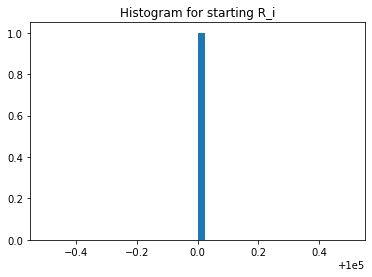

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([200000., 302001., 201013., 201000., 296059., 198033., 198026.])

In [24]:
experiments.UNI_Si.unique()

array([10000., 15024., 14950.])

In [25]:
experiments.UNI_Qj.unique()

array([200000., 178125., 176374., ..., 195957., 160936., 165869.])

In [26]:
experiments.UNI_Rj.unique()

array([100000., 112457., 113570., ...,  99887., 124588., 120898.])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([100000.])

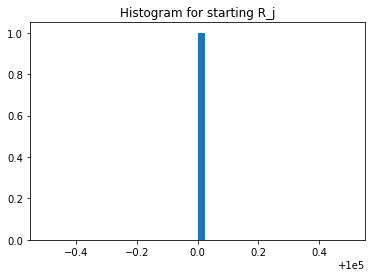

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([100000.])

In [31]:
experiments.UNI_ji.unique()

array([100000.])

In [32]:
experiments.UNI_Sij.unique()

array([1.e+10])

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


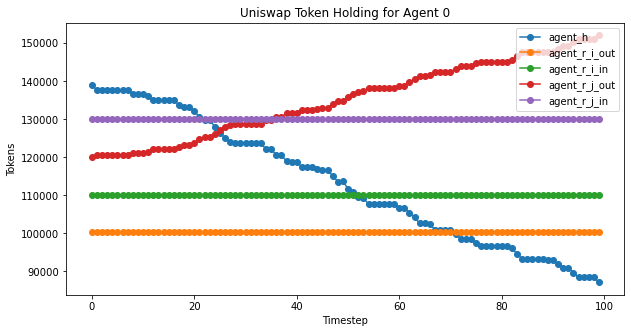

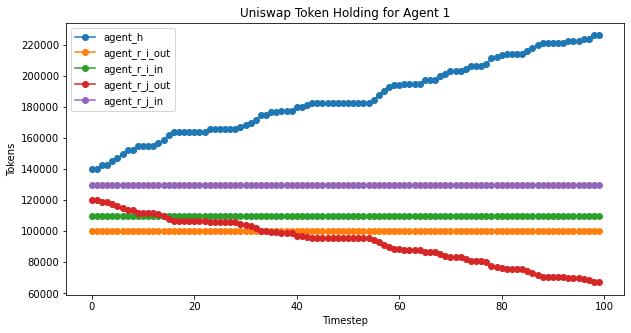

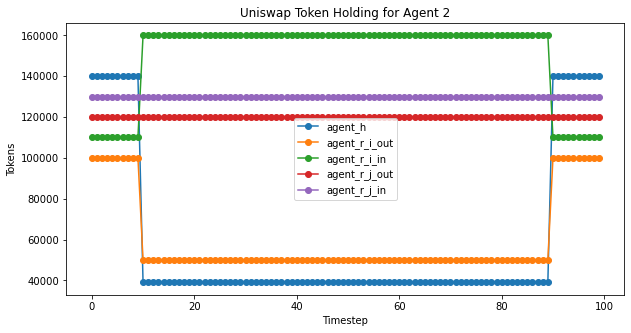

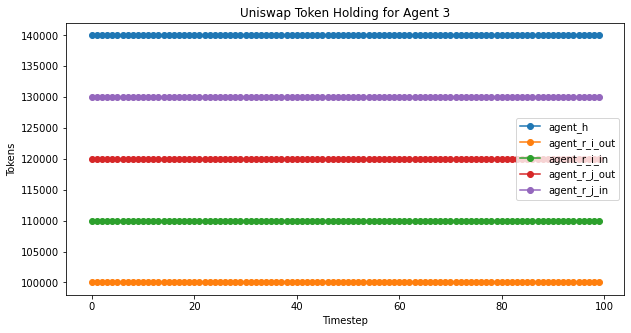

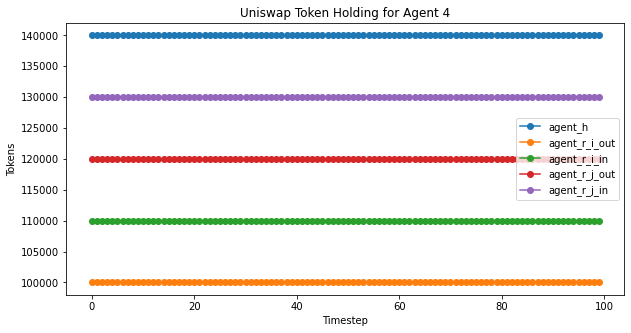

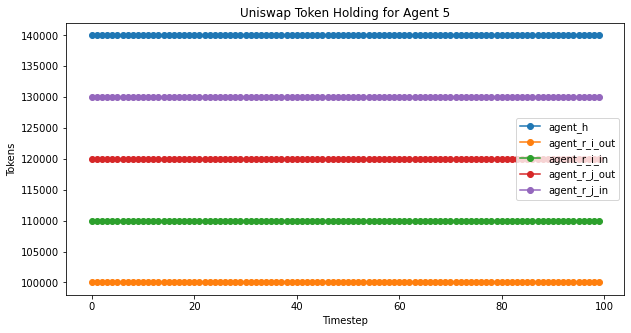

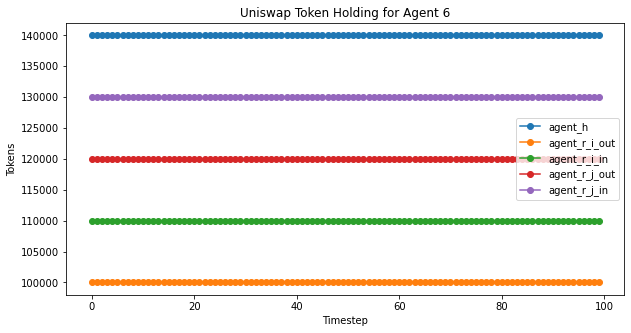

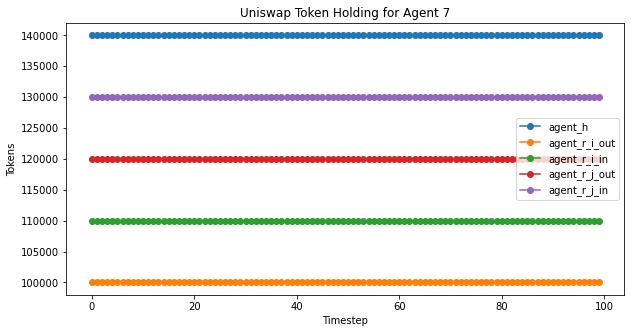

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


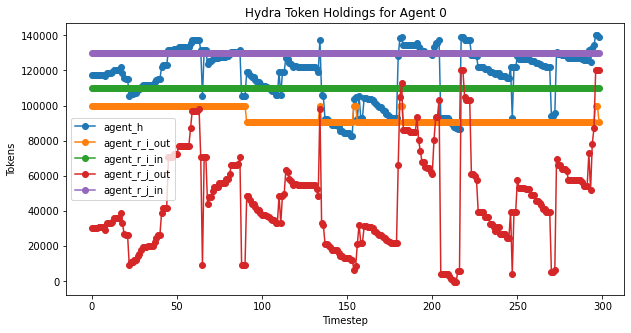

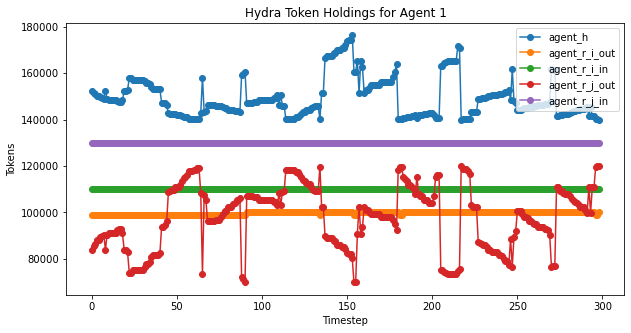

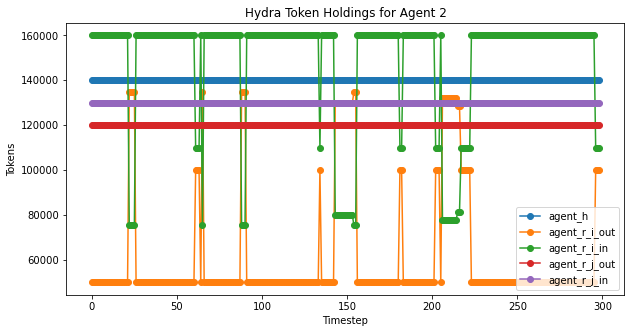

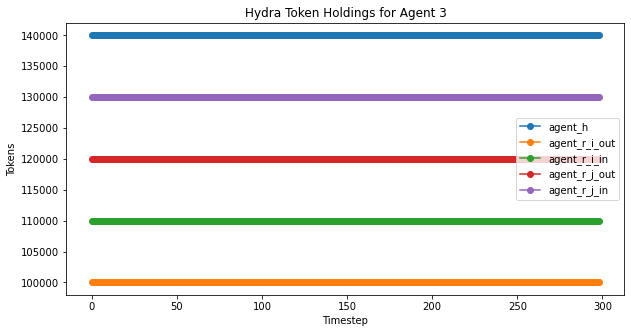

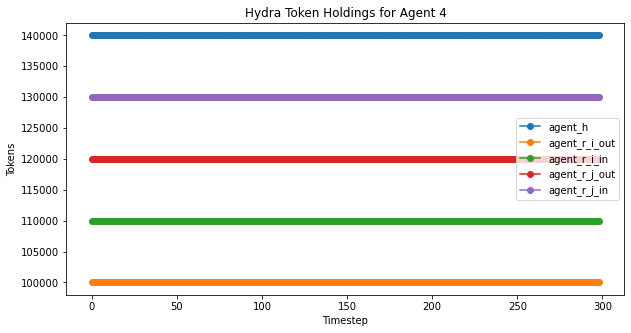

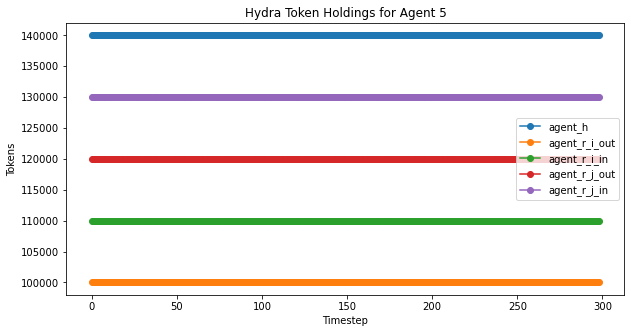

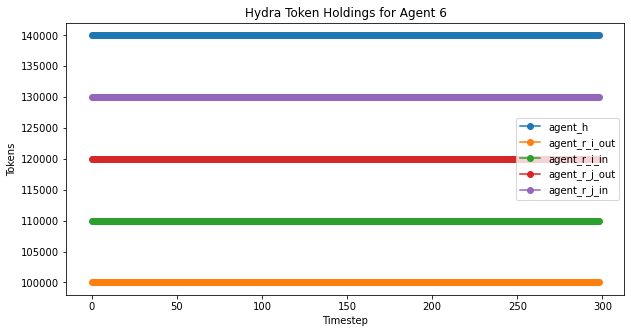

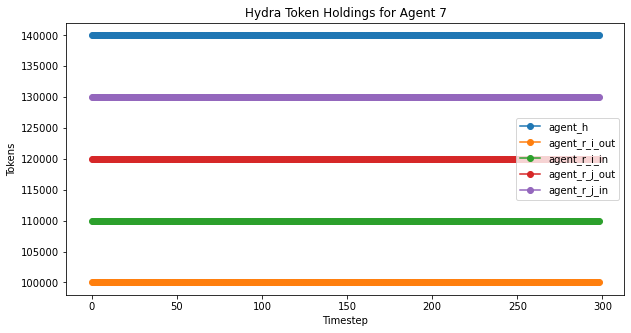

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

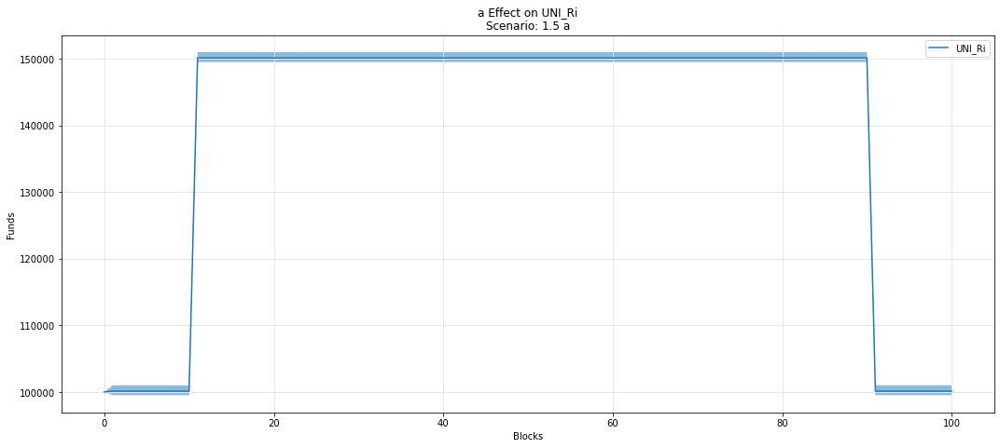

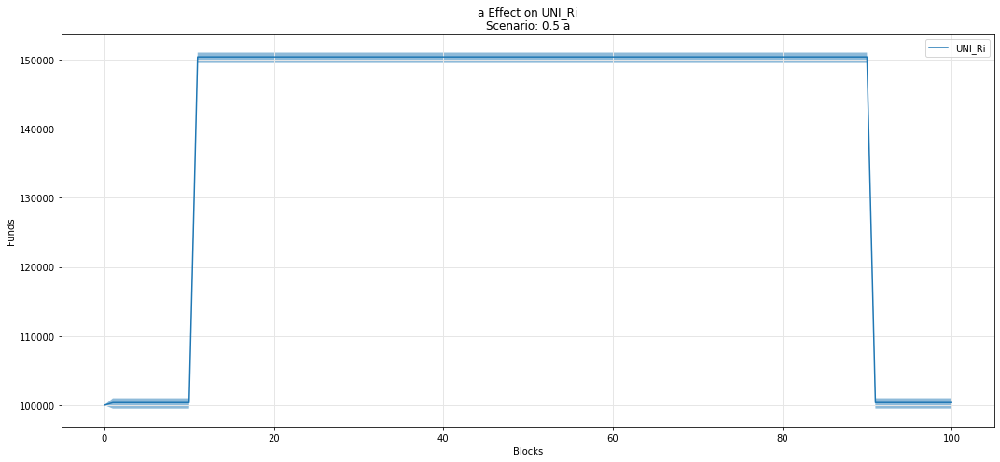

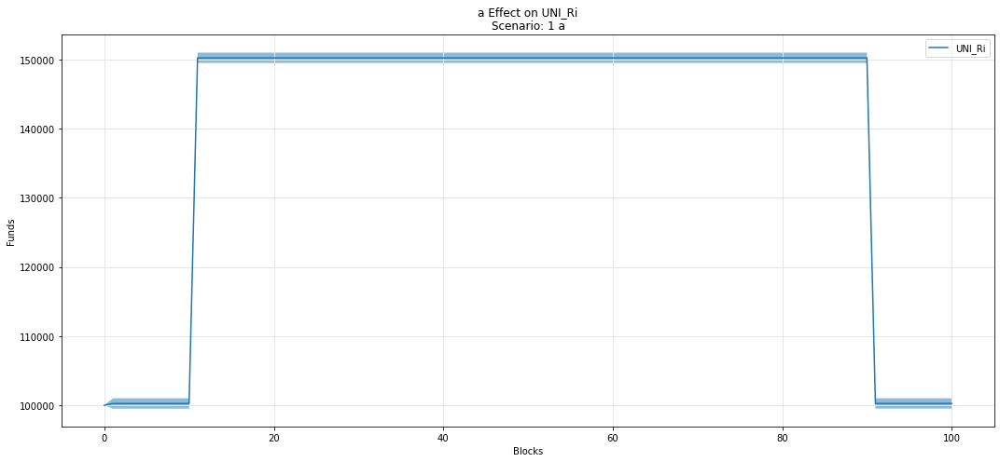

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

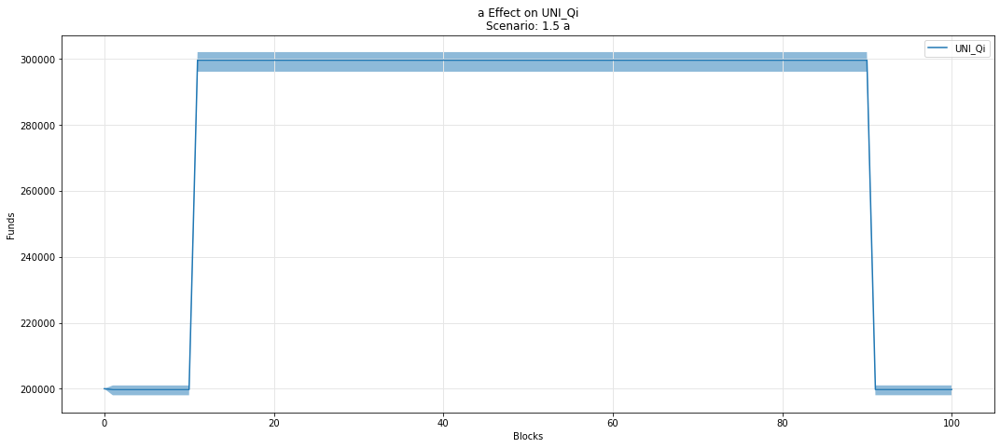

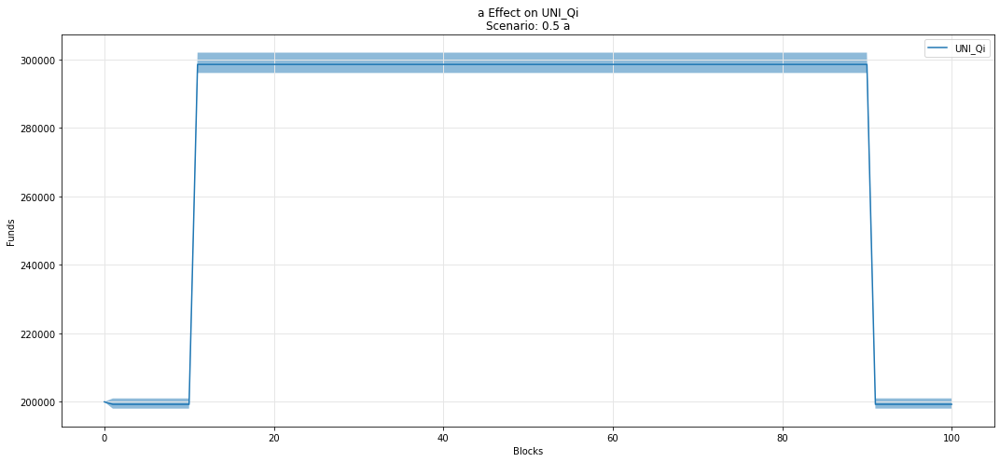

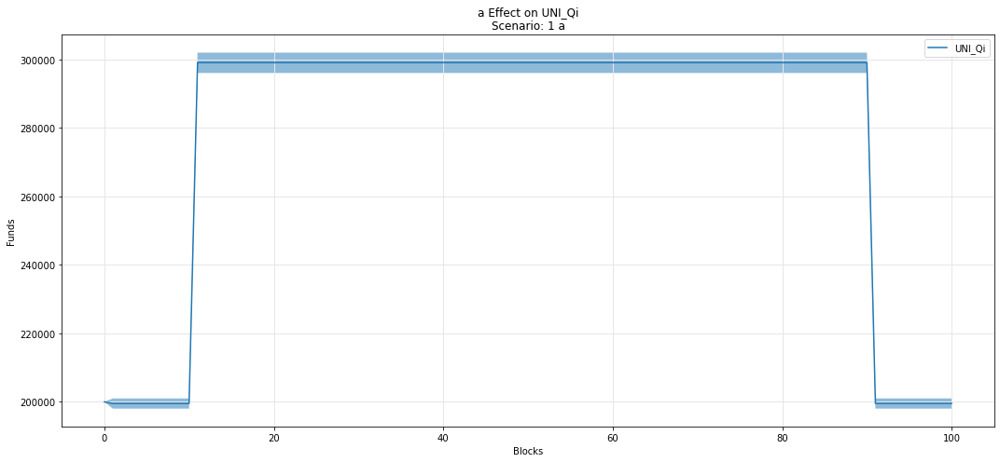

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

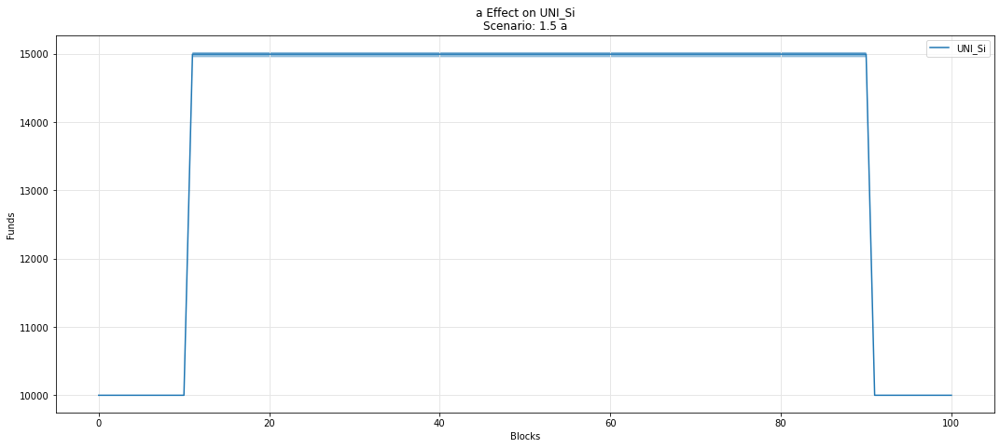

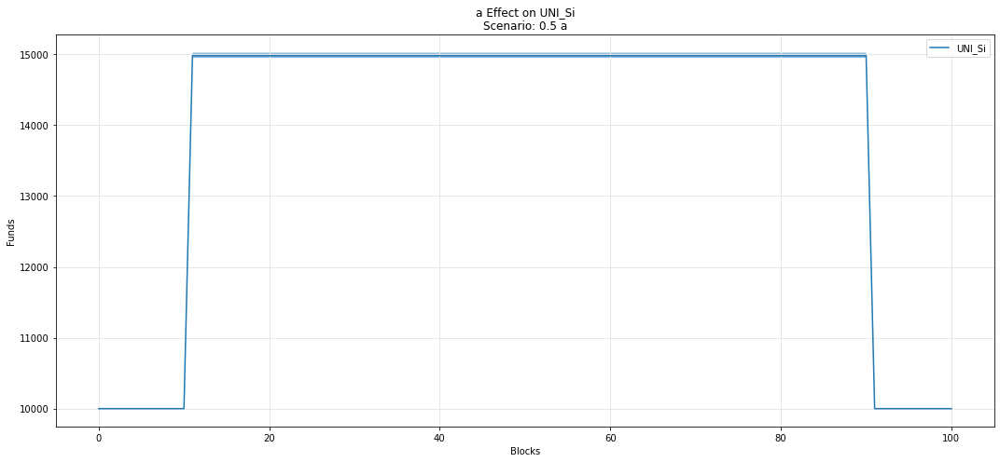

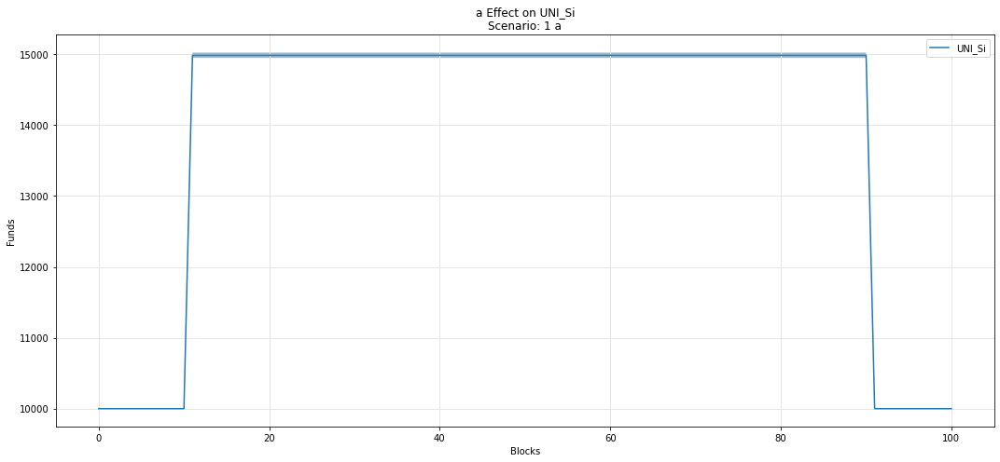

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

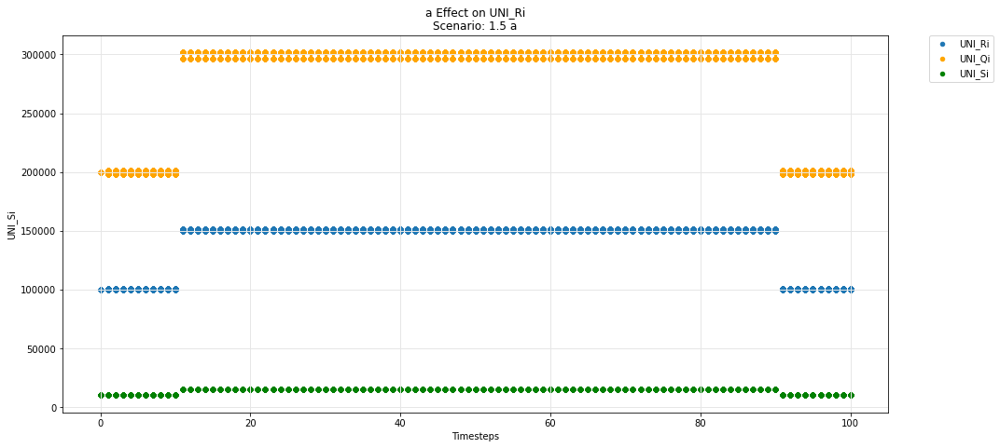

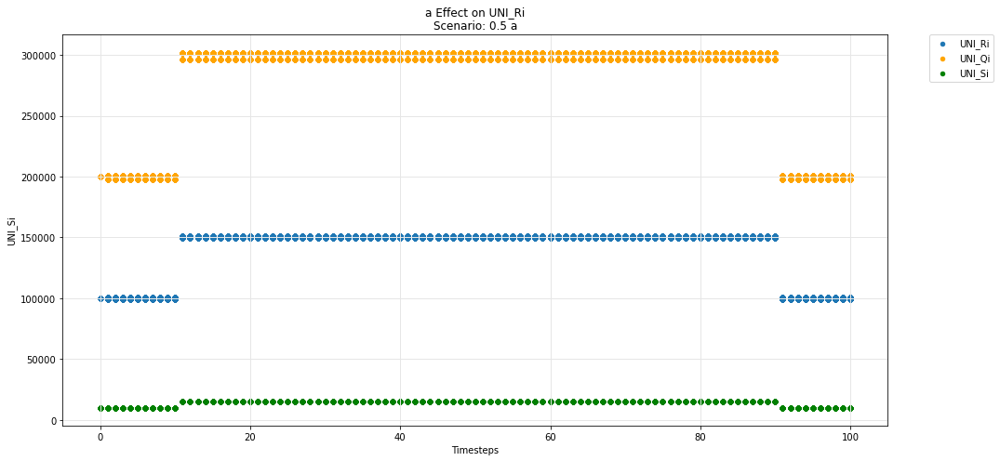

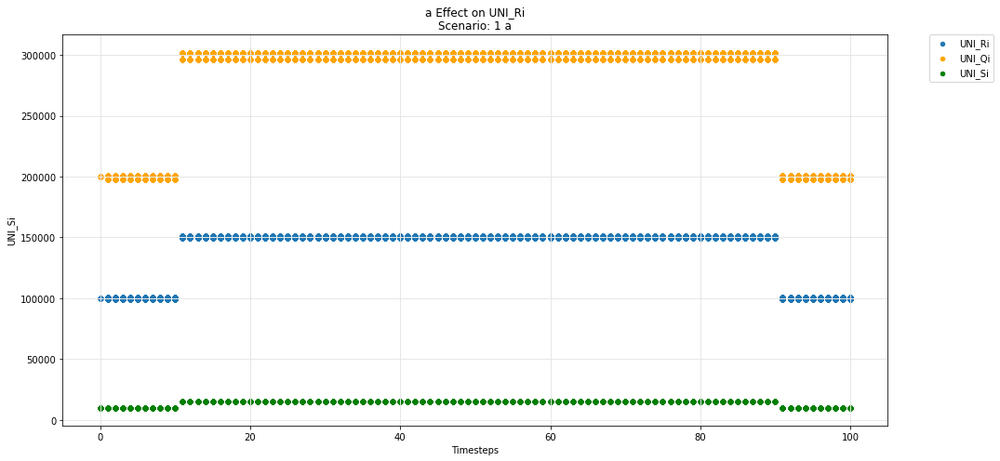

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

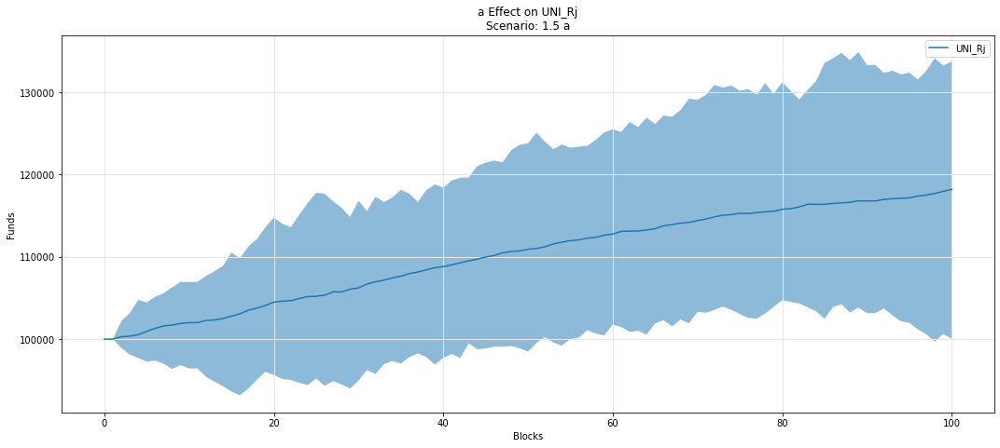

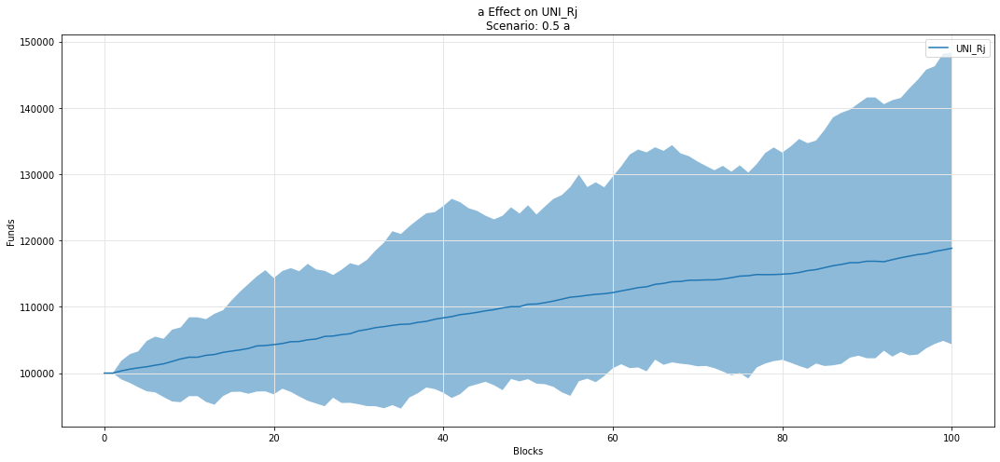

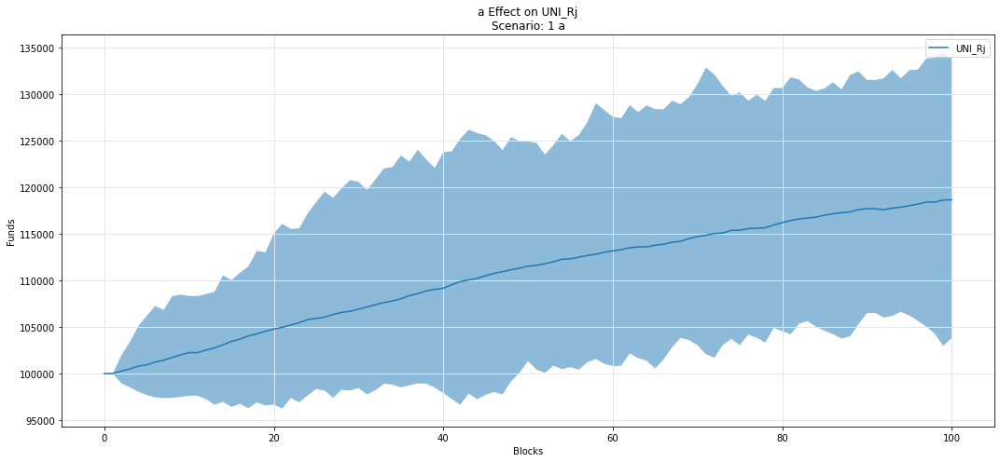

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

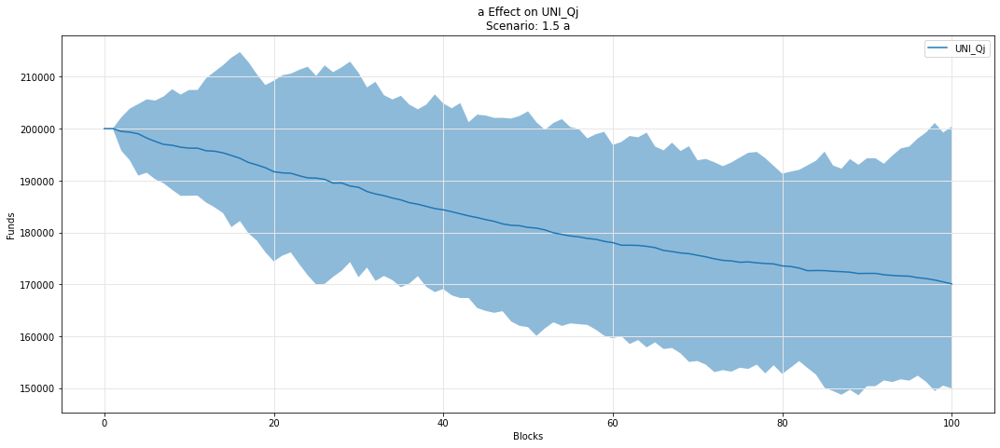

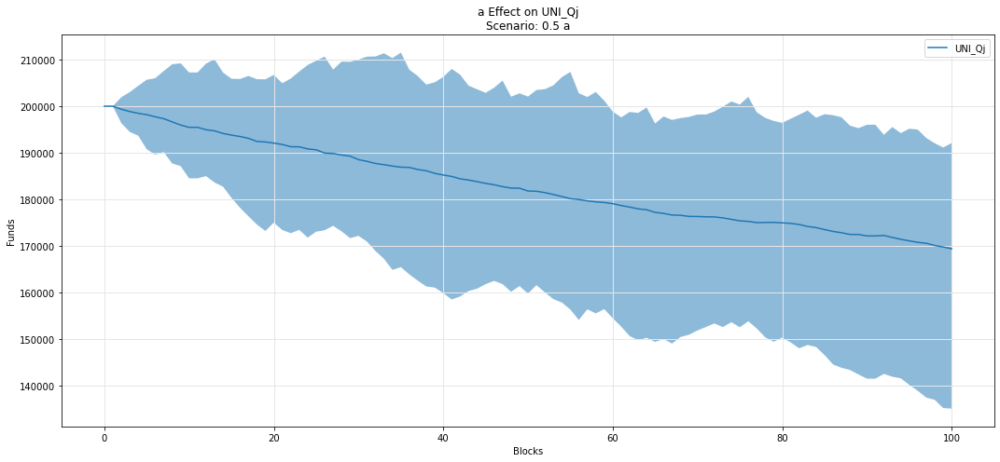

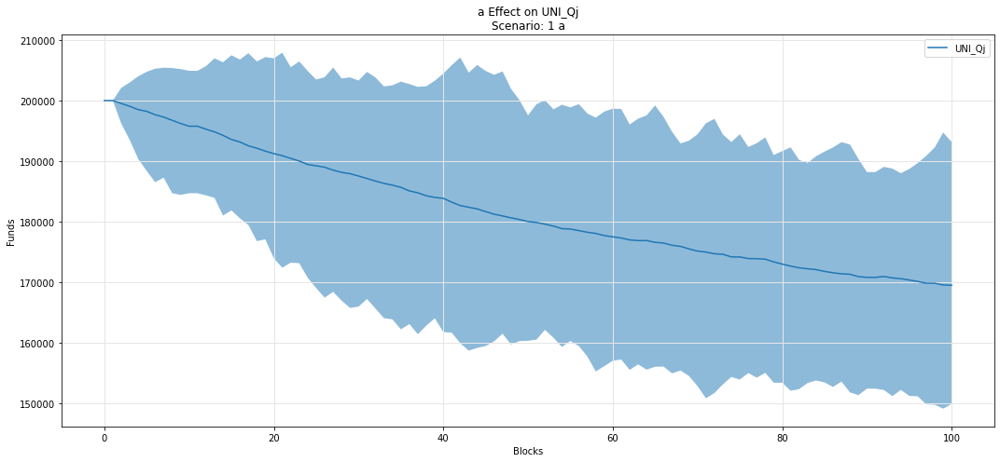

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

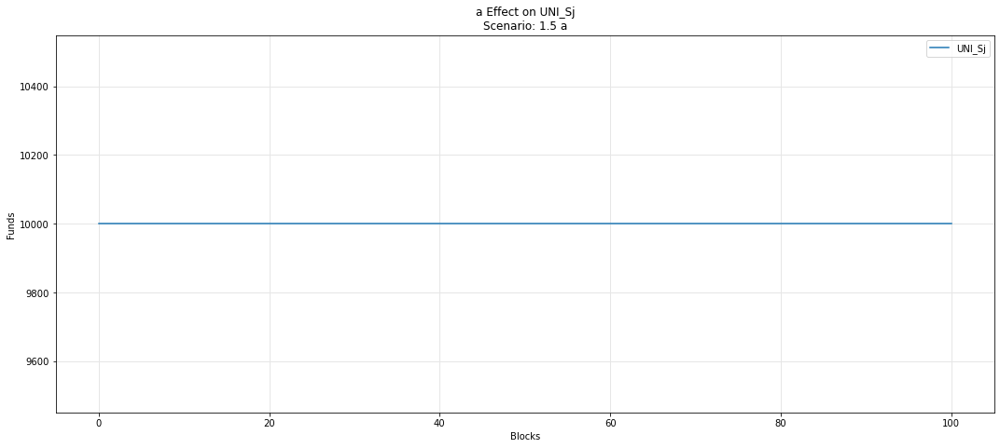

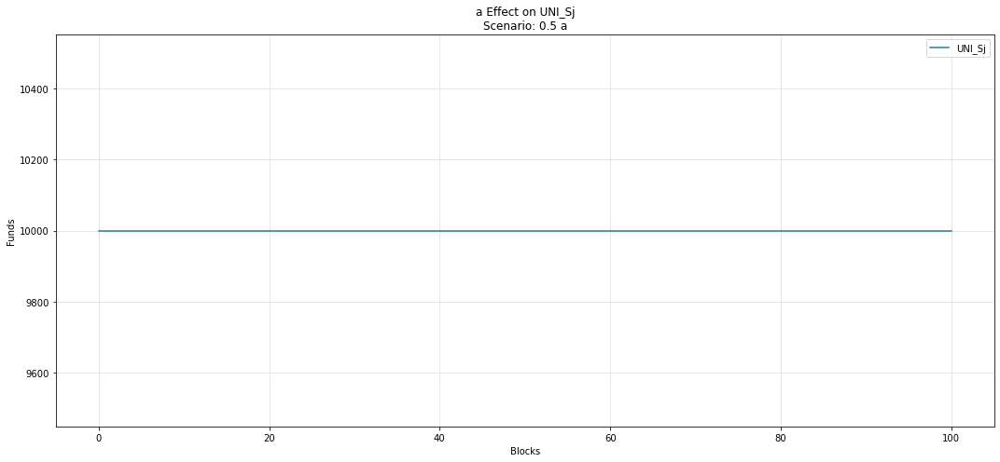

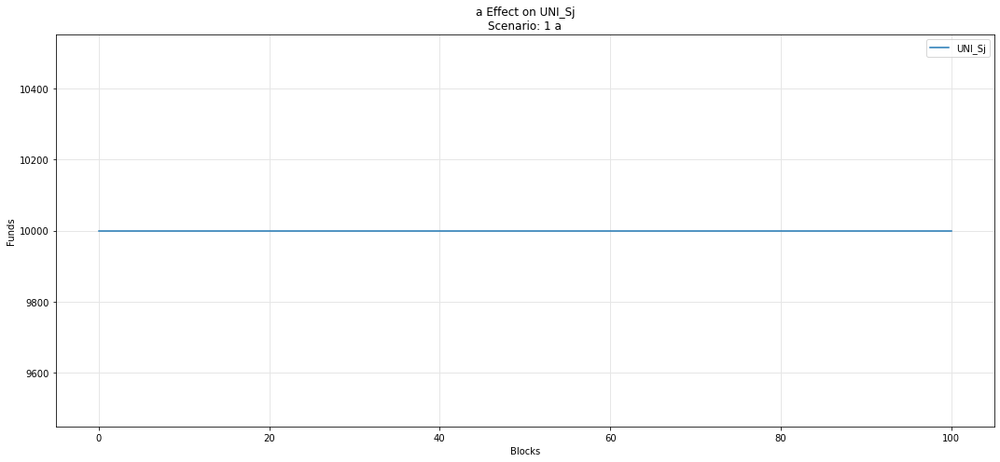

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

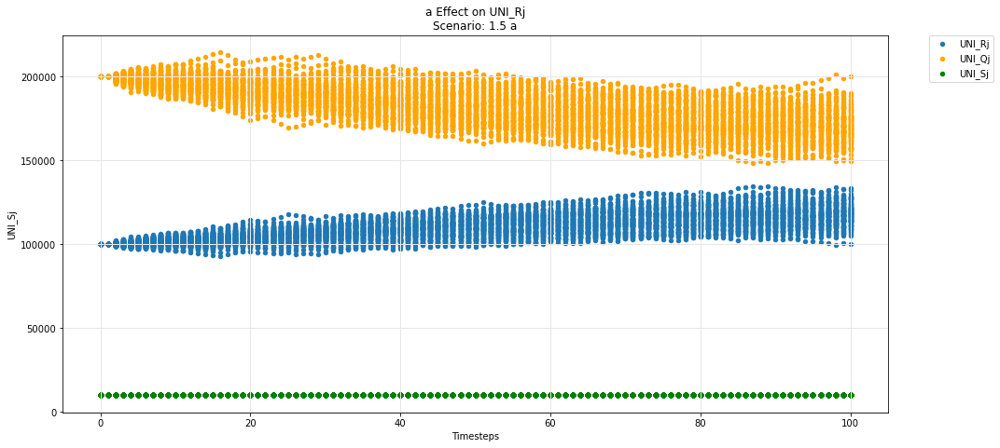

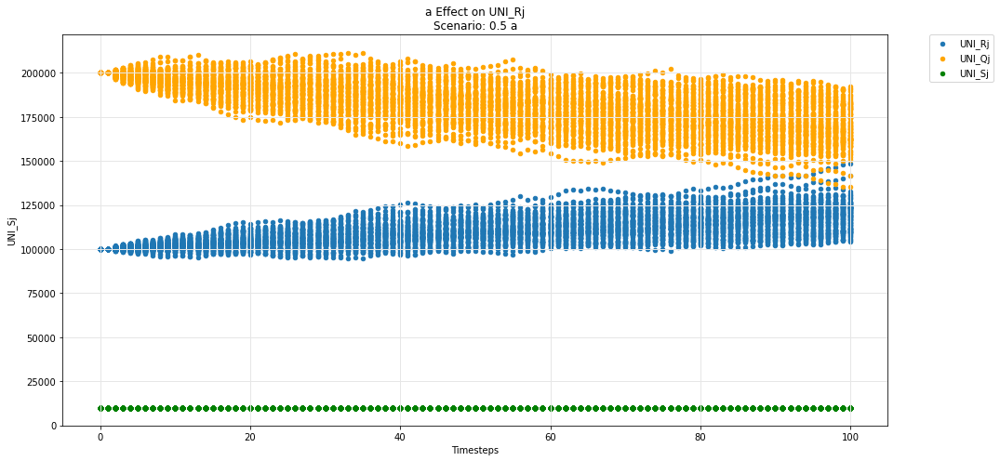

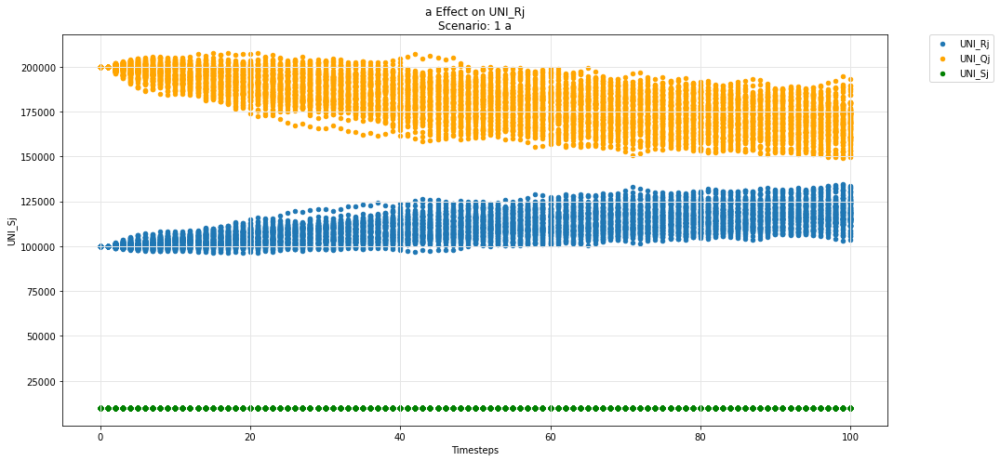

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

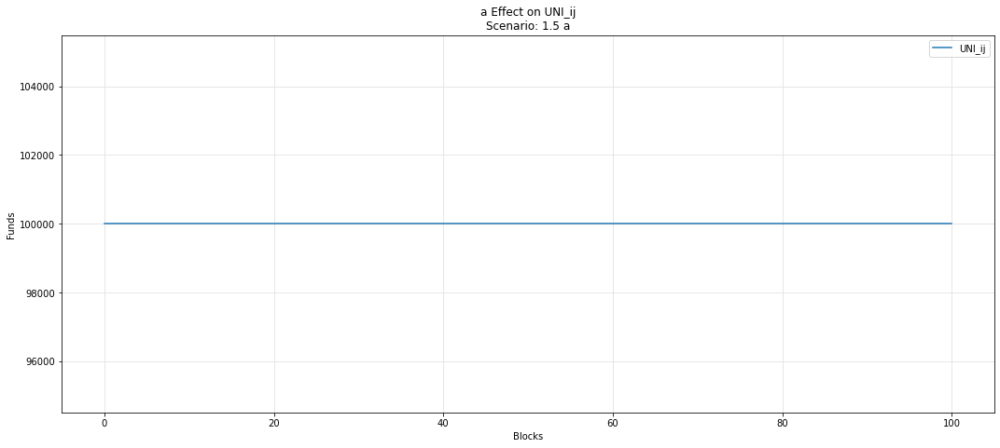

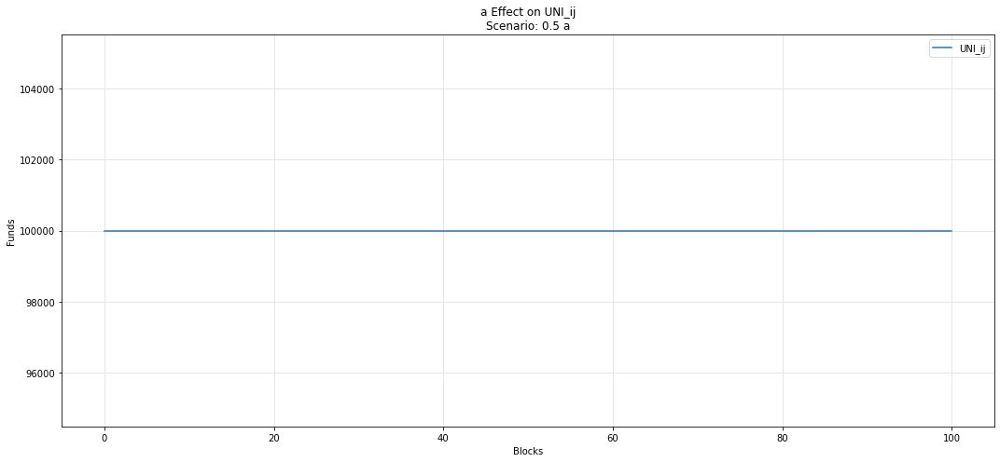

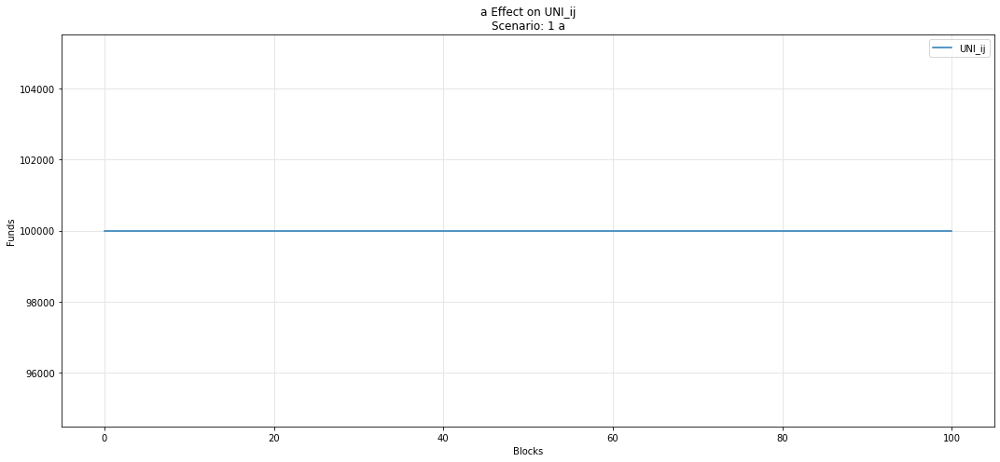

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

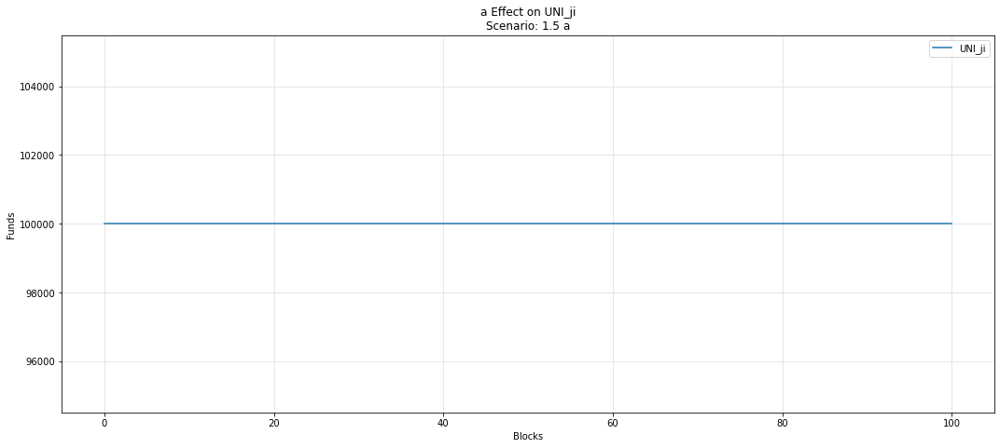

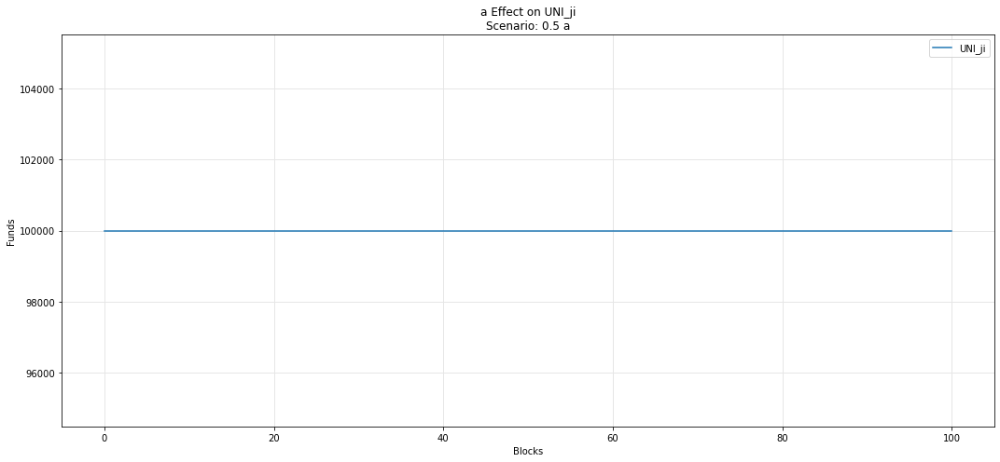

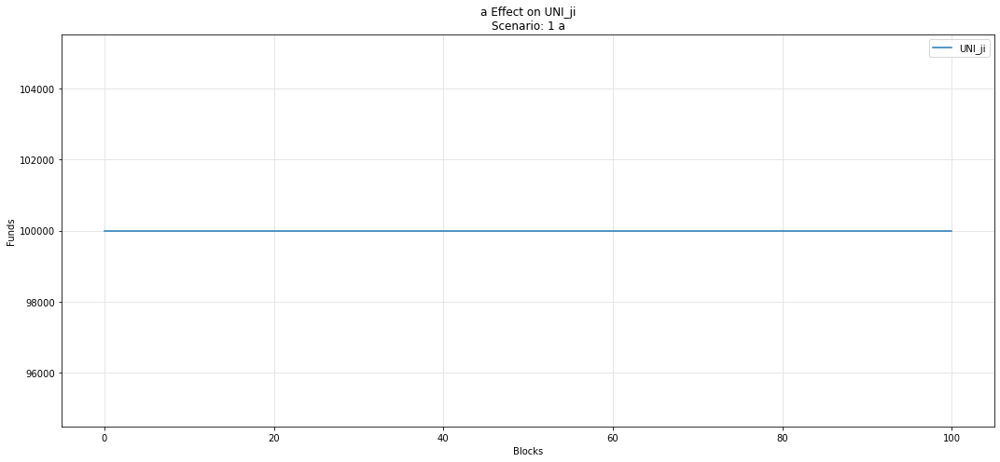

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

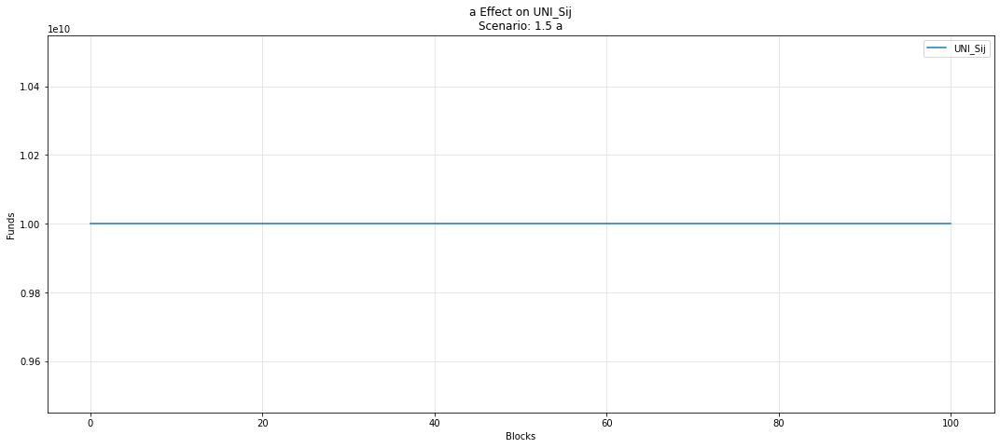

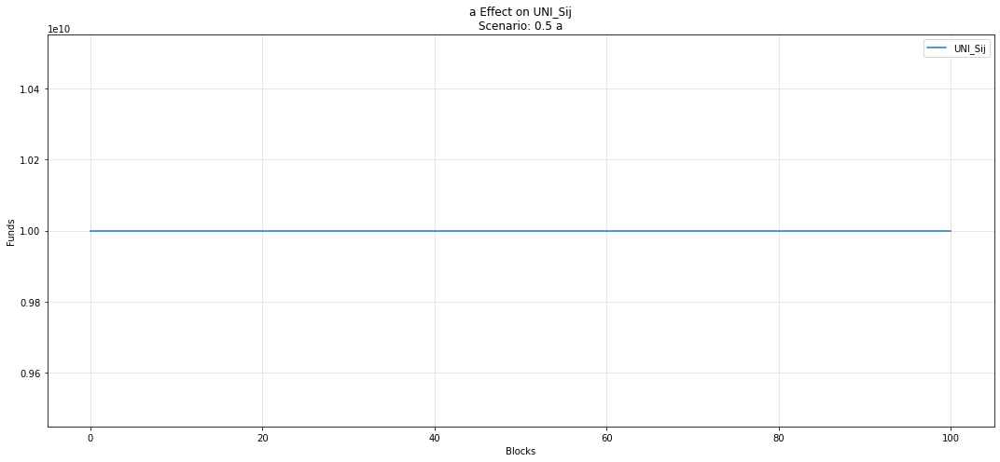

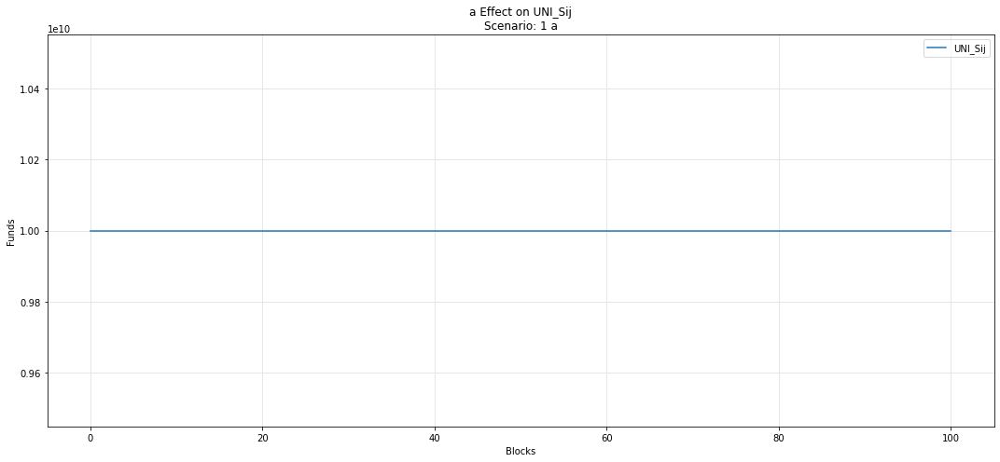

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

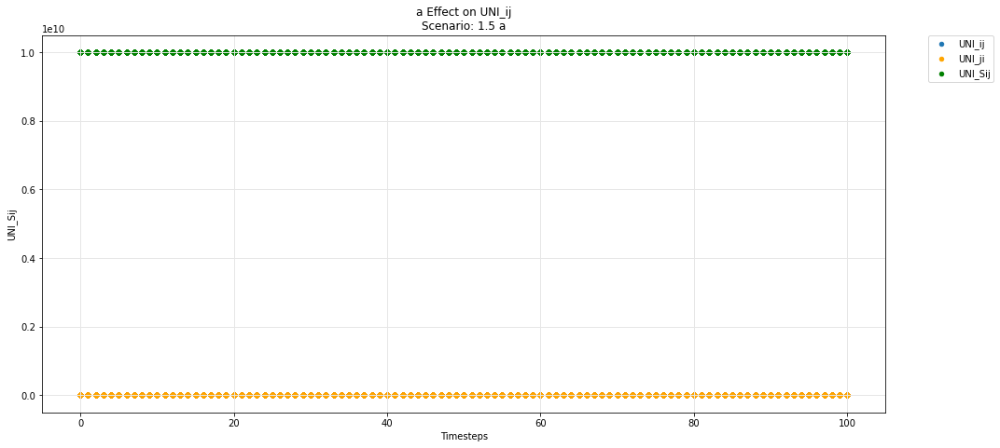

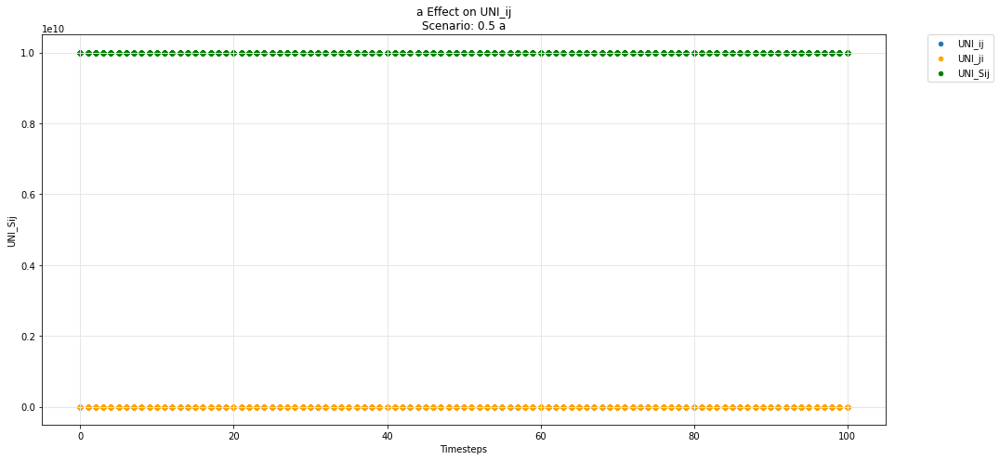

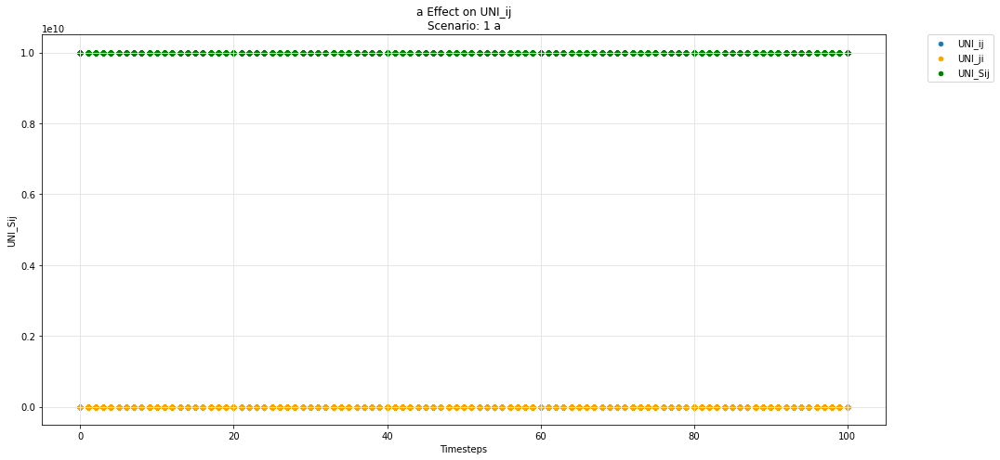

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

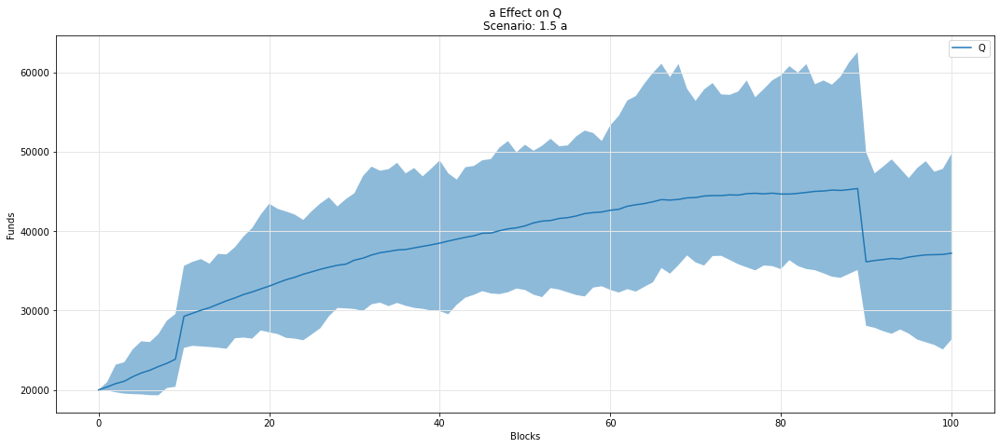

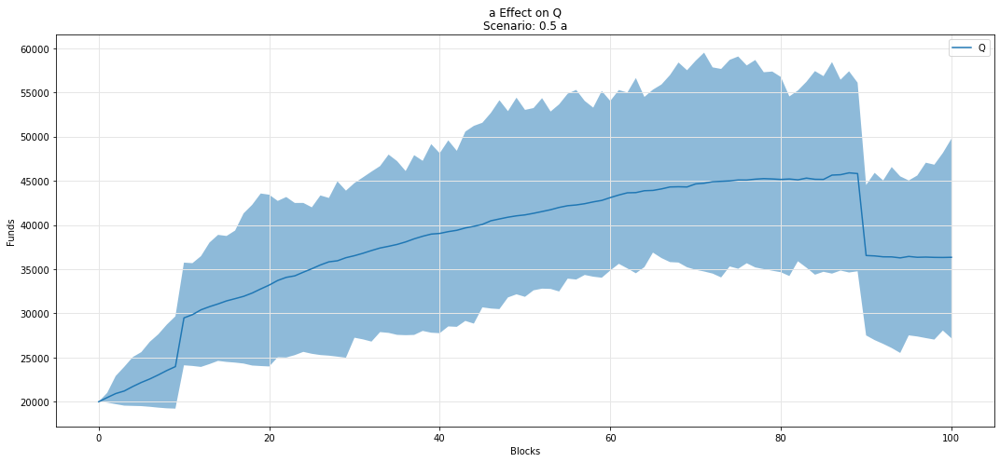

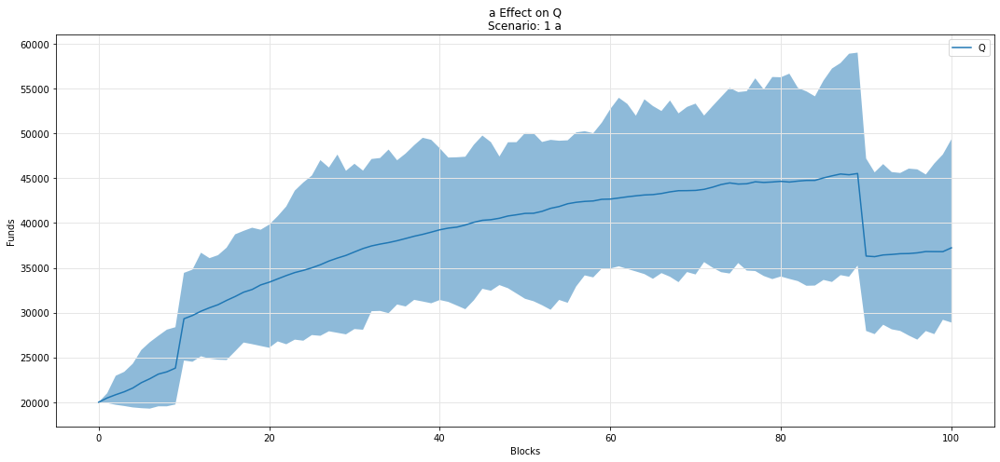

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

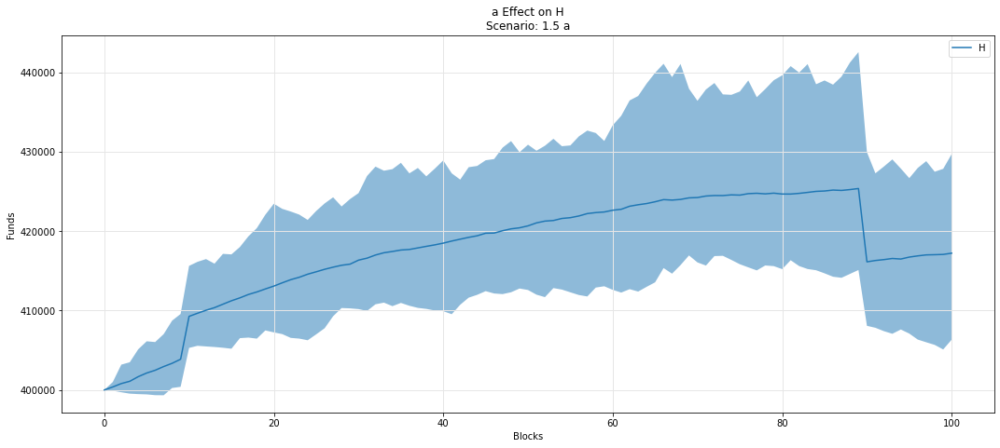

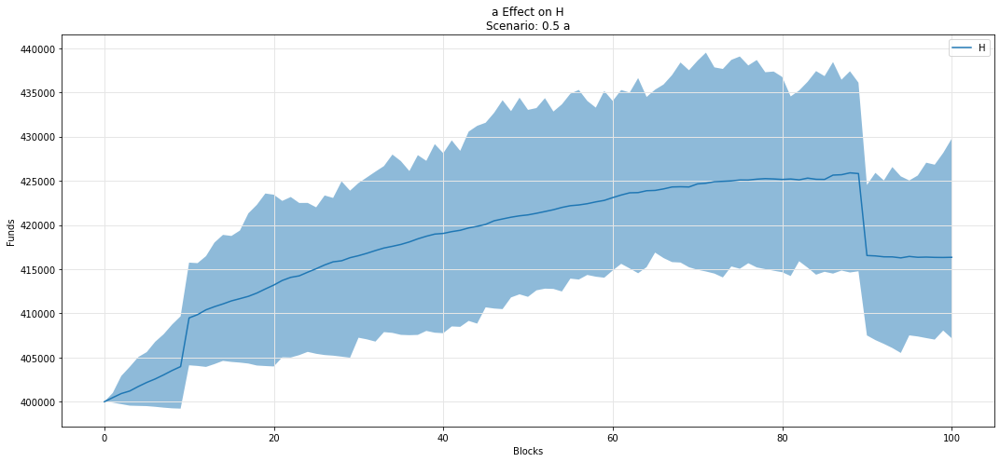

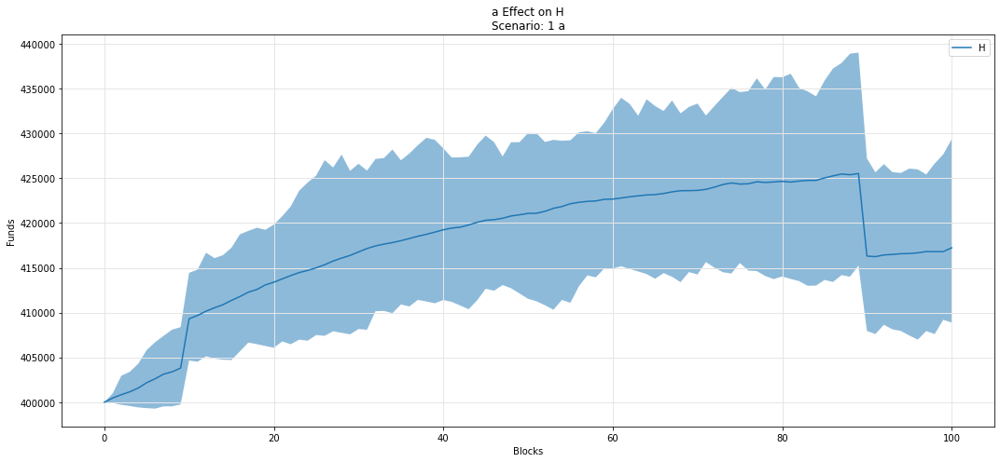

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

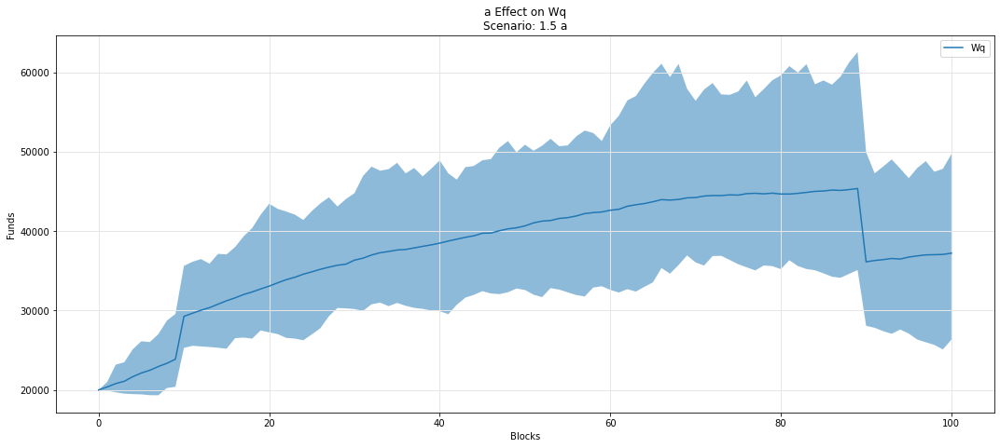

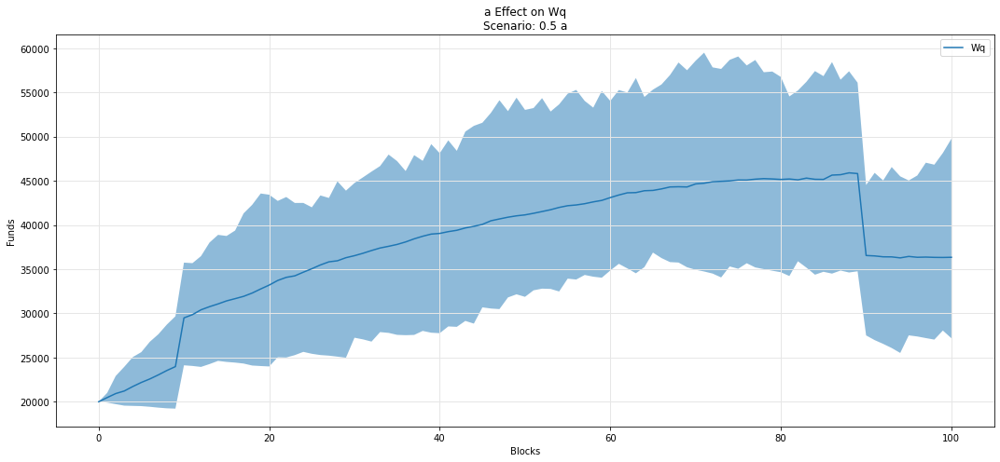

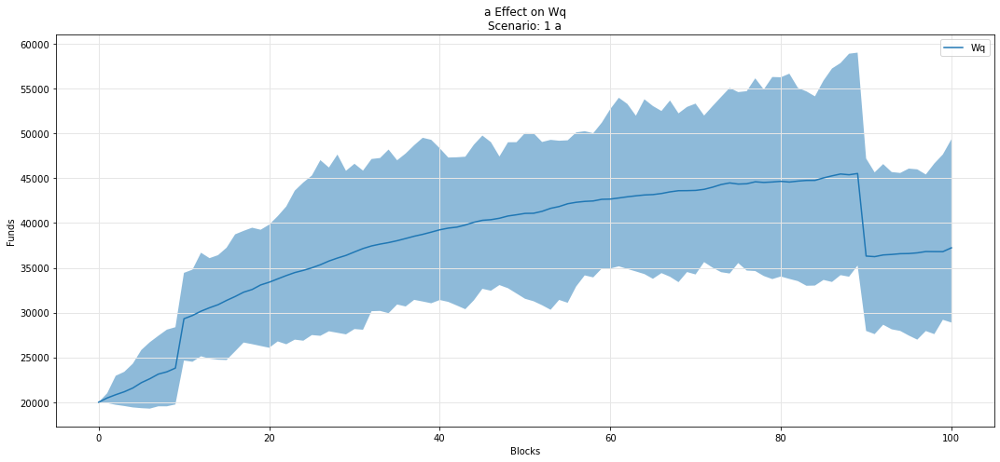

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

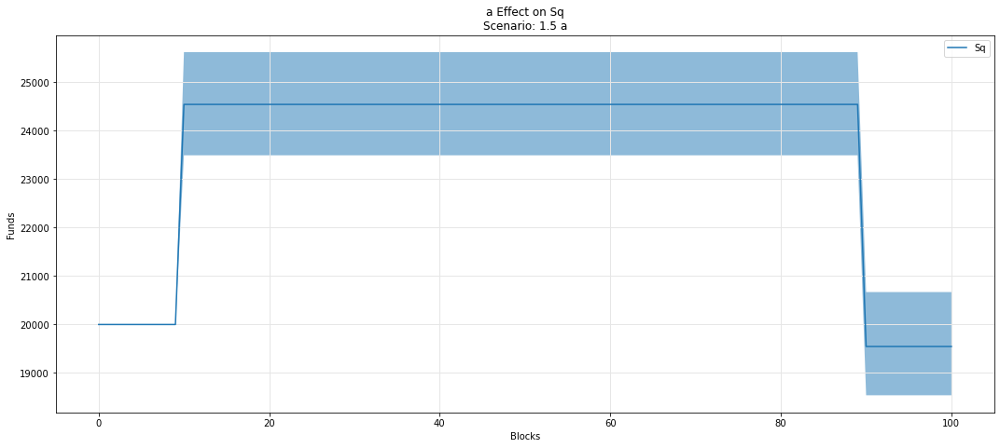

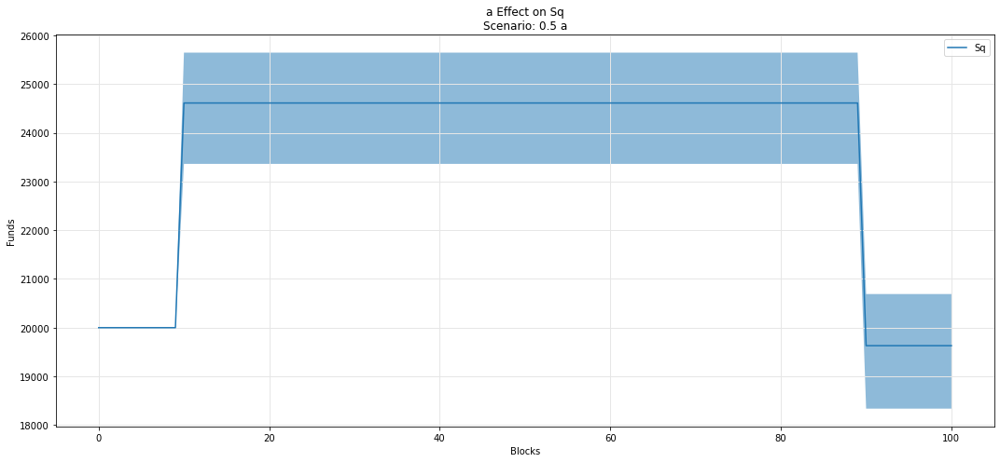

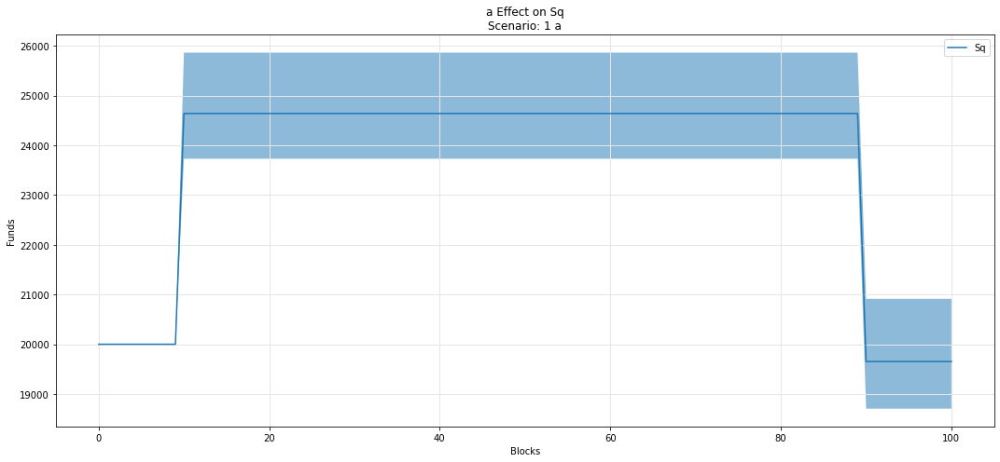

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

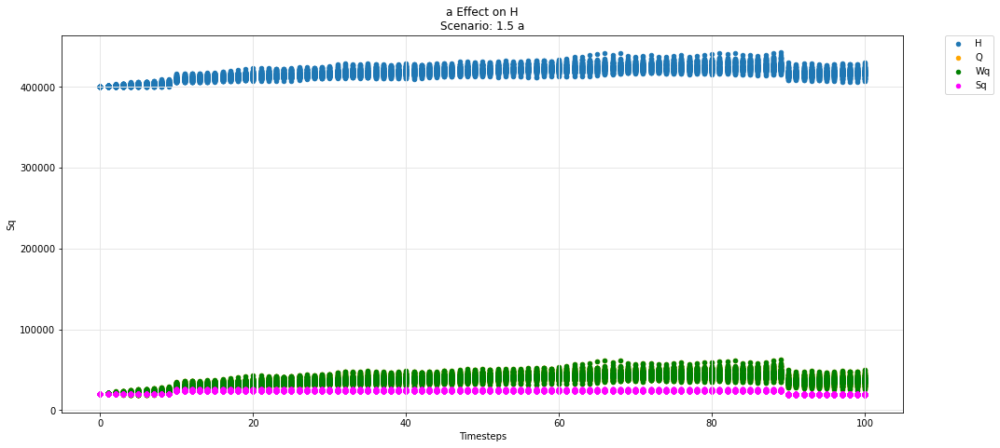

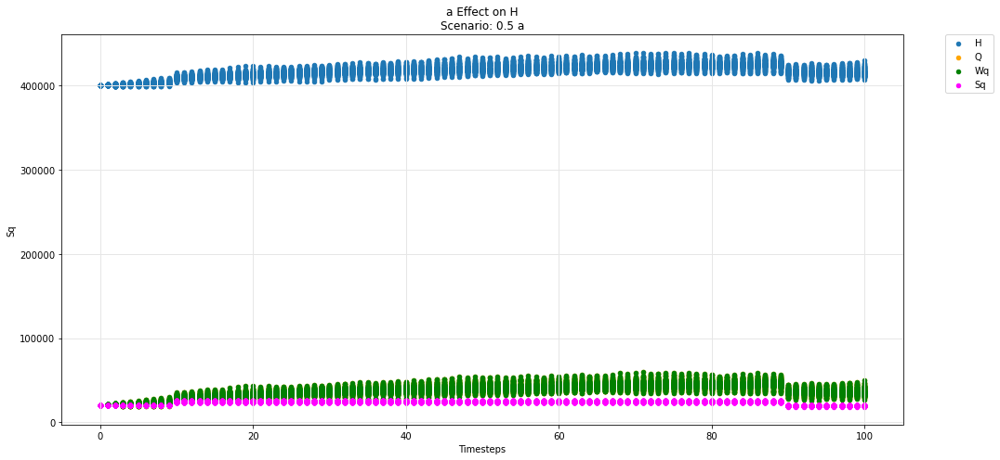

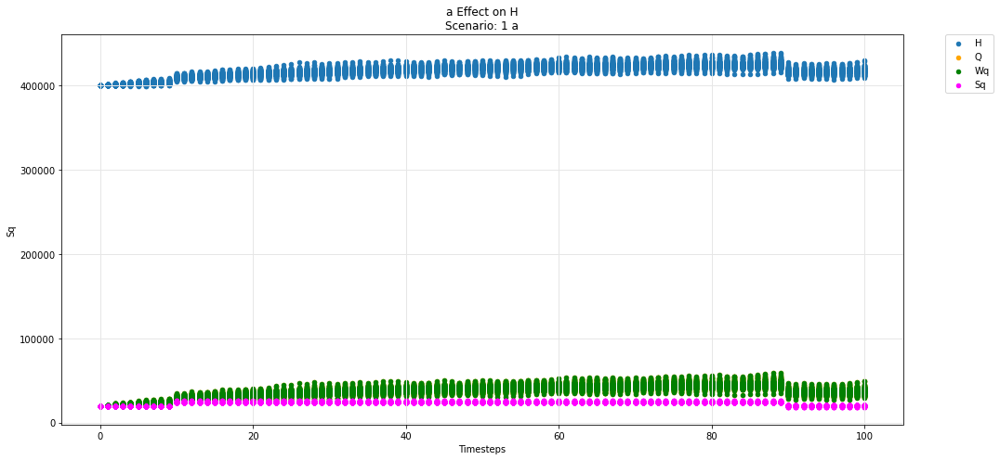

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

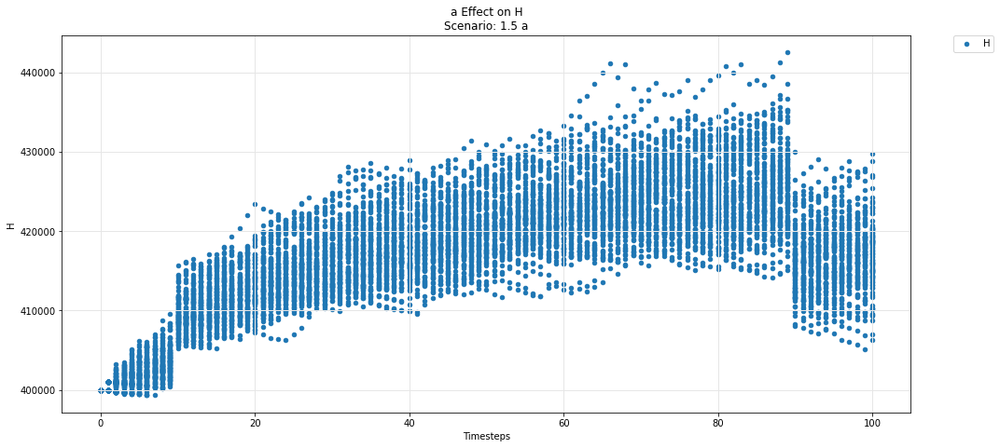

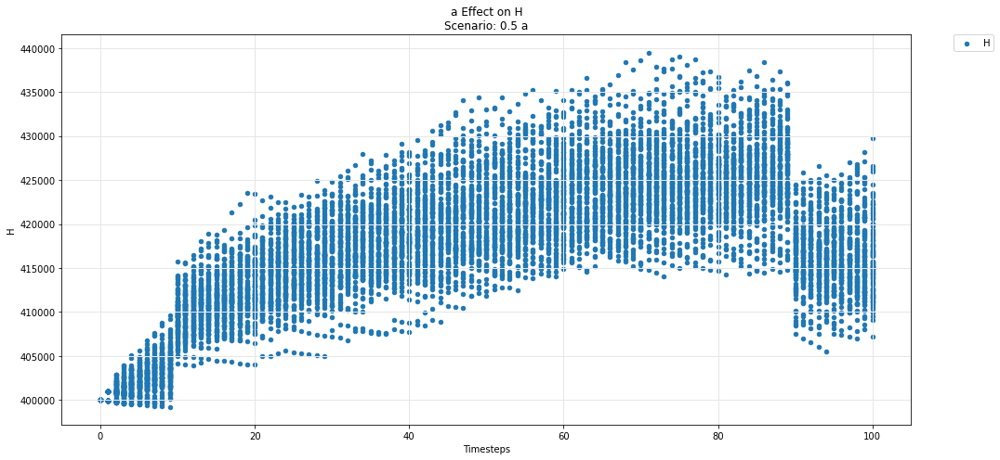

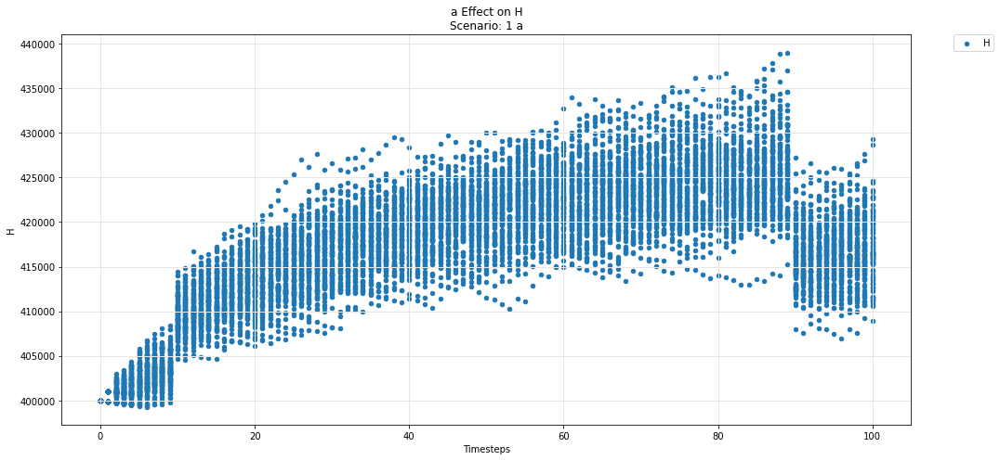

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

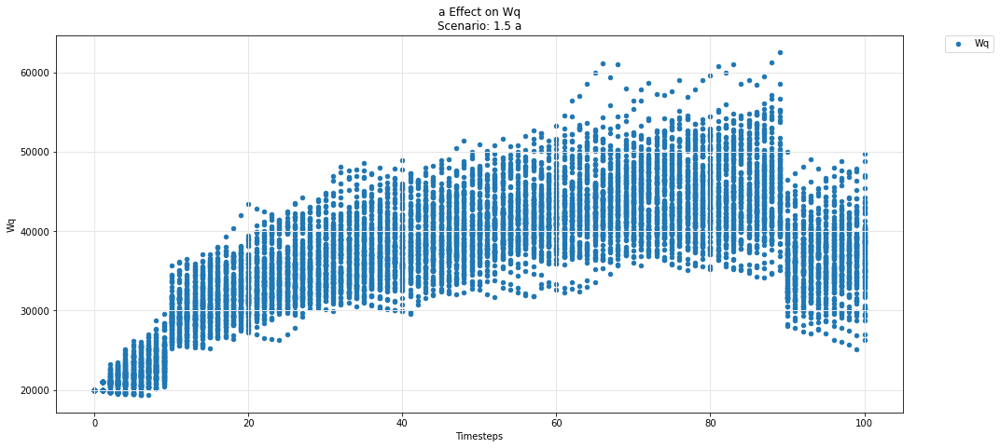

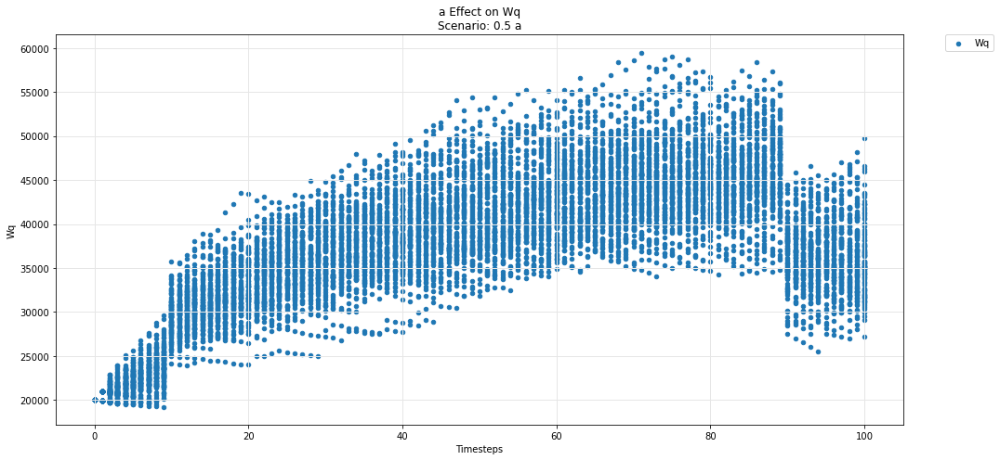

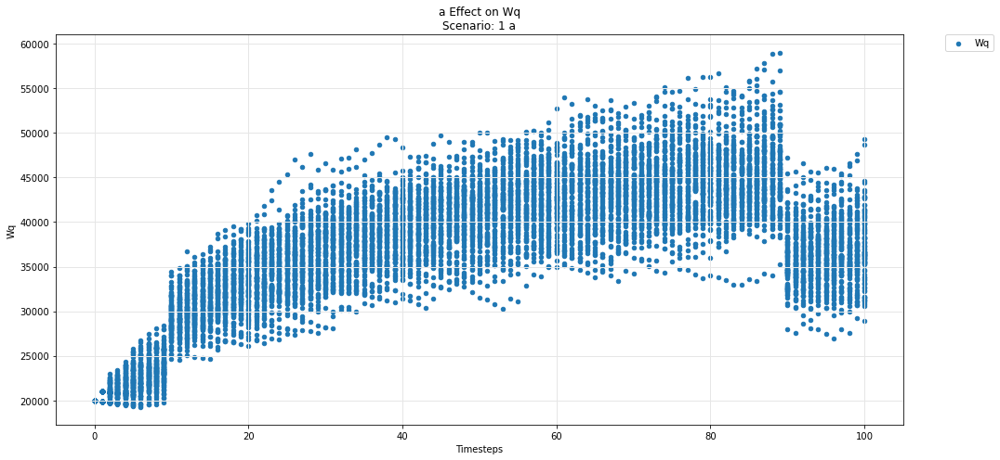

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

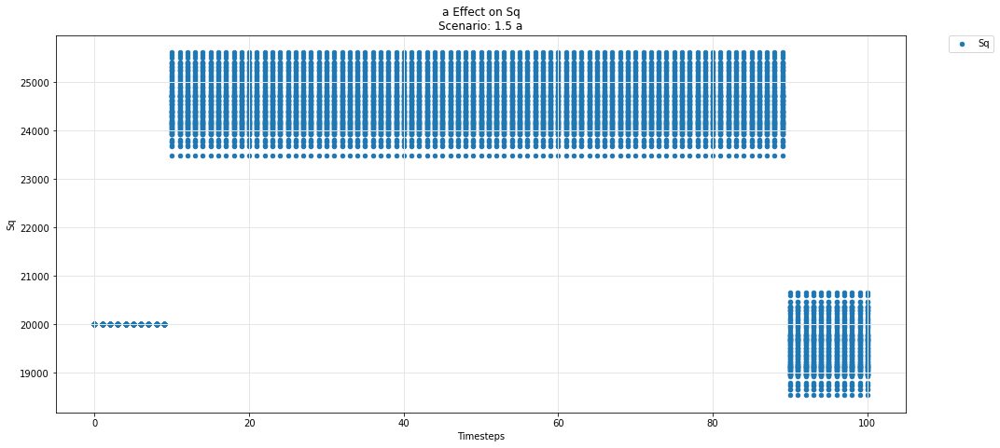

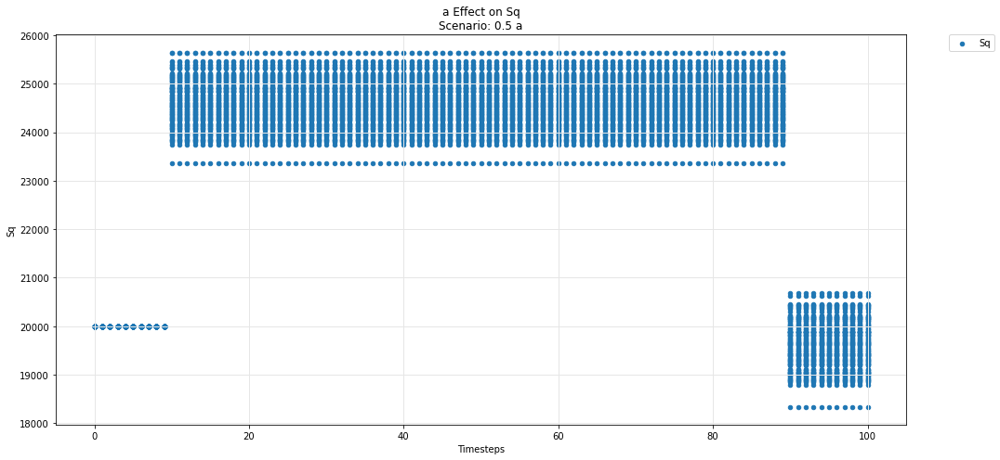

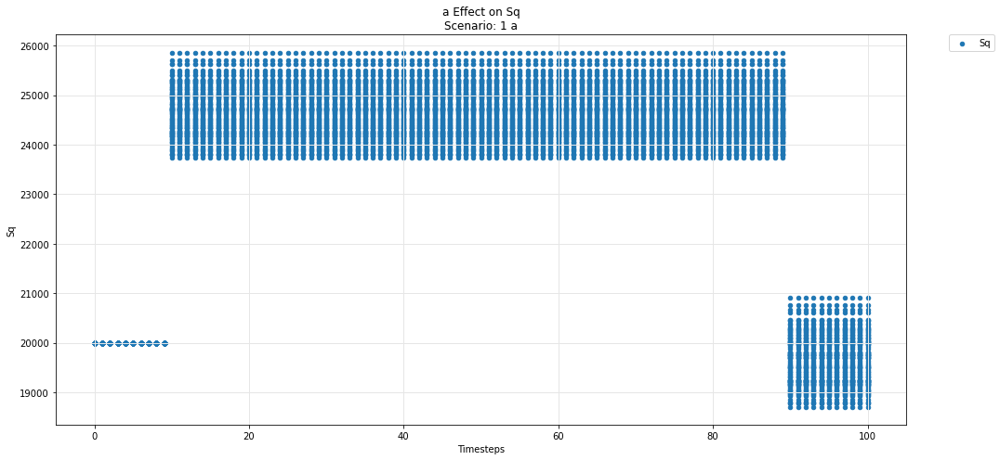

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

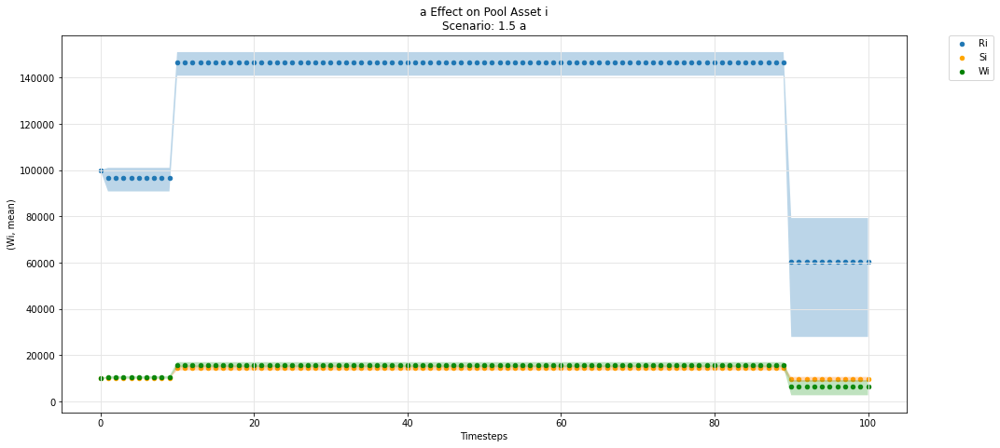

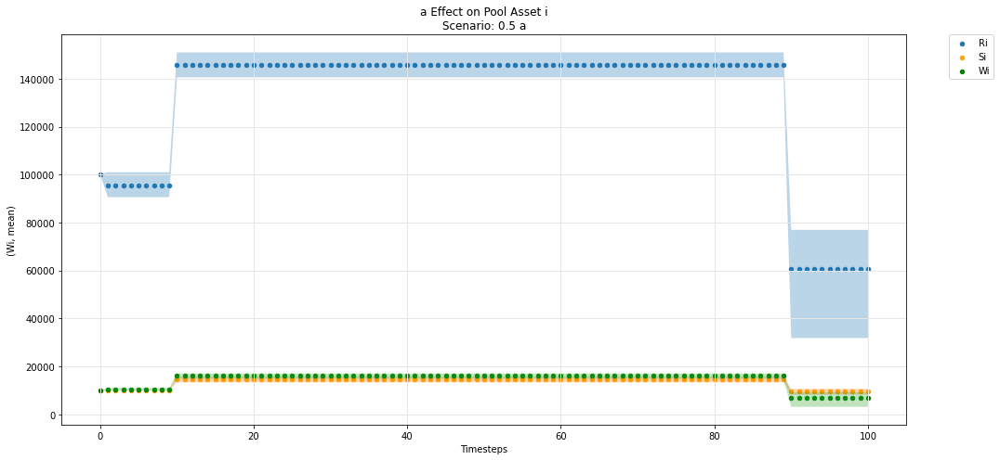

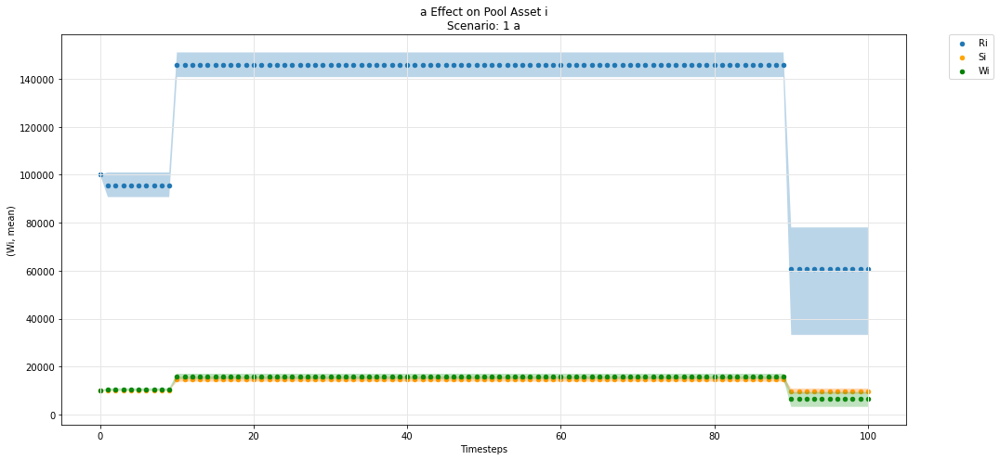

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

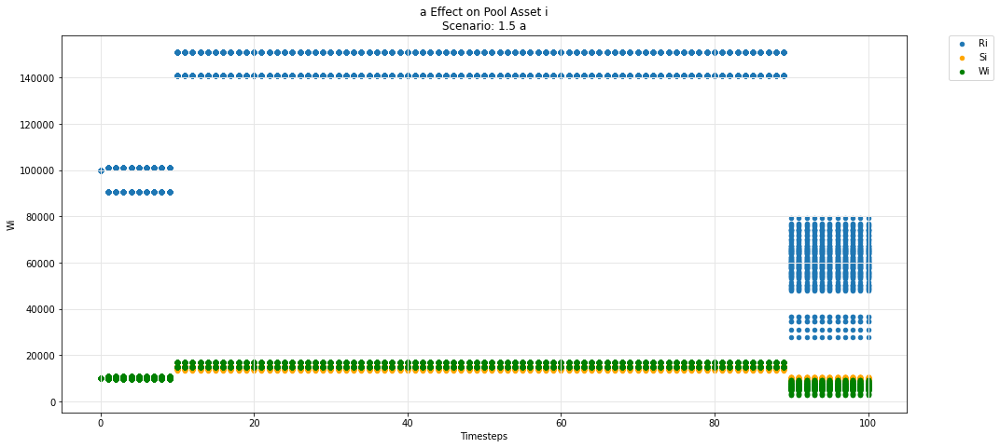

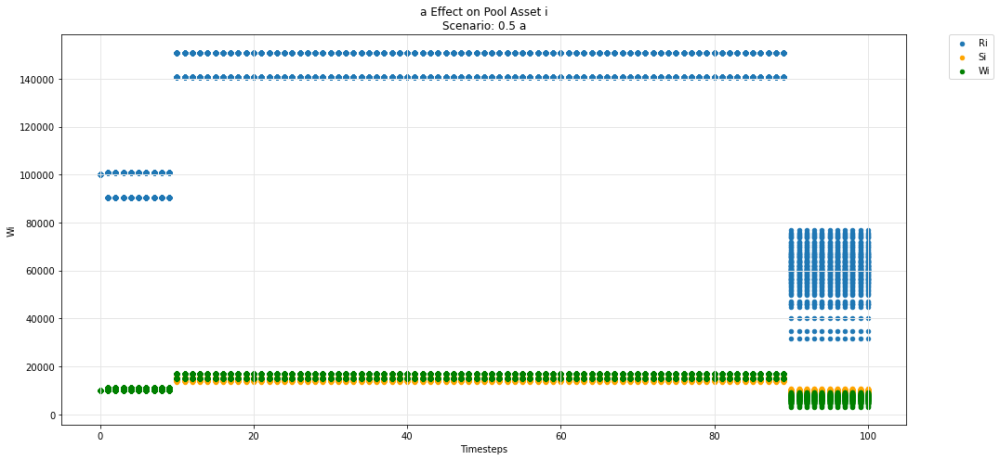

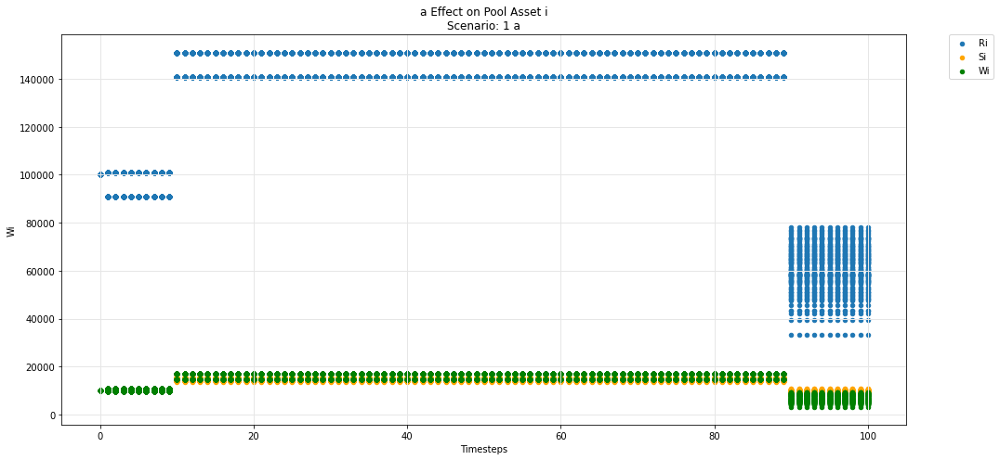

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

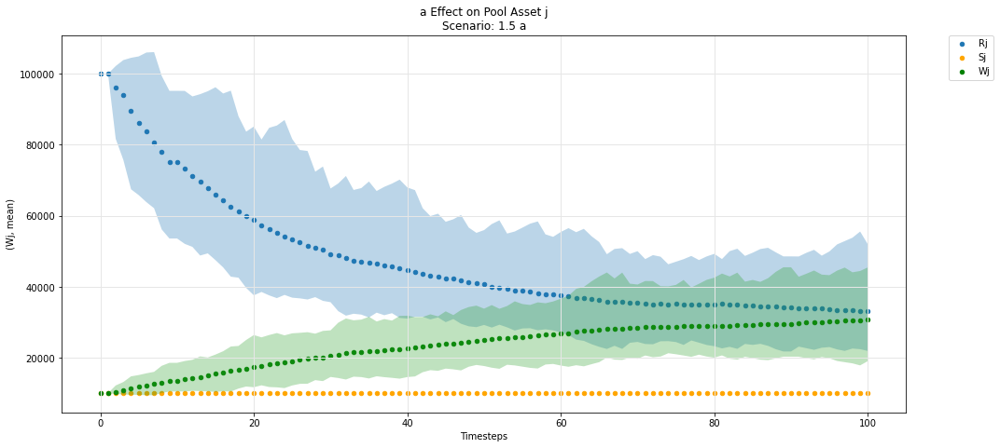

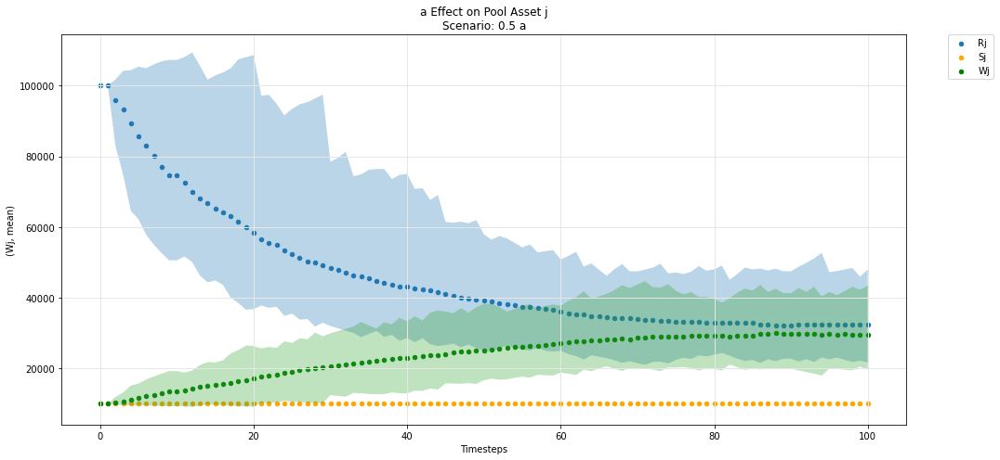

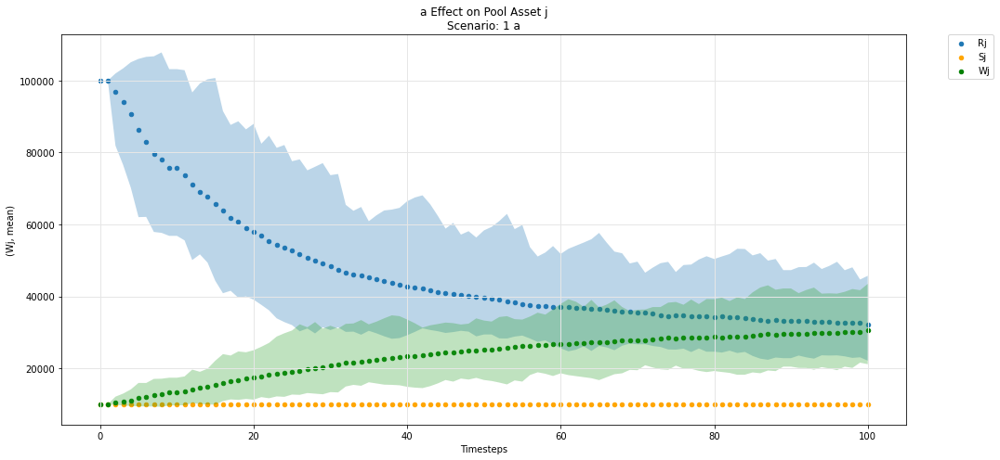

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

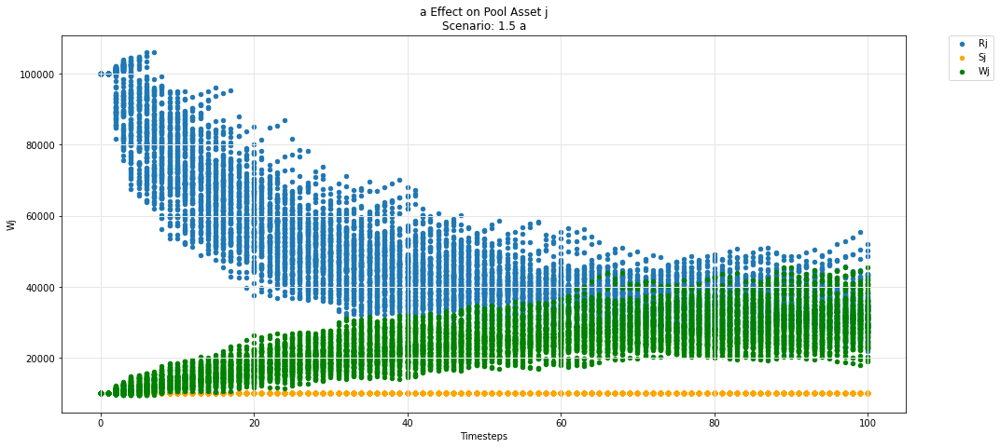

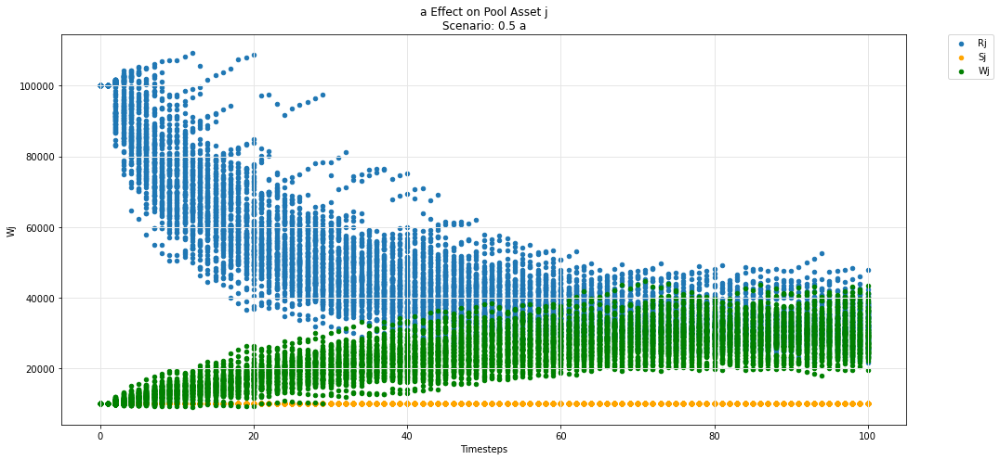

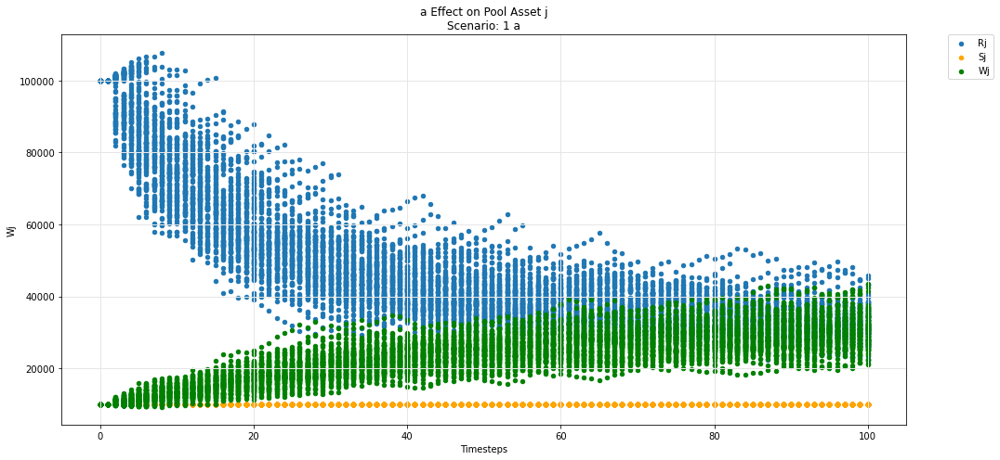

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

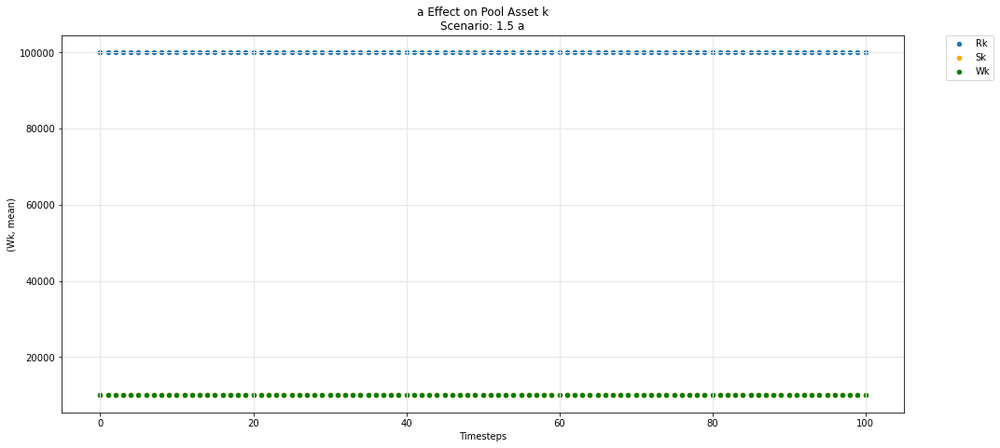

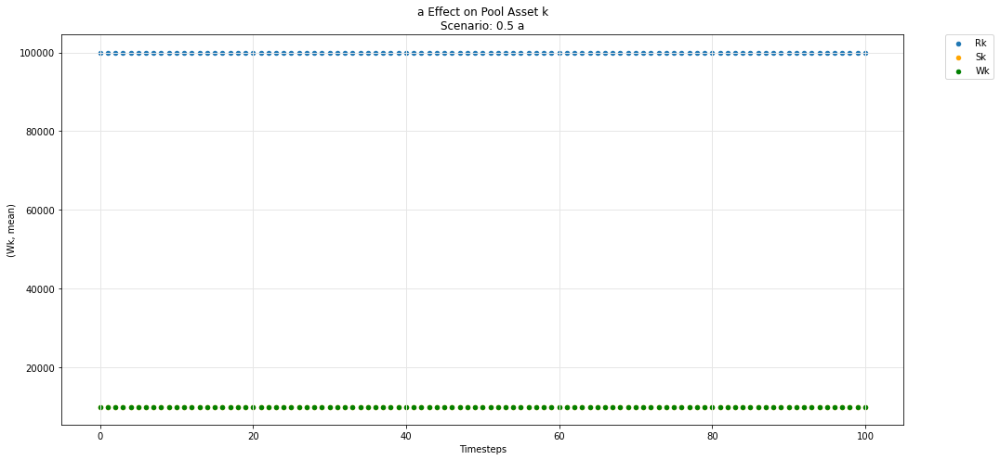

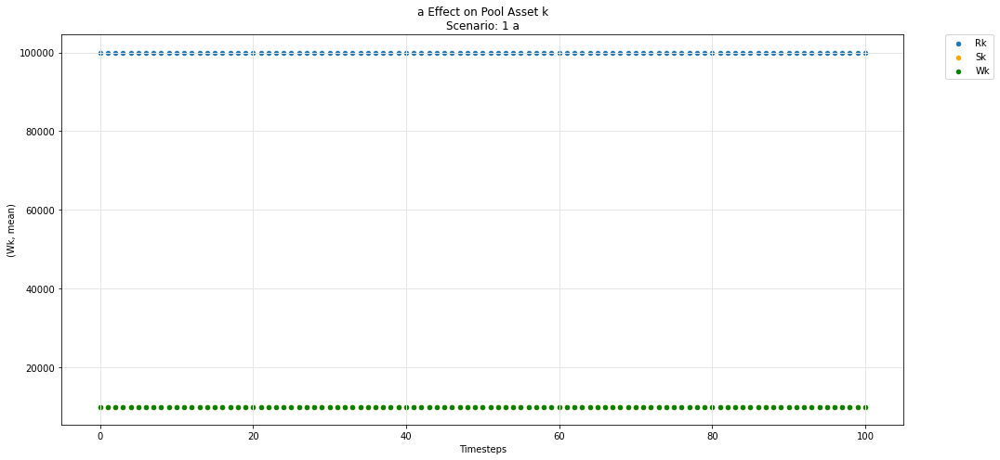

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

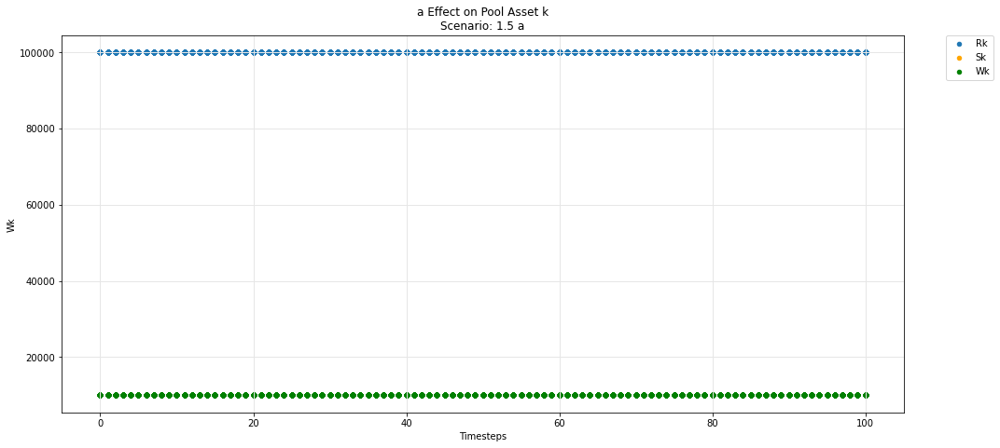

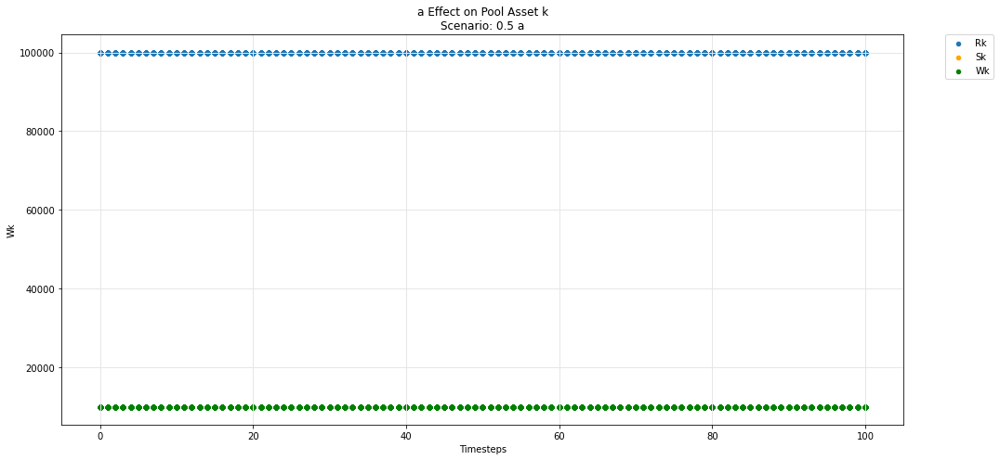

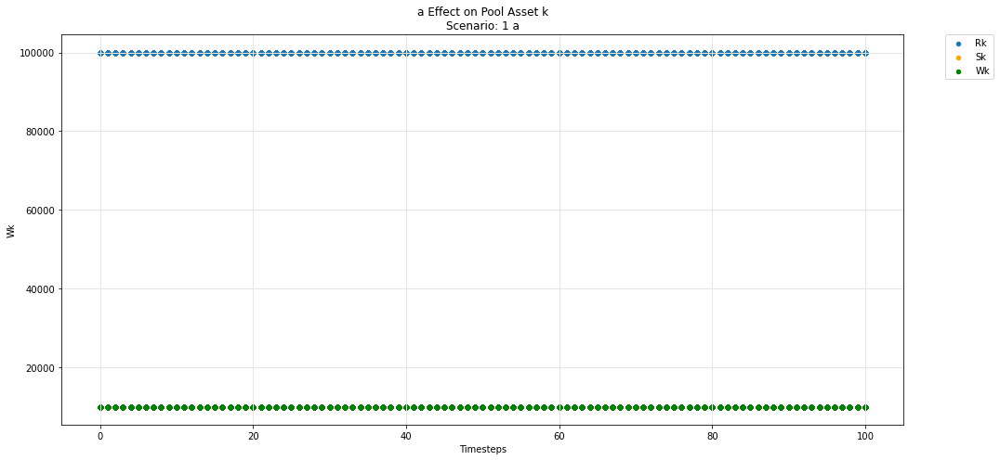

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

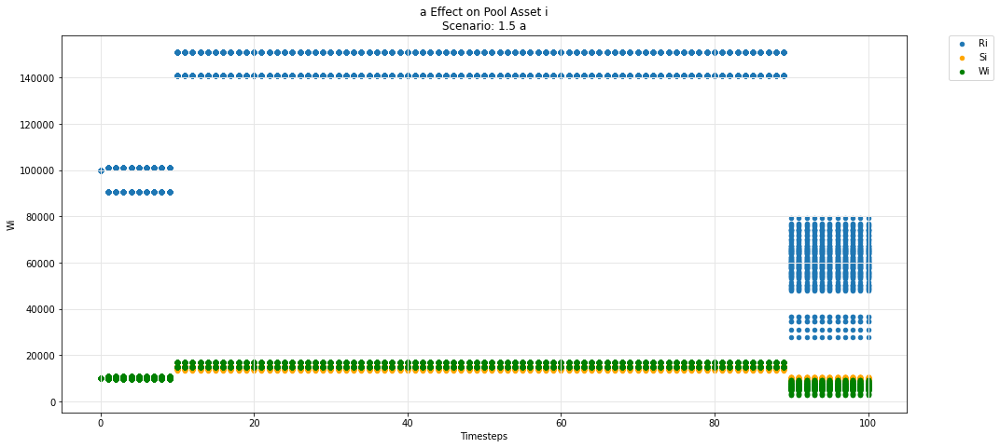

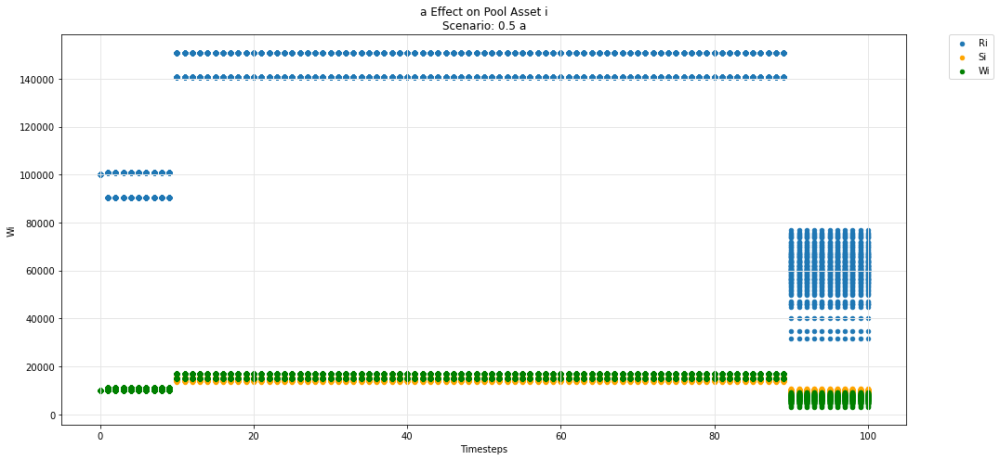

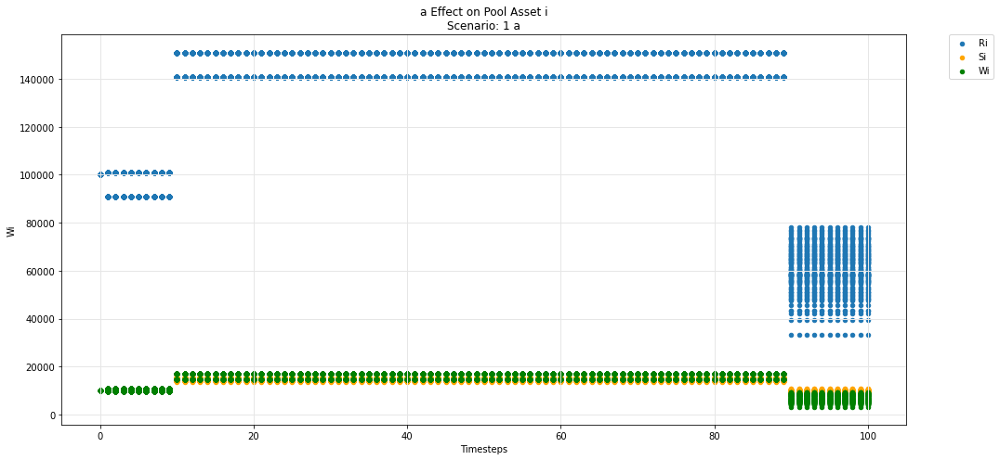

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

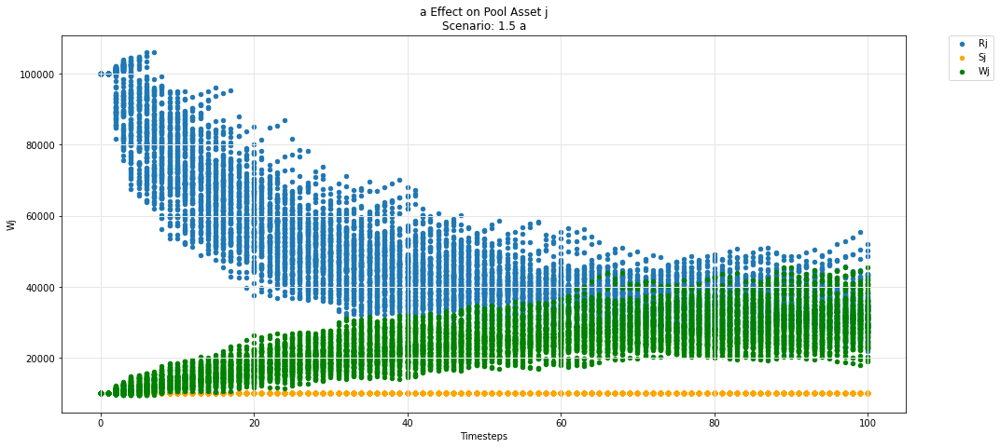

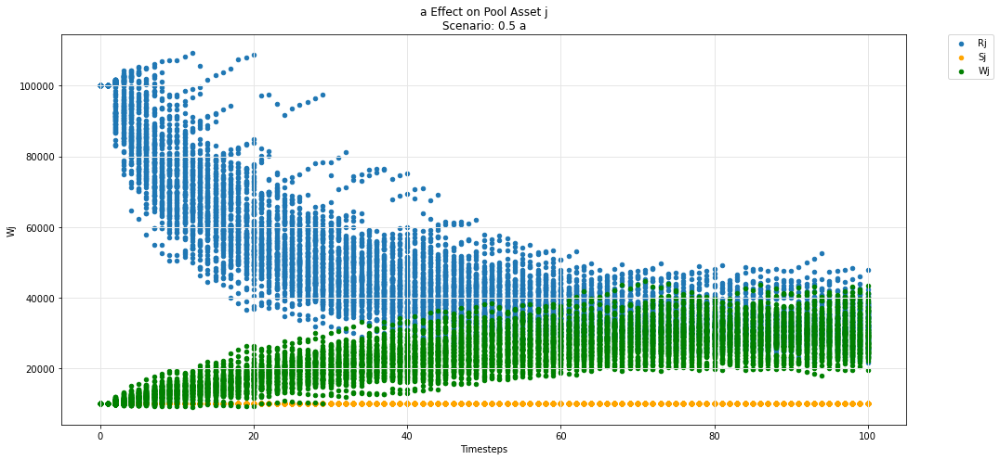

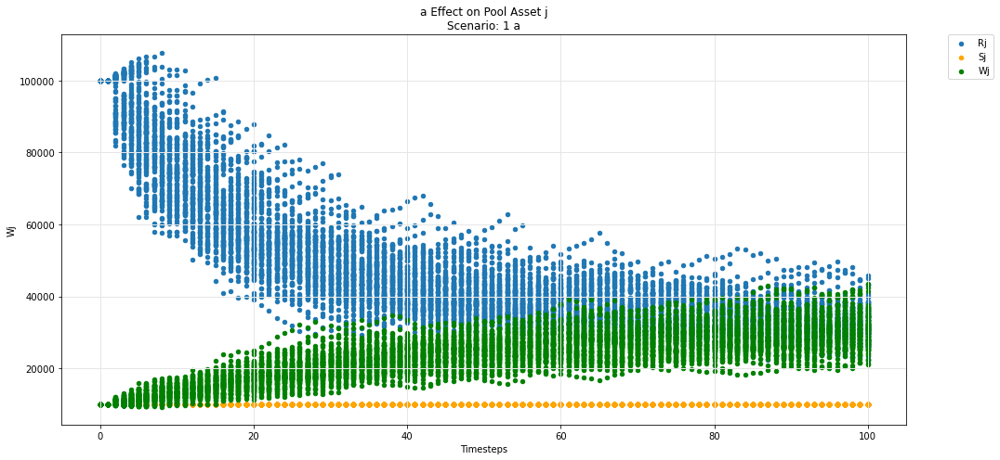

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

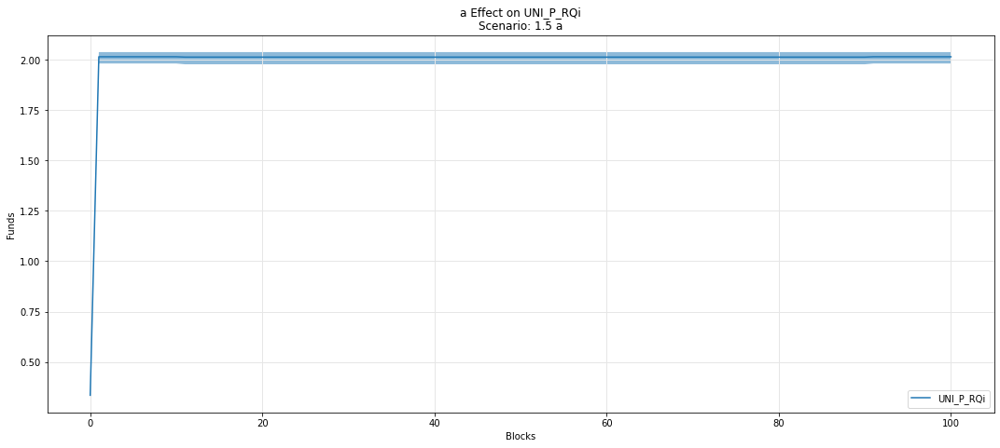

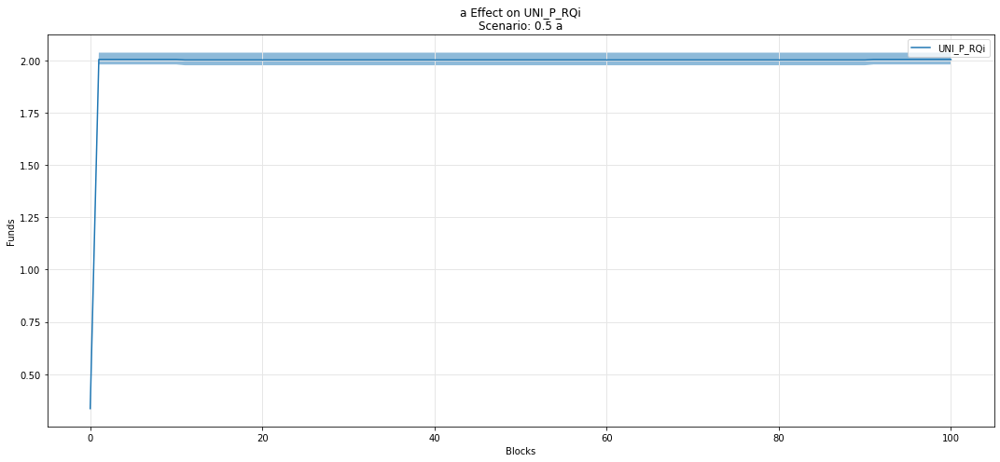

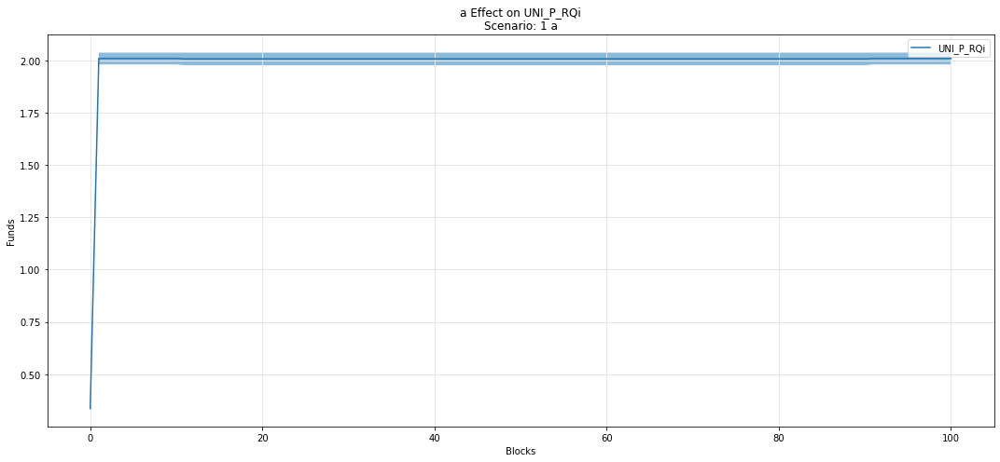

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

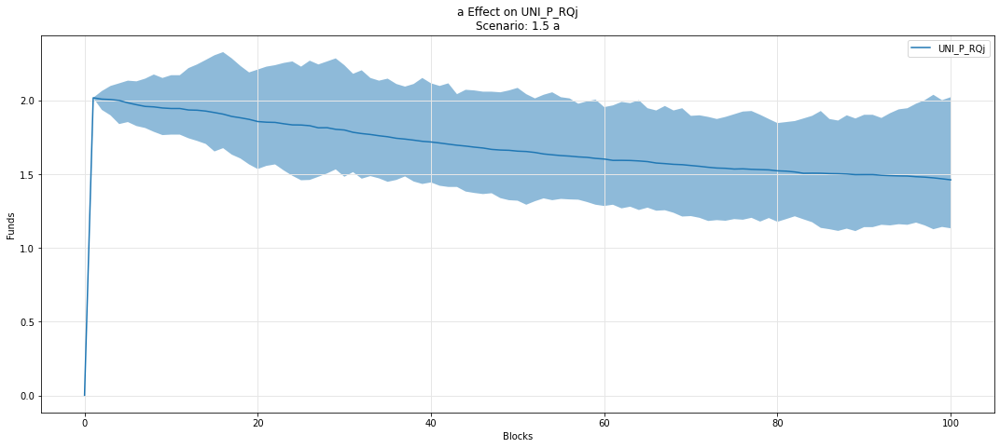

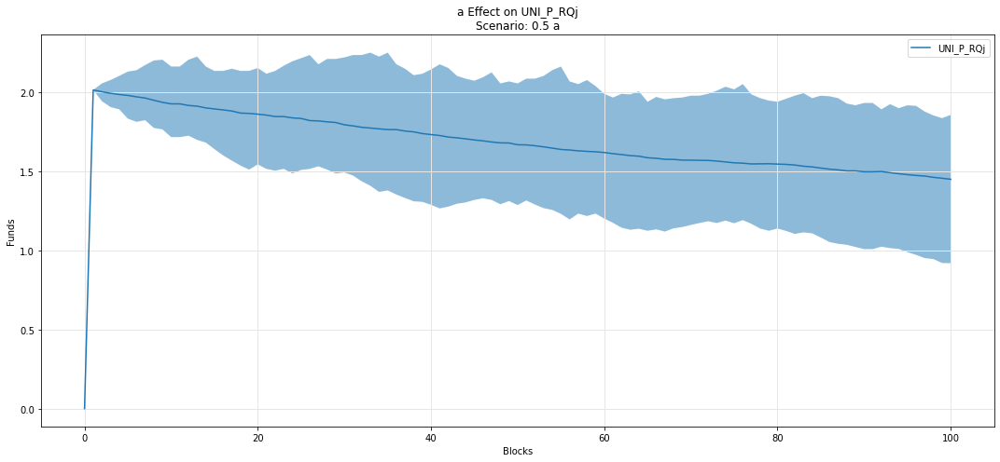

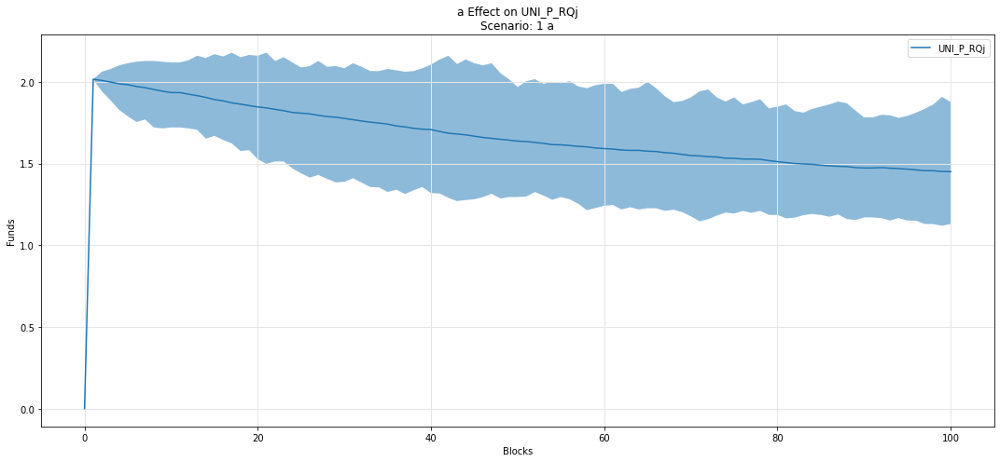

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

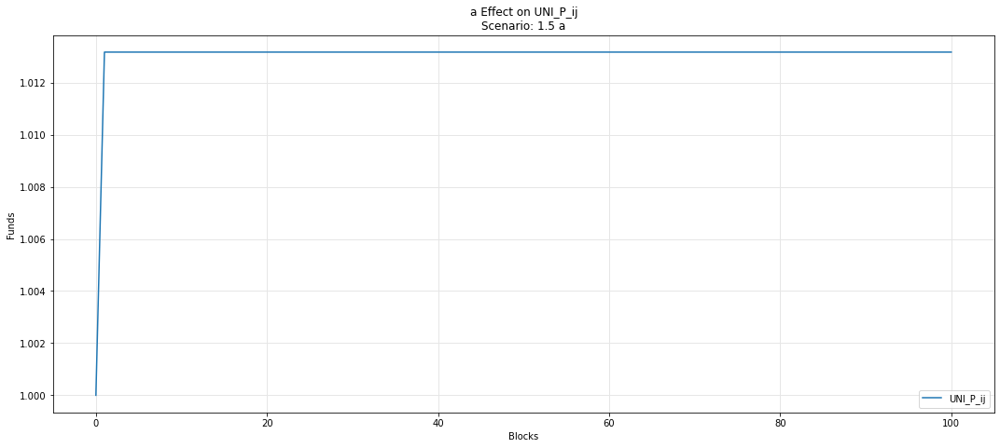

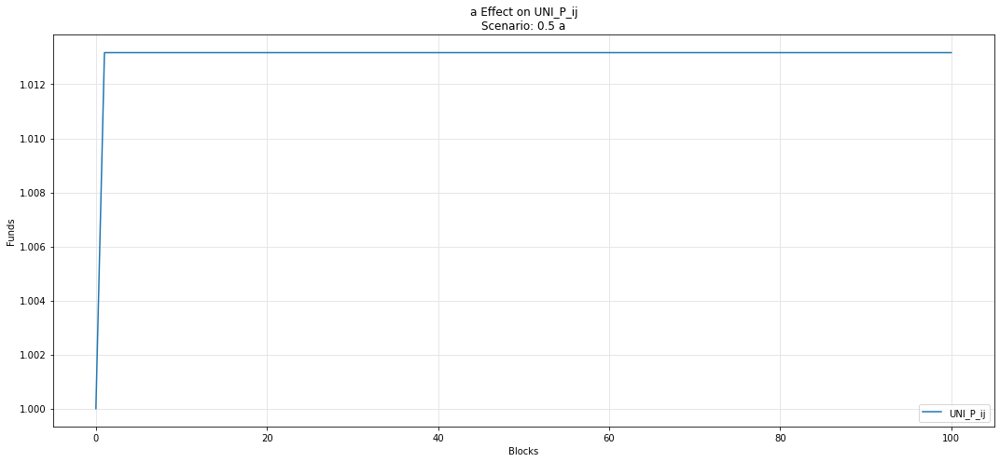

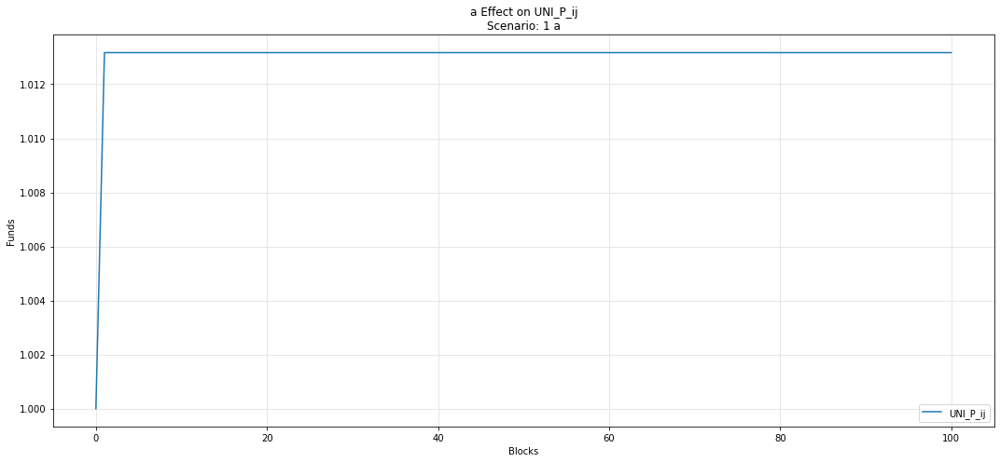

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

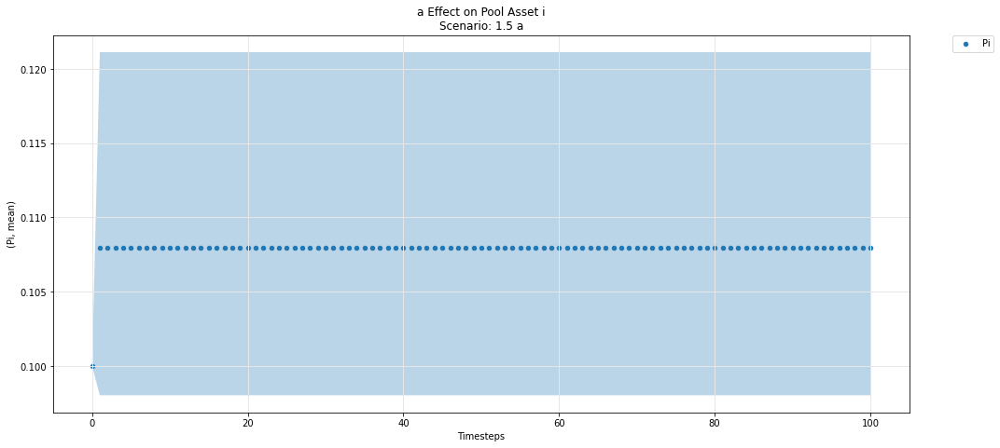

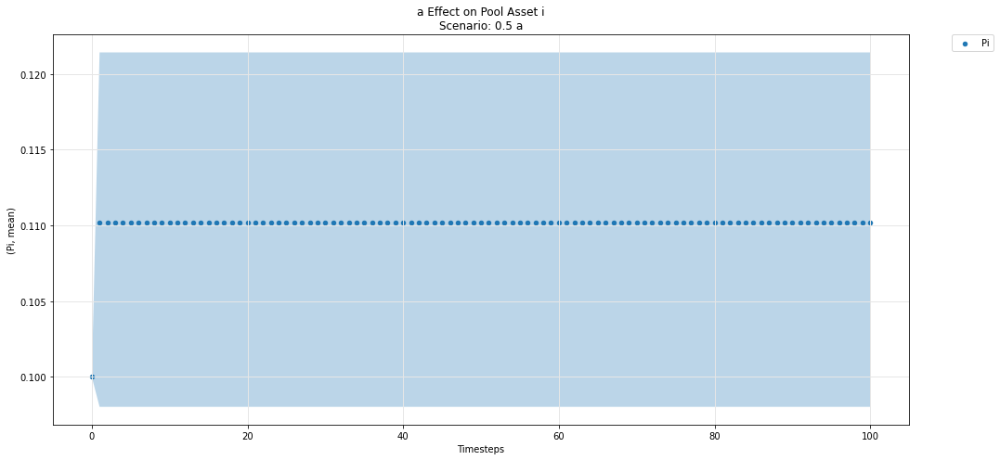

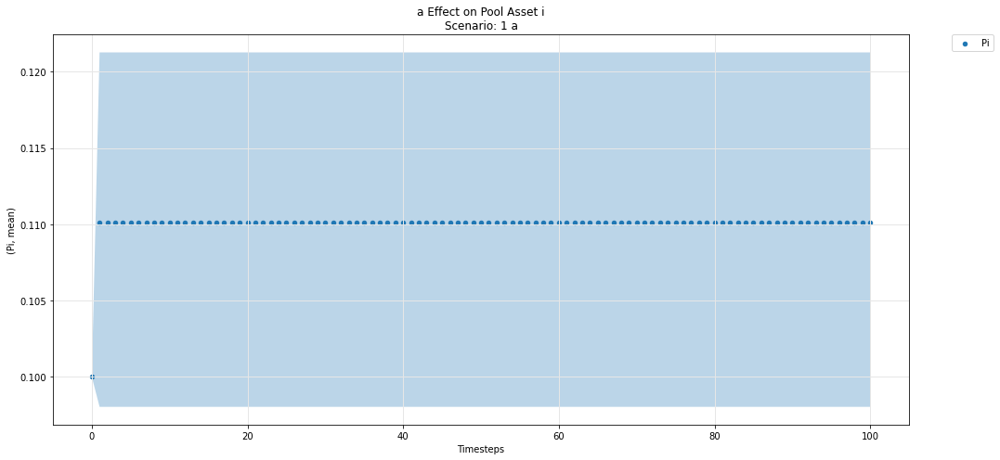

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

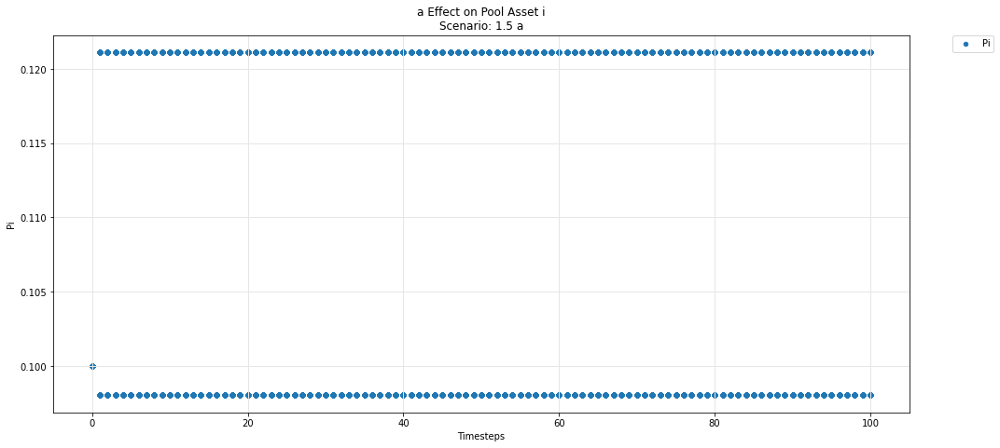

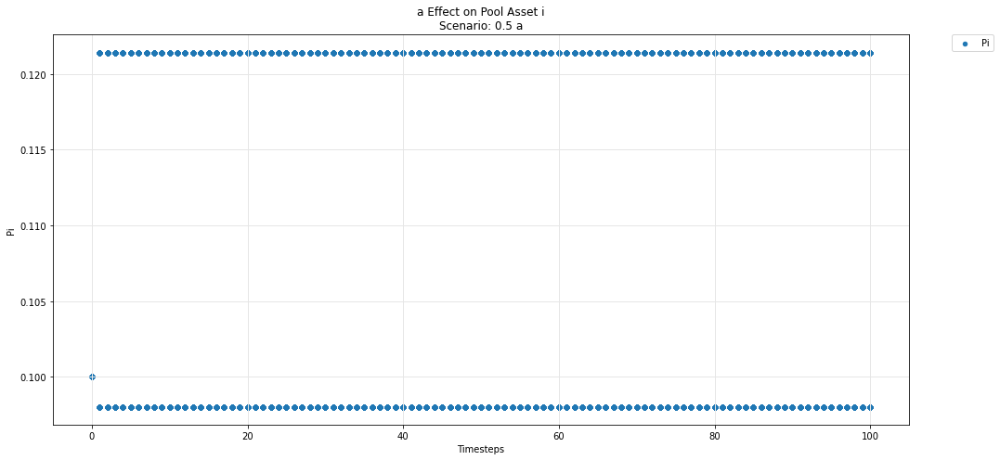

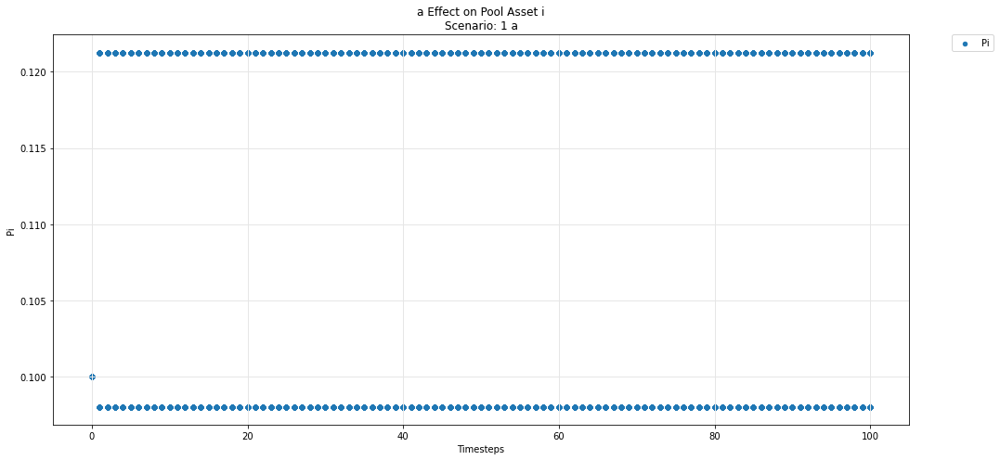

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

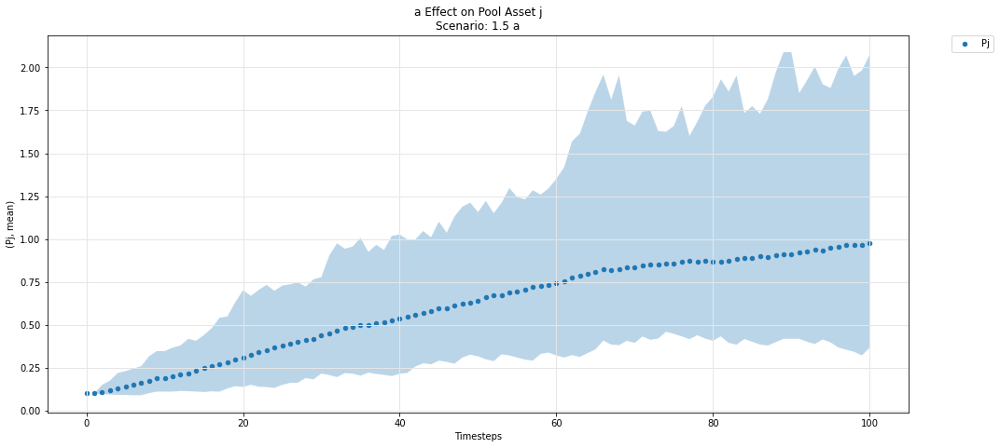

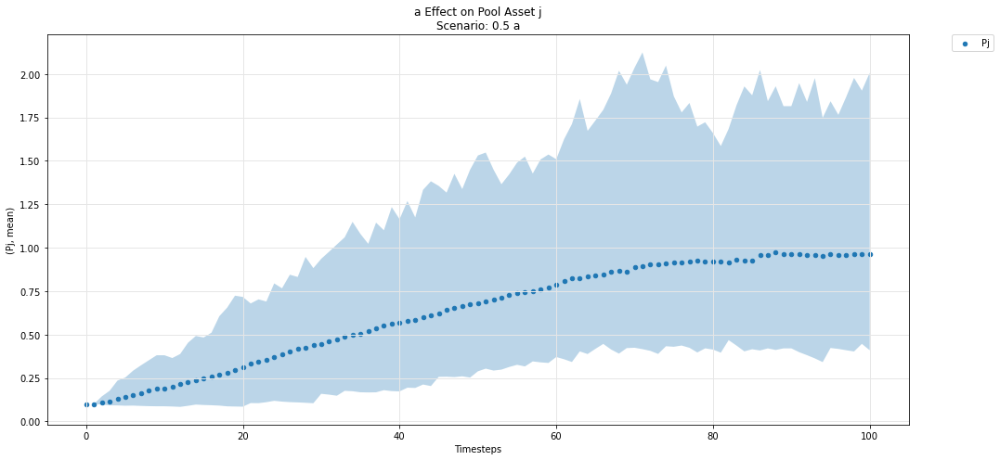

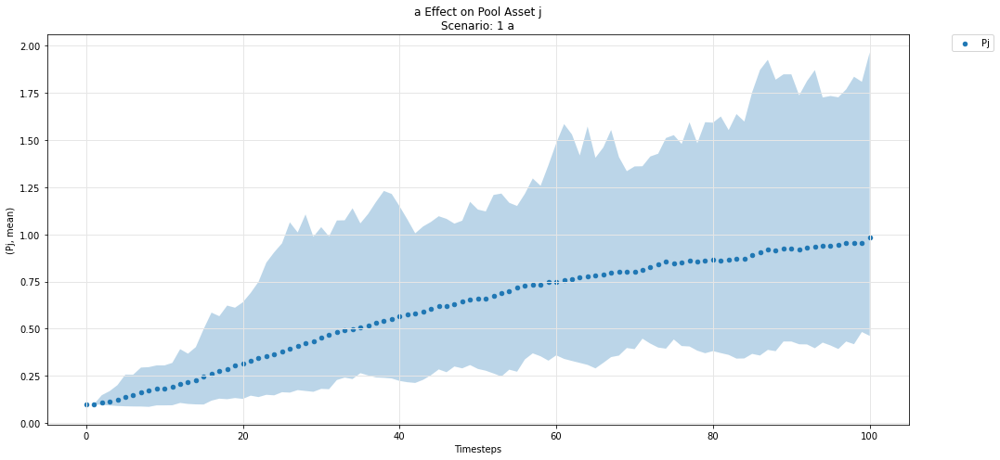

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

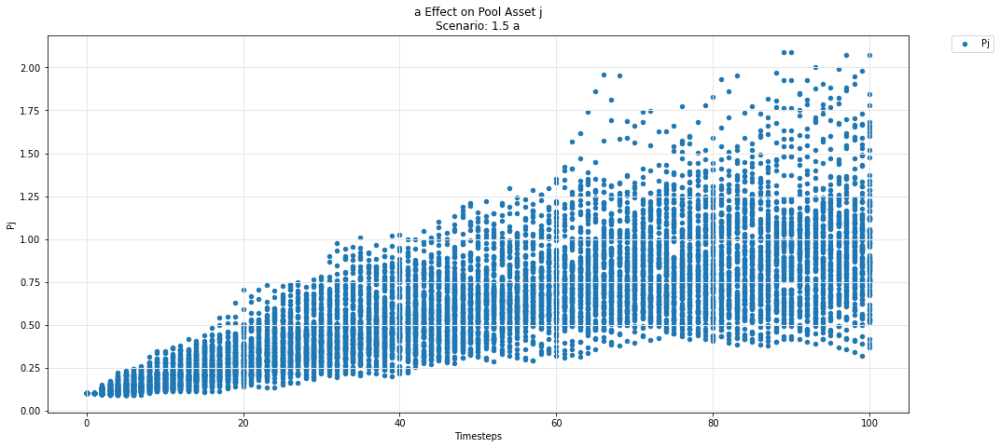

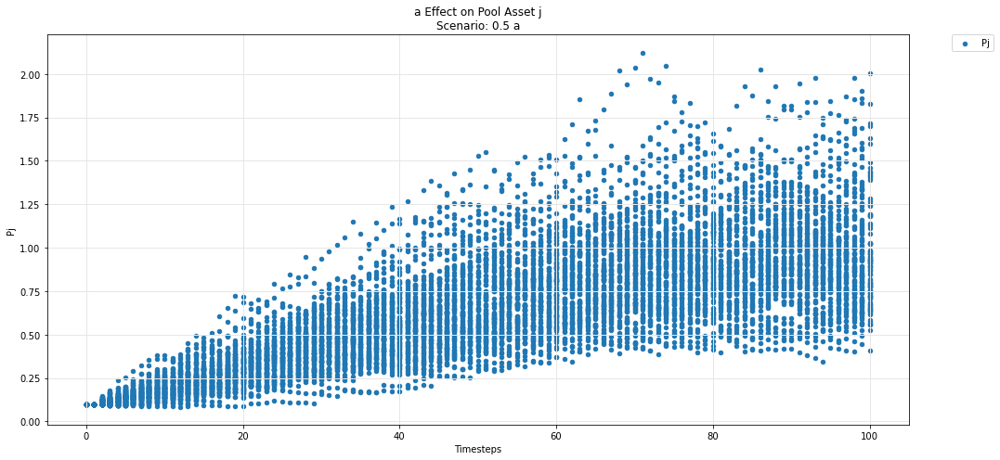

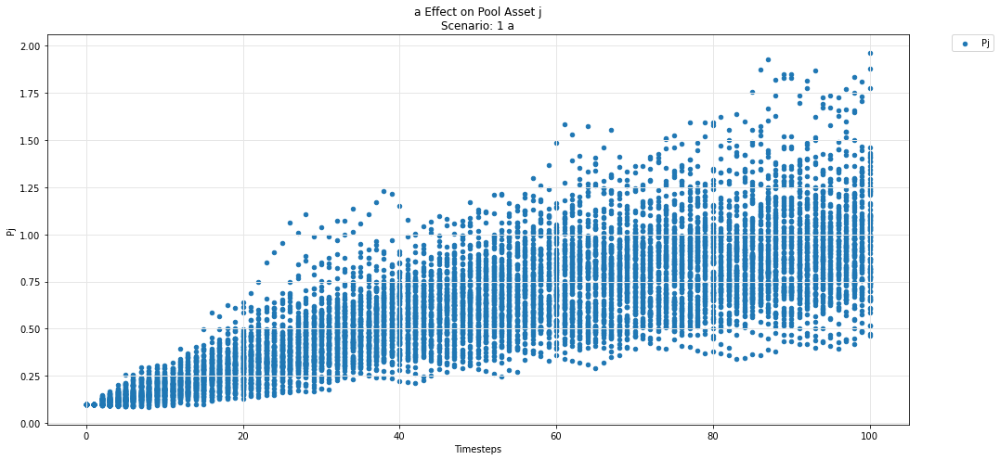

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

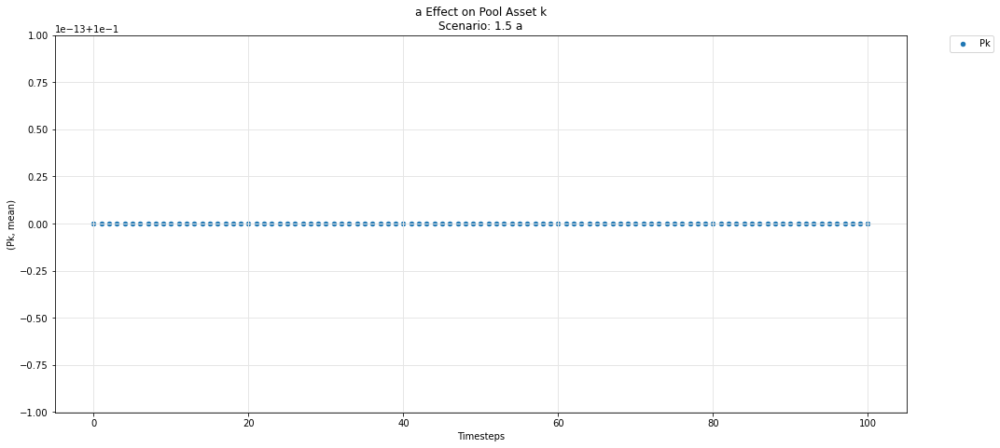

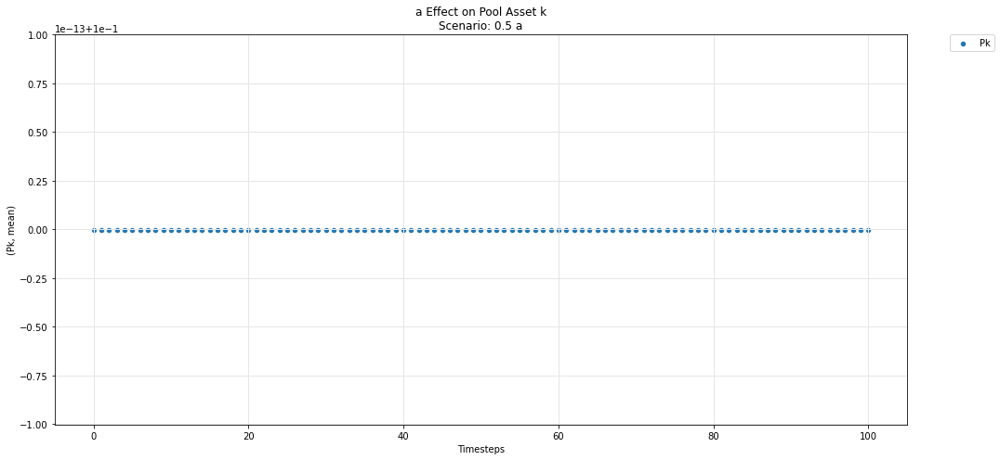

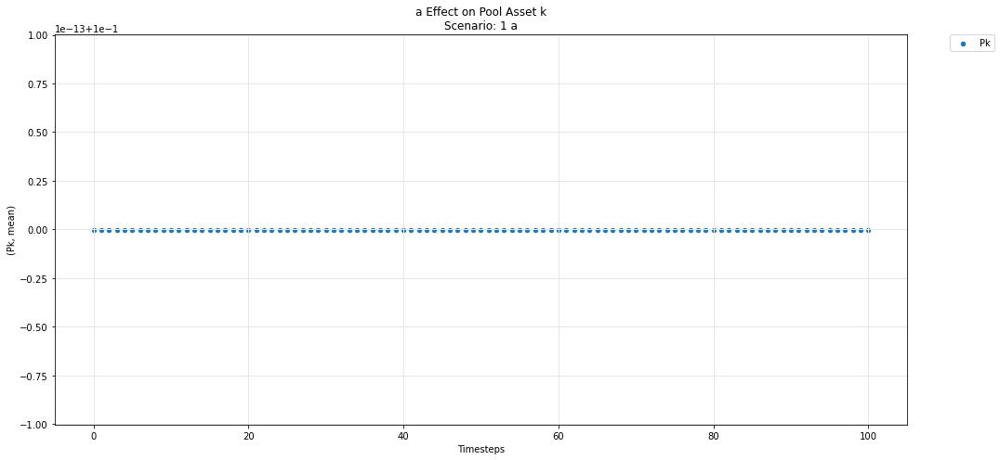

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

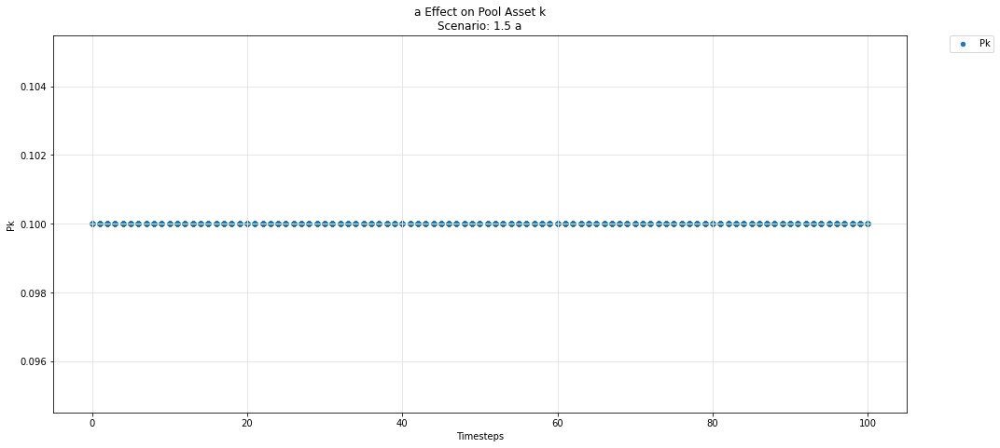

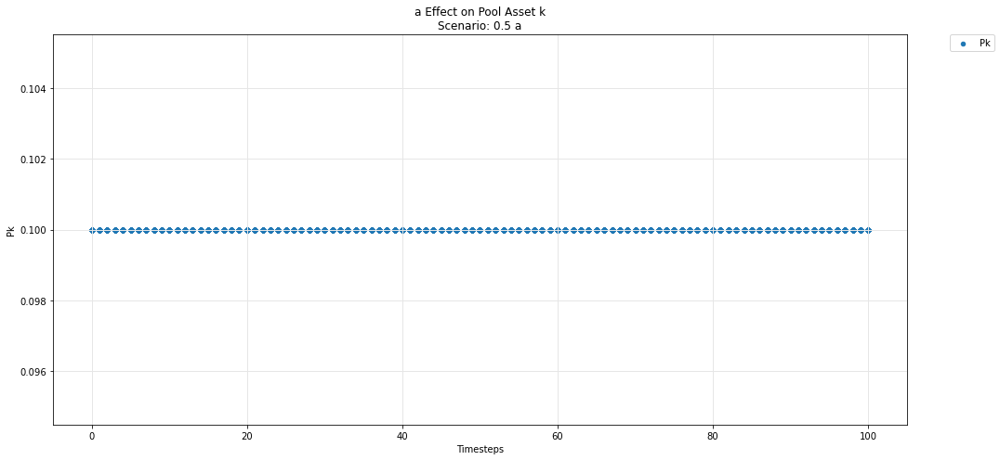

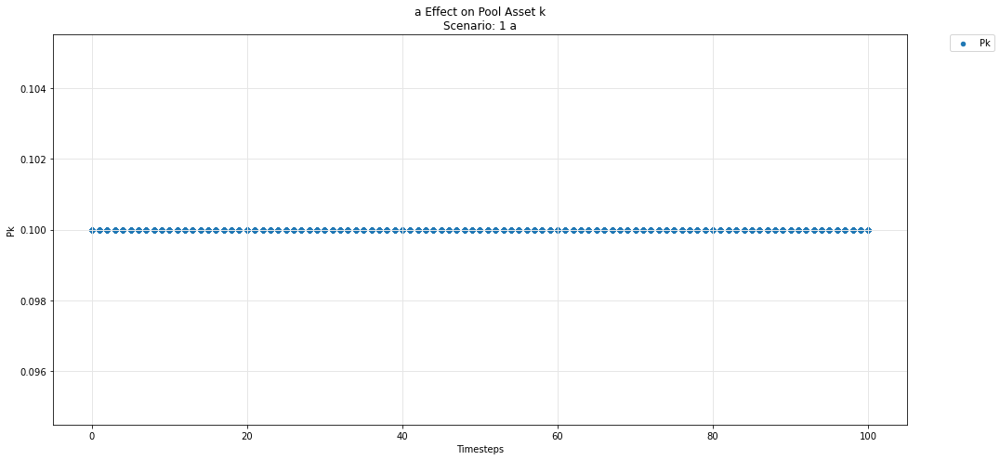

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')